
# <center>Stock Price Prediction Project<center>

### Objective
The primary objective of this project is to predict the next day's closing price of selected stocks using historical stock price data. By leveraging advanced machine learning techniques, including **Linear Regression, Artificial Neural Networks (ANN), Recurrent Neural Networks (RNN), and Long Short-Term Memory (LSTM)** networks, we aim to develop predictive models that can accurately forecast stock prices. This endeavor seeks to explore the effectiveness of these models in the context of financial time series forecasting, providing insights that could potentially aid investors in making informed decisions.

### Background
The stock market is known for its volatility and unpredictability, influenced by numerous factors including economic indicators, company performance, and global events. Traditional stock market analysis techniques involve fundamental and technical analysis, which, while valuable, may not always capture the complex dynamics of market movements. The advent of machine learning and deep learning presents a new avenue for stock market analysis, offering the ability to learn from historical data and predict future trends.

### Data
The dataset comprises historical stock price data for multiple stocks (e.g., INTC, AMD, TSLA, MARA, AMZN) spanning a significant period (`the last 10 years`). This dataset includes daily open, high, low, close prices, and volume, sourced from Yahoo Finance. A crucial preprocessing step involves creating a feature for each stock representing the next day's closing price, serving as the target variable for our predictive models.

### Methodology
1. **Data Collection and Preprocessing**: Collect historical stock price data, followed by data cleaning, normalization, and preparation. This involves handling missing values, normalizing price data to a common scale, and engineering features such as moving averages, price change percentages, and volume changes to better capture market dynamics.

2. **Feature Engineering**: In addition to using raw price and volume data, we will explore the creation of additional features that may aid in prediction. This includes technical indicators like moving averages, volatilities (differences between Open and Close price/ differences between High and Low).

3. **Data Visualization**: Implement data visualization techniques to analyze trends, patterns, and relationships within the data. This will include plotting time series data, volume trends, volatility measurements, and correlation heatmaps among different stocks. Visual analytics will assist in understanding the dataset's characteristics and in making informed decisions during the model development phase.

4. **Model Development**:
    - **Linear Regression**: As a baseline model, linear regression will be applied to predict the next day's closing price based on the current day's features. This simple model will serve as a benchmark for performance comparison.
    
    - **Artificial Neural Networks (ANN)**: We will develop an ANN model to capture nonlinear relationships in the data. ANNs are flexible and capable of modeling complex patterns, making them suitable for stock price prediction.
    
    - **Recurrent Neural Networks (RNN) and Long Short-Term Memory (LSTM) networks**: Given the sequential nature of stock price data, RNNs and LSTMs are particularly suited for this problem. These models will be employed to learn from the temporal dependencies in the data for more accurate predictions.

5. **Evaluation and Comparison**: The models will be evaluated based on their prediction accuracy and performance metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), and Root Mean Squared Error (RMSE). A comparison will be drawn to determine the most effective model(s) for stock price prediction, taking into account both their quantitative performance and their ability to capture the underlying dynamics of the stock market.

    
### Expected Outcome
The project aims to develop a set of predictive models that can reliably forecast the next day's stock closing prices. By comparing the performance of linear regression, ANN, RNN, and LSTM models, we expect to identify the most suitable approach(es) for time series forecasting in the stock market context. This could potentially serve as a tool for investors to complement traditional stock analysis methods.


---

### Import Necessary Dependencies

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder
from xgboost import XGBRegressor as LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt 
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import yfinance as yf
from datetime import date, timedelta
from sklearn.compose import ColumnTransformer

import warnings
warnings.filterwarnings('ignore')


ModuleNotFoundError: No module named 'xgboost'

---
# <center>Data Collection & Preprocessing<center>

In [3]:

# Dates
today = date.today()
end_date = today.strftime("%Y-%m-%d")
start_date = (today - timedelta(days=3704)).strftime("%Y-%m-%d")

# Stock symbols
symbols = ['INTC', 'AMD', 'TSLA', 'MARA', 'AMZN']

# Initialize an empty DataFrame for all stocks
all_stocks_data = pd.DataFrame()

# Download and append data
for symbol in symbols:
    data = yf.download(symbol, start=start_date, end=end_date, progress=False)
    data["Date"] = data.index
    data = data[["Date", "Open", "High", "Low", "Close", "Volume"]]
    data.reset_index(drop=True, inplace=True)
    data['Symbol'] = symbol  # Add a 'Symbol' column
    all_stocks_data = pd.concat([all_stocks_data, data], ignore_index=True)


#Display first 5 rows of the datset
all_stocks_data.head()

,Date,Open,High,Low,Close,Volume,Symbol
0,2014-02-18,24.670000,24.780001,24.549999,24.760000,17738100,INTC
1,2014-02-19,24.650000,24.719999,24.420000,24.500000,25686000,INTC
2,2014-02-20,24.540001,24.850000,24.500000,24.740000,20193800,INTC
3,2014-02-21,24.950001,24.959999,24.350000,24.420000,30579800,INTC
4,2014-02-24,24.510000,24.879999,24.410000,24.629999,24145500,INTC


In [3]:
#Save data in a csv file
all_stocks_data.to_csv('stock_data.csv', index=False)

In [4]:
#Read in data from csv file
all_stocks_data = pd.read_csv('stock_data.csv')
all_stocks_data.head()


,Date,Open,High,Low,Close,Volume,Symbol
0,2014-01-02,25.780001,25.820000,25.469999,25.790001,31833300,INTC
1,2014-01-03,25.860001,25.900000,25.600000,25.780001,27796700,INTC
2,2014-01-06,25.770000,25.790001,25.450001,25.459999,28682300,INTC
3,2014-01-07,25.540001,25.730000,25.469999,25.590000,19665100,INTC
4,2014-01-08,25.639999,25.709999,25.299999,25.430000,29680500,INTC


In [42]:
                    #Including 'Next Day Close' to each sample
    
# Unique stock symbols
symbols = all_stocks_data['Symbol'].unique()

# Initialize an empty DataFrame to hold the processed data
processed_data = pd.DataFrame()

for symbol in symbols:
    # Subset the dataset for the current stock symbol
    data = all_stocks_data[all_stocks_data['Symbol'] == symbol].copy()
    
    # Sort the data by date in ascending order
    data.sort_values(by='Date', inplace=True)

    # Shift the 'Close' column by one day to get the next day's closing price
    data['Next Day Close (Target)'] = data['Close'].shift(-1)

    # Drop the last row since the next day's closing price for the last day is NaN
    data.dropna(subset=['Next Day Close (Target)'], inplace=True)

    # Concatenate the processed data for this stock with the overall processed dataset
    processed_data = pd.concat([processed_data, data], ignore_index=True)

# Reset the index of the final processed dataset (though this might be redundant due to the use of ignore_index=True in concat)
processed_data.reset_index(drop=True, inplace=True)

# Now 'processed_data' contains the dataset with the 'Next Day Close' column for all stocks
data = processed_data.copy()
data 

,Date,Open,High,Low,Close,Volume,Symbol,Next Day Close (Target)
0,2014-01-02,25.780001,25.820000,25.469999,25.790001,31833300,INTC,25.780001
1,2014-01-03,25.860001,25.900000,25.600000,25.780001,27796700,INTC,25.459999
2,2014-01-06,25.770000,25.790001,25.450001,25.459999,28682300,INTC,25.590000
3,2014-01-07,25.540001,25.730000,25.469999,25.590000,19665100,INTC,25.430000
4,2014-01-08,25.639999,25.709999,25.299999,25.430000,29680500,INTC,25.309999
...,...,...,...,...,...,...,...,...
12745,2024-02-13,167.729996,170.949997,165.750000,168.639999,56345100,AMZN,170.979996
12746,2024-02-14,169.210007,171.210007,168.279999,170.979996,42815500,AMZN,169.800003
12747,2024-02-15,170.580002,171.169998,167.589996,169.800003,49855200,AMZN,169.509995
12748,2024-02-16,168.740005,170.419998,167.169998,169.509995,48074600,AMZN,167.080002


---
# <center>Feature Engineering<center>

### Feature Insights

1. **High minus Low price (H-L):**
   - This feature quantifies the intraday volatility of a stock, indicating the range of price movement within a single trading day. A larger range (H-L value) suggests higher volatility, reflecting significant investor interest or reactions to external events. Understanding volatility patterns can aid in identifying key trading opportunities or risk assessment.

2. **Open minus Close price (O-C):**
   - This metric measures the net change in stock price from the opening to the closing of the trading day. Negative values indicate a stock closing higher than its opening price (bullish sentiment), whereas positive values suggest a closing price lower than the opening (bearish sentiment). This feature offers insights into daily market sentiment and price momentum.

3. **Seven-day moving average (7 DAYS MA):**
   - The seven-day moving average smooths daily price changes to highlight the short-term trend direction. It averages the closing prices over the past week, mitigating short-term price volatility and revealing whether the stock is on an upward or downward trajectory. This indicator is vital for spotting trends and guiding trading or investment decisions based on recent price movements.

4. **Day of The Week**: Understanding the day of the week can help analyze weekly patterns in stock price movements. Some stocks may show certain trends on specific days due to recurring market activities or investor behaviors.


5. **Month of The Year**: Similar to the day of the week, analyzing stock performance by month can reveal seasonal patterns or trends related to fiscal quarters, earnings reports, or other cyclical factors.

In [43]:
# 1. Stock High minus Low price (H-L)
data['H-L'] = data['High'] - data['Low']

# 2. Stock Close minus Open price (O-C)
data['O-C'] = data['Open'] - data['Close']

# 3. Day Of The Week
data['Date'] = pd.to_datetime(data['Date'])  # Convert 'Date' to datetime format 
# Create a new column for the day of the week
data['DayOfWeek'] = data['Date'].dt.day_name()

# 4. Month of The Year
data['Month'] = data['Date'].dt.strftime('%B')

# 5. Stock price’s seven days’ moving average (7 DAYS MA)
##Group the DataFrame by 'Symbol' and then apply the rolling mean calculation to each group
data['7 DAYS MA'] = data.groupby('Symbol')['Close'].transform(lambda x: x.rolling(window=7).mean())


In [44]:
data.head(10)

,Date,Open,High,Low,Close,Volume,Symbol,Next Day Close (Target),H-L,O-C,DayOfWeek,Month,7 DAYS MA
0,2014-01-02,25.780001,25.820000,25.469999,25.790001,31833300,INTC,25.780001,0.350000,-0.010000,Thursday,January,NaN
1,2014-01-03,25.860001,25.900000,25.600000,25.780001,27796700,INTC,25.459999,0.299999,0.080000,Friday,January,NaN
2,2014-01-06,25.770000,25.790001,25.450001,25.459999,28682300,INTC,25.590000,0.340000,0.310001,Monday,January,NaN
3,2014-01-07,25.540001,25.730000,25.469999,25.590000,19665100,INTC,25.430000,0.260000,-0.049999,Tuesday,January,NaN
4,2014-01-08,25.639999,25.709999,25.299999,25.430000,29680500,INTC,25.309999,0.410000,0.209999,Wednesday,January,NaN
5,2014-01-09,25.420000,25.549999,25.250000,25.309999,20878000,INTC,25.530001,0.299999,0.110001,Thursday,January,NaN
6,2014-01-10,25.500000,25.850000,25.500000,25.530001,30588800,INTC,25.500000,0.350000,-0.030001,Friday,January,25.555714
7,2014-01-13,25.629999,25.990000,25.420000,25.500000,40274500,INTC,26.510000,0.570000,0.129999,Monday,January,25.514286
8,2014-01-14,26.010000,26.549999,25.900000,26.510000,74142900,INTC,26.670000,0.650000,-0.500000,Tuesday,January,25.618571
9,2014-01-15,26.719999,27.120001,26.610001,26.670000,58277700,INTC,26.540001,0.510000,0.049999,Wednesday,January,25.791429


#### Dropping off rows with Nan Values in '7 DAYS MA'

When calculating the seven-day moving average for each stock, the first six days do not have sufficient prior data points to compute a valid average, resulting in NaN (Not a Number) values for these initial rows. Dropping these rows is necessary because they contain incomplete information for the calculated feature, making them unsuitable for training predictive models. By removing these rows, we ensure that the dataset only includes entries with fully computed features, thereby enhancing the quality and reliability of the data used for modeling. This step is crucial for maintaining the integrity of our analysis, allowing for more accurate and meaningful predictions of stock price movements based on complete and well-defined input features.

In [45]:
#drop rows with Nan (missing values) in 7 DAYS MA
data = data.dropna(axis=0)

#check if there are still missing values in the dataset
data.isna().sum()

Date                       0
Open                       0
High                       0
Low                        0
Close                      0
Volume                     0
Symbol                     0
Next Day Close (Target)    0
H-L                        0
O-C                        0
DayOfWeek                  0
Month                      0
7 DAYS MA                  0
dtype: int64

---
# <center>Exploratory Data Analysis (EDA)<center>
    
    
### Movement of Stocks Over Time

In [46]:

# Ensure 'Date' is in datetime format 
data['Date'] = pd.to_datetime(data['Date'])

# Create an interactive line plot
fig = px.line(data, 
              x='Date', 
              y='Close', 
              color='Symbol', 
              title='Closing Prices of Stocks Over Time',
              labels={'Close': 'Closing Price', 'Date': 'Date'})



# Improve layout
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Closing Price',
                  legend_title='Stock Symbol')

# Show plot
fig.show()


The observed trends from the time series plot of closing prices over the past decade highlight the diverse trajectories individual stocks can take based on a multitude of factors including industry growth, company performance, and broader economic conditions. Stocks like `TSLA (Tesla), AMZN (Amazon), and AMD (Advanced Micro Devices)` have shown remarkable growth, reflecting their successful adaptation to market demands, innovative product offerings, and strong positioning within their respective industries. This growth may also indicate investor confidence in these companies' future prospects and their ability to capitalize on emerging trends such as electric vehicles, e-commerce, and semiconductor technology.

On the other hand, `MARA (Marathon Digital Holdings)`, which is known for its digital asset technology, experienced less consistent growth, potentially due to the volatile nature of the cryptocurrency market and regulatory uncertainties. This illustrates how companies tied to nascent or highly speculative sectors may face more pronounced fluctuations and risk factors.

`INTC (Intel Corporation)` exhibits relatively stable performance with less dramatic changes over the years, possibly reflecting its established position in the semiconductor industry. However, this stability could also suggest that the company faces challenges in achieving high growth rates amidst stiff competition and rapid technological advancements in its sector.

These observations underscore the importance of considering industry-specific trends, company fundamentals, and macroeconomic factors when analyzing stock performance. They also highlight the potential rewards of investing in companies with strong growth prospects and the risks associated with sectors that are more susceptible to market volatility and regulatory changes.


---
### Daily Volatility (Open - Close) for Each Stock

In [47]:
# Create the line plot and specify the custom hover text
fig = px.line(data, x='Date', y='O-C', color='Symbol', title='Daily Volatility (Open - Close) for Each Stock',
              hover_data={'DayOfWeek': True}, 
              text='DayOfWeek')  # Use the custom hover text

# Update traces to display the custom hover text
fig.update_traces(mode='lines', hoverinfo='text', line=dict(width=2))

# Unified hover mode for a cleaner interface
fig.update_layout(hovermode='x unified')

fig.update_layout(
    hoverlabel=dict(
        bgcolor='rgba(255,255,255,0.5)',
        font_size=8.5,  
        font_color="black"  
    )
)


fig.show()


The Open-Close (O-C) volatility plot provides a nuanced view into the daily performance dynamics of selected stocks, including MARA, TSLA, AMZN, AMD, and INTC, over a span of 10 years. This visualization reveals intriguing patterns and trends in intraday price movements, offering insights into each stock's volatility and market sentiment. Here's a deeper dive into the observed behaviors:

1. **Early Volatility vs. Recent Stability in MARA:** MARA stands out for its pronounced volatility in the early years (2014-2018), characterized by significant daily price swings. This period likely reflects the stock's sensitivity to market trends, technological advancements, or regulatory news affecting its underlying value. Interestingly, this volatility appears to have dampened in more recent years, suggesting a possible stabilization in the company's market position or investor perceptions.

2. **TESLA's Ascending Volatility:** In contrast, TESLA exhibited a relatively calm price movement pattern in earlier years, which shifted dramatically towards increased volatility in recent years. This change is indicative of TESLA's growing impact on the market, possibly driven by significant company milestones, advancements in electric vehicle technology, or Elon Musk's influential market presence. The massive spikes in recent years underscore TESLA's heightened investor attention and speculative trading.

3. **Moderate Volatility in AMZN and AMD:** AMZN and AMD also displayed volatility in their daily price movements, with notable spikes in recent years. While not as pronounced as TESLA's, these fluctuations reflect the companies' ongoing innovations, market expansions, and the tech sector's overall volatility. Their movements capture investor reactions to earnings reports, product launches, and sector-wide trends.

4. **Steady Performance of INTC:** INTC presents a stark contrast to the other stocks, showcasing minimal daily volatility across the years. This steadiness suggests a mature, stable market position with less susceptibility to the rapid shifts affecting the tech industry more broadly. INTC's consistent performance might be preferred by investors seeking less risky assets.

The interactive O-C volatility plot, with its detailed examination of daily price movements, not only highlights the unique market behaviors of these stocks but also offers investors and analysts a tool for identifying patterns of volatility, stability, and market reactions over time. The insights gleaned from this visualization can inform strategies aimed at navigating the complexities of the stock market, balancing portfolios, and capitalizing on the underlying opportunities presented by each stock's unique trajectory.


---
### Daily Volatility (High - Low) for Each Stock

In [49]:
# Create the line plot and specify the custom hover text
fig = px.line(data, x='Date', y='H-L', color='Symbol', title='Daily Volatility (High - Low) for Each Stock',
              hover_data={'DayOfWeek': True}, 
              text='DayOfWeek')  # Use the custom hover text

# Update traces to display the custom hover text
fig.update_traces(mode='lines', hoverinfo='text', line=dict(width=2))

# Unified hover mode for a cleaner interface
fig.update_layout(hovermode='x unified')

fig.update_layout(
    hoverlabel=dict(
        bgcolor='rgba(255,255,255,0.5)',
        font_size=8.5,  
        font_color="black"  
    )
)


fig.show()


The volatility plot, showcasing the high-low price difference (H-L) for stocks like TSLA, AMD, AMZN, MARA, and INTC, gives us a clear picture of how different stocks react to market changes. Here's a simpler breakdown of what we observed:

1. **Market Reactivity:** Tesla, AMD, and Amazon stand out because they've shown significant ups and downs, especially in recent years. This tells us they're highly reactive to market news, technological advancements, or changes in consumer behavior. It's like they're on a roller coaster, with every turn of the market sending them up or down dramatically.

2. **MARA's Unique Pattern:** MARA had its moment in the spotlight from 2014 to 2018, with quite a bit of volatility. But after that period, it seems to have calmed down. This could mean that the factors causing the earlier volatility have stabilized or changed.

3. **INTC's Stability:** On the other hand, INTC has been much more stable over the years. It's like a calm sea compared to the stormy waters of the other stocks. This suggests that INTC might be less affected by sudden market changes, making it potentially a safer bet for those who prefer less risk.

4. **Growth and Decline Phases:** The periods of high volatility for Tesla, AMD, and Amazon, particularly Tesla's spike between 2020 and 2022, show how specific events or periods can lead to rapid growth. However, the lack of recent spikes for MARA indicates a phase of stabilization or decline, which might change how investors view these stocks.

5. **Visual Insights:** This plot visually represents the heartbeat of the market for these stocks. The big swings tell us about the dynamic and sometimes unpredictable nature of the stock market, offering valuable insights for investors and analysts alike.

In essence, this plot does more than just show numbers; it tells the story of each stock's journey through the market's ups and downs. It highlights the importance of keeping an eye on market trends and understanding the factors that might influence stock prices. Whether you're drawn to the thrill of the highs and lows with stocks like Tesla or prefer the steady course with INTC, understanding volatility is key to navigating the stock market waters.


---
### Trading Volume and Closing Prices Over Time

In [50]:
symbols = data['Symbol'].unique()

# Determine the number of rows for subplots based on the number of stocks
num_stocks = len(symbols)
fig = make_subplots(rows=num_stocks, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.04, subplot_titles=symbols, 
                    specs=[[{"secondary_y": True}] for _ in range(num_stocks)])

# Loop through each stock and create a subplot
for i, symbol in enumerate(symbols, start=1):
    stock_data = data[data['Symbol'] == symbol]
    
    # Add volume bar chart with solid color for better visibility
    fig.add_trace(
        go.Bar(x=stock_data['Date'], y=stock_data['Volume'], name="Volume", marker=dict(color='rgb(50, 171, 96)')),
        row=i, col=1, secondary_y=False
    )
    
    # Add closing price line chart
    fig.add_trace(
        go.Scatter(x=stock_data['Date'], y=stock_data['Close'], name="Closing Price"),
        row=i, col=1, secondary_y=True
    )

# Update layout with a white background for better contrast
fig.update_layout(height=300*num_stocks, title=dict(
        text="Trading Volume and Closing Prices Over Time",
        font=dict(
            color="white" 
        )
    ), 
    showlegend=False, template="plotly_white", paper_bgcolor='black', plot_bgcolor='black')


# Set x-axis and y-axes titles
fig.update_xaxes(title_text="Date", row=num_stocks, col=1)
fig.update_yaxes(title_text="<b>Volume</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Closing Price</b>", secondary_y=True)

fig.show()


The analysis of trading volume alongside closing prices over time for each stock reveals a notable trend: higher trading volumes tend to coincide with periods of underperformance in the stock prices. This observation suggests that significant increases in trading activity might not always signal bullish sentiment but could also indicate selling pressure or market volatility that results in price declines.

Several factors could contribute to this pattern. For instance, large volume spikes are often associated with news events, earnings reports, or market-wide shocks, which can lead to increased uncertainty and trigger sell-offs. Furthermore, institutional trading, which accounts for a substantial portion of daily trading volume, might also play a role. Large blocks of shares being sold can drive the price down, especially in cases where the market cannot absorb the selling pressure without moving the price.

This insight challenges the conventional wisdom that equates high trading volumes with positive price momentum. Instead, it underscores the importance of context and the need to analyze volume in conjunction with other market indicators and news sources. Investors might consider using volume as a contrarian indicator in some cases, especially when unusually high volumes are not accompanied by positive price movements.

Understanding these dynamics can provide investors with a more nuanced approach to interpreting market signals, potentially aiding in the identification of overreaction opportunities or moments to exercise caution.


---
### Correlation Heatmap of Stock Closing Prices

In [51]:
import plotly.graph_objects as go

# Pivot the DataFrame
pivot_df = data.pivot(index='Date', columns='Symbol', values='Close')

#Calculate the Correlation Matrix
correlation_matrix = pivot_df.corr()

# Create the heatmap
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='Viridis', 
    colorbar_title='Correlation'
))

# Update the layout
fig.update_layout(
    title='Correlation Heatmap of Stock Closing Prices',
    xaxis_title='Stock Symbol',
    yaxis_title='Stock Symbol',
    title_x=0.5, # Center the title
)

# To change the color of the title text
fig.update_layout(title_font=dict(color='blue')) 
fig.show()


The correlation matrix for the closing prices of AMD, AMZN, INTC, MARA, and TSLA stocks reveals intriguing insights into how these stocks' movements are interrelated, which could be highly beneficial for portfolio diversification and risk management strategies. Here's an inference based on the correlation coefficients presented:

1. **High Positive Correlation between AMD and TSLA:** With a correlation coefficient of 0.92, AMD and TSLA exhibit a very strong positive correlation, suggesting that their stock prices tend to move in the same direction. This pattern indicates that market factors affecting one are likely to have a similar impact on the other. Investors holding or considering these stocks should be aware of their potential for co-movement, which could amplify risks or opportunities in a portfolio.

2. **Strong Relationship between Tech Stocks:** The correlation between AMD and AMZN (0.89) is also notably high, reinforcing the trend that tech-related stocks often move in tandem, possibly due to shared market sensitivities or technological advancements affecting the sector as a whole. This suggests that portfolios heavily invested in tech stocks might experience less diversification benefits within the sector but could leverage these correlations for strategic trades.

3. **Moderate to Low Correlations with INTC:** INTC shows a moderate correlation with AMZN (0.63) but low correlations with AMD (0.338597) and TSLA (0.206002). This implies that while INTC shares some market movement patterns with other tech stocks, its price movement is less synchronized, possibly due to different market niches or company-specific factors. INTC might, therefore, offer some diversification benefits within a tech-focused portfolio.

4. **Negative Correlations Involving MARA:** MARA stands out with negative correlations against all other stocks, most notably with AMZN (-0.48) and AMD (-0.29). This inverse relationship suggests that MARA's stock movements tend to go in the opposite direction of the other tech stocks, potentially due to its unique market drivers or sensitivity to different factors. This characteristic could be valuable for investors looking to hedge against tech sector volatility.

5. **Sector Sensitivity and Diversification Opportunities:** The overall pattern of correlations suggests a mixture of sector-wide sensitivity and individual stock characteristics driving price movements. While strong positive correlations within tech stocks (AMD, AMZN, TSLA) indicate similar market sensitivities, the divergent correlations involving INTC and MARA highlight opportunities for risk management and diversification.

Investors should consider these correlation dynamics when constructing or adjusting their portfolios, especially if aiming to balance risk and return by leveraging the interplay between stocks that move together versus those that move inversely. Understanding these correlations is crucial for strategic asset allocation, hedging strategies, and identifying potential investment opportunities in response to market trends.

---

# <center>Model Development<center>

### Splitting Data Into Train and Test Sets

In [52]:
data['Date'] = pd.to_datetime(data['Date'])  # Ensure 'Date' is in datetime format


# Define the split date
'''
The model will be trained with data ranging from
2014-2022, while the trained model will be tested with 
data from 2023 till present
'''
split_date = pd.Timestamp('2023-01-01')

# Split the data into train and test sets
train = data.loc[data['Date'] <= split_date]
test = data.loc[data['Date'] > split_date]
# Now 'train' holds the training set and 'test' holds the test set

#Get X_train, y_train, X_test, y_test
X_train = train.drop(['Date','Next Day Close (Target)'], axis=1)
y_train = train['Next Day Close (Target)']
#y_train = np.log1p(train['Next Day Close (Target)'])  #convert to log form

X_test = test.drop(['Date','Next Day Close (Target)'], axis=1)
y_test = test['Next Day Close (Target)']


### Data Normalization

In [53]:
##Feature Selection
X_train = X_train[['Open', 'High', 'Low', 'Close', 'Volume','H-L', 'O-C','Symbol','DayOfWeek', 'Month']]
X_test = X_test[['Open', 'High', 'Low', 'Close', 'Volume','H-L', 'O-C','Symbol','DayOfWeek', 'Month']]


#numerical features
num_cols = ['Open', 'High', 'Low', 'Close', 'Volume','H-L', 'O-C']

#categorical features
cat_cols = ['Symbol','DayOfWeek', 'Month']


                            ## Transformer to preprocess data
    
preprocessor = ColumnTransformer(
    transformers= [
        ('num', MinMaxScaler(feature_range=(-1, 1)), num_cols),  #standandize numerical features
        ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=np.nan), cat_cols)  #encode categorical features
    ],
    remainder='passthrough'
)


#Apply the preprocessing on the train and test sets
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Convert the preprocessed arrays back into pandas DataFrames
# Ensure to use the original indices from X_train and X_test
X_train = pd.DataFrame(X_train_preprocessed, index=X_train.index, columns=preprocessor.get_feature_names_out())
X_test = pd.DataFrame(X_test_preprocessed, index=X_test.index, columns=preprocessor.get_feature_names_out())


---
### Model 1: Linear Regression

In [54]:
#instantiate Linear Regression 
lr_model = LinearRegression()

# train model with train data
lr_model.fit(X_train, y_train)

#make predictions on the test dataset with the trained model
preds = lr_model.predict(X_test)

#Model evaluation
mae = mean_absolute_error(y_test, preds)
mse = mean_squared_error(y_test, preds)
rmse = sqrt(mse)

print(f'Mean absolute error: {mae}')
print(f'Mean squared error: {mse}')
print(f'Root mean squared error: {rmse}')

Mean absolute error: 2.6519372342338023
Mean squared error: 19.537921343221765
Root mean squared error: 4.420172094299244


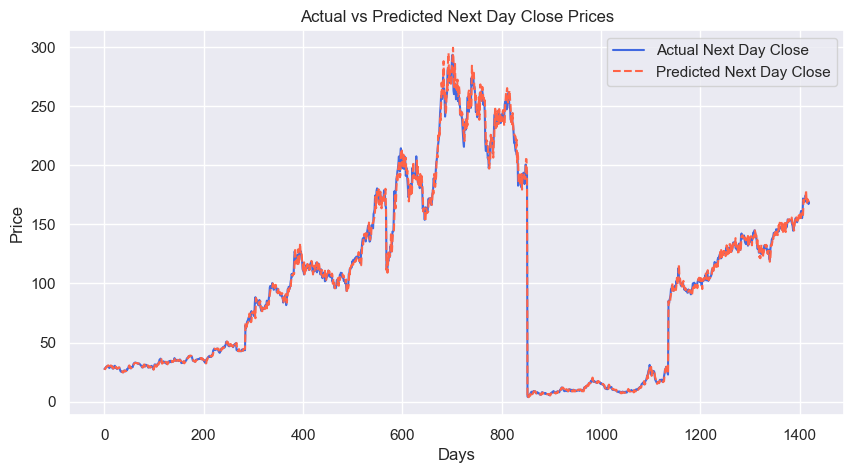

In [55]:
# Plot
sns.set(style="darkgrid")
plt.figure(figsize=(10, 5))  # Set the figure size

#y_test = y_test.to_numpy()

plt.plot(y_test.to_numpy(), label='Actual Next Day Close', color='royalblue', linestyle='-')  # Solid line for actual values
plt.plot(preds, label='Predicted Next Day Close', color='tomato', linestyle='--')  # Dashed line for predicted values

plt.title('Actual vs Predicted Next Day Close Prices')  # Title of the plot
plt.xlabel('Days')  # X-axis label
plt.ylabel('Price')  # Y-axis label
plt.legend()  # Show legend to differentiate between actual and predicted values

plt.show()


---
### Model 2: Artificial Neural Network (ANN)

In [56]:
#Firstly, let's convert our data from dataframes to numpy arrays

X_train_arr = X_train[['num__Open', 'num__High', 'num__Low', 'num__Close', 'num__Volume',
       'num__H-L', 'num__O-C', 'cat__Symbol',
       'cat__DayOfWeek', 'cat__Month']].values
y_train_arr = y_train.values

X_test_arr = X_test[['num__Open', 'num__High', 'num__Low', 'num__Close', 'num__Volume',
       'num__H-L', 'num__O-C', 'cat__Symbol',
       'cat__DayOfWeek', 'cat__Month']].values
y_test_arr = y_test.values


In [57]:
# Define the ANN architecture
class ANN(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size=1):
        super(ANN, self).__init__()
        
        # Define a sequential container of layers
        self.all_layers = nn.Sequential(
            nn.Linear(input_size, hidden_size1),  # First hidden layer
            nn.ReLU(),                            # Activation function for non-linearity
            nn.Linear(hidden_size1, hidden_size2),# Second hidden layer
            nn.ReLU(),                            # Another ReLU activation function
            nn.Linear(hidden_size2, output_size), # Output layer
        )
        
    # Define the forward pass
    def forward(self, x):
        # Pass the input through all layers
        output = self.all_layers(x)
        return output

    
# Instantiate the ANN class
ann_model = ANN(input_size=10, hidden_size1=50, hidden_size2=25)

# Instantiate a loss function and an Optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(params=ann_model.parameters(), lr=0.001)

In [58]:
# Define a custom dataset class for ANN
class ANN_Dataset(Dataset):
    def __init__(self, x, y):
        # Convert feature data (x) and label data (y) to PyTorch tensors
        self.features = torch.tensor(x, dtype=torch.float32)
        self.labels = torch.tensor(y, dtype=torch.float32)
        
    def __getitem__(self, index):
        # Return a single sample and its label
        x = self.features[index]
        y = self.labels[index]
        return x, y
    
    def __len__(self):
        # Return the total number of samples
        return self.labels.shape[0]

# Initialize the dataset with training and testing data
train_data = ANN_Dataset(X_train_arr, y_train_arr)
test_data = ANN_Dataset(X_test_arr, y_test_arr)

# Create data loaders for both training and testing datasets
# Setting shuffle to False because the data is sequential/time-series
train_loader = DataLoader(dataset=train_data, batch_size=100, shuffle=False)
test_loader = DataLoader(dataset=test_data, batch_size=100, shuffle=False)

In [59]:

from tqdm import tqdm


# Define the number of epochs for training
num_epochs = 100

# Start the training loop
for epoch in tqdm(range(num_epochs)):
    # Set the model to training mode.
    ann_model = ann_model.train()
    
    # Loop through the batches of data in the train_loader
    for batch_idx, (features, labels) in enumerate(train_loader):
        
        # Forward pass: Compute the predicted outputs by passing inputs to the model
        outputs = ann_model(features)
        
        # Compute the loss: Calculate the difference between the predicted outputs and the actual labels
        loss = criterion(outputs, labels)
        
        # Zero the gradients before running the backward pass.
        optimizer.zero_grad()
        
        # Backward pass: Compute the gradient of the loss with respect to model parameters
        loss.backward()
        
        # Perform a single optimization step (parameter update)
        optimizer.step()
        
        # Logging: Print the epoch, batch, and loss information
        print(f"Epoch: {epoch+1:03d}/{num_epochs:03d} | Batch: {batch_idx+1:03d}/{len(train_loader):03d}",
             f" | Loss: {loss:.2f}")


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Epoch: 001/100 | Batch: 001/113  | Loss: 667.98
Epoch: 001/100 | Batch: 002/113  | Loss: 1098.27
Epoch: 001/100 | Batch: 003/113  | Loss: 1219.43
Epoch: 001/100 | Batch: 004/113  | Loss: 984.58
Epoch: 001/100 | Batch: 005/113  | Loss: 1037.72
Epoch: 001/100 | Batch: 006/113  | Loss: 944.90
Epoch: 001/100 | Batch: 007/113  | Loss: 1216.59
Epoch: 001/100 | Batch: 008/113  | Loss: 1280.31
Epoch: 001/100 | Batch: 009/113  | Loss: 1251.93
Epoch: 001/100 | Batch: 010/113  | Loss: 1664.02
Epoch: 001/100 | Batch: 011/113  | Loss: 2442.61
Epoch: 001/100 | Batch: 012/113  | Loss: 2450.65
Epoch: 001/100 | Batch: 013/113  | Loss: 2321.57
Epoch: 001/100 | Batch: 014/113  | Loss: 2493.92
Epoch: 001/100 | Batch: 015/113  | Loss: 2779.55
Epoch: 001/100 | Batch: 016/113  | Loss: 3465.44
Epoch: 001/100 | Batch: 017/113  | Loss: 2948.84
Epoch: 001/100 | Batch: 018/113  | Loss: 2741.90
Epoch: 001/100 | Batch: 019/113  | Loss: 3413.79
Epoch: 001/100 | Batch: 020/113  | Loss: 2649.54
Epoch: 001/100 | Batch:

  1%|▊                                                                                 | 1/100 [00:00<01:22,  1.21it/s]

Epoch: 001/100 | Batch: 081/113  | Loss: 51.80
Epoch: 001/100 | Batch: 082/113  | Loss: 49.57
Epoch: 001/100 | Batch: 083/113  | Loss: 105.22
Epoch: 001/100 | Batch: 084/113  | Loss: 85.31
Epoch: 001/100 | Batch: 085/113  | Loss: 90.78
Epoch: 001/100 | Batch: 086/113  | Loss: 399.62
Epoch: 001/100 | Batch: 087/113  | Loss: 483.83
Epoch: 001/100 | Batch: 088/113  | Loss: 1135.58
Epoch: 001/100 | Batch: 089/113  | Loss: 153.93
Epoch: 001/100 | Batch: 090/113  | Loss: 15.52
Epoch: 001/100 | Batch: 091/113  | Loss: 56.30
Epoch: 001/100 | Batch: 092/113  | Loss: 53.89
Epoch: 001/100 | Batch: 093/113  | Loss: 26.28
Epoch: 001/100 | Batch: 094/113  | Loss: 109.63
Epoch: 001/100 | Batch: 095/113  | Loss: 234.75
Epoch: 001/100 | Batch: 096/113  | Loss: 439.07
Epoch: 001/100 | Batch: 097/113  | Loss: 689.46
Epoch: 001/100 | Batch: 098/113  | Loss: 768.95
Epoch: 001/100 | Batch: 099/113  | Loss: 1223.64
Epoch: 001/100 | Batch: 100/113  | Loss: 1461.34
Epoch: 001/100 | Batch: 101/113  | Loss: 3210

  2%|█▋                                                                                | 2/100 [00:01<01:06,  1.48it/s]

Epoch: 002/100 | Batch: 077/113  | Loss: 1401.83
Epoch: 002/100 | Batch: 078/113  | Loss: 1544.01
Epoch: 002/100 | Batch: 079/113  | Loss: 1435.64
Epoch: 002/100 | Batch: 080/113  | Loss: 2161.03
Epoch: 002/100 | Batch: 081/113  | Loss: 1728.52
Epoch: 002/100 | Batch: 082/113  | Loss: 1688.43
Epoch: 002/100 | Batch: 083/113  | Loss: 2500.71
Epoch: 002/100 | Batch: 084/113  | Loss: 1894.11
Epoch: 002/100 | Batch: 085/113  | Loss: 2240.49
Epoch: 002/100 | Batch: 086/113  | Loss: 633.60
Epoch: 002/100 | Batch: 087/113  | Loss: 203.54
Epoch: 002/100 | Batch: 088/113  | Loss: 245.66
Epoch: 002/100 | Batch: 089/113  | Loss: 537.98
Epoch: 002/100 | Batch: 090/113  | Loss: 1267.31
Epoch: 002/100 | Batch: 091/113  | Loss: 699.16
Epoch: 002/100 | Batch: 092/113  | Loss: 408.71
Epoch: 002/100 | Batch: 093/113  | Loss: 776.88
Epoch: 002/100 | Batch: 094/113  | Loss: 293.00
Epoch: 002/100 | Batch: 095/113  | Loss: 283.93
Epoch: 002/100 | Batch: 096/113  | Loss: 75.53
Epoch: 002/100 | Batch: 097/113

  3%|██▍                                                                               | 3/100 [00:02<01:02,  1.54it/s]

Epoch: 003/100 | Batch: 080/113  | Loss: 2860.76
Epoch: 003/100 | Batch: 081/113  | Loss: 2230.69
Epoch: 003/100 | Batch: 082/113  | Loss: 2176.87
Epoch: 003/100 | Batch: 083/113  | Loss: 3239.31
Epoch: 003/100 | Batch: 084/113  | Loss: 2407.93
Epoch: 003/100 | Batch: 085/113  | Loss: 2898.14
Epoch: 003/100 | Batch: 086/113  | Loss: 893.11
Epoch: 003/100 | Batch: 087/113  | Loss: 359.77
Epoch: 003/100 | Batch: 088/113  | Loss: 379.30
Epoch: 003/100 | Batch: 089/113  | Loss: 808.45
Epoch: 003/100 | Batch: 090/113  | Loss: 1741.44
Epoch: 003/100 | Batch: 091/113  | Loss: 952.17
Epoch: 003/100 | Batch: 092/113  | Loss: 579.76
Epoch: 003/100 | Batch: 093/113  | Loss: 1095.78
Epoch: 003/100 | Batch: 094/113  | Loss: 444.13
Epoch: 003/100 | Batch: 095/113  | Loss: 472.70
Epoch: 003/100 | Batch: 096/113  | Loss: 140.21
Epoch: 003/100 | Batch: 097/113  | Loss: 102.40
Epoch: 003/100 | Batch: 098/113  | Loss: 155.78
Epoch: 003/100 | Batch: 099/113  | Loss: 164.90
Epoch: 003/100 | Batch: 100/113 

  4%|███▎                                                                              | 4/100 [00:02<01:02,  1.55it/s]

Epoch: 004/100 | Batch: 113/113  | Loss: 4494.75
Epoch: 005/100 | Batch: 001/113  | Loss: 396.35
Epoch: 005/100 | Batch: 002/113  | Loss: 446.61
Epoch: 005/100 | Batch: 003/113  | Loss: 237.34
Epoch: 005/100 | Batch: 004/113  | Loss: 294.38
Epoch: 005/100 | Batch: 005/113  | Loss: 644.72
Epoch: 005/100 | Batch: 006/113  | Loss: 332.42
Epoch: 005/100 | Batch: 007/113  | Loss: 451.32
Epoch: 005/100 | Batch: 008/113  | Loss: 286.81
Epoch: 005/100 | Batch: 009/113  | Loss: 256.72
Epoch: 005/100 | Batch: 010/113  | Loss: 414.89
Epoch: 005/100 | Batch: 011/113  | Loss: 177.53
Epoch: 005/100 | Batch: 012/113  | Loss: 204.90
Epoch: 005/100 | Batch: 013/113  | Loss: 165.26
Epoch: 005/100 | Batch: 014/113  | Loss: 160.56
Epoch: 005/100 | Batch: 015/113  | Loss: 265.22
Epoch: 005/100 | Batch: 016/113  | Loss: 367.02
Epoch: 005/100 | Batch: 017/113  | Loss: 232.09
Epoch: 005/100 | Batch: 018/113  | Loss: 202.57
Epoch: 005/100 | Batch: 019/113  | Loss: 263.04
Epoch: 005/100 | Batch: 020/113  | Loss

  5%|████                                                                              | 5/100 [00:04<01:27,  1.09it/s]

Epoch: 005/100 | Batch: 111/113  | Loss: 14352.03
Epoch: 005/100 | Batch: 112/113  | Loss: 8103.40
Epoch: 005/100 | Batch: 113/113  | Loss: 4233.07
Epoch: 006/100 | Batch: 001/113  | Loss: 412.46
Epoch: 006/100 | Batch: 002/113  | Loss: 488.35
Epoch: 006/100 | Batch: 003/113  | Loss: 262.25
Epoch: 006/100 | Batch: 004/113  | Loss: 313.82
Epoch: 006/100 | Batch: 005/113  | Loss: 696.39
Epoch: 006/100 | Batch: 006/113  | Loss: 353.48
Epoch: 006/100 | Batch: 007/113  | Loss: 494.00
Epoch: 006/100 | Batch: 008/113  | Loss: 315.72
Epoch: 006/100 | Batch: 009/113  | Loss: 278.77
Epoch: 006/100 | Batch: 010/113  | Loss: 464.21
Epoch: 006/100 | Batch: 011/113  | Loss: 192.49
Epoch: 006/100 | Batch: 012/113  | Loss: 232.60
Epoch: 006/100 | Batch: 013/113  | Loss: 188.71
Epoch: 006/100 | Batch: 014/113  | Loss: 173.08
Epoch: 006/100 | Batch: 015/113  | Loss: 298.27
Epoch: 006/100 | Batch: 016/113  | Loss: 359.90
Epoch: 006/100 | Batch: 017/113  | Loss: 253.35
Epoch: 006/100 | Batch: 018/113  | L

  6%|████▉                                                                             | 6/100 [00:04<01:25,  1.10it/s]

Epoch: 006/100 | Batch: 098/113  | Loss: 250.27
Epoch: 006/100 | Batch: 099/113  | Loss: 198.12
Epoch: 006/100 | Batch: 100/113  | Loss: 244.81
Epoch: 006/100 | Batch: 101/113  | Loss: 957.21
Epoch: 006/100 | Batch: 102/113  | Loss: 2309.91
Epoch: 006/100 | Batch: 103/113  | Loss: 2011.30
Epoch: 006/100 | Batch: 104/113  | Loss: 2599.13
Epoch: 006/100 | Batch: 105/113  | Loss: 2414.87
Epoch: 006/100 | Batch: 106/113  | Loss: 3037.65
Epoch: 006/100 | Batch: 107/113  | Loss: 8352.39
Epoch: 006/100 | Batch: 108/113  | Loss: 11853.84
Epoch: 006/100 | Batch: 109/113  | Loss: 13747.98
Epoch: 006/100 | Batch: 110/113  | Loss: 14279.56
Epoch: 006/100 | Batch: 111/113  | Loss: 13466.50
Epoch: 006/100 | Batch: 112/113  | Loss: 7682.19
Epoch: 006/100 | Batch: 113/113  | Loss: 3994.55
Epoch: 007/100 | Batch: 001/113  | Loss: 415.09
Epoch: 007/100 | Batch: 002/113  | Loss: 516.60
Epoch: 007/100 | Batch: 003/113  | Loss: 280.39
Epoch: 007/100 | Batch: 004/113  | Loss: 323.82
Epoch: 007/100 | Batch: 

  7%|█████▋                                                                            | 7/100 [00:05<01:14,  1.24it/s]

Epoch: 007/100 | Batch: 092/113  | Loss: 504.71
Epoch: 007/100 | Batch: 093/113  | Loss: 1124.12
Epoch: 007/100 | Batch: 094/113  | Loss: 412.56
Epoch: 007/100 | Batch: 095/113  | Loss: 562.59
Epoch: 007/100 | Batch: 096/113  | Loss: 181.79
Epoch: 007/100 | Batch: 097/113  | Loss: 164.95
Epoch: 007/100 | Batch: 098/113  | Loss: 269.18
Epoch: 007/100 | Batch: 099/113  | Loss: 222.99
Epoch: 007/100 | Batch: 100/113  | Loss: 270.98
Epoch: 007/100 | Batch: 101/113  | Loss: 976.19
Epoch: 007/100 | Batch: 102/113  | Loss: 2271.83
Epoch: 007/100 | Batch: 103/113  | Loss: 1954.81
Epoch: 007/100 | Batch: 104/113  | Loss: 2530.97
Epoch: 007/100 | Batch: 105/113  | Loss: 2315.36
Epoch: 007/100 | Batch: 106/113  | Loss: 2941.74
Epoch: 007/100 | Batch: 107/113  | Loss: 7902.85
Epoch: 007/100 | Batch: 108/113  | Loss: 10956.78
Epoch: 007/100 | Batch: 109/113  | Loss: 12795.00
Epoch: 007/100 | Batch: 110/113  | Loss: 13148.23
Epoch: 007/100 | Batch: 111/113  | Loss: 12505.25
Epoch: 007/100 | Batch: 1

  8%|██████▌                                                                           | 8/100 [00:06<01:13,  1.25it/s]

Epoch: 008/100 | Batch: 105/113  | Loss: 2238.70
Epoch: 008/100 | Batch: 106/113  | Loss: 2876.12
Epoch: 008/100 | Batch: 107/113  | Loss: 7454.05
Epoch: 008/100 | Batch: 108/113  | Loss: 10007.03
Epoch: 008/100 | Batch: 109/113  | Loss: 11791.22
Epoch: 008/100 | Batch: 110/113  | Loss: 11950.66
Epoch: 008/100 | Batch: 111/113  | Loss: 11497.89
Epoch: 008/100 | Batch: 112/113  | Loss: 6802.13
Epoch: 008/100 | Batch: 113/113  | Loss: 3563.75
Epoch: 009/100 | Batch: 001/113  | Loss: 382.31
Epoch: 009/100 | Batch: 002/113  | Loss: 539.19
Epoch: 009/100 | Batch: 003/113  | Loss: 298.42
Epoch: 009/100 | Batch: 004/113  | Loss: 318.71
Epoch: 009/100 | Batch: 005/113  | Loss: 759.33
Epoch: 009/100 | Batch: 006/113  | Loss: 363.38
Epoch: 009/100 | Batch: 007/113  | Loss: 561.64
Epoch: 009/100 | Batch: 008/113  | Loss: 363.78
Epoch: 009/100 | Batch: 009/113  | Loss: 308.06
Epoch: 009/100 | Batch: 010/113  | Loss: 568.74
Epoch: 009/100 | Batch: 011/113  | Loss: 261.83
Epoch: 009/100 | Batch: 012

  9%|███████▍                                                                          | 9/100 [00:07<01:11,  1.27it/s]

Epoch: 009/100 | Batch: 080/113  | Loss: 2841.06
Epoch: 009/100 | Batch: 081/113  | Loss: 1995.05
Epoch: 009/100 | Batch: 082/113  | Loss: 1968.74
Epoch: 009/100 | Batch: 083/113  | Loss: 3174.70
Epoch: 009/100 | Batch: 084/113  | Loss: 2139.54
Epoch: 009/100 | Batch: 085/113  | Loss: 2811.53
Epoch: 009/100 | Batch: 086/113  | Loss: 1010.69
Epoch: 009/100 | Batch: 087/113  | Loss: 517.96
Epoch: 009/100 | Batch: 088/113  | Loss: 750.42
Epoch: 009/100 | Batch: 089/113  | Loss: 896.67
Epoch: 009/100 | Batch: 090/113  | Loss: 1825.57
Epoch: 009/100 | Batch: 091/113  | Loss: 758.72
Epoch: 009/100 | Batch: 092/113  | Loss: 357.85
Epoch: 009/100 | Batch: 093/113  | Loss: 936.35
Epoch: 009/100 | Batch: 094/113  | Loss: 301.78
Epoch: 009/100 | Batch: 095/113  | Loss: 494.03
Epoch: 009/100 | Batch: 096/113  | Loss: 176.61
Epoch: 009/100 | Batch: 097/113  | Loss: 199.13
Epoch: 009/100 | Batch: 098/113  | Loss: 291.55
Epoch: 009/100 | Batch: 099/113  | Loss: 297.02
Epoch: 009/100 | Batch: 100/113 

 10%|████████                                                                         | 10/100 [00:07<01:05,  1.38it/s]

Epoch: 010/100 | Batch: 093/113  | Loss: 816.71
Epoch: 010/100 | Batch: 094/113  | Loss: 241.85
Epoch: 010/100 | Batch: 095/113  | Loss: 444.75
Epoch: 010/100 | Batch: 096/113  | Loss: 180.13
Epoch: 010/100 | Batch: 097/113  | Loss: 221.44
Epoch: 010/100 | Batch: 098/113  | Loss: 297.74
Epoch: 010/100 | Batch: 099/113  | Loss: 347.13
Epoch: 010/100 | Batch: 100/113  | Loss: 382.89
Epoch: 010/100 | Batch: 101/113  | Loss: 1158.38
Epoch: 010/100 | Batch: 102/113  | Loss: 2292.69
Epoch: 010/100 | Batch: 103/113  | Loss: 1925.59
Epoch: 010/100 | Batch: 104/113  | Loss: 2465.03
Epoch: 010/100 | Batch: 105/113  | Loss: 2134.14
Epoch: 010/100 | Batch: 106/113  | Loss: 2800.94
Epoch: 010/100 | Batch: 107/113  | Loss: 6534.53
Epoch: 010/100 | Batch: 108/113  | Loss: 7991.51
Epoch: 010/100 | Batch: 109/113  | Loss: 9616.44
Epoch: 010/100 | Batch: 110/113  | Loss: 9372.80
Epoch: 010/100 | Batch: 111/113  | Loss: 9335.70
Epoch: 010/100 | Batch: 112/113  | Loss: 5902.26
Epoch: 010/100 | Batch: 113/

 11%|████████▉                                                                        | 11/100 [00:08<01:01,  1.45it/s]

Epoch: 011/100 | Batch: 101/113  | Loss: 1249.04
Epoch: 011/100 | Batch: 102/113  | Loss: 2329.62
Epoch: 011/100 | Batch: 103/113  | Loss: 1947.44
Epoch: 011/100 | Batch: 104/113  | Loss: 2475.45
Epoch: 011/100 | Batch: 105/113  | Loss: 2098.80
Epoch: 011/100 | Batch: 106/113  | Loss: 2784.23
Epoch: 011/100 | Batch: 107/113  | Loss: 6080.80
Epoch: 011/100 | Batch: 108/113  | Loss: 6984.73
Epoch: 011/100 | Batch: 109/113  | Loss: 8498.20
Epoch: 011/100 | Batch: 110/113  | Loss: 8070.03
Epoch: 011/100 | Batch: 111/113  | Loss: 8240.17
Epoch: 011/100 | Batch: 112/113  | Loss: 5461.72
Epoch: 011/100 | Batch: 113/113  | Loss: 3005.36
Epoch: 012/100 | Batch: 001/113  | Loss: 267.97
Epoch: 012/100 | Batch: 002/113  | Loss: 488.95
Epoch: 012/100 | Batch: 003/113  | Loss: 287.32
Epoch: 012/100 | Batch: 004/113  | Loss: 256.47
Epoch: 012/100 | Batch: 005/113  | Loss: 692.65
Epoch: 012/100 | Batch: 006/113  | Loss: 305.90
Epoch: 012/100 | Batch: 007/113  | Loss: 542.61
Epoch: 012/100 | Batch: 008

 12%|█████████▋                                                                       | 12/100 [00:08<00:57,  1.54it/s]

Epoch: 012/100 | Batch: 108/113  | Loss: 6044.21
Epoch: 012/100 | Batch: 109/113  | Loss: 7424.59
Epoch: 012/100 | Batch: 110/113  | Loss: 6845.50
Epoch: 012/100 | Batch: 111/113  | Loss: 7204.69
Epoch: 012/100 | Batch: 112/113  | Loss: 5052.39
Epoch: 012/100 | Batch: 113/113  | Loss: 2856.05
Epoch: 013/100 | Batch: 001/113  | Loss: 225.00
Epoch: 013/100 | Batch: 002/113  | Loss: 450.53
Epoch: 013/100 | Batch: 003/113  | Loss: 275.50
Epoch: 013/100 | Batch: 004/113  | Loss: 227.07
Epoch: 013/100 | Batch: 005/113  | Loss: 637.75
Epoch: 013/100 | Batch: 006/113  | Loss: 276.44
Epoch: 013/100 | Batch: 007/113  | Loss: 513.98
Epoch: 013/100 | Batch: 008/113  | Loss: 341.25
Epoch: 013/100 | Batch: 009/113  | Loss: 263.85
Epoch: 013/100 | Batch: 010/113  | Loss: 591.16
Epoch: 013/100 | Batch: 011/113  | Loss: 387.01
Epoch: 013/100 | Batch: 012/113  | Loss: 427.14
Epoch: 013/100 | Batch: 013/113  | Loss: 383.37
Epoch: 013/100 | Batch: 014/113  | Loss: 311.31
Epoch: 013/100 | Batch: 015/113  |

 13%|██████████▌                                                                      | 13/100 [00:09<00:55,  1.57it/s]

Epoch: 013/100 | Batch: 112/113  | Loss: 4684.20
Epoch: 013/100 | Batch: 113/113  | Loss: 2726.37
Epoch: 014/100 | Batch: 001/113  | Loss: 184.97
Epoch: 014/100 | Batch: 002/113  | Loss: 408.15
Epoch: 014/100 | Batch: 003/113  | Loss: 259.94
Epoch: 014/100 | Batch: 004/113  | Loss: 199.62
Epoch: 014/100 | Batch: 005/113  | Loss: 572.46
Epoch: 014/100 | Batch: 006/113  | Loss: 246.51
Epoch: 014/100 | Batch: 007/113  | Loss: 477.75
Epoch: 014/100 | Batch: 008/113  | Loss: 320.23
Epoch: 014/100 | Batch: 009/113  | Loss: 243.05
Epoch: 014/100 | Batch: 010/113  | Loss: 562.22
Epoch: 014/100 | Batch: 011/113  | Loss: 404.23
Epoch: 014/100 | Batch: 012/113  | Loss: 433.66
Epoch: 014/100 | Batch: 013/113  | Loss: 393.92
Epoch: 014/100 | Batch: 014/113  | Loss: 320.64
Epoch: 014/100 | Batch: 015/113  | Loss: 561.90
Epoch: 014/100 | Batch: 016/113  | Loss: 503.44
Epoch: 014/100 | Batch: 017/113  | Loss: 496.53
Epoch: 014/100 | Batch: 018/113  | Loss: 416.00
Epoch: 014/100 | Batch: 019/113  | Los

 14%|███████████▎                                                                     | 14/100 [00:09<00:51,  1.66it/s]

Epoch: 014/100 | Batch: 090/113  | Loss: 803.74
Epoch: 014/100 | Batch: 091/113  | Loss: 240.93
Epoch: 014/100 | Batch: 092/113  | Loss: 76.08
Epoch: 014/100 | Batch: 093/113  | Loss: 341.42
Epoch: 014/100 | Batch: 094/113  | Loss: 90.67
Epoch: 014/100 | Batch: 095/113  | Loss: 240.06
Epoch: 014/100 | Batch: 096/113  | Loss: 249.87
Epoch: 014/100 | Batch: 097/113  | Loss: 347.93
Epoch: 014/100 | Batch: 098/113  | Loss: 297.07
Epoch: 014/100 | Batch: 099/113  | Loss: 575.37
Epoch: 014/100 | Batch: 100/113  | Loss: 564.38
Epoch: 014/100 | Batch: 101/113  | Loss: 1530.31
Epoch: 014/100 | Batch: 102/113  | Loss: 2462.03
Epoch: 014/100 | Batch: 103/113  | Loss: 2054.41
Epoch: 014/100 | Batch: 104/113  | Loss: 2547.65
Epoch: 014/100 | Batch: 105/113  | Loss: 2038.05
Epoch: 014/100 | Batch: 106/113  | Loss: 2765.07
Epoch: 014/100 | Batch: 107/113  | Loss: 4933.54
Epoch: 014/100 | Batch: 108/113  | Loss: 4488.62
Epoch: 014/100 | Batch: 109/113  | Loss: 5574.98
Epoch: 014/100 | Batch: 110/113  

 15%|████████████▏                                                                    | 15/100 [00:10<00:50,  1.67it/s]

Epoch: 015/100 | Batch: 101/113  | Loss: 1594.78
Epoch: 015/100 | Batch: 102/113  | Loss: 2479.27
Epoch: 015/100 | Batch: 103/113  | Loss: 2083.58
Epoch: 015/100 | Batch: 104/113  | Loss: 2546.72
Epoch: 015/100 | Batch: 105/113  | Loss: 2009.74
Epoch: 015/100 | Batch: 106/113  | Loss: 2740.75
Epoch: 015/100 | Batch: 107/113  | Loss: 4647.99
Epoch: 015/100 | Batch: 108/113  | Loss: 3923.16
Epoch: 015/100 | Batch: 109/113  | Loss: 4872.29
Epoch: 015/100 | Batch: 110/113  | Loss: 4089.67
Epoch: 015/100 | Batch: 111/113  | Loss: 4826.92
Epoch: 015/100 | Batch: 112/113  | Loss: 4086.10
Epoch: 015/100 | Batch: 113/113  | Loss: 2500.08
Epoch: 016/100 | Batch: 001/113  | Loss: 128.93
Epoch: 016/100 | Batch: 002/113  | Loss: 327.29
Epoch: 016/100 | Batch: 003/113  | Loss: 224.80
Epoch: 016/100 | Batch: 004/113  | Loss: 157.40
Epoch: 016/100 | Batch: 005/113  | Loss: 441.10
Epoch: 016/100 | Batch: 006/113  | Loss: 192.81
Epoch: 016/100 | Batch: 007/113  | Loss: 402.33
Epoch: 016/100 | Batch: 008

 16%|████████████▉                                                                    | 16/100 [00:11<00:49,  1.71it/s]

Epoch: 016/100 | Batch: 073/113  | Loss: 414.70
Epoch: 016/100 | Batch: 074/113  | Loss: 220.96
Epoch: 016/100 | Batch: 075/113  | Loss: 348.86
Epoch: 016/100 | Batch: 076/113  | Loss: 240.34
Epoch: 016/100 | Batch: 077/113  | Loss: 468.18
Epoch: 016/100 | Batch: 078/113  | Loss: 694.30
Epoch: 016/100 | Batch: 079/113  | Loss: 447.29
Epoch: 016/100 | Batch: 080/113  | Loss: 872.74
Epoch: 016/100 | Batch: 081/113  | Loss: 510.81
Epoch: 016/100 | Batch: 082/113  | Loss: 499.46
Epoch: 016/100 | Batch: 083/113  | Loss: 965.52
Epoch: 016/100 | Batch: 084/113  | Loss: 541.83
Epoch: 016/100 | Batch: 085/113  | Loss: 827.61
Epoch: 016/100 | Batch: 086/113  | Loss: 393.15
Epoch: 016/100 | Batch: 087/113  | Loss: 167.32
Epoch: 016/100 | Batch: 088/113  | Loss: 457.27
Epoch: 016/100 | Batch: 089/113  | Loss: 195.19
Epoch: 016/100 | Batch: 090/113  | Loss: 479.06
Epoch: 016/100 | Batch: 091/113  | Loss: 139.61
Epoch: 016/100 | Batch: 092/113  | Loss: 51.55
Epoch: 016/100 | Batch: 093/113  | Loss: 

 17%|█████████████▊                                                                   | 17/100 [00:11<00:47,  1.74it/s]

Epoch: 017/100 | Batch: 089/113  | Loss: 155.93
Epoch: 017/100 | Batch: 090/113  | Loss: 375.96
Epoch: 017/100 | Batch: 091/113  | Loss: 112.73
Epoch: 017/100 | Batch: 092/113  | Loss: 45.87
Epoch: 017/100 | Batch: 093/113  | Loss: 166.79
Epoch: 017/100 | Batch: 094/113  | Loss: 72.53
Epoch: 017/100 | Batch: 095/113  | Loss: 174.36
Epoch: 017/100 | Batch: 096/113  | Loss: 298.19
Epoch: 017/100 | Batch: 097/113  | Loss: 403.57
Epoch: 017/100 | Batch: 098/113  | Loss: 302.95
Epoch: 017/100 | Batch: 099/113  | Loss: 667.29
Epoch: 017/100 | Batch: 100/113  | Loss: 631.78
Epoch: 017/100 | Batch: 101/113  | Loss: 1638.02
Epoch: 017/100 | Batch: 102/113  | Loss: 2424.46
Epoch: 017/100 | Batch: 103/113  | Loss: 2078.95
Epoch: 017/100 | Batch: 104/113  | Loss: 2462.39
Epoch: 017/100 | Batch: 105/113  | Loss: 1901.39
Epoch: 017/100 | Batch: 106/113  | Loss: 2611.66
Epoch: 017/100 | Batch: 107/113  | Loss: 4175.95
Epoch: 017/100 | Batch: 108/113  | Loss: 3131.04
Epoch: 017/100 | Batch: 109/113  |

 18%|██████████████▌                                                                  | 18/100 [00:12<00:50,  1.64it/s]

Epoch: 018/100 | Batch: 105/113  | Loss: 1811.90
Epoch: 018/100 | Batch: 106/113  | Loss: 2502.86
Epoch: 018/100 | Batch: 107/113  | Loss: 3960.41
Epoch: 018/100 | Batch: 108/113  | Loss: 2842.16
Epoch: 018/100 | Batch: 109/113  | Loss: 3467.07
Epoch: 018/100 | Batch: 110/113  | Loss: 2725.86
Epoch: 018/100 | Batch: 111/113  | Loss: 3575.04
Epoch: 018/100 | Batch: 112/113  | Loss: 3434.67
Epoch: 018/100 | Batch: 113/113  | Loss: 2171.93
Epoch: 019/100 | Batch: 001/113  | Loss: 82.57
Epoch: 019/100 | Batch: 002/113  | Loss: 237.08
Epoch: 019/100 | Batch: 003/113  | Loss: 167.49
Epoch: 019/100 | Batch: 004/113  | Loss: 110.52
Epoch: 019/100 | Batch: 005/113  | Loss: 310.89
Epoch: 019/100 | Batch: 006/113  | Loss: 129.70
Epoch: 019/100 | Batch: 007/113  | Loss: 309.53
Epoch: 019/100 | Batch: 008/113  | Loss: 195.96
Epoch: 019/100 | Batch: 009/113  | Loss: 144.18
Epoch: 019/100 | Batch: 010/113  | Loss: 370.45
Epoch: 019/100 | Batch: 011/113  | Loss: 322.28
Epoch: 019/100 | Batch: 012/113 

 19%|███████████████▍                                                                 | 19/100 [00:13<00:59,  1.37it/s]

Epoch: 019/100 | Batch: 092/113  | Loss: 36.64
Epoch: 019/100 | Batch: 093/113  | Loss: 114.35
Epoch: 019/100 | Batch: 094/113  | Loss: 63.83
Epoch: 019/100 | Batch: 095/113  | Loss: 148.29
Epoch: 019/100 | Batch: 096/113  | Loss: 293.83
Epoch: 019/100 | Batch: 097/113  | Loss: 386.38
Epoch: 019/100 | Batch: 098/113  | Loss: 288.71
Epoch: 019/100 | Batch: 099/113  | Loss: 642.60
Epoch: 019/100 | Batch: 100/113  | Loss: 602.46
Epoch: 019/100 | Batch: 101/113  | Loss: 1558.54
Epoch: 019/100 | Batch: 102/113  | Loss: 2234.90
Epoch: 019/100 | Batch: 103/113  | Loss: 1971.00
Epoch: 019/100 | Batch: 104/113  | Loss: 2254.10
Epoch: 019/100 | Batch: 105/113  | Loss: 1697.31
Epoch: 019/100 | Batch: 106/113  | Loss: 2361.46
Epoch: 019/100 | Batch: 107/113  | Loss: 3732.95
Epoch: 019/100 | Batch: 108/113  | Loss: 2575.91
Epoch: 019/100 | Batch: 109/113  | Loss: 3115.80
Epoch: 019/100 | Batch: 110/113  | Loss: 2409.65
Epoch: 019/100 | Batch: 111/113  | Loss: 3263.12
Epoch: 019/100 | Batch: 112/113

 20%|████████████████▏                                                                | 20/100 [00:14<00:59,  1.35it/s]

Epoch: 020/100 | Batch: 087/113  | Loss: 122.40
Epoch: 020/100 | Batch: 088/113  | Loss: 304.05
Epoch: 020/100 | Batch: 089/113  | Loss: 108.11
Epoch: 020/100 | Batch: 090/113  | Loss: 225.09
Epoch: 020/100 | Batch: 091/113  | Loss: 75.31
Epoch: 020/100 | Batch: 092/113  | Loss: 32.57
Epoch: 020/100 | Batch: 093/113  | Loss: 96.72
Epoch: 020/100 | Batch: 094/113  | Loss: 58.76
Epoch: 020/100 | Batch: 095/113  | Loss: 136.57
Epoch: 020/100 | Batch: 096/113  | Loss: 284.84
Epoch: 020/100 | Batch: 097/113  | Loss: 366.90
Epoch: 020/100 | Batch: 098/113  | Loss: 274.60
Epoch: 020/100 | Batch: 099/113  | Loss: 610.42
Epoch: 020/100 | Batch: 100/113  | Loss: 572.54
Epoch: 020/100 | Batch: 101/113  | Loss: 1488.57
Epoch: 020/100 | Batch: 102/113  | Loss: 2106.95
Epoch: 020/100 | Batch: 103/113  | Loss: 1891.84
Epoch: 020/100 | Batch: 104/113  | Loss: 2115.11
Epoch: 020/100 | Batch: 105/113  | Loss: 1569.41
Epoch: 020/100 | Batch: 106/113  | Loss: 2200.60
Epoch: 020/100 | Batch: 107/113  | Los

 21%|█████████████████                                                                | 21/100 [00:14<00:58,  1.35it/s]

Epoch: 021/100 | Batch: 109/113  | Loss: 2468.33
Epoch: 021/100 | Batch: 110/113  | Loss: 1848.30
Epoch: 021/100 | Batch: 111/113  | Loss: 2687.44
Epoch: 021/100 | Batch: 112/113  | Loss: 2797.38
Epoch: 021/100 | Batch: 113/113  | Loss: 1783.04
Epoch: 022/100 | Batch: 001/113  | Loss: 58.90
Epoch: 022/100 | Batch: 002/113  | Loss: 192.63
Epoch: 022/100 | Batch: 003/113  | Loss: 114.93
Epoch: 022/100 | Batch: 004/113  | Loss: 78.43
Epoch: 022/100 | Batch: 005/113  | Loss: 266.92
Epoch: 022/100 | Batch: 006/113  | Loss: 92.53
Epoch: 022/100 | Batch: 007/113  | Loss: 268.37
Epoch: 022/100 | Batch: 008/113  | Loss: 146.20
Epoch: 022/100 | Batch: 009/113  | Loss: 103.05
Epoch: 022/100 | Batch: 010/113  | Loss: 317.63
Epoch: 022/100 | Batch: 011/113  | Loss: 226.22
Epoch: 022/100 | Batch: 012/113  | Loss: 250.58
Epoch: 022/100 | Batch: 013/113  | Loss: 211.33
Epoch: 022/100 | Batch: 014/113  | Loss: 168.42
Epoch: 022/100 | Batch: 015/113  | Loss: 358.63
Epoch: 022/100 | Batch: 016/113  | Los

 22%|█████████████████▊                                                               | 22/100 [00:15<00:52,  1.47it/s]

Epoch: 022/100 | Batch: 088/113  | Loss: 273.94
Epoch: 022/100 | Batch: 089/113  | Loss: 99.99
Epoch: 022/100 | Batch: 090/113  | Loss: 181.61
Epoch: 022/100 | Batch: 091/113  | Loss: 65.03
Epoch: 022/100 | Batch: 092/113  | Loss: 25.80
Epoch: 022/100 | Batch: 093/113  | Loss: 74.13
Epoch: 022/100 | Batch: 094/113  | Loss: 48.48
Epoch: 022/100 | Batch: 095/113  | Loss: 116.08
Epoch: 022/100 | Batch: 096/113  | Loss: 257.11
Epoch: 022/100 | Batch: 097/113  | Loss: 313.82
Epoch: 022/100 | Batch: 098/113  | Loss: 236.56
Epoch: 022/100 | Batch: 099/113  | Loss: 522.55
Epoch: 022/100 | Batch: 100/113  | Loss: 492.88
Epoch: 022/100 | Batch: 101/113  | Loss: 1311.56
Epoch: 022/100 | Batch: 102/113  | Loss: 1811.59
Epoch: 022/100 | Batch: 103/113  | Loss: 1700.33
Epoch: 022/100 | Batch: 104/113  | Loss: 1799.37
Epoch: 022/100 | Batch: 105/113  | Loss: 1287.22
Epoch: 022/100 | Batch: 106/113  | Loss: 1846.83
Epoch: 022/100 | Batch: 107/113  | Loss: 3007.79
Epoch: 022/100 | Batch: 108/113  | Los

 23%|██████████████████▋                                                              | 23/100 [00:15<00:49,  1.57it/s]

Epoch: 023/100 | Batch: 104/113  | Loss: 1634.87
Epoch: 023/100 | Batch: 105/113  | Loss: 1142.63
Epoch: 023/100 | Batch: 106/113  | Loss: 1668.36
Epoch: 023/100 | Batch: 107/113  | Loss: 2767.33
Epoch: 023/100 | Batch: 108/113  | Loss: 1613.76
Epoch: 023/100 | Batch: 109/113  | Loss: 1879.98
Epoch: 023/100 | Batch: 110/113  | Loss: 1358.41
Epoch: 023/100 | Batch: 111/113  | Loss: 2164.02
Epoch: 023/100 | Batch: 112/113  | Loss: 2380.08
Epoch: 023/100 | Batch: 113/113  | Loss: 1537.51
Epoch: 024/100 | Batch: 001/113  | Loss: 52.66
Epoch: 024/100 | Batch: 002/113  | Loss: 174.19
Epoch: 024/100 | Batch: 003/113  | Loss: 90.64
Epoch: 024/100 | Batch: 004/113  | Loss: 68.83
Epoch: 024/100 | Batch: 005/113  | Loss: 254.72
Epoch: 024/100 | Batch: 006/113  | Loss: 83.34
Epoch: 024/100 | Batch: 007/113  | Loss: 255.15
Epoch: 024/100 | Batch: 008/113  | Loss: 128.93
Epoch: 024/100 | Batch: 009/113  | Loss: 91.14
Epoch: 024/100 | Batch: 010/113  | Loss: 299.46
Epoch: 024/100 | Batch: 011/113  | 

 24%|███████████████████▍                                                             | 24/100 [00:16<00:45,  1.66it/s]

Epoch: 024/100 | Batch: 080/113  | Loss: 401.63
Epoch: 024/100 | Batch: 081/113  | Loss: 306.51
Epoch: 024/100 | Batch: 082/113  | Loss: 312.74
Epoch: 024/100 | Batch: 083/113  | Loss: 422.34
Epoch: 024/100 | Batch: 084/113  | Loss: 325.57
Epoch: 024/100 | Batch: 085/113  | Loss: 356.49
Epoch: 024/100 | Batch: 086/113  | Loss: 276.90
Epoch: 024/100 | Batch: 087/113  | Loss: 108.80
Epoch: 024/100 | Batch: 088/113  | Loss: 255.87
Epoch: 024/100 | Batch: 089/113  | Loss: 96.51
Epoch: 024/100 | Batch: 090/113  | Loss: 153.30
Epoch: 024/100 | Batch: 091/113  | Loss: 58.84
Epoch: 024/100 | Batch: 092/113  | Loss: 20.56
Epoch: 024/100 | Batch: 093/113  | Loss: 59.28
Epoch: 024/100 | Batch: 094/113  | Loss: 39.28
Epoch: 024/100 | Batch: 095/113  | Loss: 97.76
Epoch: 024/100 | Batch: 096/113  | Loss: 227.28
Epoch: 024/100 | Batch: 097/113  | Loss: 255.90
Epoch: 024/100 | Batch: 098/113  | Loss: 195.13
Epoch: 024/100 | Batch: 099/113  | Loss: 428.05
Epoch: 024/100 | Batch: 100/113  | Loss: 409.0

 25%|████████████████████▎                                                            | 25/100 [00:17<00:43,  1.72it/s]

Epoch: 025/100 | Batch: 104/113  | Loss: 1319.84
Epoch: 025/100 | Batch: 105/113  | Loss: 872.38
Epoch: 025/100 | Batch: 106/113  | Loss: 1334.33
Epoch: 025/100 | Batch: 107/113  | Loss: 2325.67
Epoch: 025/100 | Batch: 108/113  | Loss: 1220.76
Epoch: 025/100 | Batch: 109/113  | Loss: 1391.02
Epoch: 025/100 | Batch: 110/113  | Loss: 968.51
Epoch: 025/100 | Batch: 111/113  | Loss: 1726.12
Epoch: 025/100 | Batch: 112/113  | Loss: 2010.39
Epoch: 025/100 | Batch: 113/113  | Loss: 1330.33
Epoch: 026/100 | Batch: 001/113  | Loss: 53.14
Epoch: 026/100 | Batch: 002/113  | Loss: 162.29
Epoch: 026/100 | Batch: 003/113  | Loss: 75.73
Epoch: 026/100 | Batch: 004/113  | Loss: 67.35
Epoch: 026/100 | Batch: 005/113  | Loss: 248.36
Epoch: 026/100 | Batch: 006/113  | Loss: 83.22
Epoch: 026/100 | Batch: 007/113  | Loss: 246.03
Epoch: 026/100 | Batch: 008/113  | Loss: 119.76
Epoch: 026/100 | Batch: 009/113  | Loss: 88.00
Epoch: 026/100 | Batch: 010/113  | Loss: 283.33
Epoch: 026/100 | Batch: 011/113  | Lo

 26%|█████████████████████                                                            | 26/100 [00:17<00:41,  1.80it/s]

Epoch: 026/100 | Batch: 089/113  | Loss: 95.76
Epoch: 026/100 | Batch: 090/113  | Loss: 131.44
Epoch: 026/100 | Batch: 091/113  | Loss: 55.23
Epoch: 026/100 | Batch: 092/113  | Loss: 16.96
Epoch: 026/100 | Batch: 093/113  | Loss: 49.01
Epoch: 026/100 | Batch: 094/113  | Loss: 30.67
Epoch: 026/100 | Batch: 095/113  | Loss: 80.79
Epoch: 026/100 | Batch: 096/113  | Loss: 196.53
Epoch: 026/100 | Batch: 097/113  | Loss: 199.51
Epoch: 026/100 | Batch: 098/113  | Loss: 155.31
Epoch: 026/100 | Batch: 099/113  | Loss: 338.73
Epoch: 026/100 | Batch: 100/113  | Loss: 325.25
Epoch: 026/100 | Batch: 101/113  | Loss: 925.97
Epoch: 026/100 | Batch: 102/113  | Loss: 1226.14
Epoch: 026/100 | Batch: 103/113  | Loss: 1308.21
Epoch: 026/100 | Batch: 104/113  | Loss: 1171.74
Epoch: 026/100 | Batch: 105/113  | Loss: 749.73
Epoch: 026/100 | Batch: 106/113  | Loss: 1181.46
Epoch: 026/100 | Batch: 107/113  | Loss: 2124.71
Epoch: 026/100 | Batch: 108/113  | Loss: 1049.05
Epoch: 026/100 | Batch: 109/113  | Loss:

 27%|█████████████████████▊                                                           | 27/100 [00:18<00:41,  1.76it/s]

Epoch: 027/100 | Batch: 103/113  | Loss: 1226.48
Epoch: 027/100 | Batch: 104/113  | Loss: 1044.24
Epoch: 027/100 | Batch: 105/113  | Loss: 647.79
Epoch: 027/100 | Batch: 106/113  | Loss: 1052.31
Epoch: 027/100 | Batch: 107/113  | Loss: 1959.42
Epoch: 027/100 | Batch: 108/113  | Loss: 915.78
Epoch: 027/100 | Batch: 109/113  | Loss: 1013.32
Epoch: 027/100 | Batch: 110/113  | Loss: 683.19
Epoch: 027/100 | Batch: 111/113  | Loss: 1389.01
Epoch: 027/100 | Batch: 112/113  | Loss: 1720.34
Epoch: 027/100 | Batch: 113/113  | Loss: 1177.09
Epoch: 028/100 | Batch: 001/113  | Loss: 56.58
Epoch: 028/100 | Batch: 002/113  | Loss: 150.64
Epoch: 028/100 | Batch: 003/113  | Loss: 67.65
Epoch: 028/100 | Batch: 004/113  | Loss: 69.63
Epoch: 028/100 | Batch: 005/113  | Loss: 234.56
Epoch: 028/100 | Batch: 006/113  | Loss: 86.57
Epoch: 028/100 | Batch: 007/113  | Loss: 231.28
Epoch: 028/100 | Batch: 008/113  | Loss: 112.79
Epoch: 028/100 | Batch: 009/113  | Loss: 88.04
Epoch: 028/100 | Batch: 010/113  | Lo

 28%|██████████████████████▋                                                          | 28/100 [00:18<00:40,  1.80it/s]

Epoch: 028/100 | Batch: 073/113  | Loss: 99.24
Epoch: 028/100 | Batch: 074/113  | Loss: 76.25
Epoch: 028/100 | Batch: 075/113  | Loss: 104.47
Epoch: 028/100 | Batch: 076/113  | Loss: 103.29
Epoch: 028/100 | Batch: 077/113  | Loss: 270.48
Epoch: 028/100 | Batch: 078/113  | Loss: 223.78
Epoch: 028/100 | Batch: 079/113  | Loss: 234.54
Epoch: 028/100 | Batch: 080/113  | Loss: 354.18
Epoch: 028/100 | Batch: 081/113  | Loss: 302.37
Epoch: 028/100 | Batch: 082/113  | Loss: 306.83
Epoch: 028/100 | Batch: 083/113  | Loss: 360.42
Epoch: 028/100 | Batch: 084/113  | Loss: 306.04
Epoch: 028/100 | Batch: 085/113  | Loss: 298.12
Epoch: 028/100 | Batch: 086/113  | Loss: 277.73
Epoch: 028/100 | Batch: 087/113  | Loss: 96.68
Epoch: 028/100 | Batch: 088/113  | Loss: 236.98
Epoch: 028/100 | Batch: 089/113  | Loss: 95.63
Epoch: 028/100 | Batch: 090/113  | Loss: 115.29
Epoch: 028/100 | Batch: 091/113  | Loss: 54.00
Epoch: 028/100 | Batch: 092/113  | Loss: 15.38
Epoch: 028/100 | Batch: 093/113  | Loss: 43.78

 29%|███████████████████████▍                                                         | 29/100 [00:19<00:40,  1.77it/s]

Epoch: 029/100 | Batch: 080/113  | Loss: 342.57
Epoch: 029/100 | Batch: 081/113  | Loss: 296.62
Epoch: 029/100 | Batch: 082/113  | Loss: 300.41
Epoch: 029/100 | Batch: 083/113  | Loss: 345.24
Epoch: 029/100 | Batch: 084/113  | Loss: 297.00
Epoch: 029/100 | Batch: 085/113  | Loss: 282.56
Epoch: 029/100 | Batch: 086/113  | Loss: 280.03
Epoch: 029/100 | Batch: 087/113  | Loss: 93.73
Epoch: 029/100 | Batch: 088/113  | Loss: 236.11
Epoch: 029/100 | Batch: 089/113  | Loss: 94.31
Epoch: 029/100 | Batch: 090/113  | Loss: 105.40
Epoch: 029/100 | Batch: 091/113  | Loss: 53.17
Epoch: 029/100 | Batch: 092/113  | Loss: 15.26
Epoch: 029/100 | Batch: 093/113  | Loss: 40.55
Epoch: 029/100 | Batch: 094/113  | Loss: 22.97
Epoch: 029/100 | Batch: 095/113  | Loss: 63.96
Epoch: 029/100 | Batch: 096/113  | Loss: 160.70
Epoch: 029/100 | Batch: 097/113  | Loss: 135.51
Epoch: 029/100 | Batch: 098/113  | Loss: 112.97
Epoch: 029/100 | Batch: 099/113  | Loss: 236.46
Epoch: 029/100 | Batch: 100/113  | Loss: 231.22

 30%|████████████████████████▎                                                        | 30/100 [00:19<00:43,  1.63it/s]

Epoch: 030/100 | Batch: 097/113  | Loss: 120.86
Epoch: 030/100 | Batch: 098/113  | Loss: 102.87
Epoch: 030/100 | Batch: 099/113  | Loss: 209.88
Epoch: 030/100 | Batch: 100/113  | Loss: 207.63
Epoch: 030/100 | Batch: 101/113  | Loss: 628.75
Epoch: 030/100 | Batch: 102/113  | Loss: 806.50
Epoch: 030/100 | Batch: 103/113  | Loss: 1019.12
Epoch: 030/100 | Batch: 104/113  | Loss: 720.73
Epoch: 030/100 | Batch: 105/113  | Loss: 401.66
Epoch: 030/100 | Batch: 106/113  | Loss: 730.76
Epoch: 030/100 | Batch: 107/113  | Loss: 1542.26
Epoch: 030/100 | Batch: 108/113  | Loss: 583.98
Epoch: 030/100 | Batch: 109/113  | Loss: 614.68
Epoch: 030/100 | Batch: 110/113  | Loss: 404.91
Epoch: 030/100 | Batch: 111/113  | Loss: 1039.46
Epoch: 030/100 | Batch: 112/113  | Loss: 1423.38
Epoch: 030/100 | Batch: 113/113  | Loss: 1032.15
Epoch: 031/100 | Batch: 001/113  | Loss: 58.08
Epoch: 031/100 | Batch: 002/113  | Loss: 131.85
Epoch: 031/100 | Batch: 003/113  | Loss: 60.99
Epoch: 031/100 | Batch: 004/113  | Lo

 31%|█████████████████████████                                                        | 31/100 [00:20<00:45,  1.53it/s]

Epoch: 031/100 | Batch: 113/113  | Loss: 999.43
Epoch: 032/100 | Batch: 001/113  | Loss: 57.94
Epoch: 032/100 | Batch: 002/113  | Loss: 125.88
Epoch: 032/100 | Batch: 003/113  | Loss: 60.00
Epoch: 032/100 | Batch: 004/113  | Loss: 69.66
Epoch: 032/100 | Batch: 005/113  | Loss: 192.47
Epoch: 032/100 | Batch: 006/113  | Loss: 85.16
Epoch: 032/100 | Batch: 007/113  | Loss: 191.71
Epoch: 032/100 | Batch: 008/113  | Loss: 98.30
Epoch: 032/100 | Batch: 009/113  | Loss: 81.39
Epoch: 032/100 | Batch: 010/113  | Loss: 196.30
Epoch: 032/100 | Batch: 011/113  | Loss: 82.43
Epoch: 032/100 | Batch: 012/113  | Loss: 106.53
Epoch: 032/100 | Batch: 013/113  | Loss: 67.38
Epoch: 032/100 | Batch: 014/113  | Loss: 71.54
Epoch: 032/100 | Batch: 015/113  | Loss: 169.18
Epoch: 032/100 | Batch: 016/113  | Loss: 113.07
Epoch: 032/100 | Batch: 017/113  | Loss: 124.87
Epoch: 032/100 | Batch: 018/113  | Loss: 93.73
Epoch: 032/100 | Batch: 019/113  | Loss: 58.33
Epoch: 032/100 | Batch: 020/113  | Loss: 98.05
Epoc

 32%|█████████████████████████▉                                                       | 32/100 [00:21<00:43,  1.55it/s]

Epoch: 032/100 | Batch: 077/113  | Loss: 256.72
Epoch: 032/100 | Batch: 078/113  | Loss: 206.20
Epoch: 032/100 | Batch: 079/113  | Loss: 223.51
Epoch: 032/100 | Batch: 080/113  | Loss: 311.90
Epoch: 032/100 | Batch: 081/113  | Loss: 277.24
Epoch: 032/100 | Batch: 082/113  | Loss: 279.72
Epoch: 032/100 | Batch: 083/113  | Loss: 305.24
Epoch: 032/100 | Batch: 084/113  | Loss: 271.81
Epoch: 032/100 | Batch: 085/113  | Loss: 242.57
Epoch: 032/100 | Batch: 086/113  | Loss: 290.11
Epoch: 032/100 | Batch: 087/113  | Loss: 89.53
Epoch: 032/100 | Batch: 088/113  | Loss: 235.72
Epoch: 032/100 | Batch: 089/113  | Loss: 91.57
Epoch: 032/100 | Batch: 090/113  | Loss: 82.15
Epoch: 032/100 | Batch: 091/113  | Loss: 52.79
Epoch: 032/100 | Batch: 092/113  | Loss: 16.43
Epoch: 032/100 | Batch: 093/113  | Loss: 33.74
Epoch: 032/100 | Batch: 094/113  | Loss: 20.62
Epoch: 032/100 | Batch: 095/113  | Loss: 53.99
Epoch: 032/100 | Batch: 096/113  | Loss: 141.03
Epoch: 032/100 | Batch: 097/113  | Loss: 98.58
E

 33%|██████████████████████████▋                                                      | 33/100 [00:21<00:41,  1.60it/s]

Epoch: 033/100 | Batch: 078/113  | Loss: 202.60
Epoch: 033/100 | Batch: 079/113  | Loss: 217.94
Epoch: 033/100 | Batch: 080/113  | Loss: 301.77
Epoch: 033/100 | Batch: 081/113  | Loss: 268.78
Epoch: 033/100 | Batch: 082/113  | Loss: 271.69
Epoch: 033/100 | Batch: 083/113  | Loss: 294.46
Epoch: 033/100 | Batch: 084/113  | Loss: 263.04
Epoch: 033/100 | Batch: 085/113  | Loss: 231.86
Epoch: 033/100 | Batch: 086/113  | Loss: 293.50
Epoch: 033/100 | Batch: 087/113  | Loss: 89.01
Epoch: 033/100 | Batch: 088/113  | Loss: 236.01
Epoch: 033/100 | Batch: 089/113  | Loss: 90.67
Epoch: 033/100 | Batch: 090/113  | Loss: 75.86
Epoch: 033/100 | Batch: 091/113  | Loss: 52.95
Epoch: 033/100 | Batch: 092/113  | Loss: 17.05
Epoch: 033/100 | Batch: 093/113  | Loss: 31.96
Epoch: 033/100 | Batch: 094/113  | Loss: 20.50
Epoch: 033/100 | Batch: 095/113  | Loss: 51.85
Epoch: 033/100 | Batch: 096/113  | Loss: 136.79
Epoch: 033/100 | Batch: 097/113  | Loss: 90.24
Epoch: 033/100 | Batch: 098/113  | Loss: 80.76
Ep

 34%|███████████████████████████▌                                                     | 34/100 [00:22<00:39,  1.65it/s]

Epoch: 034/100 | Batch: 092/113  | Loss: 17.71
Epoch: 034/100 | Batch: 093/113  | Loss: 29.88
Epoch: 034/100 | Batch: 094/113  | Loss: 20.68
Epoch: 034/100 | Batch: 095/113  | Loss: 50.52
Epoch: 034/100 | Batch: 096/113  | Loss: 134.65
Epoch: 034/100 | Batch: 097/113  | Loss: 84.34
Epoch: 034/100 | Batch: 098/113  | Loss: 76.43
Epoch: 034/100 | Batch: 099/113  | Loss: 134.09
Epoch: 034/100 | Batch: 100/113  | Loss: 139.91
Epoch: 034/100 | Batch: 101/113  | Loss: 446.19
Epoch: 034/100 | Batch: 102/113  | Loss: 553.13
Epoch: 034/100 | Batch: 103/113  | Loss: 833.99
Epoch: 034/100 | Batch: 104/113  | Loss: 453.34
Epoch: 034/100 | Batch: 105/113  | Loss: 212.43
Epoch: 034/100 | Batch: 106/113  | Loss: 467.87
Epoch: 034/100 | Batch: 107/113  | Loss: 1202.34
Epoch: 034/100 | Batch: 108/113  | Loss: 345.27
Epoch: 034/100 | Batch: 109/113  | Loss: 329.40
Epoch: 034/100 | Batch: 110/113  | Loss: 229.84
Epoch: 034/100 | Batch: 111/113  | Loss: 777.98
Epoch: 034/100 | Batch: 112/113  | Loss: 1202

 35%|████████████████████████████▎                                                    | 35/100 [00:23<00:42,  1.53it/s]

Epoch: 035/100 | Batch: 111/113  | Loss: 737.46
Epoch: 035/100 | Batch: 112/113  | Loss: 1169.62
Epoch: 035/100 | Batch: 113/113  | Loss: 922.92
Epoch: 036/100 | Batch: 001/113  | Loss: 50.90
Epoch: 036/100 | Batch: 002/113  | Loss: 102.56
Epoch: 036/100 | Batch: 003/113  | Loss: 54.63
Epoch: 036/100 | Batch: 004/113  | Loss: 60.71
Epoch: 036/100 | Batch: 005/113  | Loss: 148.61
Epoch: 036/100 | Batch: 006/113  | Loss: 72.17
Epoch: 036/100 | Batch: 007/113  | Loss: 150.55
Epoch: 036/100 | Batch: 008/113  | Loss: 79.35
Epoch: 036/100 | Batch: 009/113  | Loss: 65.38
Epoch: 036/100 | Batch: 010/113  | Loss: 143.66
Epoch: 036/100 | Batch: 011/113  | Loss: 67.46
Epoch: 036/100 | Batch: 012/113  | Loss: 77.44
Epoch: 036/100 | Batch: 013/113  | Loss: 47.19
Epoch: 036/100 | Batch: 014/113  | Loss: 63.44
Epoch: 036/100 | Batch: 015/113  | Loss: 120.69
Epoch: 036/100 | Batch: 016/113  | Loss: 111.11
Epoch: 036/100 | Batch: 017/113  | Loss: 95.58
Epoch: 036/100 | Batch: 018/113  | Loss: 83.37
Epo

 36%|█████████████████████████████▏                                                   | 36/100 [00:23<00:41,  1.55it/s]

Epoch: 036/100 | Batch: 075/113  | Loss: 142.14
Epoch: 036/100 | Batch: 076/113  | Loss: 125.56
Epoch: 036/100 | Batch: 077/113  | Loss: 231.89
Epoch: 036/100 | Batch: 078/113  | Loss: 193.90
Epoch: 036/100 | Batch: 079/113  | Loss: 202.04
Epoch: 036/100 | Batch: 080/113  | Loss: 273.23
Epoch: 036/100 | Batch: 081/113  | Loss: 244.34
Epoch: 036/100 | Batch: 082/113  | Loss: 245.37
Epoch: 036/100 | Batch: 083/113  | Loss: 261.59
Epoch: 036/100 | Batch: 084/113  | Loss: 236.29
Epoch: 036/100 | Batch: 085/113  | Loss: 200.02
Epoch: 036/100 | Batch: 086/113  | Loss: 301.50
Epoch: 036/100 | Batch: 087/113  | Loss: 88.57
Epoch: 036/100 | Batch: 088/113  | Loss: 237.97
Epoch: 036/100 | Batch: 089/113  | Loss: 87.53
Epoch: 036/100 | Batch: 090/113  | Loss: 58.37
Epoch: 036/100 | Batch: 091/113  | Loss: 52.58
Epoch: 036/100 | Batch: 092/113  | Loss: 18.76
Epoch: 036/100 | Batch: 093/113  | Loss: 26.29
Epoch: 036/100 | Batch: 094/113  | Loss: 21.14
Epoch: 036/100 | Batch: 095/113  | Loss: 49.46


 37%|█████████████████████████████▉                                                   | 37/100 [00:24<00:39,  1.60it/s]

Epoch: 037/100 | Batch: 084/113  | Loss: 228.08
Epoch: 037/100 | Batch: 085/113  | Loss: 191.03
Epoch: 037/100 | Batch: 086/113  | Loss: 303.83
Epoch: 037/100 | Batch: 087/113  | Loss: 88.27
Epoch: 037/100 | Batch: 088/113  | Loss: 239.26
Epoch: 037/100 | Batch: 089/113  | Loss: 86.70
Epoch: 037/100 | Batch: 090/113  | Loss: 53.69
Epoch: 037/100 | Batch: 091/113  | Loss: 52.46
Epoch: 037/100 | Batch: 092/113  | Loss: 19.24
Epoch: 037/100 | Batch: 093/113  | Loss: 25.06
Epoch: 037/100 | Batch: 094/113  | Loss: 21.33
Epoch: 037/100 | Batch: 095/113  | Loss: 49.37
Epoch: 037/100 | Batch: 096/113  | Loss: 132.42
Epoch: 037/100 | Batch: 097/113  | Loss: 73.14
Epoch: 037/100 | Batch: 098/113  | Loss: 67.50
Epoch: 037/100 | Batch: 099/113  | Loss: 103.66
Epoch: 037/100 | Batch: 100/113  | Loss: 112.34
Epoch: 037/100 | Batch: 101/113  | Loss: 367.18
Epoch: 037/100 | Batch: 102/113  | Loss: 445.17
Epoch: 037/100 | Batch: 103/113  | Loss: 746.07
Epoch: 037/100 | Batch: 104/113  | Loss: 337.99
Ep

 38%|██████████████████████████████▊                                                  | 38/100 [00:25<00:37,  1.64it/s]

Epoch: 038/100 | Batch: 095/113  | Loss: 49.69
Epoch: 038/100 | Batch: 096/113  | Loss: 133.38
Epoch: 038/100 | Batch: 097/113  | Loss: 71.31
Epoch: 038/100 | Batch: 098/113  | Loss: 66.08
Epoch: 038/100 | Batch: 099/113  | Loss: 97.08
Epoch: 038/100 | Batch: 100/113  | Loss: 106.07
Epoch: 038/100 | Batch: 101/113  | Loss: 348.57
Epoch: 038/100 | Batch: 102/113  | Loss: 419.85
Epoch: 038/100 | Batch: 103/113  | Loss: 724.06
Epoch: 038/100 | Batch: 104/113  | Loss: 310.75
Epoch: 038/100 | Batch: 105/113  | Loss: 124.02
Epoch: 038/100 | Batch: 106/113  | Loss: 331.46
Epoch: 038/100 | Batch: 107/113  | Loss: 1027.72
Epoch: 038/100 | Batch: 108/113  | Loss: 240.30
Epoch: 038/100 | Batch: 109/113  | Loss: 207.12
Epoch: 038/100 | Batch: 110/113  | Loss: 167.46
Epoch: 038/100 | Batch: 111/113  | Loss: 654.83
Epoch: 038/100 | Batch: 112/113  | Loss: 1103.59
Epoch: 038/100 | Batch: 113/113  | Loss: 893.12
Epoch: 039/100 | Batch: 001/113  | Loss: 44.37
Epoch: 039/100 | Batch: 002/113  | Loss: 90

 39%|███████████████████████████████▌                                                 | 39/100 [00:25<00:36,  1.67it/s]

Epoch: 039/100 | Batch: 109/113  | Loss: 189.79
Epoch: 039/100 | Batch: 110/113  | Loss: 159.69
Epoch: 039/100 | Batch: 111/113  | Loss: 635.24
Epoch: 039/100 | Batch: 112/113  | Loss: 1087.47
Epoch: 039/100 | Batch: 113/113  | Loss: 885.50
Epoch: 040/100 | Batch: 001/113  | Loss: 42.44
Epoch: 040/100 | Batch: 002/113  | Loss: 87.05
Epoch: 040/100 | Batch: 003/113  | Loss: 49.27
Epoch: 040/100 | Batch: 004/113  | Loss: 52.06
Epoch: 040/100 | Batch: 005/113  | Loss: 119.15
Epoch: 040/100 | Batch: 006/113  | Loss: 59.51
Epoch: 040/100 | Batch: 007/113  | Loss: 121.89
Epoch: 040/100 | Batch: 008/113  | Loss: 64.08
Epoch: 040/100 | Batch: 009/113  | Loss: 51.48
Epoch: 040/100 | Batch: 010/113  | Loss: 110.73
Epoch: 040/100 | Batch: 011/113  | Loss: 57.98
Epoch: 040/100 | Batch: 012/113  | Loss: 59.05
Epoch: 040/100 | Batch: 013/113  | Loss: 35.89
Epoch: 040/100 | Batch: 014/113  | Loss: 58.67
Epoch: 040/100 | Batch: 015/113  | Loss: 92.90
Epoch: 040/100 | Batch: 016/113  | Loss: 115.61
Epo

 40%|████████████████████████████████▍                                                | 40/100 [00:26<00:35,  1.71it/s]

Epoch: 040/100 | Batch: 080/113  | Loss: 244.12
Epoch: 040/100 | Batch: 081/113  | Loss: 216.65
Epoch: 040/100 | Batch: 082/113  | Loss: 213.06
Epoch: 040/100 | Batch: 083/113  | Loss: 226.80
Epoch: 040/100 | Batch: 084/113  | Loss: 202.53
Epoch: 040/100 | Batch: 085/113  | Loss: 165.66
Epoch: 040/100 | Batch: 086/113  | Loss: 309.53
Epoch: 040/100 | Batch: 087/113  | Loss: 87.94
Epoch: 040/100 | Batch: 088/113  | Loss: 245.62
Epoch: 040/100 | Batch: 089/113  | Loss: 83.75
Epoch: 040/100 | Batch: 090/113  | Loss: 39.82
Epoch: 040/100 | Batch: 091/113  | Loss: 51.21
Epoch: 040/100 | Batch: 092/113  | Loss: 20.89
Epoch: 040/100 | Batch: 093/113  | Loss: 21.20
Epoch: 040/100 | Batch: 094/113  | Loss: 22.51
Epoch: 040/100 | Batch: 095/113  | Loss: 50.94
Epoch: 040/100 | Batch: 096/113  | Loss: 135.88
Epoch: 040/100 | Batch: 097/113  | Loss: 68.56
Epoch: 040/100 | Batch: 098/113  | Loss: 64.05
Epoch: 040/100 | Batch: 099/113  | Loss: 86.67
Epoch: 040/100 | Batch: 100/113  | Loss: 95.81
Epoc

 41%|█████████████████████████████████▏                                               | 41/100 [00:26<00:33,  1.75it/s]

Epoch: 041/100 | Batch: 095/113  | Loss: 51.82
Epoch: 041/100 | Batch: 096/113  | Loss: 137.29
Epoch: 041/100 | Batch: 097/113  | Loss: 67.58
Epoch: 041/100 | Batch: 098/113  | Loss: 63.37
Epoch: 041/100 | Batch: 099/113  | Loss: 82.44
Epoch: 041/100 | Batch: 100/113  | Loss: 91.36
Epoch: 041/100 | Batch: 101/113  | Loss: 304.49
Epoch: 041/100 | Batch: 102/113  | Loss: 360.90
Epoch: 041/100 | Batch: 103/113  | Loss: 668.58
Epoch: 041/100 | Batch: 104/113  | Loss: 248.18
Epoch: 041/100 | Batch: 105/113  | Loss: 91.72
Epoch: 041/100 | Batch: 106/113  | Loss: 272.19
Epoch: 041/100 | Batch: 107/113  | Loss: 951.09
Epoch: 041/100 | Batch: 108/113  | Loss: 203.45
Epoch: 041/100 | Batch: 109/113  | Loss: 165.11
Epoch: 041/100 | Batch: 110/113  | Loss: 148.62
Epoch: 041/100 | Batch: 111/113  | Loss: 604.48
Epoch: 041/100 | Batch: 112/113  | Loss: 1061.06
Epoch: 041/100 | Batch: 113/113  | Loss: 871.57
Epoch: 042/100 | Batch: 001/113  | Loss: 39.29
Epoch: 042/100 | Batch: 002/113  | Loss: 82.33

 42%|██████████████████████████████████                                               | 42/100 [00:27<00:32,  1.80it/s]

Epoch: 042/100 | Batch: 077/113  | Loss: 202.61
Epoch: 042/100 | Batch: 078/113  | Loss: 180.60
Epoch: 042/100 | Batch: 079/113  | Loss: 172.78
Epoch: 042/100 | Batch: 080/113  | Loss: 229.51
Epoch: 042/100 | Batch: 081/113  | Loss: 202.29
Epoch: 042/100 | Batch: 082/113  | Loss: 196.09
Epoch: 042/100 | Batch: 083/113  | Loss: 210.98
Epoch: 042/100 | Batch: 084/113  | Loss: 185.00
Epoch: 042/100 | Batch: 085/113  | Loss: 150.09
Epoch: 042/100 | Batch: 086/113  | Loss: 313.63
Epoch: 042/100 | Batch: 087/113  | Loss: 88.71
Epoch: 042/100 | Batch: 088/113  | Loss: 250.71
Epoch: 042/100 | Batch: 089/113  | Loss: 83.00
Epoch: 042/100 | Batch: 090/113  | Loss: 32.68
Epoch: 042/100 | Batch: 091/113  | Loss: 50.64
Epoch: 042/100 | Batch: 092/113  | Loss: 22.58
Epoch: 042/100 | Batch: 093/113  | Loss: 19.98
Epoch: 042/100 | Batch: 094/113  | Loss: 23.85
Epoch: 042/100 | Batch: 095/113  | Loss: 53.09
Epoch: 042/100 | Batch: 096/113  | Loss: 139.32
Epoch: 042/100 | Batch: 097/113  | Loss: 67.00
E

 43%|██████████████████████████████████▊                                              | 43/100 [00:27<00:31,  1.80it/s]

Epoch: 043/100 | Batch: 094/113  | Loss: 24.74
Epoch: 043/100 | Batch: 095/113  | Loss: 54.67
Epoch: 043/100 | Batch: 096/113  | Loss: 141.81
Epoch: 043/100 | Batch: 097/113  | Loss: 66.68
Epoch: 043/100 | Batch: 098/113  | Loss: 62.88
Epoch: 043/100 | Batch: 099/113  | Loss: 75.97
Epoch: 043/100 | Batch: 100/113  | Loss: 83.87
Epoch: 043/100 | Batch: 101/113  | Loss: 282.74
Epoch: 043/100 | Batch: 102/113  | Loss: 331.64
Epoch: 043/100 | Batch: 103/113  | Loss: 638.69
Epoch: 043/100 | Batch: 104/113  | Loss: 217.22
Epoch: 043/100 | Batch: 105/113  | Loss: 78.60
Epoch: 043/100 | Batch: 106/113  | Loss: 243.65
Epoch: 043/100 | Batch: 107/113  | Loss: 913.98
Epoch: 043/100 | Batch: 108/113  | Loss: 189.78
Epoch: 043/100 | Batch: 109/113  | Loss: 149.30
Epoch: 043/100 | Batch: 110/113  | Loss: 140.76
Epoch: 043/100 | Batch: 111/113  | Loss: 581.03
Epoch: 043/100 | Batch: 112/113  | Loss: 1039.59
Epoch: 043/100 | Batch: 113/113  | Loss: 857.76
Epoch: 044/100 | Batch: 001/113  | Loss: 37.36

 44%|███████████████████████████████████▋                                             | 44/100 [00:28<00:30,  1.84it/s]

Epoch: 044/100 | Batch: 080/113  | Loss: 214.95
Epoch: 044/100 | Batch: 081/113  | Loss: 187.43
Epoch: 044/100 | Batch: 082/113  | Loss: 178.27
Epoch: 044/100 | Batch: 083/113  | Loss: 195.71
Epoch: 044/100 | Batch: 084/113  | Loss: 167.23
Epoch: 044/100 | Batch: 085/113  | Loss: 135.00
Epoch: 044/100 | Batch: 086/113  | Loss: 318.69
Epoch: 044/100 | Batch: 087/113  | Loss: 90.46
Epoch: 044/100 | Batch: 088/113  | Loss: 256.68
Epoch: 044/100 | Batch: 089/113  | Loss: 83.28
Epoch: 044/100 | Batch: 090/113  | Loss: 26.89
Epoch: 044/100 | Batch: 091/113  | Loss: 50.49
Epoch: 044/100 | Batch: 092/113  | Loss: 25.09
Epoch: 044/100 | Batch: 093/113  | Loss: 20.05
Epoch: 044/100 | Batch: 094/113  | Loss: 25.62
Epoch: 044/100 | Batch: 095/113  | Loss: 56.06
Epoch: 044/100 | Batch: 096/113  | Loss: 143.46
Epoch: 044/100 | Batch: 097/113  | Loss: 66.01
Epoch: 044/100 | Batch: 098/113  | Loss: 62.12
Epoch: 044/100 | Batch: 099/113  | Loss: 72.53
Epoch: 044/100 | Batch: 100/113  | Loss: 79.75
Epoc

 45%|████████████████████████████████████▍                                            | 45/100 [00:28<00:32,  1.70it/s]

Epoch: 045/100 | Batch: 102/113  | Loss: 307.23
Epoch: 045/100 | Batch: 103/113  | Loss: 610.25
Epoch: 045/100 | Batch: 104/113  | Loss: 190.56
Epoch: 045/100 | Batch: 105/113  | Loss: 69.92
Epoch: 045/100 | Batch: 106/113  | Loss: 220.22
Epoch: 045/100 | Batch: 107/113  | Loss: 882.93
Epoch: 045/100 | Batch: 108/113  | Loss: 180.36
Epoch: 045/100 | Batch: 109/113  | Loss: 138.48
Epoch: 045/100 | Batch: 110/113  | Loss: 134.50
Epoch: 045/100 | Batch: 111/113  | Loss: 561.98
Epoch: 045/100 | Batch: 112/113  | Loss: 1021.23
Epoch: 045/100 | Batch: 113/113  | Loss: 843.97
Epoch: 046/100 | Batch: 001/113  | Loss: 36.05
Epoch: 046/100 | Batch: 002/113  | Loss: 76.71
Epoch: 046/100 | Batch: 003/113  | Loss: 46.23
Epoch: 046/100 | Batch: 004/113  | Loss: 46.29
Epoch: 046/100 | Batch: 005/113  | Loss: 98.84
Epoch: 046/100 | Batch: 006/113  | Loss: 49.83
Epoch: 046/100 | Batch: 007/113  | Loss: 99.65
Epoch: 046/100 | Batch: 008/113  | Loss: 51.92
Epoch: 046/100 | Batch: 009/113  | Loss: 40.83
E

 46%|█████████████████████████████████████▎                                           | 46/100 [00:29<00:33,  1.62it/s]

Epoch: 046/100 | Batch: 097/113  | Loss: 65.96
Epoch: 046/100 | Batch: 098/113  | Loss: 61.14
Epoch: 046/100 | Batch: 099/113  | Loss: 67.77
Epoch: 046/100 | Batch: 100/113  | Loss: 73.76
Epoch: 046/100 | Batch: 101/113  | Loss: 254.90
Epoch: 046/100 | Batch: 102/113  | Loss: 297.55
Epoch: 046/100 | Batch: 103/113  | Loss: 598.23
Epoch: 046/100 | Batch: 104/113  | Loss: 179.99
Epoch: 046/100 | Batch: 105/113  | Loss: 66.87
Epoch: 046/100 | Batch: 106/113  | Loss: 210.97
Epoch: 046/100 | Batch: 107/113  | Loss: 869.26
Epoch: 046/100 | Batch: 108/113  | Loss: 176.79
Epoch: 046/100 | Batch: 109/113  | Loss: 134.29
Epoch: 046/100 | Batch: 110/113  | Loss: 131.81
Epoch: 046/100 | Batch: 111/113  | Loss: 553.70
Epoch: 046/100 | Batch: 112/113  | Loss: 1013.10
Epoch: 046/100 | Batch: 113/113  | Loss: 837.87
Epoch: 047/100 | Batch: 001/113  | Loss: 35.39
Epoch: 047/100 | Batch: 002/113  | Loss: 75.55
Epoch: 047/100 | Batch: 003/113  | Loss: 45.90
Epoch: 047/100 | Batch: 004/113  | Loss: 45.69


 47%|██████████████████████████████████████                                           | 47/100 [00:30<00:31,  1.70it/s]

Epoch: 047/100 | Batch: 111/113  | Loss: 546.28
Epoch: 047/100 | Batch: 112/113  | Loss: 1005.94
Epoch: 047/100 | Batch: 113/113  | Loss: 831.82
Epoch: 048/100 | Batch: 001/113  | Loss: 34.54
Epoch: 048/100 | Batch: 002/113  | Loss: 74.29
Epoch: 048/100 | Batch: 003/113  | Loss: 45.39
Epoch: 048/100 | Batch: 004/113  | Loss: 44.99
Epoch: 048/100 | Batch: 005/113  | Loss: 94.69
Epoch: 048/100 | Batch: 006/113  | Loss: 47.47
Epoch: 048/100 | Batch: 007/113  | Loss: 94.23
Epoch: 048/100 | Batch: 008/113  | Loss: 48.98
Epoch: 048/100 | Batch: 009/113  | Loss: 38.43
Epoch: 048/100 | Batch: 010/113  | Loss: 82.17
Epoch: 048/100 | Batch: 011/113  | Loss: 51.88
Epoch: 048/100 | Batch: 012/113  | Loss: 43.69
Epoch: 048/100 | Batch: 013/113  | Loss: 27.76
Epoch: 048/100 | Batch: 014/113  | Loss: 54.92
Epoch: 048/100 | Batch: 015/113  | Loss: 68.87
Epoch: 048/100 | Batch: 016/113  | Loss: 123.12
Epoch: 048/100 | Batch: 017/113  | Loss: 75.71
Epoch: 048/100 | Batch: 018/113  | Loss: 87.50
Epoch: 0

 48%|██████████████████████████████████████▉                                          | 48/100 [00:30<00:26,  1.97it/s]

Epoch: 048/100 | Batch: 064/113  | Loss: 1494.59
Epoch: 048/100 | Batch: 065/113  | Loss: 5555.94
Epoch: 048/100 | Batch: 066/113  | Loss: 3386.99
Epoch: 048/100 | Batch: 067/113  | Loss: 2761.05
Epoch: 048/100 | Batch: 068/113  | Loss: 13135.18
Epoch: 048/100 | Batch: 069/113  | Loss: 381.63
Epoch: 048/100 | Batch: 070/113  | Loss: 447.38
Epoch: 048/100 | Batch: 071/113  | Loss: 621.98
Epoch: 048/100 | Batch: 072/113  | Loss: 1060.43
Epoch: 048/100 | Batch: 073/113  | Loss: 161.90
Epoch: 048/100 | Batch: 074/113  | Loss: 142.43
Epoch: 048/100 | Batch: 075/113  | Loss: 222.05
Epoch: 048/100 | Batch: 076/113  | Loss: 146.83
Epoch: 048/100 | Batch: 077/113  | Loss: 172.51
Epoch: 048/100 | Batch: 078/113  | Loss: 164.55
Epoch: 048/100 | Batch: 079/113  | Loss: 139.07
Epoch: 048/100 | Batch: 080/113  | Loss: 187.25
Epoch: 048/100 | Batch: 081/113  | Loss: 158.26
Epoch: 048/100 | Batch: 082/113  | Loss: 143.86
Epoch: 048/100 | Batch: 083/113  | Loss: 165.41
Epoch: 048/100 | Batch: 084/113  

 49%|███████████████████████████████████████▋                                         | 49/100 [00:30<00:23,  2.20it/s]

Epoch: 049/100 | Batch: 098/113  | Loss: 59.32
Epoch: 049/100 | Batch: 099/113  | Loss: 61.84
Epoch: 049/100 | Batch: 100/113  | Loss: 66.24
Epoch: 049/100 | Batch: 101/113  | Loss: 233.49
Epoch: 049/100 | Batch: 102/113  | Loss: 272.72
Epoch: 049/100 | Batch: 103/113  | Loss: 564.23
Epoch: 049/100 | Batch: 104/113  | Loss: 154.56
Epoch: 049/100 | Batch: 105/113  | Loss: 61.36
Epoch: 049/100 | Batch: 106/113  | Loss: 188.99
Epoch: 049/100 | Batch: 107/113  | Loss: 834.31
Epoch: 049/100 | Batch: 108/113  | Loss: 169.52
Epoch: 049/100 | Batch: 109/113  | Loss: 125.46
Epoch: 049/100 | Batch: 110/113  | Loss: 124.71
Epoch: 049/100 | Batch: 111/113  | Loss: 532.72
Epoch: 049/100 | Batch: 112/113  | Loss: 992.37
Epoch: 049/100 | Batch: 113/113  | Loss: 820.31
Epoch: 050/100 | Batch: 001/113  | Loss: 33.47
Epoch: 050/100 | Batch: 002/113  | Loss: 72.14
Epoch: 050/100 | Batch: 003/113  | Loss: 44.83
Epoch: 050/100 | Batch: 004/113  | Loss: 43.85
Epoch: 050/100 | Batch: 005/113  | Loss: 91.27
E

 50%|████████████████████████████████████████▌                                        | 50/100 [00:31<00:21,  2.32it/s]

Epoch: 050/100 | Batch: 054/113  | Loss: 24.49
Epoch: 050/100 | Batch: 055/113  | Loss: 19.22
Epoch: 050/100 | Batch: 056/113  | Loss: 16.03
Epoch: 050/100 | Batch: 057/113  | Loss: 28.39
Epoch: 050/100 | Batch: 058/113  | Loss: 29.36
Epoch: 050/100 | Batch: 059/113  | Loss: 23.93
Epoch: 050/100 | Batch: 060/113  | Loss: 17.23
Epoch: 050/100 | Batch: 061/113  | Loss: 479.44
Epoch: 050/100 | Batch: 062/113  | Loss: 2514.60
Epoch: 050/100 | Batch: 063/113  | Loss: 6572.64
Epoch: 050/100 | Batch: 064/113  | Loss: 1486.28
Epoch: 050/100 | Batch: 065/113  | Loss: 5478.25
Epoch: 050/100 | Batch: 066/113  | Loss: 3388.31
Epoch: 050/100 | Batch: 067/113  | Loss: 2752.44
Epoch: 050/100 | Batch: 068/113  | Loss: 13019.07
Epoch: 050/100 | Batch: 069/113  | Loss: 393.60
Epoch: 050/100 | Batch: 070/113  | Loss: 458.55
Epoch: 050/100 | Batch: 071/113  | Loss: 630.81
Epoch: 050/100 | Batch: 072/113  | Loss: 1080.04
Epoch: 050/100 | Batch: 073/113  | Loss: 166.07
Epoch: 050/100 | Batch: 074/113  | Los

 51%|█████████████████████████████████████████▎                                       | 51/100 [00:31<00:19,  2.49it/s]

Epoch: 051/100 | Batch: 057/113  | Loss: 26.94
Epoch: 051/100 | Batch: 058/113  | Loss: 28.45
Epoch: 051/100 | Batch: 059/113  | Loss: 22.83
Epoch: 051/100 | Batch: 060/113  | Loss: 16.73
Epoch: 051/100 | Batch: 061/113  | Loss: 468.26
Epoch: 051/100 | Batch: 062/113  | Loss: 2490.24
Epoch: 051/100 | Batch: 063/113  | Loss: 6548.17
Epoch: 051/100 | Batch: 064/113  | Loss: 1481.96
Epoch: 051/100 | Batch: 065/113  | Loss: 5441.28
Epoch: 051/100 | Batch: 066/113  | Loss: 3389.60
Epoch: 051/100 | Batch: 067/113  | Loss: 2747.66
Epoch: 051/100 | Batch: 068/113  | Loss: 12963.66
Epoch: 051/100 | Batch: 069/113  | Loss: 397.92
Epoch: 051/100 | Batch: 070/113  | Loss: 462.86
Epoch: 051/100 | Batch: 071/113  | Loss: 635.56
Epoch: 051/100 | Batch: 072/113  | Loss: 1088.09
Epoch: 051/100 | Batch: 073/113  | Loss: 166.55
Epoch: 051/100 | Batch: 074/113  | Loss: 152.14
Epoch: 051/100 | Batch: 075/113  | Loss: 232.07
Epoch: 051/100 | Batch: 076/113  | Loss: 149.06
Epoch: 051/100 | Batch: 077/113  | 

 52%|██████████████████████████████████████████                                       | 52/100 [00:31<00:17,  2.68it/s]

Epoch: 052/100 | Batch: 101/113  | Loss: 215.72
Epoch: 052/100 | Batch: 102/113  | Loss: 253.94
Epoch: 052/100 | Batch: 103/113  | Loss: 533.27
Epoch: 052/100 | Batch: 104/113  | Loss: 135.99
Epoch: 052/100 | Batch: 105/113  | Loss: 59.98
Epoch: 052/100 | Batch: 106/113  | Loss: 173.18
Epoch: 052/100 | Batch: 107/113  | Loss: 806.57
Epoch: 052/100 | Batch: 108/113  | Loss: 164.80
Epoch: 052/100 | Batch: 109/113  | Loss: 119.95
Epoch: 052/100 | Batch: 110/113  | Loss: 118.93
Epoch: 052/100 | Batch: 111/113  | Loss: 515.77
Epoch: 052/100 | Batch: 112/113  | Loss: 973.72
Epoch: 052/100 | Batch: 113/113  | Loss: 804.42
Epoch: 053/100 | Batch: 001/113  | Loss: 32.44
Epoch: 053/100 | Batch: 002/113  | Loss: 69.91
Epoch: 053/100 | Batch: 003/113  | Loss: 44.43
Epoch: 053/100 | Batch: 004/113  | Loss: 42.63
Epoch: 053/100 | Batch: 005/113  | Loss: 87.60
Epoch: 053/100 | Batch: 006/113  | Loss: 43.91
Epoch: 053/100 | Batch: 007/113  | Loss: 82.76
Epoch: 053/100 | Batch: 008/113  | Loss: 43.31
E

 53%|██████████████████████████████████████████▉                                      | 53/100 [00:32<00:16,  2.85it/s]

Epoch: 053/100 | Batch: 071/113  | Loss: 645.06
Epoch: 053/100 | Batch: 072/113  | Loss: 1101.65
Epoch: 053/100 | Batch: 073/113  | Loss: 165.75
Epoch: 053/100 | Batch: 074/113  | Loss: 155.85
Epoch: 053/100 | Batch: 075/113  | Loss: 234.27
Epoch: 053/100 | Batch: 076/113  | Loss: 148.48
Epoch: 053/100 | Batch: 077/113  | Loss: 142.05
Epoch: 053/100 | Batch: 078/113  | Loss: 145.63
Epoch: 053/100 | Batch: 079/113  | Loss: 108.15
Epoch: 053/100 | Batch: 080/113  | Loss: 146.80
Epoch: 053/100 | Batch: 081/113  | Loss: 120.51
Epoch: 053/100 | Batch: 082/113  | Loss: 106.26
Epoch: 053/100 | Batch: 083/113  | Loss: 120.24
Epoch: 053/100 | Batch: 084/113  | Loss: 96.65
Epoch: 053/100 | Batch: 085/113  | Loss: 70.69
Epoch: 053/100 | Batch: 086/113  | Loss: 347.21
Epoch: 053/100 | Batch: 087/113  | Loss: 110.16
Epoch: 053/100 | Batch: 088/113  | Loss: 283.03
Epoch: 053/100 | Batch: 089/113  | Loss: 95.09
Epoch: 053/100 | Batch: 090/113  | Loss: 16.01
Epoch: 053/100 | Batch: 091/113  | Loss: 58

 54%|███████████████████████████████████████████▋                                     | 54/100 [00:32<00:17,  2.69it/s]

Epoch: 054/100 | Batch: 072/113  | Loss: 1106.41
Epoch: 054/100 | Batch: 073/113  | Loss: 164.61
Epoch: 054/100 | Batch: 074/113  | Loss: 157.42
Epoch: 054/100 | Batch: 075/113  | Loss: 234.19
Epoch: 054/100 | Batch: 076/113  | Loss: 148.23
Epoch: 054/100 | Batch: 077/113  | Loss: 136.58
Epoch: 054/100 | Batch: 078/113  | Loss: 142.19
Epoch: 054/100 | Batch: 079/113  | Loss: 103.08
Epoch: 054/100 | Batch: 080/113  | Loss: 138.13
Epoch: 054/100 | Batch: 081/113  | Loss: 113.42
Epoch: 054/100 | Batch: 082/113  | Loss: 99.62
Epoch: 054/100 | Batch: 083/113  | Loss: 111.32
Epoch: 054/100 | Batch: 084/113  | Loss: 90.64
Epoch: 054/100 | Batch: 085/113  | Loss: 64.63
Epoch: 054/100 | Batch: 086/113  | Loss: 350.17
Epoch: 054/100 | Batch: 087/113  | Loss: 112.39
Epoch: 054/100 | Batch: 088/113  | Loss: 285.12
Epoch: 054/100 | Batch: 089/113  | Loss: 96.80
Epoch: 054/100 | Batch: 090/113  | Loss: 16.20
Epoch: 054/100 | Batch: 091/113  | Loss: 59.22
Epoch: 054/100 | Batch: 092/113  | Loss: 40.3

 55%|████████████████████████████████████████████▌                                    | 55/100 [00:32<00:16,  2.75it/s]

Epoch: 055/100 | Batch: 087/113  | Loss: 114.73
Epoch: 055/100 | Batch: 088/113  | Loss: 287.03
Epoch: 055/100 | Batch: 089/113  | Loss: 98.68
Epoch: 055/100 | Batch: 090/113  | Loss: 16.69
Epoch: 055/100 | Batch: 091/113  | Loss: 60.48
Epoch: 055/100 | Batch: 092/113  | Loss: 41.94
Epoch: 055/100 | Batch: 093/113  | Loss: 30.40
Epoch: 055/100 | Batch: 094/113  | Loss: 38.57
Epoch: 055/100 | Batch: 095/113  | Loss: 69.86
Epoch: 055/100 | Batch: 096/113  | Loss: 154.36
Epoch: 055/100 | Batch: 097/113  | Loss: 63.30
Epoch: 055/100 | Batch: 098/113  | Loss: 54.15
Epoch: 055/100 | Batch: 099/113  | Loss: 52.51
Epoch: 055/100 | Batch: 100/113  | Loss: 54.07
Epoch: 055/100 | Batch: 101/113  | Loss: 201.69
Epoch: 055/100 | Batch: 102/113  | Loss: 238.97
Epoch: 055/100 | Batch: 103/113  | Loss: 506.91
Epoch: 055/100 | Batch: 104/113  | Loss: 124.29
Epoch: 055/100 | Batch: 105/113  | Loss: 60.55
Epoch: 055/100 | Batch: 106/113  | Loss: 162.83
Epoch: 055/100 | Batch: 107/113  | Loss: 783.37
Epoc

 56%|█████████████████████████████████████████████▎                                   | 56/100 [00:33<00:16,  2.65it/s]

Epoch: 056/100 | Batch: 096/113  | Loss: 152.93
Epoch: 056/100 | Batch: 097/113  | Loss: 62.24
Epoch: 056/100 | Batch: 098/113  | Loss: 52.92
Epoch: 056/100 | Batch: 099/113  | Loss: 51.06
Epoch: 056/100 | Batch: 100/113  | Loss: 52.29
Epoch: 056/100 | Batch: 101/113  | Loss: 197.39
Epoch: 056/100 | Batch: 102/113  | Loss: 234.56
Epoch: 056/100 | Batch: 103/113  | Loss: 498.72
Epoch: 056/100 | Batch: 104/113  | Loss: 121.59
Epoch: 056/100 | Batch: 105/113  | Loss: 60.77
Epoch: 056/100 | Batch: 106/113  | Loss: 160.11
Epoch: 056/100 | Batch: 107/113  | Loss: 777.52
Epoch: 056/100 | Batch: 108/113  | Loss: 160.28
Epoch: 056/100 | Batch: 109/113  | Loss: 115.00
Epoch: 056/100 | Batch: 110/113  | Loss: 112.90
Epoch: 056/100 | Batch: 111/113  | Loss: 497.17
Epoch: 056/100 | Batch: 112/113  | Loss: 951.22
Epoch: 056/100 | Batch: 113/113  | Loss: 789.75
Epoch: 057/100 | Batch: 001/113  | Loss: 31.34
Epoch: 057/100 | Batch: 002/113  | Loss: 68.04
Epoch: 057/100 | Batch: 003/113  | Loss: 43.81


 57%|██████████████████████████████████████████████▏                                  | 57/100 [00:33<00:16,  2.65it/s]

Epoch: 057/100 | Batch: 098/113  | Loss: 51.59
Epoch: 057/100 | Batch: 099/113  | Loss: 49.50
Epoch: 057/100 | Batch: 100/113  | Loss: 50.51
Epoch: 057/100 | Batch: 101/113  | Loss: 192.96
Epoch: 057/100 | Batch: 102/113  | Loss: 230.27
Epoch: 057/100 | Batch: 103/113  | Loss: 490.68
Epoch: 057/100 | Batch: 104/113  | Loss: 119.04
Epoch: 057/100 | Batch: 105/113  | Loss: 61.28
Epoch: 057/100 | Batch: 106/113  | Loss: 157.64
Epoch: 057/100 | Batch: 107/113  | Loss: 771.77
Epoch: 057/100 | Batch: 108/113  | Loss: 159.71
Epoch: 057/100 | Batch: 109/113  | Loss: 114.33
Epoch: 057/100 | Batch: 110/113  | Loss: 111.55
Epoch: 057/100 | Batch: 111/113  | Loss: 493.49
Epoch: 057/100 | Batch: 112/113  | Loss: 946.46
Epoch: 057/100 | Batch: 113/113  | Loss: 786.61
Epoch: 058/100 | Batch: 001/113  | Loss: 30.83
Epoch: 058/100 | Batch: 002/113  | Loss: 67.09
Epoch: 058/100 | Batch: 003/113  | Loss: 43.31
Epoch: 058/100 | Batch: 004/113  | Loss: 40.59
Epoch: 058/100 | Batch: 005/113  | Loss: 83.03
E

 58%|██████████████████████████████████████████████▉                                  | 58/100 [00:34<00:16,  2.61it/s]

Epoch: 058/100 | Batch: 105/113  | Loss: 61.98
Epoch: 058/100 | Batch: 106/113  | Loss: 155.37
Epoch: 058/100 | Batch: 107/113  | Loss: 765.99
Epoch: 058/100 | Batch: 108/113  | Loss: 158.57
Epoch: 058/100 | Batch: 109/113  | Loss: 113.41
Epoch: 058/100 | Batch: 110/113  | Loss: 110.37
Epoch: 058/100 | Batch: 111/113  | Loss: 489.73
Epoch: 058/100 | Batch: 112/113  | Loss: 941.58
Epoch: 058/100 | Batch: 113/113  | Loss: 784.26
Epoch: 059/100 | Batch: 001/113  | Loss: 30.29
Epoch: 059/100 | Batch: 002/113  | Loss: 65.96
Epoch: 059/100 | Batch: 003/113  | Loss: 42.73
Epoch: 059/100 | Batch: 004/113  | Loss: 39.94
Epoch: 059/100 | Batch: 005/113  | Loss: 81.51
Epoch: 059/100 | Batch: 006/113  | Loss: 38.95
Epoch: 059/100 | Batch: 007/113  | Loss: 72.77
Epoch: 059/100 | Batch: 008/113  | Loss: 37.59
Epoch: 059/100 | Batch: 009/113  | Loss: 28.53
Epoch: 059/100 | Batch: 010/113  | Loss: 63.80
Epoch: 059/100 | Batch: 011/113  | Loss: 47.64
Epoch: 059/100 | Batch: 012/113  | Loss: 35.31
Epoch

 59%|███████████████████████████████████████████████▊                                 | 59/100 [00:34<00:14,  2.73it/s]

Epoch: 059/100 | Batch: 060/113  | Loss: 13.89
Epoch: 059/100 | Batch: 061/113  | Loss: 388.29
Epoch: 059/100 | Batch: 062/113  | Loss: 2294.77
Epoch: 059/100 | Batch: 063/113  | Loss: 6319.59
Epoch: 059/100 | Batch: 064/113  | Loss: 1405.62
Epoch: 059/100 | Batch: 065/113  | Loss: 5199.78
Epoch: 059/100 | Batch: 066/113  | Loss: 3368.39
Epoch: 059/100 | Batch: 067/113  | Loss: 2669.65
Epoch: 059/100 | Batch: 068/113  | Loss: 12648.45
Epoch: 059/100 | Batch: 069/113  | Loss: 401.31
Epoch: 059/100 | Batch: 070/113  | Loss: 478.60
Epoch: 059/100 | Batch: 071/113  | Loss: 668.54
Epoch: 059/100 | Batch: 072/113  | Loss: 1116.25
Epoch: 059/100 | Batch: 073/113  | Loss: 151.03
Epoch: 059/100 | Batch: 074/113  | Loss: 155.88
Epoch: 059/100 | Batch: 075/113  | Loss: 224.30
Epoch: 059/100 | Batch: 076/113  | Loss: 140.86
Epoch: 059/100 | Batch: 077/113  | Loss: 105.65
Epoch: 059/100 | Batch: 078/113  | Loss: 119.64
Epoch: 059/100 | Batch: 079/113  | Loss: 76.63
Epoch: 059/100 | Batch: 080/113  

 60%|████████████████████████████████████████████████▌                                | 60/100 [00:34<00:14,  2.85it/s]

Epoch: 060/100 | Batch: 098/113  | Loss: 48.08
Epoch: 060/100 | Batch: 099/113  | Loss: 45.16
Epoch: 060/100 | Batch: 100/113  | Loss: 45.89
Epoch: 060/100 | Batch: 101/113  | Loss: 180.61
Epoch: 060/100 | Batch: 102/113  | Loss: 218.38
Epoch: 060/100 | Batch: 103/113  | Loss: 468.06
Epoch: 060/100 | Batch: 104/113  | Loss: 112.65
Epoch: 060/100 | Batch: 105/113  | Loss: 63.59
Epoch: 060/100 | Batch: 106/113  | Loss: 151.43
Epoch: 060/100 | Batch: 107/113  | Loss: 755.24
Epoch: 060/100 | Batch: 108/113  | Loss: 156.87
Epoch: 060/100 | Batch: 109/113  | Loss: 111.94
Epoch: 060/100 | Batch: 110/113  | Loss: 108.14
Epoch: 060/100 | Batch: 111/113  | Loss: 482.71
Epoch: 060/100 | Batch: 112/113  | Loss: 932.32
Epoch: 060/100 | Batch: 113/113  | Loss: 779.45
Epoch: 061/100 | Batch: 001/113  | Loss: 29.57
Epoch: 061/100 | Batch: 002/113  | Loss: 64.61
Epoch: 061/100 | Batch: 003/113  | Loss: 42.28
Epoch: 061/100 | Batch: 004/113  | Loss: 39.11
Epoch: 061/100 | Batch: 005/113  | Loss: 79.35
E

 61%|█████████████████████████████████████████████████▍                               | 61/100 [00:35<00:13,  2.92it/s]

Epoch: 061/100 | Batch: 052/113  | Loss: 15.95
Epoch: 061/100 | Batch: 053/113  | Loss: 16.62
Epoch: 061/100 | Batch: 054/113  | Loss: 13.34
Epoch: 061/100 | Batch: 055/113  | Loss: 12.05
Epoch: 061/100 | Batch: 056/113  | Loss: 8.22
Epoch: 061/100 | Batch: 057/113  | Loss: 14.76
Epoch: 061/100 | Batch: 058/113  | Loss: 21.11
Epoch: 061/100 | Batch: 059/113  | Loss: 15.30
Epoch: 061/100 | Batch: 060/113  | Loss: 13.54
Epoch: 061/100 | Batch: 061/113  | Loss: 372.22
Epoch: 061/100 | Batch: 062/113  | Loss: 2250.12
Epoch: 061/100 | Batch: 063/113  | Loss: 6259.64
Epoch: 061/100 | Batch: 064/113  | Loss: 1379.53
Epoch: 061/100 | Batch: 065/113  | Loss: 5147.97
Epoch: 061/100 | Batch: 066/113  | Loss: 3354.98
Epoch: 061/100 | Batch: 067/113  | Loss: 2641.60
Epoch: 061/100 | Batch: 068/113  | Loss: 12595.85
Epoch: 061/100 | Batch: 069/113  | Loss: 396.76
Epoch: 061/100 | Batch: 070/113  | Loss: 476.54
Epoch: 061/100 | Batch: 071/113  | Loss: 674.14
Epoch: 061/100 | Batch: 072/113  | Loss: 1

 62%|██████████████████████████████████████████████████▏                              | 62/100 [00:35<00:12,  3.02it/s]

Epoch: 062/100 | Batch: 102/113  | Loss: 211.95
Epoch: 062/100 | Batch: 103/113  | Loss: 455.01
Epoch: 062/100 | Batch: 104/113  | Loss: 110.06
Epoch: 062/100 | Batch: 105/113  | Loss: 64.41
Epoch: 062/100 | Batch: 106/113  | Loss: 148.11
Epoch: 062/100 | Batch: 107/113  | Loss: 746.47
Epoch: 062/100 | Batch: 108/113  | Loss: 156.04
Epoch: 062/100 | Batch: 109/113  | Loss: 111.16
Epoch: 062/100 | Batch: 110/113  | Loss: 106.12
Epoch: 062/100 | Batch: 111/113  | Loss: 476.65
Epoch: 062/100 | Batch: 112/113  | Loss: 923.41
Epoch: 062/100 | Batch: 113/113  | Loss: 774.97
Epoch: 063/100 | Batch: 001/113  | Loss: 30.36
Epoch: 063/100 | Batch: 002/113  | Loss: 65.06
Epoch: 063/100 | Batch: 003/113  | Loss: 43.27
Epoch: 063/100 | Batch: 004/113  | Loss: 39.59
Epoch: 063/100 | Batch: 005/113  | Loss: 79.57
Epoch: 063/100 | Batch: 006/113  | Loss: 37.28
Epoch: 063/100 | Batch: 007/113  | Loss: 68.48
Epoch: 063/100 | Batch: 008/113  | Loss: 35.35
Epoch: 063/100 | Batch: 009/113  | Loss: 26.00
Ep

 63%|███████████████████████████████████████████████████                              | 63/100 [00:35<00:12,  3.05it/s]

Epoch: 063/100 | Batch: 066/113  | Loss: 3338.74
Epoch: 063/100 | Batch: 067/113  | Loss: 2611.12
Epoch: 063/100 | Batch: 068/113  | Loss: 12548.71
Epoch: 063/100 | Batch: 069/113  | Loss: 391.75
Epoch: 063/100 | Batch: 070/113  | Loss: 472.95
Epoch: 063/100 | Batch: 071/113  | Loss: 678.30
Epoch: 063/100 | Batch: 072/113  | Loss: 1111.48
Epoch: 063/100 | Batch: 073/113  | Loss: 139.12
Epoch: 063/100 | Batch: 074/113  | Loss: 150.40
Epoch: 063/100 | Batch: 075/113  | Loss: 211.63
Epoch: 063/100 | Batch: 076/113  | Loss: 133.58
Epoch: 063/100 | Batch: 077/113  | Loss: 83.18
Epoch: 063/100 | Batch: 078/113  | Loss: 103.49
Epoch: 063/100 | Batch: 079/113  | Loss: 58.50
Epoch: 063/100 | Batch: 080/113  | Loss: 70.57
Epoch: 063/100 | Batch: 081/113  | Loss: 52.81
Epoch: 063/100 | Batch: 082/113  | Loss: 43.45
Epoch: 063/100 | Batch: 083/113  | Loss: 52.10
Epoch: 063/100 | Batch: 084/113  | Loss: 40.57
Epoch: 063/100 | Batch: 085/113  | Loss: 26.12
Epoch: 063/100 | Batch: 086/113  | Loss: 38

 64%|███████████████████████████████████████████████████▊                             | 64/100 [00:35<00:11,  3.07it/s]

Epoch: 064/100 | Batch: 099/113  | Loss: 40.50
Epoch: 064/100 | Batch: 100/113  | Loss: 41.53
Epoch: 064/100 | Batch: 101/113  | Loss: 167.76
Epoch: 064/100 | Batch: 102/113  | Loss: 205.77
Epoch: 064/100 | Batch: 103/113  | Loss: 442.20
Epoch: 064/100 | Batch: 104/113  | Loss: 107.86
Epoch: 064/100 | Batch: 105/113  | Loss: 65.66
Epoch: 064/100 | Batch: 106/113  | Loss: 144.95
Epoch: 064/100 | Batch: 107/113  | Loss: 739.56
Epoch: 064/100 | Batch: 108/113  | Loss: 156.76
Epoch: 064/100 | Batch: 109/113  | Loss: 111.44
Epoch: 064/100 | Batch: 110/113  | Loss: 104.31
Epoch: 064/100 | Batch: 111/113  | Loss: 472.11
Epoch: 064/100 | Batch: 112/113  | Loss: 916.20
Epoch: 064/100 | Batch: 113/113  | Loss: 769.14
Epoch: 065/100 | Batch: 001/113  | Loss: 29.67
Epoch: 065/100 | Batch: 002/113  | Loss: 63.32
Epoch: 065/100 | Batch: 003/113  | Loss: 43.00
Epoch: 065/100 | Batch: 004/113  | Loss: 38.82
Epoch: 065/100 | Batch: 005/113  | Loss: 77.81
Epoch: 065/100 | Batch: 006/113  | Loss: 36.13
E

 65%|████████████████████████████████████████████████████▋                            | 65/100 [00:36<00:11,  3.07it/s]

Epoch: 065/100 | Batch: 059/113  | Loss: 13.83
Epoch: 065/100 | Batch: 060/113  | Loss: 13.04
Epoch: 065/100 | Batch: 061/113  | Loss: 344.80
Epoch: 065/100 | Batch: 062/113  | Loss: 2176.30
Epoch: 065/100 | Batch: 063/113  | Loss: 6160.51
Epoch: 065/100 | Batch: 064/113  | Loss: 1328.09
Epoch: 065/100 | Batch: 065/113  | Loss: 5057.44
Epoch: 065/100 | Batch: 066/113  | Loss: 3317.82
Epoch: 065/100 | Batch: 067/113  | Loss: 2584.19
Epoch: 065/100 | Batch: 068/113  | Loss: 12514.96
Epoch: 065/100 | Batch: 069/113  | Loss: 382.55
Epoch: 065/100 | Batch: 070/113  | Loss: 462.49
Epoch: 065/100 | Batch: 071/113  | Loss: 680.20
Epoch: 065/100 | Batch: 072/113  | Loss: 1104.81
Epoch: 065/100 | Batch: 073/113  | Loss: 129.13
Epoch: 065/100 | Batch: 074/113  | Loss: 144.09
Epoch: 065/100 | Batch: 075/113  | Loss: 202.70
Epoch: 065/100 | Batch: 076/113  | Loss: 128.54
Epoch: 065/100 | Batch: 077/113  | Loss: 72.11
Epoch: 065/100 | Batch: 078/113  | Loss: 95.93
Epoch: 065/100 | Batch: 079/113  | 

 66%|█████████████████████████████████████████████████████▍                           | 66/100 [00:36<00:11,  2.93it/s]

Epoch: 066/100 | Batch: 074/113  | Loss: 140.77
Epoch: 066/100 | Batch: 075/113  | Loss: 198.06
Epoch: 066/100 | Batch: 076/113  | Loss: 126.06
Epoch: 066/100 | Batch: 077/113  | Loss: 66.89
Epoch: 066/100 | Batch: 078/113  | Loss: 92.38
Epoch: 066/100 | Batch: 079/113  | Loss: 46.91
Epoch: 066/100 | Batch: 080/113  | Loss: 55.49
Epoch: 066/100 | Batch: 081/113  | Loss: 38.61
Epoch: 066/100 | Batch: 082/113  | Loss: 30.87
Epoch: 066/100 | Batch: 083/113  | Loss: 39.68
Epoch: 066/100 | Batch: 084/113  | Loss: 29.55
Epoch: 066/100 | Batch: 085/113  | Loss: 18.73
Epoch: 066/100 | Batch: 086/113  | Loss: 397.16
Epoch: 066/100 | Batch: 087/113  | Loss: 126.86
Epoch: 066/100 | Batch: 088/113  | Loss: 285.98
Epoch: 066/100 | Batch: 089/113  | Loss: 115.76
Epoch: 066/100 | Batch: 090/113  | Loss: 28.31
Epoch: 066/100 | Batch: 091/113  | Loss: 73.85
Epoch: 066/100 | Batch: 092/113  | Loss: 48.41
Epoch: 066/100 | Batch: 093/113  | Loss: 32.96
Epoch: 066/100 | Batch: 094/113  | Loss: 38.05
Epoch:

 67%|██████████████████████████████████████████████████████▎                          | 67/100 [00:37<00:11,  2.85it/s]

Epoch: 067/100 | Batch: 093/113  | Loss: 32.43
Epoch: 067/100 | Batch: 094/113  | Loss: 37.37
Epoch: 067/100 | Batch: 095/113  | Loss: 58.96
Epoch: 067/100 | Batch: 096/113  | Loss: 122.66
Epoch: 067/100 | Batch: 097/113  | Loss: 45.93
Epoch: 067/100 | Batch: 098/113  | Loss: 41.51
Epoch: 067/100 | Batch: 099/113  | Loss: 37.83
Epoch: 067/100 | Batch: 100/113  | Loss: 39.84
Epoch: 067/100 | Batch: 101/113  | Loss: 158.84
Epoch: 067/100 | Batch: 102/113  | Loss: 197.60
Epoch: 067/100 | Batch: 103/113  | Loss: 424.05
Epoch: 067/100 | Batch: 104/113  | Loss: 105.21
Epoch: 067/100 | Batch: 105/113  | Loss: 68.36
Epoch: 067/100 | Batch: 106/113  | Loss: 140.77
Epoch: 067/100 | Batch: 107/113  | Loss: 729.67
Epoch: 067/100 | Batch: 108/113  | Loss: 156.00
Epoch: 067/100 | Batch: 109/113  | Loss: 111.05
Epoch: 067/100 | Batch: 110/113  | Loss: 102.27
Epoch: 067/100 | Batch: 111/113  | Loss: 465.31
Epoch: 067/100 | Batch: 112/113  | Loss: 906.84
Epoch: 067/100 | Batch: 113/113  | Loss: 762.92


 68%|███████████████████████████████████████████████████████                          | 68/100 [00:37<00:12,  2.49it/s]

Epoch: 068/100 | Batch: 067/113  | Loss: 2540.93
Epoch: 068/100 | Batch: 068/113  | Loss: 12484.11
Epoch: 068/100 | Batch: 069/113  | Loss: 367.67
Epoch: 068/100 | Batch: 070/113  | Loss: 444.21
Epoch: 068/100 | Batch: 071/113  | Loss: 681.69
Epoch: 068/100 | Batch: 072/113  | Loss: 1092.80
Epoch: 068/100 | Batch: 073/113  | Loss: 113.24
Epoch: 068/100 | Batch: 074/113  | Loss: 132.78
Epoch: 068/100 | Batch: 075/113  | Loss: 187.98
Epoch: 068/100 | Batch: 076/113  | Loss: 119.85
Epoch: 068/100 | Batch: 077/113  | Loss: 55.98
Epoch: 068/100 | Batch: 078/113  | Loss: 84.89
Epoch: 068/100 | Batch: 079/113  | Loss: 39.09
Epoch: 068/100 | Batch: 080/113  | Loss: 45.49
Epoch: 068/100 | Batch: 081/113  | Loss: 31.16
Epoch: 068/100 | Batch: 082/113  | Loss: 24.42
Epoch: 068/100 | Batch: 083/113  | Loss: 33.18
Epoch: 068/100 | Batch: 084/113  | Loss: 23.82
Epoch: 068/100 | Batch: 085/113  | Loss: 15.07
Epoch: 068/100 | Batch: 086/113  | Loss: 404.12
Epoch: 068/100 | Batch: 087/113  | Loss: 125.

 69%|███████████████████████████████████████████████████████▉                         | 69/100 [00:37<00:12,  2.53it/s]

Epoch: 069/100 | Batch: 061/113  | Loss: 329.82
Epoch: 069/100 | Batch: 062/113  | Loss: 2122.37
Epoch: 069/100 | Batch: 063/113  | Loss: 6086.64
Epoch: 069/100 | Batch: 064/113  | Loss: 1277.55
Epoch: 069/100 | Batch: 065/113  | Loss: 4976.68
Epoch: 069/100 | Batch: 066/113  | Loss: 3268.69
Epoch: 069/100 | Batch: 067/113  | Loss: 2526.48
Epoch: 069/100 | Batch: 068/113  | Loss: 12477.16
Epoch: 069/100 | Batch: 069/113  | Loss: 362.85
Epoch: 069/100 | Batch: 070/113  | Loss: 438.34
Epoch: 069/100 | Batch: 071/113  | Loss: 681.91
Epoch: 069/100 | Batch: 072/113  | Loss: 1089.16
Epoch: 069/100 | Batch: 073/113  | Loss: 108.68
Epoch: 069/100 | Batch: 074/113  | Loss: 128.93
Epoch: 069/100 | Batch: 075/113  | Loss: 183.29
Epoch: 069/100 | Batch: 076/113  | Loss: 116.57
Epoch: 069/100 | Batch: 077/113  | Loss: 50.66
Epoch: 069/100 | Batch: 078/113  | Loss: 81.26
Epoch: 069/100 | Batch: 079/113  | Loss: 35.29
Epoch: 069/100 | Batch: 080/113  | Loss: 41.37
Epoch: 069/100 | Batch: 081/113  | 

 70%|████████████████████████████████████████████████████████▋                        | 70/100 [00:38<00:12,  2.46it/s]

Epoch: 070/100 | Batch: 077/113  | Loss: 47.26
Epoch: 070/100 | Batch: 078/113  | Loss: 79.02
Epoch: 070/100 | Batch: 079/113  | Loss: 32.77
Epoch: 070/100 | Batch: 080/113  | Loss: 38.06
Epoch: 070/100 | Batch: 081/113  | Loss: 25.39
Epoch: 070/100 | Batch: 082/113  | Loss: 19.37
Epoch: 070/100 | Batch: 083/113  | Loss: 27.87
Epoch: 070/100 | Batch: 084/113  | Loss: 19.31
Epoch: 070/100 | Batch: 085/113  | Loss: 12.19
Epoch: 070/100 | Batch: 086/113  | Loss: 410.22
Epoch: 070/100 | Batch: 087/113  | Loss: 124.76
Epoch: 070/100 | Batch: 088/113  | Loss: 280.01
Epoch: 070/100 | Batch: 089/113  | Loss: 118.12
Epoch: 070/100 | Batch: 090/113  | Loss: 31.28
Epoch: 070/100 | Batch: 091/113  | Loss: 77.14
Epoch: 070/100 | Batch: 092/113  | Loss: 47.61
Epoch: 070/100 | Batch: 093/113  | Loss: 31.34
Epoch: 070/100 | Batch: 094/113  | Loss: 35.60
Epoch: 070/100 | Batch: 095/113  | Loss: 55.41
Epoch: 070/100 | Batch: 096/113  | Loss: 113.32
Epoch: 070/100 | Batch: 097/113  | Loss: 42.25
Epoch: 0

 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [00:39<00:13,  2.12it/s]

Epoch: 071/100 | Batch: 083/113  | Loss: 25.62
Epoch: 071/100 | Batch: 084/113  | Loss: 17.47
Epoch: 071/100 | Batch: 085/113  | Loss: 11.07
Epoch: 071/100 | Batch: 086/113  | Loss: 412.92
Epoch: 071/100 | Batch: 087/113  | Loss: 123.65
Epoch: 071/100 | Batch: 088/113  | Loss: 277.97
Epoch: 071/100 | Batch: 089/113  | Loss: 118.13
Epoch: 071/100 | Batch: 090/113  | Loss: 31.48
Epoch: 071/100 | Batch: 091/113  | Loss: 77.49
Epoch: 071/100 | Batch: 092/113  | Loss: 46.49
Epoch: 071/100 | Batch: 093/113  | Loss: 30.37
Epoch: 071/100 | Batch: 094/113  | Loss: 34.50
Epoch: 071/100 | Batch: 095/113  | Loss: 53.88
Epoch: 071/100 | Batch: 096/113  | Loss: 109.38
Epoch: 071/100 | Batch: 097/113  | Loss: 40.86
Epoch: 071/100 | Batch: 098/113  | Loss: 39.95
Epoch: 071/100 | Batch: 099/113  | Loss: 35.60
Epoch: 071/100 | Batch: 100/113  | Loss: 38.82
Epoch: 071/100 | Batch: 101/113  | Loss: 149.94
Epoch: 071/100 | Batch: 102/113  | Loss: 188.11
Epoch: 071/100 | Batch: 103/113  | Loss: 403.82
Epoch

 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [00:39<00:13,  2.14it/s]

Epoch: 072/100 | Batch: 070/113  | Loss: 419.55
Epoch: 072/100 | Batch: 071/113  | Loss: 683.46
Epoch: 072/100 | Batch: 072/113  | Loss: 1080.14
Epoch: 072/100 | Batch: 073/113  | Loss: 96.72
Epoch: 072/100 | Batch: 074/113  | Loss: 120.39
Epoch: 072/100 | Batch: 075/113  | Loss: 173.50
Epoch: 072/100 | Batch: 076/113  | Loss: 109.76
Epoch: 072/100 | Batch: 077/113  | Loss: 39.41
Epoch: 072/100 | Batch: 078/113  | Loss: 73.83
Epoch: 072/100 | Batch: 079/113  | Loss: 27.21
Epoch: 072/100 | Batch: 080/113  | Loss: 31.70
Epoch: 072/100 | Batch: 081/113  | Loss: 20.60
Epoch: 072/100 | Batch: 082/113  | Loss: 15.31
Epoch: 072/100 | Batch: 083/113  | Loss: 23.42
Epoch: 072/100 | Batch: 084/113  | Loss: 15.68
Epoch: 072/100 | Batch: 085/113  | Loss: 9.94
Epoch: 072/100 | Batch: 086/113  | Loss: 415.74
Epoch: 072/100 | Batch: 087/113  | Loss: 123.04
Epoch: 072/100 | Batch: 088/113  | Loss: 276.75
Epoch: 072/100 | Batch: 089/113  | Loss: 118.60
Epoch: 072/100 | Batch: 090/113  | Loss: 32.03
Epo

 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [00:40<00:13,  1.99it/s]

Epoch: 073/100 | Batch: 088/113  | Loss: 274.86
Epoch: 073/100 | Batch: 089/113  | Loss: 118.37
Epoch: 073/100 | Batch: 090/113  | Loss: 32.02
Epoch: 073/100 | Batch: 091/113  | Loss: 78.47
Epoch: 073/100 | Batch: 092/113  | Loss: 45.52
Epoch: 073/100 | Batch: 093/113  | Loss: 29.24
Epoch: 073/100 | Batch: 094/113  | Loss: 33.09
Epoch: 073/100 | Batch: 095/113  | Loss: 51.63
Epoch: 073/100 | Batch: 096/113  | Loss: 103.22
Epoch: 073/100 | Batch: 097/113  | Loss: 38.85
Epoch: 073/100 | Batch: 098/113  | Loss: 39.85
Epoch: 073/100 | Batch: 099/113  | Loss: 35.09
Epoch: 073/100 | Batch: 100/113  | Loss: 38.93
Epoch: 073/100 | Batch: 101/113  | Loss: 146.55
Epoch: 073/100 | Batch: 102/113  | Loss: 184.16
Epoch: 073/100 | Batch: 103/113  | Loss: 395.03
Epoch: 073/100 | Batch: 104/113  | Loss: 100.87
Epoch: 073/100 | Batch: 105/113  | Loss: 71.43
Epoch: 073/100 | Batch: 106/113  | Loss: 133.10
Epoch: 073/100 | Batch: 107/113  | Loss: 714.75
Epoch: 073/100 | Batch: 108/113  | Loss: 153.71
Epo

 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [00:40<00:12,  2.14it/s]

Epoch: 074/100 | Batch: 093/113  | Loss: 28.94
Epoch: 074/100 | Batch: 094/113  | Loss: 32.57
Epoch: 074/100 | Batch: 095/113  | Loss: 50.64
Epoch: 074/100 | Batch: 096/113  | Loss: 100.60
Epoch: 074/100 | Batch: 097/113  | Loss: 38.06
Epoch: 074/100 | Batch: 098/113  | Loss: 39.69
Epoch: 074/100 | Batch: 099/113  | Loss: 34.81
Epoch: 074/100 | Batch: 100/113  | Loss: 38.90
Epoch: 074/100 | Batch: 101/113  | Loss: 145.04
Epoch: 074/100 | Batch: 102/113  | Loss: 182.16
Epoch: 074/100 | Batch: 103/113  | Loss: 390.90
Epoch: 074/100 | Batch: 104/113  | Loss: 100.25
Epoch: 074/100 | Batch: 105/113  | Loss: 71.60
Epoch: 074/100 | Batch: 106/113  | Loss: 131.82
Epoch: 074/100 | Batch: 107/113  | Loss: 712.94
Epoch: 074/100 | Batch: 108/113  | Loss: 153.74
Epoch: 074/100 | Batch: 109/113  | Loss: 110.36
Epoch: 074/100 | Batch: 110/113  | Loss: 100.01
Epoch: 074/100 | Batch: 111/113  | Loss: 450.85
Epoch: 074/100 | Batch: 112/113  | Loss: 885.25
Epoch: 074/100 | Batch: 113/113  | Loss: 755.60


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [00:40<00:11,  2.23it/s]

Epoch: 075/100 | Batch: 099/113  | Loss: 34.56
Epoch: 075/100 | Batch: 100/113  | Loss: 38.82
Epoch: 075/100 | Batch: 101/113  | Loss: 143.64
Epoch: 075/100 | Batch: 102/113  | Loss: 180.16
Epoch: 075/100 | Batch: 103/113  | Loss: 387.00
Epoch: 075/100 | Batch: 104/113  | Loss: 99.67
Epoch: 075/100 | Batch: 105/113  | Loss: 71.58
Epoch: 075/100 | Batch: 106/113  | Loss: 130.63
Epoch: 075/100 | Batch: 107/113  | Loss: 711.38
Epoch: 075/100 | Batch: 108/113  | Loss: 152.92
Epoch: 075/100 | Batch: 109/113  | Loss: 109.94
Epoch: 075/100 | Batch: 110/113  | Loss: 99.80
Epoch: 075/100 | Batch: 111/113  | Loss: 448.58
Epoch: 075/100 | Batch: 112/113  | Loss: 882.86
Epoch: 075/100 | Batch: 113/113  | Loss: 756.02
Epoch: 076/100 | Batch: 001/113  | Loss: 25.83
Epoch: 076/100 | Batch: 002/113  | Loss: 54.94
Epoch: 076/100 | Batch: 003/113  | Loss: 39.03
Epoch: 076/100 | Batch: 004/113  | Loss: 32.92
Epoch: 076/100 | Batch: 005/113  | Loss: 66.20
Epoch: 076/100 | Batch: 006/113  | Loss: 27.70
Epo

 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [00:41<00:09,  2.50it/s]

Epoch: 076/100 | Batch: 068/113  | Loss: 12427.67
Epoch: 076/100 | Batch: 069/113  | Loss: 336.23
Epoch: 076/100 | Batch: 070/113  | Loss: 391.43
Epoch: 076/100 | Batch: 071/113  | Loss: 682.45
Epoch: 076/100 | Batch: 072/113  | Loss: 1070.34
Epoch: 076/100 | Batch: 073/113  | Loss: 81.07
Epoch: 076/100 | Batch: 074/113  | Loss: 108.41
Epoch: 076/100 | Batch: 075/113  | Loss: 162.03
Epoch: 076/100 | Batch: 076/113  | Loss: 101.21
Epoch: 076/100 | Batch: 077/113  | Loss: 27.83
Epoch: 076/100 | Batch: 078/113  | Loss: 66.38
Epoch: 076/100 | Batch: 079/113  | Loss: 19.63
Epoch: 076/100 | Batch: 080/113  | Loss: 23.10
Epoch: 076/100 | Batch: 081/113  | Loss: 14.54
Epoch: 076/100 | Batch: 082/113  | Loss: 10.60
Epoch: 076/100 | Batch: 083/113  | Loss: 18.62
Epoch: 076/100 | Batch: 084/113  | Loss: 11.98
Epoch: 076/100 | Batch: 085/113  | Loss: 7.79
Epoch: 076/100 | Batch: 086/113  | Loss: 422.50
Epoch: 076/100 | Batch: 087/113  | Loss: 117.24
Epoch: 076/100 | Batch: 088/113  | Loss: 269.64


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [00:41<00:08,  2.68it/s]

Epoch: 077/100 | Batch: 105/113  | Loss: 71.66
Epoch: 077/100 | Batch: 106/113  | Loss: 128.22
Epoch: 077/100 | Batch: 107/113  | Loss: 708.67
Epoch: 077/100 | Batch: 108/113  | Loss: 153.18
Epoch: 077/100 | Batch: 109/113  | Loss: 110.33
Epoch: 077/100 | Batch: 110/113  | Loss: 99.83
Epoch: 077/100 | Batch: 111/113  | Loss: 445.30
Epoch: 077/100 | Batch: 112/113  | Loss: 877.56
Epoch: 077/100 | Batch: 113/113  | Loss: 753.84
Epoch: 078/100 | Batch: 001/113  | Loss: 25.49
Epoch: 078/100 | Batch: 002/113  | Loss: 55.34
Epoch: 078/100 | Batch: 003/113  | Loss: 38.98
Epoch: 078/100 | Batch: 004/113  | Loss: 32.46
Epoch: 078/100 | Batch: 005/113  | Loss: 66.17
Epoch: 078/100 | Batch: 006/113  | Loss: 26.89
Epoch: 078/100 | Batch: 007/113  | Loss: 52.23
Epoch: 078/100 | Batch: 008/113  | Loss: 25.47
Epoch: 078/100 | Batch: 009/113  | Loss: 15.40
Epoch: 078/100 | Batch: 010/113  | Loss: 48.46
Epoch: 078/100 | Batch: 011/113  | Loss: 40.90
Epoch: 078/100 | Batch: 012/113  | Loss: 27.31
Epoch:

 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [00:41<00:07,  2.80it/s]

Epoch: 078/100 | Batch: 062/113  | Loss: 2050.15
Epoch: 078/100 | Batch: 063/113  | Loss: 5952.98
Epoch: 078/100 | Batch: 064/113  | Loss: 1189.39
Epoch: 078/100 | Batch: 065/113  | Loss: 4807.61
Epoch: 078/100 | Batch: 066/113  | Loss: 3187.95
Epoch: 078/100 | Batch: 067/113  | Loss: 2425.10
Epoch: 078/100 | Batch: 068/113  | Loss: 12412.89
Epoch: 078/100 | Batch: 069/113  | Loss: 330.96
Epoch: 078/100 | Batch: 070/113  | Loss: 381.22
Epoch: 078/100 | Batch: 071/113  | Loss: 682.45
Epoch: 078/100 | Batch: 072/113  | Loss: 1068.71
Epoch: 078/100 | Batch: 073/113  | Loss: 75.13
Epoch: 078/100 | Batch: 074/113  | Loss: 104.41
Epoch: 078/100 | Batch: 075/113  | Loss: 158.49
Epoch: 078/100 | Batch: 076/113  | Loss: 98.59
Epoch: 078/100 | Batch: 077/113  | Loss: 24.23
Epoch: 078/100 | Batch: 078/113  | Loss: 64.04
Epoch: 078/100 | Batch: 079/113  | Loss: 17.46
Epoch: 078/100 | Batch: 080/113  | Loss: 20.54
Epoch: 078/100 | Batch: 081/113  | Loss: 12.48
Epoch: 078/100 | Batch: 082/113  | Los

 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [00:42<00:07,  2.77it/s]

Epoch: 079/100 | Batch: 084/113  | Loss: 10.18
Epoch: 079/100 | Batch: 085/113  | Loss: 6.78
Epoch: 079/100 | Batch: 086/113  | Loss: 425.95
Epoch: 079/100 | Batch: 087/113  | Loss: 112.19
Epoch: 079/100 | Batch: 088/113  | Loss: 264.35
Epoch: 079/100 | Batch: 089/113  | Loss: 115.06
Epoch: 079/100 | Batch: 090/113  | Loss: 30.15
Epoch: 079/100 | Batch: 091/113  | Loss: 78.58
Epoch: 079/100 | Batch: 092/113  | Loss: 43.51
Epoch: 079/100 | Batch: 093/113  | Loss: 27.06
Epoch: 079/100 | Batch: 094/113  | Loss: 30.14
Epoch: 079/100 | Batch: 095/113  | Loss: 46.74
Epoch: 079/100 | Batch: 096/113  | Loss: 89.57
Epoch: 079/100 | Batch: 097/113  | Loss: 35.13
Epoch: 079/100 | Batch: 098/113  | Loss: 39.64
Epoch: 079/100 | Batch: 099/113  | Loss: 34.14
Epoch: 079/100 | Batch: 100/113  | Loss: 39.34
Epoch: 079/100 | Batch: 101/113  | Loss: 139.23
Epoch: 079/100 | Batch: 102/113  | Loss: 173.59
Epoch: 079/100 | Batch: 103/113  | Loss: 373.01
Epoch: 079/100 | Batch: 104/113  | Loss: 97.49
Epoch: 

 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [00:42<00:07,  2.57it/s]

Epoch: 080/100 | Batch: 077/113  | Loss: 20.47
Epoch: 080/100 | Batch: 078/113  | Loss: 61.63
Epoch: 080/100 | Batch: 079/113  | Loss: 15.39
Epoch: 080/100 | Batch: 080/113  | Loss: 18.27
Epoch: 080/100 | Batch: 081/113  | Loss: 11.43
Epoch: 080/100 | Batch: 082/113  | Loss: 8.34
Epoch: 080/100 | Batch: 083/113  | Loss: 15.71
Epoch: 080/100 | Batch: 084/113  | Loss: 9.82
Epoch: 080/100 | Batch: 085/113  | Loss: 6.63
Epoch: 080/100 | Batch: 086/113  | Loss: 426.76
Epoch: 080/100 | Batch: 087/113  | Loss: 110.39
Epoch: 080/100 | Batch: 088/113  | Loss: 262.46
Epoch: 080/100 | Batch: 089/113  | Loss: 114.23
Epoch: 080/100 | Batch: 090/113  | Loss: 29.52
Epoch: 080/100 | Batch: 091/113  | Loss: 78.25
Epoch: 080/100 | Batch: 092/113  | Loss: 42.43
Epoch: 080/100 | Batch: 093/113  | Loss: 26.39
Epoch: 080/100 | Batch: 094/113  | Loss: 29.41
Epoch: 080/100 | Batch: 095/113  | Loss: 45.91
Epoch: 080/100 | Batch: 096/113  | Loss: 87.10
Epoch: 080/100 | Batch: 097/113  | Loss: 34.52
Epoch: 080/1

 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [00:42<00:07,  2.59it/s]

Epoch: 081/100 | Batch: 081/113  | Loss: 11.06
Epoch: 081/100 | Batch: 082/113  | Loss: 8.19
Epoch: 081/100 | Batch: 083/113  | Loss: 15.76
Epoch: 081/100 | Batch: 084/113  | Loss: 9.81
Epoch: 081/100 | Batch: 085/113  | Loss: 6.68
Epoch: 081/100 | Batch: 086/113  | Loss: 426.90
Epoch: 081/100 | Batch: 087/113  | Loss: 108.57
Epoch: 081/100 | Batch: 088/113  | Loss: 260.33
Epoch: 081/100 | Batch: 089/113  | Loss: 113.19
Epoch: 081/100 | Batch: 090/113  | Loss: 28.76
Epoch: 081/100 | Batch: 091/113  | Loss: 77.78
Epoch: 081/100 | Batch: 092/113  | Loss: 41.69
Epoch: 081/100 | Batch: 093/113  | Loss: 25.93
Epoch: 081/100 | Batch: 094/113  | Loss: 28.94
Epoch: 081/100 | Batch: 095/113  | Loss: 45.26
Epoch: 081/100 | Batch: 096/113  | Loss: 85.24
Epoch: 081/100 | Batch: 097/113  | Loss: 34.10
Epoch: 081/100 | Batch: 098/113  | Loss: 39.49
Epoch: 081/100 | Batch: 099/113  | Loss: 33.85
Epoch: 081/100 | Batch: 100/113  | Loss: 39.04
Epoch: 081/100 | Batch: 101/113  | Loss: 137.20
Epoch: 081/

 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [00:43<00:06,  2.65it/s]

Epoch: 082/100 | Batch: 095/113  | Loss: 44.66
Epoch: 082/100 | Batch: 096/113  | Loss: 83.35
Epoch: 082/100 | Batch: 097/113  | Loss: 33.66
Epoch: 082/100 | Batch: 098/113  | Loss: 39.44
Epoch: 082/100 | Batch: 099/113  | Loss: 33.74
Epoch: 082/100 | Batch: 100/113  | Loss: 38.94
Epoch: 082/100 | Batch: 101/113  | Loss: 136.26
Epoch: 082/100 | Batch: 102/113  | Loss: 168.61
Epoch: 082/100 | Batch: 103/113  | Loss: 363.87
Epoch: 082/100 | Batch: 104/113  | Loss: 95.95
Epoch: 082/100 | Batch: 105/113  | Loss: 69.78
Epoch: 082/100 | Batch: 106/113  | Loss: 122.51
Epoch: 082/100 | Batch: 107/113  | Loss: 704.04
Epoch: 082/100 | Batch: 108/113  | Loss: 156.48
Epoch: 082/100 | Batch: 109/113  | Loss: 112.81
Epoch: 082/100 | Batch: 110/113  | Loss: 100.94
Epoch: 082/100 | Batch: 111/113  | Loss: 438.43
Epoch: 082/100 | Batch: 112/113  | Loss: 868.05
Epoch: 082/100 | Batch: 113/113  | Loss: 748.48
Epoch: 083/100 | Batch: 001/113  | Loss: 23.12
Epoch: 083/100 | Batch: 002/113  | Loss: 53.31
Ep

 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [00:43<00:07,  2.35it/s]

Epoch: 083/100 | Batch: 083/113  | Loss: 15.32
Epoch: 083/100 | Batch: 084/113  | Loss: 9.52
Epoch: 083/100 | Batch: 085/113  | Loss: 6.58
Epoch: 083/100 | Batch: 086/113  | Loss: 428.06
Epoch: 083/100 | Batch: 087/113  | Loss: 105.76
Epoch: 083/100 | Batch: 088/113  | Loss: 257.14
Epoch: 083/100 | Batch: 089/113  | Loss: 111.83
Epoch: 083/100 | Batch: 090/113  | Loss: 27.77
Epoch: 083/100 | Batch: 091/113  | Loss: 77.27
Epoch: 083/100 | Batch: 092/113  | Loss: 40.41
Epoch: 083/100 | Batch: 093/113  | Loss: 25.06
Epoch: 083/100 | Batch: 094/113  | Loss: 28.07
Epoch: 083/100 | Batch: 095/113  | Loss: 44.05
Epoch: 083/100 | Batch: 096/113  | Loss: 81.59
Epoch: 083/100 | Batch: 097/113  | Loss: 33.29
Epoch: 083/100 | Batch: 098/113  | Loss: 39.19
Epoch: 083/100 | Batch: 099/113  | Loss: 33.53
Epoch: 083/100 | Batch: 100/113  | Loss: 38.61
Epoch: 083/100 | Batch: 101/113  | Loss: 135.31
Epoch: 083/100 | Batch: 102/113  | Loss: 166.99
Epoch: 083/100 | Batch: 103/113  | Loss: 361.02
Epoch: 0

 84%|████████████████████████████████████████████████████████████████████             | 84/100 [00:44<00:08,  1.80it/s]

Epoch: 084/100 | Batch: 113/113  | Loss: 747.38
Epoch: 085/100 | Batch: 001/113  | Loss: 22.41
Epoch: 085/100 | Batch: 002/113  | Loss: 52.69
Epoch: 085/100 | Batch: 003/113  | Loss: 37.48
Epoch: 085/100 | Batch: 004/113  | Loss: 30.74
Epoch: 085/100 | Batch: 005/113  | Loss: 63.26
Epoch: 085/100 | Batch: 006/113  | Loss: 24.75
Epoch: 085/100 | Batch: 007/113  | Loss: 49.73
Epoch: 085/100 | Batch: 008/113  | Loss: 23.48
Epoch: 085/100 | Batch: 009/113  | Loss: 13.53
Epoch: 085/100 | Batch: 010/113  | Loss: 47.26
Epoch: 085/100 | Batch: 011/113  | Loss: 39.38
Epoch: 085/100 | Batch: 012/113  | Loss: 26.54
Epoch: 085/100 | Batch: 013/113  | Loss: 21.82
Epoch: 085/100 | Batch: 014/113  | Loss: 51.21
Epoch: 085/100 | Batch: 015/113  | Loss: 46.73
Epoch: 085/100 | Batch: 016/113  | Loss: 130.16
Epoch: 085/100 | Batch: 017/113  | Loss: 73.05
Epoch: 085/100 | Batch: 018/113  | Loss: 93.11
Epoch: 085/100 | Batch: 019/113  | Loss: 47.15
Epoch: 085/100 | Batch: 020/113  | Loss: 22.28
Epoch: 085/

 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [00:45<00:08,  1.78it/s]

Epoch: 085/100 | Batch: 078/113  | Loss: 58.11
Epoch: 085/100 | Batch: 079/113  | Loss: 12.02
Epoch: 085/100 | Batch: 080/113  | Loss: 14.09
Epoch: 085/100 | Batch: 081/113  | Loss: 9.65
Epoch: 085/100 | Batch: 082/113  | Loss: 7.38
Epoch: 085/100 | Batch: 083/113  | Loss: 15.11
Epoch: 085/100 | Batch: 084/113  | Loss: 9.51
Epoch: 085/100 | Batch: 085/113  | Loss: 6.73
Epoch: 085/100 | Batch: 086/113  | Loss: 428.87
Epoch: 085/100 | Batch: 087/113  | Loss: 103.01
Epoch: 085/100 | Batch: 088/113  | Loss: 254.18
Epoch: 085/100 | Batch: 089/113  | Loss: 110.20
Epoch: 085/100 | Batch: 090/113  | Loss: 26.50
Epoch: 085/100 | Batch: 091/113  | Loss: 76.43
Epoch: 085/100 | Batch: 092/113  | Loss: 39.50
Epoch: 085/100 | Batch: 093/113  | Loss: 24.50
Epoch: 085/100 | Batch: 094/113  | Loss: 27.53
Epoch: 085/100 | Batch: 095/113  | Loss: 43.17
Epoch: 085/100 | Batch: 096/113  | Loss: 78.76
Epoch: 085/100 | Batch: 097/113  | Loss: 32.70
Epoch: 085/100 | Batch: 098/113  | Loss: 38.92
Epoch: 085/10

 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [00:45<00:07,  1.85it/s]

Epoch: 086/100 | Batch: 108/113  | Loss: 156.61
Epoch: 086/100 | Batch: 109/113  | Loss: 113.41
Epoch: 086/100 | Batch: 110/113  | Loss: 101.86
Epoch: 086/100 | Batch: 111/113  | Loss: 432.25
Epoch: 086/100 | Batch: 112/113  | Loss: 862.62
Epoch: 086/100 | Batch: 113/113  | Loss: 747.52
Epoch: 087/100 | Batch: 001/113  | Loss: 20.75
Epoch: 087/100 | Batch: 002/113  | Loss: 50.72
Epoch: 087/100 | Batch: 003/113  | Loss: 36.11
Epoch: 087/100 | Batch: 004/113  | Loss: 29.52
Epoch: 087/100 | Batch: 005/113  | Loss: 61.40
Epoch: 087/100 | Batch: 006/113  | Loss: 23.61
Epoch: 087/100 | Batch: 007/113  | Loss: 48.38
Epoch: 087/100 | Batch: 008/113  | Loss: 22.64
Epoch: 087/100 | Batch: 009/113  | Loss: 12.93
Epoch: 087/100 | Batch: 010/113  | Loss: 46.89
Epoch: 087/100 | Batch: 011/113  | Loss: 38.98
Epoch: 087/100 | Batch: 012/113  | Loss: 26.44
Epoch: 087/100 | Batch: 013/113  | Loss: 21.69
Epoch: 087/100 | Batch: 014/113  | Loss: 51.31
Epoch: 087/100 | Batch: 015/113  | Loss: 46.63
Epoch: 

 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [00:46<00:06,  1.94it/s]

Epoch: 087/100 | Batch: 102/113  | Loss: 161.43
Epoch: 087/100 | Batch: 103/113  | Loss: 351.11
Epoch: 087/100 | Batch: 104/113  | Loss: 93.83
Epoch: 087/100 | Batch: 105/113  | Loss: 67.32
Epoch: 087/100 | Batch: 106/113  | Loss: 117.25
Epoch: 087/100 | Batch: 107/113  | Loss: 701.59
Epoch: 087/100 | Batch: 108/113  | Loss: 156.45
Epoch: 087/100 | Batch: 109/113  | Loss: 113.49
Epoch: 087/100 | Batch: 110/113  | Loss: 102.11
Epoch: 087/100 | Batch: 111/113  | Loss: 430.63
Epoch: 087/100 | Batch: 112/113  | Loss: 861.06
Epoch: 087/100 | Batch: 113/113  | Loss: 747.20
Epoch: 088/100 | Batch: 001/113  | Loss: 20.30
Epoch: 088/100 | Batch: 002/113  | Loss: 50.36
Epoch: 088/100 | Batch: 003/113  | Loss: 35.94
Epoch: 088/100 | Batch: 004/113  | Loss: 29.27
Epoch: 088/100 | Batch: 005/113  | Loss: 60.99
Epoch: 088/100 | Batch: 006/113  | Loss: 23.33
Epoch: 088/100 | Batch: 007/113  | Loss: 48.08
Epoch: 088/100 | Batch: 008/113  | Loss: 22.39
Epoch: 088/100 | Batch: 009/113  | Loss: 12.71
Epo

 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [00:46<00:06,  1.99it/s]

Epoch: 088/100 | Batch: 087/113  | Loss: 99.21
Epoch: 088/100 | Batch: 088/113  | Loss: 250.75
Epoch: 088/100 | Batch: 089/113  | Loss: 107.77
Epoch: 088/100 | Batch: 090/113  | Loss: 24.54
Epoch: 088/100 | Batch: 091/113  | Loss: 75.03
Epoch: 088/100 | Batch: 092/113  | Loss: 37.34
Epoch: 088/100 | Batch: 093/113  | Loss: 23.24
Epoch: 088/100 | Batch: 094/113  | Loss: 26.32
Epoch: 088/100 | Batch: 095/113  | Loss: 41.78
Epoch: 088/100 | Batch: 096/113  | Loss: 74.37
Epoch: 088/100 | Batch: 097/113  | Loss: 31.78
Epoch: 088/100 | Batch: 098/113  | Loss: 38.87
Epoch: 088/100 | Batch: 099/113  | Loss: 32.95
Epoch: 088/100 | Batch: 100/113  | Loss: 37.79
Epoch: 088/100 | Batch: 101/113  | Loss: 131.66
Epoch: 088/100 | Batch: 102/113  | Loss: 160.24
Epoch: 088/100 | Batch: 103/113  | Loss: 348.83
Epoch: 088/100 | Batch: 104/113  | Loss: 93.46
Epoch: 088/100 | Batch: 105/113  | Loss: 66.82
Epoch: 088/100 | Batch: 106/113  | Loss: 116.29
Epoch: 088/100 | Batch: 107/113  | Loss: 701.48
Epoch:

 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [00:47<00:05,  2.03it/s]

Epoch: 089/100 | Batch: 079/113  | Loss: 10.23
Epoch: 089/100 | Batch: 080/113  | Loss: 11.85
Epoch: 089/100 | Batch: 081/113  | Loss: 8.91
Epoch: 089/100 | Batch: 082/113  | Loss: 7.14
Epoch: 089/100 | Batch: 083/113  | Loss: 15.22
Epoch: 089/100 | Batch: 084/113  | Loss: 10.00
Epoch: 089/100 | Batch: 085/113  | Loss: 7.35
Epoch: 089/100 | Batch: 086/113  | Loss: 430.42
Epoch: 089/100 | Batch: 087/113  | Loss: 98.67
Epoch: 089/100 | Batch: 088/113  | Loss: 250.13
Epoch: 089/100 | Batch: 089/113  | Loss: 107.39
Epoch: 089/100 | Batch: 090/113  | Loss: 24.09
Epoch: 089/100 | Batch: 091/113  | Loss: 74.64
Epoch: 089/100 | Batch: 092/113  | Loss: 37.56
Epoch: 089/100 | Batch: 093/113  | Loss: 23.36
Epoch: 089/100 | Batch: 094/113  | Loss: 26.36
Epoch: 089/100 | Batch: 095/113  | Loss: 41.48
Epoch: 089/100 | Batch: 096/113  | Loss: 73.63
Epoch: 089/100 | Batch: 097/113  | Loss: 31.61
Epoch: 089/100 | Batch: 098/113  | Loss: 38.51
Epoch: 089/100 | Batch: 099/113  | Loss: 32.71
Epoch: 089/10

 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [00:47<00:05,  1.90it/s]

Epoch: 090/100 | Batch: 085/113  | Loss: 7.41
Epoch: 090/100 | Batch: 086/113  | Loss: 431.66
Epoch: 090/100 | Batch: 087/113  | Loss: 97.70
Epoch: 090/100 | Batch: 088/113  | Loss: 249.50
Epoch: 090/100 | Batch: 089/113  | Loss: 106.83
Epoch: 090/100 | Batch: 090/113  | Loss: 23.58
Epoch: 090/100 | Batch: 091/113  | Loss: 74.32
Epoch: 090/100 | Batch: 092/113  | Loss: 36.62
Epoch: 090/100 | Batch: 093/113  | Loss: 22.88
Epoch: 090/100 | Batch: 094/113  | Loss: 25.89
Epoch: 090/100 | Batch: 095/113  | Loss: 41.00
Epoch: 090/100 | Batch: 096/113  | Loss: 72.10
Epoch: 090/100 | Batch: 097/113  | Loss: 31.31
Epoch: 090/100 | Batch: 098/113  | Loss: 38.54
Epoch: 090/100 | Batch: 099/113  | Loss: 32.63
Epoch: 090/100 | Batch: 100/113  | Loss: 37.34
Epoch: 090/100 | Batch: 101/113  | Loss: 130.41
Epoch: 090/100 | Batch: 102/113  | Loss: 157.76
Epoch: 090/100 | Batch: 103/113  | Loss: 344.18
Epoch: 090/100 | Batch: 104/113  | Loss: 92.73
Epoch: 090/100 | Batch: 105/113  | Loss: 66.04
Epoch: 0

 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [00:48<00:04,  1.92it/s]

Epoch: 091/100 | Batch: 068/113  | Loss: 12396.09
Epoch: 091/100 | Batch: 069/113  | Loss: 301.61
Epoch: 091/100 | Batch: 070/113  | Loss: 320.66
Epoch: 091/100 | Batch: 071/113  | Loss: 675.38
Epoch: 091/100 | Batch: 072/113  | Loss: 1063.02
Epoch: 091/100 | Batch: 073/113  | Loss: 46.38
Epoch: 091/100 | Batch: 074/113  | Loss: 85.04
Epoch: 091/100 | Batch: 075/113  | Loss: 132.61
Epoch: 091/100 | Batch: 076/113  | Loss: 88.21
Epoch: 091/100 | Batch: 077/113  | Loss: 9.93
Epoch: 091/100 | Batch: 078/113  | Loss: 56.11
Epoch: 091/100 | Batch: 079/113  | Loss: 9.47
Epoch: 091/100 | Batch: 080/113  | Loss: 10.42
Epoch: 091/100 | Batch: 081/113  | Loss: 8.19
Epoch: 091/100 | Batch: 082/113  | Loss: 6.72
Epoch: 091/100 | Batch: 083/113  | Loss: 14.93
Epoch: 091/100 | Batch: 084/113  | Loss: 10.04
Epoch: 091/100 | Batch: 085/113  | Loss: 7.57
Epoch: 091/100 | Batch: 086/113  | Loss: 432.57
Epoch: 091/100 | Batch: 087/113  | Loss: 96.79
Epoch: 091/100 | Batch: 088/113  | Loss: 248.63
Epoch: 

 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [00:48<00:04,  1.76it/s]

Epoch: 092/100 | Batch: 105/113  | Loss: 65.23
Epoch: 092/100 | Batch: 106/113  | Loss: 112.48
Epoch: 092/100 | Batch: 107/113  | Loss: 699.96
Epoch: 092/100 | Batch: 108/113  | Loss: 153.96
Epoch: 092/100 | Batch: 109/113  | Loss: 112.77
Epoch: 092/100 | Batch: 110/113  | Loss: 102.93
Epoch: 092/100 | Batch: 111/113  | Loss: 422.06
Epoch: 092/100 | Batch: 112/113  | Loss: 856.94
Epoch: 092/100 | Batch: 113/113  | Loss: 747.73
Epoch: 093/100 | Batch: 001/113  | Loss: 16.33
Epoch: 093/100 | Batch: 002/113  | Loss: 45.59
Epoch: 093/100 | Batch: 003/113  | Loss: 32.56
Epoch: 093/100 | Batch: 004/113  | Loss: 26.21
Epoch: 093/100 | Batch: 005/113  | Loss: 56.02
Epoch: 093/100 | Batch: 006/113  | Loss: 20.59
Epoch: 093/100 | Batch: 007/113  | Loss: 44.71
Epoch: 093/100 | Batch: 008/113  | Loss: 20.21
Epoch: 093/100 | Batch: 009/113  | Loss: 11.25
Epoch: 093/100 | Batch: 010/113  | Loss: 45.64
Epoch: 093/100 | Batch: 011/113  | Loss: 38.02
Epoch: 093/100 | Batch: 012/113  | Loss: 26.24
Epoch

 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [00:49<00:04,  1.69it/s]

Epoch: 093/100 | Batch: 106/113  | Loss: 111.59
Epoch: 093/100 | Batch: 107/113  | Loss: 699.79
Epoch: 093/100 | Batch: 108/113  | Loss: 152.92
Epoch: 093/100 | Batch: 109/113  | Loss: 112.27
Epoch: 093/100 | Batch: 110/113  | Loss: 102.87
Epoch: 093/100 | Batch: 111/113  | Loss: 420.09
Epoch: 093/100 | Batch: 112/113  | Loss: 856.58
Epoch: 093/100 | Batch: 113/113  | Loss: 748.30
Epoch: 094/100 | Batch: 001/113  | Loss: 15.52
Epoch: 094/100 | Batch: 002/113  | Loss: 44.52
Epoch: 094/100 | Batch: 003/113  | Loss: 31.75
Epoch: 094/100 | Batch: 004/113  | Loss: 25.52
Epoch: 094/100 | Batch: 005/113  | Loss: 54.85
Epoch: 094/100 | Batch: 006/113  | Loss: 19.97
Epoch: 094/100 | Batch: 007/113  | Loss: 43.91
Epoch: 094/100 | Batch: 008/113  | Loss: 19.73
Epoch: 094/100 | Batch: 009/113  | Loss: 10.97
Epoch: 094/100 | Batch: 010/113  | Loss: 45.43
Epoch: 094/100 | Batch: 011/113  | Loss: 37.89
Epoch: 094/100 | Batch: 012/113  | Loss: 26.26
Epoch: 094/100 | Batch: 013/113  | Loss: 21.34
Epoch

 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [00:50<00:03,  1.64it/s]

Epoch: 094/100 | Batch: 105/113  | Loss: 63.50
Epoch: 094/100 | Batch: 106/113  | Loss: 110.68
Epoch: 094/100 | Batch: 107/113  | Loss: 700.27
Epoch: 094/100 | Batch: 108/113  | Loss: 154.00
Epoch: 094/100 | Batch: 109/113  | Loss: 113.06
Epoch: 094/100 | Batch: 110/113  | Loss: 103.63
Epoch: 094/100 | Batch: 111/113  | Loss: 419.15
Epoch: 094/100 | Batch: 112/113  | Loss: 855.95
Epoch: 094/100 | Batch: 113/113  | Loss: 747.91
Epoch: 095/100 | Batch: 001/113  | Loss: 15.18
Epoch: 095/100 | Batch: 002/113  | Loss: 44.15
Epoch: 095/100 | Batch: 003/113  | Loss: 31.60
Epoch: 095/100 | Batch: 004/113  | Loss: 25.44
Epoch: 095/100 | Batch: 005/113  | Loss: 54.67
Epoch: 095/100 | Batch: 006/113  | Loss: 19.95
Epoch: 095/100 | Batch: 007/113  | Loss: 43.92
Epoch: 095/100 | Batch: 008/113  | Loss: 19.74
Epoch: 095/100 | Batch: 009/113  | Loss: 10.97
Epoch: 095/100 | Batch: 010/113  | Loss: 45.47
Epoch: 095/100 | Batch: 011/113  | Loss: 37.74
Epoch: 095/100 | Batch: 012/113  | Loss: 26.26
Epoch

 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [00:52<00:04,  1.04it/s]

Epoch: 095/100 | Batch: 084/113  | Loss: 9.91
Epoch: 095/100 | Batch: 085/113  | Loss: 7.63
Epoch: 095/100 | Batch: 086/113  | Loss: 437.97
Epoch: 095/100 | Batch: 087/113  | Loss: 95.80
Epoch: 095/100 | Batch: 088/113  | Loss: 247.56
Epoch: 095/100 | Batch: 089/113  | Loss: 106.75
Epoch: 095/100 | Batch: 090/113  | Loss: 21.90
Epoch: 095/100 | Batch: 091/113  | Loss: 72.87
Epoch: 095/100 | Batch: 092/113  | Loss: 33.61
Epoch: 095/100 | Batch: 093/113  | Loss: 21.37
Epoch: 095/100 | Batch: 094/113  | Loss: 24.11
Epoch: 095/100 | Batch: 095/113  | Loss: 38.48
Epoch: 095/100 | Batch: 096/113  | Loss: 66.14
Epoch: 095/100 | Batch: 097/113  | Loss: 30.07
Epoch: 095/100 | Batch: 098/113  | Loss: 37.02
Epoch: 095/100 | Batch: 099/113  | Loss: 31.46
Epoch: 095/100 | Batch: 100/113  | Loss: 35.29
Epoch: 095/100 | Batch: 101/113  | Loss: 127.58
Epoch: 095/100 | Batch: 102/113  | Loss: 151.76
Epoch: 095/100 | Batch: 103/113  | Loss: 333.58
Epoch: 095/100 | Batch: 104/113  | Loss: 90.90
Epoch: 09

 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [00:52<00:03,  1.13it/s]

Epoch: 096/100 | Batch: 112/113  | Loss: 853.69
Epoch: 096/100 | Batch: 113/113  | Loss: 747.40
Epoch: 097/100 | Batch: 001/113  | Loss: 15.15
Epoch: 097/100 | Batch: 002/113  | Loss: 44.31
Epoch: 097/100 | Batch: 003/113  | Loss: 31.79
Epoch: 097/100 | Batch: 004/113  | Loss: 25.63
Epoch: 097/100 | Batch: 005/113  | Loss: 54.54
Epoch: 097/100 | Batch: 006/113  | Loss: 19.94
Epoch: 097/100 | Batch: 007/113  | Loss: 43.78
Epoch: 097/100 | Batch: 008/113  | Loss: 19.52
Epoch: 097/100 | Batch: 009/113  | Loss: 10.75
Epoch: 097/100 | Batch: 010/113  | Loss: 45.14
Epoch: 097/100 | Batch: 011/113  | Loss: 37.45
Epoch: 097/100 | Batch: 012/113  | Loss: 26.10
Epoch: 097/100 | Batch: 013/113  | Loss: 21.18
Epoch: 097/100 | Batch: 014/113  | Loss: 52.10
Epoch: 097/100 | Batch: 015/113  | Loss: 45.65
Epoch: 097/100 | Batch: 016/113  | Loss: 128.11
Epoch: 097/100 | Batch: 017/113  | Loss: 69.96
Epoch: 097/100 | Batch: 018/113  | Loss: 91.25
Epoch: 097/100 | Batch: 019/113  | Loss: 45.90
Epoch: 097

 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [00:53<00:02,  1.26it/s]

Epoch: 097/100 | Batch: 081/113  | Loss: 5.89
Epoch: 097/100 | Batch: 082/113  | Loss: 5.26
Epoch: 097/100 | Batch: 083/113  | Loss: 12.57
Epoch: 097/100 | Batch: 084/113  | Loss: 9.04
Epoch: 097/100 | Batch: 085/113  | Loss: 6.93
Epoch: 097/100 | Batch: 086/113  | Loss: 442.74
Epoch: 097/100 | Batch: 087/113  | Loss: 95.47
Epoch: 097/100 | Batch: 088/113  | Loss: 247.22
Epoch: 097/100 | Batch: 089/113  | Loss: 107.79
Epoch: 097/100 | Batch: 090/113  | Loss: 21.96
Epoch: 097/100 | Batch: 091/113  | Loss: 73.23
Epoch: 097/100 | Batch: 092/113  | Loss: 31.68
Epoch: 097/100 | Batch: 093/113  | Loss: 20.45
Epoch: 097/100 | Batch: 094/113  | Loss: 23.10
Epoch: 097/100 | Batch: 095/113  | Loss: 37.42
Epoch: 097/100 | Batch: 096/113  | Loss: 63.48
Epoch: 097/100 | Batch: 097/113  | Loss: 29.50
Epoch: 097/100 | Batch: 098/113  | Loss: 36.55
Epoch: 097/100 | Batch: 099/113  | Loss: 30.97
Epoch: 097/100 | Batch: 100/113  | Loss: 34.41
Epoch: 097/100 | Batch: 101/113  | Loss: 126.52
Epoch: 097/10

 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [00:54<00:01,  1.24it/s]

Epoch: 098/100 | Batch: 084/113  | Loss: 8.80
Epoch: 098/100 | Batch: 085/113  | Loss: 6.64
Epoch: 098/100 | Batch: 086/113  | Loss: 443.42
Epoch: 098/100 | Batch: 087/113  | Loss: 95.44
Epoch: 098/100 | Batch: 088/113  | Loss: 246.73
Epoch: 098/100 | Batch: 089/113  | Loss: 107.40
Epoch: 098/100 | Batch: 090/113  | Loss: 21.87
Epoch: 098/100 | Batch: 091/113  | Loss: 73.22
Epoch: 098/100 | Batch: 092/113  | Loss: 31.19
Epoch: 098/100 | Batch: 093/113  | Loss: 20.12
Epoch: 098/100 | Batch: 094/113  | Loss: 22.70
Epoch: 098/100 | Batch: 095/113  | Loss: 36.83
Epoch: 098/100 | Batch: 096/113  | Loss: 62.17
Epoch: 098/100 | Batch: 097/113  | Loss: 29.20
Epoch: 098/100 | Batch: 098/113  | Loss: 36.20
Epoch: 098/100 | Batch: 099/113  | Loss: 30.70
Epoch: 098/100 | Batch: 100/113  | Loss: 34.01
Epoch: 098/100 | Batch: 101/113  | Loss: 125.88
Epoch: 098/100 | Batch: 102/113  | Loss: 148.32
Epoch: 098/100 | Batch: 103/113  | Loss: 327.29
Epoch: 098/100 | Batch: 104/113  | Loss: 89.52
Epoch: 09

 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [00:55<00:00,  1.18it/s]

Epoch: 100/100 | Batch: 001/113  | Loss: 16.88
Epoch: 100/100 | Batch: 002/113  | Loss: 46.58
Epoch: 100/100 | Batch: 003/113  | Loss: 33.93
Epoch: 100/100 | Batch: 004/113  | Loss: 27.44
Epoch: 100/100 | Batch: 005/113  | Loss: 55.94
Epoch: 100/100 | Batch: 006/113  | Loss: 20.95
Epoch: 100/100 | Batch: 007/113  | Loss: 44.15
Epoch: 100/100 | Batch: 008/113  | Loss: 19.64
Epoch: 100/100 | Batch: 009/113  | Loss: 10.58
Epoch: 100/100 | Batch: 010/113  | Loss: 44.25
Epoch: 100/100 | Batch: 011/113  | Loss: 36.89
Epoch: 100/100 | Batch: 012/113  | Loss: 25.68
Epoch: 100/100 | Batch: 013/113  | Loss: 21.14
Epoch: 100/100 | Batch: 014/113  | Loss: 52.18
Epoch: 100/100 | Batch: 015/113  | Loss: 45.10
Epoch: 100/100 | Batch: 016/113  | Loss: 127.66
Epoch: 100/100 | Batch: 017/113  | Loss: 69.85
Epoch: 100/100 | Batch: 018/113  | Loss: 91.97
Epoch: 100/100 | Batch: 019/113  | Loss: 45.79
Epoch: 100/100 | Batch: 020/113  | Loss: 21.31
Epoch: 100/100 | Batch: 021/113  | Loss: 45.18
Epoch: 100/1

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:55<00:00,  1.79it/s]

Epoch: 100/100 | Batch: 095/113  | Loss: 36.75
Epoch: 100/100 | Batch: 096/113  | Loss: 62.14
Epoch: 100/100 | Batch: 097/113  | Loss: 29.01
Epoch: 100/100 | Batch: 098/113  | Loss: 35.40
Epoch: 100/100 | Batch: 099/113  | Loss: 30.28
Epoch: 100/100 | Batch: 100/113  | Loss: 33.66
Epoch: 100/100 | Batch: 101/113  | Loss: 125.01
Epoch: 100/100 | Batch: 102/113  | Loss: 146.26
Epoch: 100/100 | Batch: 103/113  | Loss: 323.08
Epoch: 100/100 | Batch: 104/113  | Loss: 89.00
Epoch: 100/100 | Batch: 105/113  | Loss: 60.60
Epoch: 100/100 | Batch: 106/113  | Loss: 105.09
Epoch: 100/100 | Batch: 107/113  | Loss: 699.51
Epoch: 100/100 | Batch: 108/113  | Loss: 151.90
Epoch: 100/100 | Batch: 109/113  | Loss: 112.43
Epoch: 100/100 | Batch: 110/113  | Loss: 105.34
Epoch: 100/100 | Batch: 111/113  | Loss: 408.63
Epoch: 100/100 | Batch: 112/113  | Loss: 850.44
Epoch: 100/100 | Batch: 113/113  | Loss: 747.59


#### Make Predictions With Trained ANN Model

In [60]:
predictions = []
actual_labels = []

ann_model.eval()

with torch.no_grad():
    for features, labels in test_loader:
        
        outputs = ann_model(features)
    
        predictions.append(outputs.view(-1).tolist())
        actual_labels.append(labels.view(-1).tolist())

In [61]:
#flatten the nested lists
flattened_pred = [item for sublist in predictions for item in sublist]
flattened_act = [item for sublist in actual_labels for item in sublist]

In [62]:
import numpy as np
from sklearn.metrics import mean_squared_error

# Convert lists to NumPy arrays
actuals_np = np.array(flattened_act)
predictions_np = np.array(flattened_pred)

#Model evaluation
#mse = mean_squared_error(predictions_np, actuals_np)
#print(f"Mean Squared Error: {mse}")

mae = mean_absolute_error(actuals_np, predictions_np)
mse = mean_squared_error(actuals_np, predictions_np)
rmse = sqrt(mse)

print(f'Mean absolute error: {mae}')
print(f'Mean squared error: {mse}')
print(f'Root mean squared error: {rmse}')

Mean absolute error: 5.795300327052533
Mean squared error: 62.07755994884069
Root mean squared error: 7.878931396378616


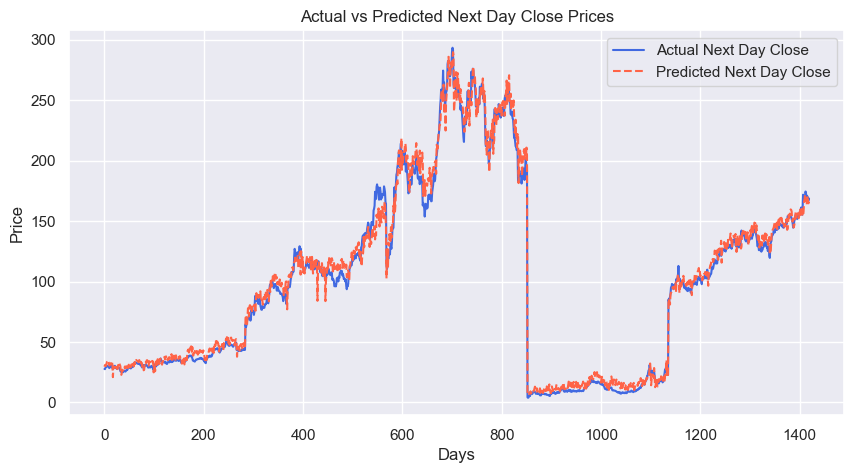

In [63]:
# Plot
sns.set(style="darkgrid")
plt.figure(figsize=(10, 5))  # Set the figure size

plt.plot(actuals_np, label='Actual Next Day Close', color='royalblue', linestyle='-')  # Actual values line
plt.plot(predictions_np, label='Predicted Next Day Close', color='tomato', linestyle='--')  # Predicted values line

plt.title('Actual vs Predicted Next Day Close Prices')  # Title of the plot
plt.xlabel('Days')  # X-axis label
plt.ylabel('Price')  # Y-axis label
plt.legend()  # Show legend to differentiate between actual and predicted values

plt.show()

---

### Data Preparation For RNN & LSTM

In [64]:
data.head(3)

,Date,Open,High,Low,Close,Volume,Symbol,Next Day Close (Target),H-L,O-C,DayOfWeek,Month,7 DAYS MA
6,2014-01-10,25.500000,25.850000,25.50,25.530001,30588800,INTC,25.50,0.35,-0.030001,Friday,January,25.555714
7,2014-01-13,25.629999,25.990000,25.42,25.500000,40274500,INTC,26.51,0.57,0.129999,Monday,January,25.514286
8,2014-01-14,26.010000,26.549999,25.90,26.510000,74142900,INTC,26.67,0.65,-0.500000,Tuesday,January,25.618571


In [65]:
# Feature selection
data = data[['Date', 'Next Day Close (Target)']]

In [66]:
from copy import deepcopy as dc

def prepare_dataframe_for_time_series_forcasting(df, n_steps):
    """
    Prepares the input dataframe for RNN & LSTM training by creating lagged features.
    
    Parameters:
    - df: pandas.DataFrame, the input dataframe with stock data.
    - n_steps: int, the number of time steps to look back, creating lagged features.
    
    Returns:
    - pandas.DataFrame, the transformed dataframe ready for RNN & LSTM modeling.
    """
    
    df = dc(df)
    
    for i in range(1, n_steps+1):
        df[f'Next Day Close(t-{i})'] = df['Next Day Close (Target)'].shift(i)
        
    df.dropna(inplace=True)
    
    return df

lookback = 7  #instantiate lookback

# Apply the function to the dataset
shifted_df = prepare_dataframe_for_time_series_forcasting(data, lookback)

#display a sample
shifted_df.head(3)

,Date,Next Day Close (Target),Next Day Close(t-1),Next Day Close(t-2),Next Day Close(t-3),Next Day Close(t-4),Next Day Close(t-5),Next Day Close(t-6),Next Day Close(t-7)
13,2014-01-22,25.129999,25.309999,25.590000,25.850000,26.540001,26.670000,26.510000,25.50
14,2014-01-23,24.809999,25.129999,25.309999,25.590000,25.850000,26.540001,26.670000,26.51
15,2014-01-24,24.719999,24.809999,25.129999,25.309999,25.590000,25.850000,26.540001,26.67


In [67]:
shifted_df['Date'] = pd.to_datetime(shifted_df['Date'])  # Ensure 'Date' is in datetime format

split_date = pd.Timestamp('2023-01-01')   #samples from 2023 upwards should be used for testing

# Split the data into train and test sets
train = shifted_df.loc[data['Date'] <= split_date]
train.set_index('Date', inplace=True)  #set 'Date' as index

test = shifted_df.loc[data['Date'] > split_date]
test.set_index('Date', inplace=True)  #set 'Date' as index


In [68]:
# Convert train and test datsets to numpy arrays
train = train.to_numpy()
test = test.to_numpy()

train.shape, test.shape

((11293, 8), (1420, 8))

In [69]:
#Subset for features and labels in both Train and Test sets

#Train
X_train = train[:, 1:]  #all rows and all columns excluding the first column(the target)
y_train = train[:, 0]    #all rows and just the first colum 

#Test
X_test = test[:, 1:]     #all rows and all columns excluding the first column(the target)
y_test = test[:, 0]      #all rows and just the first colum 


X_train.shape, y_train.shape, X_test.shape, y_test.shape

((11293, 7), (11293,), (1420, 7), (1420,))

In [70]:
# Normalize the data

#instantiate a scaler 
scaler = MinMaxScaler(feature_range=(-1, 1))

# apply the transformation on the X_train and X_test
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# apply log transformation on the labels
y_train = np.log1p(y_train)
y_test = np.log1p(y_test)


In [71]:
# Reverse the order of the features for each stock dataset along the time axis (axis=1).
# This is done because RNN & LSTM networks process data points sequentially, and we want the network
# to receive the most recent data last, to more accurately predict the next day's stock price.

#Apply
X_train = dc(np.flip(X_train, axis=1))
X_test = dc(np.flip(X_test, axis=1))

In [72]:
# Reshape the training features to fit the RNN & LSTM input format: [samples, time steps, features]
X_train = X_train.reshape((-1, lookback, 1))

# Reshape the testing features
X_test = X_test.reshape((-1, lookback, 1))

# Reshape the training labels
y_train = y_train.reshape((-1, 1))

# Reshape the testing labels
y_test = y_test.reshape((-1, 1))

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((11293, 7, 1), (11293, 1), (1420, 7, 1), (1420, 1))

In [73]:
#convert numpy arrays to PyTorch tensors and ensure float data type, a suitable format for PyTorch
X_train = torch.tensor(X_train, dtype=torch.float)
y_train = torch.tensor(y_train, dtype=torch.float)
X_test = torch.tensor(X_test, dtype=torch.float)
y_test = torch.tensor(y_test, dtype=torch.float)


In [74]:
# Define a custom dataset class for RNN & LSTM
class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        # Store the input features and labels
        self.X = X
        self.y = y

    def __getitem__(self, i):
        # Return a single sample and its label
        return self.X[i], self.y[i]
    
    def __len__(self):
        # Return the total number of samples
        return len(self.X)
    
    
# Initialize the dataset with training and testing data
train_data = TimeSeriesDataset(X_train, y_train)
test_data = TimeSeriesDataset(X_test, y_test)

# Create data loaders for both training and testing datasets
train_loader = DataLoader(dataset=train_data, batch_size=16, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=16, shuffle=False)

In [75]:
# Helper functions to train and validate the model
def train_one_epoch(model, train_loader, loss_function, optimizer):
    model.train(True)
    print(f'Epoch: {epoch + 1}')
    running_loss = 0.0
    
    for batch_index, batch in enumerate(train_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)
        
        output = model(x_batch)
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print(f"Epoch: {epoch+1:03d}/{num_epochs:03d} | Batch: {batch_index+1:03d}/{len(train_loader):03d}",
             f" | Loss: {loss:.2f}")
    print()
    
    
def validate_one_epoch(model, test_loader, loss_function):
    model.train(False)
    running_loss = 0.0
    
    for batch_index, batch in enumerate(test_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)
        
        with torch.no_grad():
            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_across_batches = running_loss / len(test_loader)
    
    print('Val Loss: {0:.3f}'.format(avg_loss_across_batches))
    print('***************************************************')
    print()

---
## RNN

In [93]:
# device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the RNN architecture
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size=1):
        super(RNN, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
        
    #forward pass
    def forward(self, x):
        #initialize hidden_state with zeros
        h0 = torch.zeros(self.rnn.num_layers, x.size(0), self.rnn.hidden_size).to(x.device)
        out, _ = self.rnn(x, h0)
        
        # Pass the output of the last time step to the fully connected layer
        out = self.fc(out[:, -1, :])
        return out 
    

# Instantiate the RNN model
rnn_model = RNN(input_size=1, hidden_size=4, num_layers=2)

# Instantiate a loss function and an Optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(params=rnn_model.parameters(), lr=0.001)

In [94]:
# training loop for RNN model

num_epochs = 20

for epoch in range(num_epochs):
    # call the helper functions
    train_one_epoch(rnn_model, train_loader, criterion, optimizer)
    validate_one_epoch(rnn_model, test_loader, criterion)

Epoch: 1
Epoch: 001/020 | Batch: 001/706  | Loss: 15.99
Epoch: 001/020 | Batch: 002/706  | Loss: 16.66
Epoch: 001/020 | Batch: 003/706  | Loss: 16.34
Epoch: 001/020 | Batch: 004/706  | Loss: 17.73
Epoch: 001/020 | Batch: 005/706  | Loss: 20.00
Epoch: 001/020 | Batch: 006/706  | Loss: 13.54
Epoch: 001/020 | Batch: 007/706  | Loss: 12.63
Epoch: 001/020 | Batch: 008/706  | Loss: 18.81
Epoch: 001/020 | Batch: 009/706  | Loss: 13.55
Epoch: 001/020 | Batch: 010/706  | Loss: 12.05
Epoch: 001/020 | Batch: 011/706  | Loss: 14.81
Epoch: 001/020 | Batch: 012/706  | Loss: 11.64
Epoch: 001/020 | Batch: 013/706  | Loss: 14.21
Epoch: 001/020 | Batch: 014/706  | Loss: 13.25
Epoch: 001/020 | Batch: 015/706  | Loss: 13.30
Epoch: 001/020 | Batch: 016/706  | Loss: 14.96
Epoch: 001/020 | Batch: 017/706  | Loss: 14.72
Epoch: 001/020 | Batch: 018/706  | Loss: 12.64
Epoch: 001/020 | Batch: 019/706  | Loss: 16.55
Epoch: 001/020 | Batch: 020/706  | Loss: 16.81
Epoch: 001/020 | Batch: 021/706  | Loss: 10.21
Epoc

Epoch: 001/020 | Batch: 179/706  | Loss: 4.26
Epoch: 001/020 | Batch: 180/706  | Loss: 6.78
Epoch: 001/020 | Batch: 181/706  | Loss: 3.95
Epoch: 001/020 | Batch: 182/706  | Loss: 4.59
Epoch: 001/020 | Batch: 183/706  | Loss: 3.52
Epoch: 001/020 | Batch: 184/706  | Loss: 4.87
Epoch: 001/020 | Batch: 185/706  | Loss: 5.30
Epoch: 001/020 | Batch: 186/706  | Loss: 4.18
Epoch: 001/020 | Batch: 187/706  | Loss: 3.64
Epoch: 001/020 | Batch: 188/706  | Loss: 5.05
Epoch: 001/020 | Batch: 189/706  | Loss: 6.47
Epoch: 001/020 | Batch: 190/706  | Loss: 5.19
Epoch: 001/020 | Batch: 191/706  | Loss: 4.68
Epoch: 001/020 | Batch: 192/706  | Loss: 4.78
Epoch: 001/020 | Batch: 193/706  | Loss: 4.94
Epoch: 001/020 | Batch: 194/706  | Loss: 2.58
Epoch: 001/020 | Batch: 195/706  | Loss: 5.83
Epoch: 001/020 | Batch: 196/706  | Loss: 4.67
Epoch: 001/020 | Batch: 197/706  | Loss: 4.14
Epoch: 001/020 | Batch: 198/706  | Loss: 5.44
Epoch: 001/020 | Batch: 199/706  | Loss: 6.71
Epoch: 001/020 | Batch: 200/706  |

Epoch: 001/020 | Batch: 361/706  | Loss: 2.18
Epoch: 001/020 | Batch: 362/706  | Loss: 1.56
Epoch: 001/020 | Batch: 363/706  | Loss: 1.96
Epoch: 001/020 | Batch: 364/706  | Loss: 1.94
Epoch: 001/020 | Batch: 365/706  | Loss: 3.06
Epoch: 001/020 | Batch: 366/706  | Loss: 1.75
Epoch: 001/020 | Batch: 367/706  | Loss: 2.37
Epoch: 001/020 | Batch: 368/706  | Loss: 4.24
Epoch: 001/020 | Batch: 369/706  | Loss: 2.66
Epoch: 001/020 | Batch: 370/706  | Loss: 2.56
Epoch: 001/020 | Batch: 371/706  | Loss: 2.60
Epoch: 001/020 | Batch: 372/706  | Loss: 2.04
Epoch: 001/020 | Batch: 373/706  | Loss: 1.60
Epoch: 001/020 | Batch: 374/706  | Loss: 1.60
Epoch: 001/020 | Batch: 375/706  | Loss: 1.43
Epoch: 001/020 | Batch: 376/706  | Loss: 3.47
Epoch: 001/020 | Batch: 377/706  | Loss: 2.27
Epoch: 001/020 | Batch: 378/706  | Loss: 2.91
Epoch: 001/020 | Batch: 379/706  | Loss: 2.48
Epoch: 001/020 | Batch: 380/706  | Loss: 2.20
Epoch: 001/020 | Batch: 381/706  | Loss: 1.93
Epoch: 001/020 | Batch: 382/706  |

Epoch: 001/020 | Batch: 545/706  | Loss: 1.86
Epoch: 001/020 | Batch: 546/706  | Loss: 2.52
Epoch: 001/020 | Batch: 547/706  | Loss: 1.52
Epoch: 001/020 | Batch: 548/706  | Loss: 1.23
Epoch: 001/020 | Batch: 549/706  | Loss: 1.75
Epoch: 001/020 | Batch: 550/706  | Loss: 1.37
Epoch: 001/020 | Batch: 551/706  | Loss: 2.00
Epoch: 001/020 | Batch: 552/706  | Loss: 2.37
Epoch: 001/020 | Batch: 553/706  | Loss: 1.86
Epoch: 001/020 | Batch: 554/706  | Loss: 2.35
Epoch: 001/020 | Batch: 555/706  | Loss: 2.07
Epoch: 001/020 | Batch: 556/706  | Loss: 1.13
Epoch: 001/020 | Batch: 557/706  | Loss: 2.49
Epoch: 001/020 | Batch: 558/706  | Loss: 2.26
Epoch: 001/020 | Batch: 559/706  | Loss: 1.61
Epoch: 001/020 | Batch: 560/706  | Loss: 1.88
Epoch: 001/020 | Batch: 561/706  | Loss: 1.41
Epoch: 001/020 | Batch: 562/706  | Loss: 0.84
Epoch: 001/020 | Batch: 563/706  | Loss: 1.57
Epoch: 001/020 | Batch: 564/706  | Loss: 1.73
Epoch: 001/020 | Batch: 565/706  | Loss: 0.91
Epoch: 001/020 | Batch: 566/706  |

Epoch: 002/020 | Batch: 017/706  | Loss: 1.68
Epoch: 002/020 | Batch: 018/706  | Loss: 1.29
Epoch: 002/020 | Batch: 019/706  | Loss: 1.47
Epoch: 002/020 | Batch: 020/706  | Loss: 1.52
Epoch: 002/020 | Batch: 021/706  | Loss: 1.57
Epoch: 002/020 | Batch: 022/706  | Loss: 0.91
Epoch: 002/020 | Batch: 023/706  | Loss: 1.05
Epoch: 002/020 | Batch: 024/706  | Loss: 1.20
Epoch: 002/020 | Batch: 025/706  | Loss: 0.93
Epoch: 002/020 | Batch: 026/706  | Loss: 1.92
Epoch: 002/020 | Batch: 027/706  | Loss: 1.20
Epoch: 002/020 | Batch: 028/706  | Loss: 1.75
Epoch: 002/020 | Batch: 029/706  | Loss: 1.79
Epoch: 002/020 | Batch: 030/706  | Loss: 1.02
Epoch: 002/020 | Batch: 031/706  | Loss: 1.08
Epoch: 002/020 | Batch: 032/706  | Loss: 1.29
Epoch: 002/020 | Batch: 033/706  | Loss: 1.18
Epoch: 002/020 | Batch: 034/706  | Loss: 0.90
Epoch: 002/020 | Batch: 035/706  | Loss: 0.86
Epoch: 002/020 | Batch: 036/706  | Loss: 1.12
Epoch: 002/020 | Batch: 037/706  | Loss: 1.49
Epoch: 002/020 | Batch: 038/706  |

Epoch: 002/020 | Batch: 206/706  | Loss: 1.64
Epoch: 002/020 | Batch: 207/706  | Loss: 1.48
Epoch: 002/020 | Batch: 208/706  | Loss: 1.10
Epoch: 002/020 | Batch: 209/706  | Loss: 1.65
Epoch: 002/020 | Batch: 210/706  | Loss: 1.42
Epoch: 002/020 | Batch: 211/706  | Loss: 0.65
Epoch: 002/020 | Batch: 212/706  | Loss: 1.79
Epoch: 002/020 | Batch: 213/706  | Loss: 0.44
Epoch: 002/020 | Batch: 214/706  | Loss: 1.29
Epoch: 002/020 | Batch: 215/706  | Loss: 1.32
Epoch: 002/020 | Batch: 216/706  | Loss: 1.45
Epoch: 002/020 | Batch: 217/706  | Loss: 1.50
Epoch: 002/020 | Batch: 218/706  | Loss: 0.82
Epoch: 002/020 | Batch: 219/706  | Loss: 0.86
Epoch: 002/020 | Batch: 220/706  | Loss: 1.63
Epoch: 002/020 | Batch: 221/706  | Loss: 1.76
Epoch: 002/020 | Batch: 222/706  | Loss: 0.31
Epoch: 002/020 | Batch: 223/706  | Loss: 1.26
Epoch: 002/020 | Batch: 224/706  | Loss: 1.20
Epoch: 002/020 | Batch: 225/706  | Loss: 1.28
Epoch: 002/020 | Batch: 226/706  | Loss: 0.88
Epoch: 002/020 | Batch: 227/706  |

Epoch: 002/020 | Batch: 393/706  | Loss: 0.91
Epoch: 002/020 | Batch: 394/706  | Loss: 2.20
Epoch: 002/020 | Batch: 395/706  | Loss: 1.17
Epoch: 002/020 | Batch: 396/706  | Loss: 0.85
Epoch: 002/020 | Batch: 397/706  | Loss: 1.94
Epoch: 002/020 | Batch: 398/706  | Loss: 1.30
Epoch: 002/020 | Batch: 399/706  | Loss: 1.47
Epoch: 002/020 | Batch: 400/706  | Loss: 1.23
Epoch: 002/020 | Batch: 401/706  | Loss: 1.39
Epoch: 002/020 | Batch: 402/706  | Loss: 1.27
Epoch: 002/020 | Batch: 403/706  | Loss: 1.09
Epoch: 002/020 | Batch: 404/706  | Loss: 0.86
Epoch: 002/020 | Batch: 405/706  | Loss: 1.74
Epoch: 002/020 | Batch: 406/706  | Loss: 1.07
Epoch: 002/020 | Batch: 407/706  | Loss: 1.73
Epoch: 002/020 | Batch: 408/706  | Loss: 0.79
Epoch: 002/020 | Batch: 409/706  | Loss: 1.41
Epoch: 002/020 | Batch: 410/706  | Loss: 1.03
Epoch: 002/020 | Batch: 411/706  | Loss: 1.39
Epoch: 002/020 | Batch: 412/706  | Loss: 0.78
Epoch: 002/020 | Batch: 413/706  | Loss: 1.42
Epoch: 002/020 | Batch: 414/706  |

Epoch: 002/020 | Batch: 583/706  | Loss: 1.23
Epoch: 002/020 | Batch: 584/706  | Loss: 1.11
Epoch: 002/020 | Batch: 585/706  | Loss: 1.42
Epoch: 002/020 | Batch: 586/706  | Loss: 1.43
Epoch: 002/020 | Batch: 587/706  | Loss: 1.05
Epoch: 002/020 | Batch: 588/706  | Loss: 1.46
Epoch: 002/020 | Batch: 589/706  | Loss: 1.22
Epoch: 002/020 | Batch: 590/706  | Loss: 0.98
Epoch: 002/020 | Batch: 591/706  | Loss: 0.37
Epoch: 002/020 | Batch: 592/706  | Loss: 1.45
Epoch: 002/020 | Batch: 593/706  | Loss: 1.41
Epoch: 002/020 | Batch: 594/706  | Loss: 1.49
Epoch: 002/020 | Batch: 595/706  | Loss: 1.73
Epoch: 002/020 | Batch: 596/706  | Loss: 1.03
Epoch: 002/020 | Batch: 597/706  | Loss: 0.74
Epoch: 002/020 | Batch: 598/706  | Loss: 0.64
Epoch: 002/020 | Batch: 599/706  | Loss: 1.48
Epoch: 002/020 | Batch: 600/706  | Loss: 1.44
Epoch: 002/020 | Batch: 601/706  | Loss: 0.99
Epoch: 002/020 | Batch: 602/706  | Loss: 1.20
Epoch: 002/020 | Batch: 603/706  | Loss: 0.29
Epoch: 002/020 | Batch: 604/706  |

Epoch: 003/020 | Batch: 080/706  | Loss: 0.93
Epoch: 003/020 | Batch: 081/706  | Loss: 0.45
Epoch: 003/020 | Batch: 082/706  | Loss: 0.68
Epoch: 003/020 | Batch: 083/706  | Loss: 1.98
Epoch: 003/020 | Batch: 084/706  | Loss: 1.49
Epoch: 003/020 | Batch: 085/706  | Loss: 1.37
Epoch: 003/020 | Batch: 086/706  | Loss: 1.31
Epoch: 003/020 | Batch: 087/706  | Loss: 0.99
Epoch: 003/020 | Batch: 088/706  | Loss: 1.23
Epoch: 003/020 | Batch: 089/706  | Loss: 1.28
Epoch: 003/020 | Batch: 090/706  | Loss: 0.93
Epoch: 003/020 | Batch: 091/706  | Loss: 1.82
Epoch: 003/020 | Batch: 092/706  | Loss: 1.21
Epoch: 003/020 | Batch: 093/706  | Loss: 1.33
Epoch: 003/020 | Batch: 094/706  | Loss: 0.75
Epoch: 003/020 | Batch: 095/706  | Loss: 2.03
Epoch: 003/020 | Batch: 096/706  | Loss: 2.76
Epoch: 003/020 | Batch: 097/706  | Loss: 0.92
Epoch: 003/020 | Batch: 098/706  | Loss: 1.36
Epoch: 003/020 | Batch: 099/706  | Loss: 1.26
Epoch: 003/020 | Batch: 100/706  | Loss: 1.51
Epoch: 003/020 | Batch: 101/706  |

Epoch: 003/020 | Batch: 308/706  | Loss: 0.88
Epoch: 003/020 | Batch: 309/706  | Loss: 1.70
Epoch: 003/020 | Batch: 310/706  | Loss: 1.98
Epoch: 003/020 | Batch: 311/706  | Loss: 1.18
Epoch: 003/020 | Batch: 312/706  | Loss: 0.72
Epoch: 003/020 | Batch: 313/706  | Loss: 0.86
Epoch: 003/020 | Batch: 314/706  | Loss: 0.78
Epoch: 003/020 | Batch: 315/706  | Loss: 3.10
Epoch: 003/020 | Batch: 316/706  | Loss: 1.52
Epoch: 003/020 | Batch: 317/706  | Loss: 1.42
Epoch: 003/020 | Batch: 318/706  | Loss: 1.99
Epoch: 003/020 | Batch: 319/706  | Loss: 1.15
Epoch: 003/020 | Batch: 320/706  | Loss: 1.01
Epoch: 003/020 | Batch: 321/706  | Loss: 1.44
Epoch: 003/020 | Batch: 322/706  | Loss: 1.24
Epoch: 003/020 | Batch: 323/706  | Loss: 1.16
Epoch: 003/020 | Batch: 324/706  | Loss: 1.20
Epoch: 003/020 | Batch: 325/706  | Loss: 1.71
Epoch: 003/020 | Batch: 326/706  | Loss: 1.34
Epoch: 003/020 | Batch: 327/706  | Loss: 1.76
Epoch: 003/020 | Batch: 328/706  | Loss: 1.96
Epoch: 003/020 | Batch: 329/706  |

Epoch: 003/020 | Batch: 533/706  | Loss: 1.59
Epoch: 003/020 | Batch: 534/706  | Loss: 1.60
Epoch: 003/020 | Batch: 535/706  | Loss: 1.20
Epoch: 003/020 | Batch: 536/706  | Loss: 2.54
Epoch: 003/020 | Batch: 537/706  | Loss: 1.31
Epoch: 003/020 | Batch: 538/706  | Loss: 1.27
Epoch: 003/020 | Batch: 539/706  | Loss: 1.51
Epoch: 003/020 | Batch: 540/706  | Loss: 2.74
Epoch: 003/020 | Batch: 541/706  | Loss: 1.19
Epoch: 003/020 | Batch: 542/706  | Loss: 1.01
Epoch: 003/020 | Batch: 543/706  | Loss: 1.12
Epoch: 003/020 | Batch: 544/706  | Loss: 1.28
Epoch: 003/020 | Batch: 545/706  | Loss: 1.27
Epoch: 003/020 | Batch: 546/706  | Loss: 1.53
Epoch: 003/020 | Batch: 547/706  | Loss: 0.85
Epoch: 003/020 | Batch: 548/706  | Loss: 0.55
Epoch: 003/020 | Batch: 549/706  | Loss: 0.96
Epoch: 003/020 | Batch: 550/706  | Loss: 1.10
Epoch: 003/020 | Batch: 551/706  | Loss: 1.15
Epoch: 003/020 | Batch: 552/706  | Loss: 0.65
Epoch: 003/020 | Batch: 553/706  | Loss: 1.00
Epoch: 003/020 | Batch: 554/706  |

Epoch: 004/020 | Batch: 018/706  | Loss: 1.10
Epoch: 004/020 | Batch: 019/706  | Loss: 1.86
Epoch: 004/020 | Batch: 020/706  | Loss: 1.22
Epoch: 004/020 | Batch: 021/706  | Loss: 0.89
Epoch: 004/020 | Batch: 022/706  | Loss: 1.45
Epoch: 004/020 | Batch: 023/706  | Loss: 1.73
Epoch: 004/020 | Batch: 024/706  | Loss: 2.35
Epoch: 004/020 | Batch: 025/706  | Loss: 1.42
Epoch: 004/020 | Batch: 026/706  | Loss: 1.14
Epoch: 004/020 | Batch: 027/706  | Loss: 1.68
Epoch: 004/020 | Batch: 028/706  | Loss: 1.22
Epoch: 004/020 | Batch: 029/706  | Loss: 0.66
Epoch: 004/020 | Batch: 030/706  | Loss: 0.89
Epoch: 004/020 | Batch: 031/706  | Loss: 1.78
Epoch: 004/020 | Batch: 032/706  | Loss: 1.02
Epoch: 004/020 | Batch: 033/706  | Loss: 0.84
Epoch: 004/020 | Batch: 034/706  | Loss: 1.27
Epoch: 004/020 | Batch: 035/706  | Loss: 0.90
Epoch: 004/020 | Batch: 036/706  | Loss: 1.86
Epoch: 004/020 | Batch: 037/706  | Loss: 1.53
Epoch: 004/020 | Batch: 038/706  | Loss: 0.75
Epoch: 004/020 | Batch: 039/706  |

Epoch: 004/020 | Batch: 250/706  | Loss: 0.66
Epoch: 004/020 | Batch: 251/706  | Loss: 1.56
Epoch: 004/020 | Batch: 252/706  | Loss: 1.09
Epoch: 004/020 | Batch: 253/706  | Loss: 1.82
Epoch: 004/020 | Batch: 254/706  | Loss: 0.81
Epoch: 004/020 | Batch: 255/706  | Loss: 1.95
Epoch: 004/020 | Batch: 256/706  | Loss: 1.14
Epoch: 004/020 | Batch: 257/706  | Loss: 1.40
Epoch: 004/020 | Batch: 258/706  | Loss: 1.02
Epoch: 004/020 | Batch: 259/706  | Loss: 1.19
Epoch: 004/020 | Batch: 260/706  | Loss: 1.21
Epoch: 004/020 | Batch: 261/706  | Loss: 1.61
Epoch: 004/020 | Batch: 262/706  | Loss: 0.76
Epoch: 004/020 | Batch: 263/706  | Loss: 1.53
Epoch: 004/020 | Batch: 264/706  | Loss: 2.05
Epoch: 004/020 | Batch: 265/706  | Loss: 1.05
Epoch: 004/020 | Batch: 266/706  | Loss: 1.20
Epoch: 004/020 | Batch: 267/706  | Loss: 1.27
Epoch: 004/020 | Batch: 268/706  | Loss: 1.32
Epoch: 004/020 | Batch: 269/706  | Loss: 0.90
Epoch: 004/020 | Batch: 270/706  | Loss: 1.26
Epoch: 004/020 | Batch: 271/706  |

Epoch: 004/020 | Batch: 473/706  | Loss: 1.94
Epoch: 004/020 | Batch: 474/706  | Loss: 1.78
Epoch: 004/020 | Batch: 475/706  | Loss: 1.19
Epoch: 004/020 | Batch: 476/706  | Loss: 0.80
Epoch: 004/020 | Batch: 477/706  | Loss: 0.75
Epoch: 004/020 | Batch: 478/706  | Loss: 1.69
Epoch: 004/020 | Batch: 479/706  | Loss: 1.46
Epoch: 004/020 | Batch: 480/706  | Loss: 1.46
Epoch: 004/020 | Batch: 481/706  | Loss: 2.03
Epoch: 004/020 | Batch: 482/706  | Loss: 0.60
Epoch: 004/020 | Batch: 483/706  | Loss: 2.06
Epoch: 004/020 | Batch: 484/706  | Loss: 0.92
Epoch: 004/020 | Batch: 485/706  | Loss: 2.23
Epoch: 004/020 | Batch: 486/706  | Loss: 1.22
Epoch: 004/020 | Batch: 487/706  | Loss: 1.96
Epoch: 004/020 | Batch: 488/706  | Loss: 1.42
Epoch: 004/020 | Batch: 489/706  | Loss: 0.79
Epoch: 004/020 | Batch: 490/706  | Loss: 1.44
Epoch: 004/020 | Batch: 491/706  | Loss: 1.36
Epoch: 004/020 | Batch: 492/706  | Loss: 1.21
Epoch: 004/020 | Batch: 493/706  | Loss: 1.99
Epoch: 004/020 | Batch: 494/706  |

Epoch: 004/020 | Batch: 677/706  | Loss: 2.15
Epoch: 004/020 | Batch: 678/706  | Loss: 1.18
Epoch: 004/020 | Batch: 679/706  | Loss: 1.51
Epoch: 004/020 | Batch: 680/706  | Loss: 0.87
Epoch: 004/020 | Batch: 681/706  | Loss: 0.72
Epoch: 004/020 | Batch: 682/706  | Loss: 1.26
Epoch: 004/020 | Batch: 683/706  | Loss: 1.11
Epoch: 004/020 | Batch: 684/706  | Loss: 0.72
Epoch: 004/020 | Batch: 685/706  | Loss: 0.63
Epoch: 004/020 | Batch: 686/706  | Loss: 1.20
Epoch: 004/020 | Batch: 687/706  | Loss: 1.44
Epoch: 004/020 | Batch: 688/706  | Loss: 2.03
Epoch: 004/020 | Batch: 689/706  | Loss: 0.83
Epoch: 004/020 | Batch: 690/706  | Loss: 1.10
Epoch: 004/020 | Batch: 691/706  | Loss: 0.99
Epoch: 004/020 | Batch: 692/706  | Loss: 2.21
Epoch: 004/020 | Batch: 693/706  | Loss: 0.90
Epoch: 004/020 | Batch: 694/706  | Loss: 1.84
Epoch: 004/020 | Batch: 695/706  | Loss: 0.87
Epoch: 004/020 | Batch: 696/706  | Loss: 1.65
Epoch: 004/020 | Batch: 697/706  | Loss: 2.31
Epoch: 004/020 | Batch: 698/706  |

Epoch: 005/020 | Batch: 174/706  | Loss: 1.59
Epoch: 005/020 | Batch: 175/706  | Loss: 0.58
Epoch: 005/020 | Batch: 176/706  | Loss: 0.66
Epoch: 005/020 | Batch: 177/706  | Loss: 1.03
Epoch: 005/020 | Batch: 178/706  | Loss: 1.21
Epoch: 005/020 | Batch: 179/706  | Loss: 1.53
Epoch: 005/020 | Batch: 180/706  | Loss: 1.41
Epoch: 005/020 | Batch: 181/706  | Loss: 0.76
Epoch: 005/020 | Batch: 182/706  | Loss: 0.82
Epoch: 005/020 | Batch: 183/706  | Loss: 1.36
Epoch: 005/020 | Batch: 184/706  | Loss: 1.42
Epoch: 005/020 | Batch: 185/706  | Loss: 1.18
Epoch: 005/020 | Batch: 186/706  | Loss: 0.62
Epoch: 005/020 | Batch: 187/706  | Loss: 2.16
Epoch: 005/020 | Batch: 188/706  | Loss: 1.68
Epoch: 005/020 | Batch: 189/706  | Loss: 1.23
Epoch: 005/020 | Batch: 190/706  | Loss: 0.73
Epoch: 005/020 | Batch: 191/706  | Loss: 1.97
Epoch: 005/020 | Batch: 192/706  | Loss: 1.71
Epoch: 005/020 | Batch: 193/706  | Loss: 1.66
Epoch: 005/020 | Batch: 194/706  | Loss: 2.36
Epoch: 005/020 | Batch: 195/706  |

Epoch: 005/020 | Batch: 391/706  | Loss: 0.90
Epoch: 005/020 | Batch: 392/706  | Loss: 1.82
Epoch: 005/020 | Batch: 393/706  | Loss: 1.85
Epoch: 005/020 | Batch: 394/706  | Loss: 0.95
Epoch: 005/020 | Batch: 395/706  | Loss: 0.95
Epoch: 005/020 | Batch: 396/706  | Loss: 1.64
Epoch: 005/020 | Batch: 397/706  | Loss: 1.23
Epoch: 005/020 | Batch: 398/706  | Loss: 1.21
Epoch: 005/020 | Batch: 399/706  | Loss: 1.34
Epoch: 005/020 | Batch: 400/706  | Loss: 0.77
Epoch: 005/020 | Batch: 401/706  | Loss: 3.05
Epoch: 005/020 | Batch: 402/706  | Loss: 1.30
Epoch: 005/020 | Batch: 403/706  | Loss: 1.88
Epoch: 005/020 | Batch: 404/706  | Loss: 1.43
Epoch: 005/020 | Batch: 405/706  | Loss: 0.86
Epoch: 005/020 | Batch: 406/706  | Loss: 0.71
Epoch: 005/020 | Batch: 407/706  | Loss: 0.67
Epoch: 005/020 | Batch: 408/706  | Loss: 1.01
Epoch: 005/020 | Batch: 409/706  | Loss: 0.86
Epoch: 005/020 | Batch: 410/706  | Loss: 1.49
Epoch: 005/020 | Batch: 411/706  | Loss: 1.44
Epoch: 005/020 | Batch: 412/706  |

Epoch: 005/020 | Batch: 606/706  | Loss: 0.18
Epoch: 005/020 | Batch: 607/706  | Loss: 0.24
Epoch: 005/020 | Batch: 608/706  | Loss: 0.46
Epoch: 005/020 | Batch: 609/706  | Loss: 0.37
Epoch: 005/020 | Batch: 610/706  | Loss: 0.75
Epoch: 005/020 | Batch: 611/706  | Loss: 0.28
Epoch: 005/020 | Batch: 612/706  | Loss: 0.43
Epoch: 005/020 | Batch: 613/706  | Loss: 0.29
Epoch: 005/020 | Batch: 614/706  | Loss: 0.23
Epoch: 005/020 | Batch: 615/706  | Loss: 0.32
Epoch: 005/020 | Batch: 616/706  | Loss: 0.19
Epoch: 005/020 | Batch: 617/706  | Loss: 0.25
Epoch: 005/020 | Batch: 618/706  | Loss: 0.36
Epoch: 005/020 | Batch: 619/706  | Loss: 0.35
Epoch: 005/020 | Batch: 620/706  | Loss: 0.43
Epoch: 005/020 | Batch: 621/706  | Loss: 0.28
Epoch: 005/020 | Batch: 622/706  | Loss: 0.29
Epoch: 005/020 | Batch: 623/706  | Loss: 0.26
Epoch: 005/020 | Batch: 624/706  | Loss: 0.71
Epoch: 005/020 | Batch: 625/706  | Loss: 0.20
Epoch: 005/020 | Batch: 626/706  | Loss: 0.23
Epoch: 005/020 | Batch: 627/706  |

Epoch: 006/020 | Batch: 098/706  | Loss: 0.08
Epoch: 006/020 | Batch: 099/706  | Loss: 0.10
Epoch: 006/020 | Batch: 100/706  | Loss: 0.01
Epoch: 006/020 | Batch: 101/706  | Loss: 0.10
Epoch: 006/020 | Batch: 102/706  | Loss: 0.01
Epoch: 006/020 | Batch: 103/706  | Loss: 0.25
Epoch: 006/020 | Batch: 104/706  | Loss: 0.15
Epoch: 006/020 | Batch: 105/706  | Loss: 0.26
Epoch: 006/020 | Batch: 106/706  | Loss: 0.02
Epoch: 006/020 | Batch: 107/706  | Loss: 0.12
Epoch: 006/020 | Batch: 108/706  | Loss: 0.08
Epoch: 006/020 | Batch: 109/706  | Loss: 0.27
Epoch: 006/020 | Batch: 110/706  | Loss: 0.08
Epoch: 006/020 | Batch: 111/706  | Loss: 0.18
Epoch: 006/020 | Batch: 112/706  | Loss: 0.11
Epoch: 006/020 | Batch: 113/706  | Loss: 0.33
Epoch: 006/020 | Batch: 114/706  | Loss: 0.35
Epoch: 006/020 | Batch: 115/706  | Loss: 0.27
Epoch: 006/020 | Batch: 116/706  | Loss: 0.01
Epoch: 006/020 | Batch: 117/706  | Loss: 0.05
Epoch: 006/020 | Batch: 118/706  | Loss: 0.24
Epoch: 006/020 | Batch: 119/706  |

Epoch: 006/020 | Batch: 285/706  | Loss: 0.05
Epoch: 006/020 | Batch: 286/706  | Loss: 0.16
Epoch: 006/020 | Batch: 287/706  | Loss: 0.06
Epoch: 006/020 | Batch: 288/706  | Loss: 0.05
Epoch: 006/020 | Batch: 289/706  | Loss: 0.17
Epoch: 006/020 | Batch: 290/706  | Loss: 0.03
Epoch: 006/020 | Batch: 291/706  | Loss: 0.31
Epoch: 006/020 | Batch: 292/706  | Loss: 0.16
Epoch: 006/020 | Batch: 293/706  | Loss: 0.20
Epoch: 006/020 | Batch: 294/706  | Loss: 0.38
Epoch: 006/020 | Batch: 295/706  | Loss: 0.17
Epoch: 006/020 | Batch: 296/706  | Loss: 0.08
Epoch: 006/020 | Batch: 297/706  | Loss: 0.16
Epoch: 006/020 | Batch: 298/706  | Loss: 0.03
Epoch: 006/020 | Batch: 299/706  | Loss: 0.06
Epoch: 006/020 | Batch: 300/706  | Loss: 0.07
Epoch: 006/020 | Batch: 301/706  | Loss: 0.03
Epoch: 006/020 | Batch: 302/706  | Loss: 0.02
Epoch: 006/020 | Batch: 303/706  | Loss: 0.12
Epoch: 006/020 | Batch: 304/706  | Loss: 0.13
Epoch: 006/020 | Batch: 305/706  | Loss: 0.13
Epoch: 006/020 | Batch: 306/706  |

Epoch: 006/020 | Batch: 480/706  | Loss: 0.02
Epoch: 006/020 | Batch: 481/706  | Loss: 0.10
Epoch: 006/020 | Batch: 482/706  | Loss: 0.10
Epoch: 006/020 | Batch: 483/706  | Loss: 0.01
Epoch: 006/020 | Batch: 484/706  | Loss: 0.02
Epoch: 006/020 | Batch: 485/706  | Loss: 0.04
Epoch: 006/020 | Batch: 486/706  | Loss: 0.07
Epoch: 006/020 | Batch: 487/706  | Loss: 0.07
Epoch: 006/020 | Batch: 488/706  | Loss: 0.07
Epoch: 006/020 | Batch: 489/706  | Loss: 0.07
Epoch: 006/020 | Batch: 490/706  | Loss: 0.02
Epoch: 006/020 | Batch: 491/706  | Loss: 0.04
Epoch: 006/020 | Batch: 492/706  | Loss: 0.12
Epoch: 006/020 | Batch: 493/706  | Loss: 0.01
Epoch: 006/020 | Batch: 494/706  | Loss: 0.19
Epoch: 006/020 | Batch: 495/706  | Loss: 0.25
Epoch: 006/020 | Batch: 496/706  | Loss: 0.13
Epoch: 006/020 | Batch: 497/706  | Loss: 0.02
Epoch: 006/020 | Batch: 498/706  | Loss: 0.10
Epoch: 006/020 | Batch: 499/706  | Loss: 0.02
Epoch: 006/020 | Batch: 500/706  | Loss: 0.11
Epoch: 006/020 | Batch: 501/706  |

Val Loss: 0.099
***************************************************

Epoch: 7
Epoch: 007/020 | Batch: 001/706  | Loss: 0.04
Epoch: 007/020 | Batch: 002/706  | Loss: 0.04
Epoch: 007/020 | Batch: 003/706  | Loss: 0.13
Epoch: 007/020 | Batch: 004/706  | Loss: 0.13
Epoch: 007/020 | Batch: 005/706  | Loss: 0.10
Epoch: 007/020 | Batch: 006/706  | Loss: 0.02
Epoch: 007/020 | Batch: 007/706  | Loss: 0.02
Epoch: 007/020 | Batch: 008/706  | Loss: 0.02
Epoch: 007/020 | Batch: 009/706  | Loss: 0.11
Epoch: 007/020 | Batch: 010/706  | Loss: 0.26
Epoch: 007/020 | Batch: 011/706  | Loss: 0.16
Epoch: 007/020 | Batch: 012/706  | Loss: 0.16
Epoch: 007/020 | Batch: 013/706  | Loss: 0.11
Epoch: 007/020 | Batch: 014/706  | Loss: 0.03
Epoch: 007/020 | Batch: 015/706  | Loss: 0.13
Epoch: 007/020 | Batch: 016/706  | Loss: 0.17
Epoch: 007/020 | Batch: 017/706  | Loss: 0.12
Epoch: 007/020 | Batch: 018/706  | Loss: 0.07
Epoch: 007/020 | Batch: 019/706  | Loss: 0.01
Epoch: 007/020 | Batch: 020/706  | Loss: 0.05
Ep

Epoch: 007/020 | Batch: 210/706  | Loss: 0.02
Epoch: 007/020 | Batch: 211/706  | Loss: 0.09
Epoch: 007/020 | Batch: 212/706  | Loss: 0.05
Epoch: 007/020 | Batch: 213/706  | Loss: 0.02
Epoch: 007/020 | Batch: 214/706  | Loss: 0.04
Epoch: 007/020 | Batch: 215/706  | Loss: 0.30
Epoch: 007/020 | Batch: 216/706  | Loss: 0.06
Epoch: 007/020 | Batch: 217/706  | Loss: 0.06
Epoch: 007/020 | Batch: 218/706  | Loss: 0.06
Epoch: 007/020 | Batch: 219/706  | Loss: 0.02
Epoch: 007/020 | Batch: 220/706  | Loss: 0.03
Epoch: 007/020 | Batch: 221/706  | Loss: 0.03
Epoch: 007/020 | Batch: 222/706  | Loss: 0.08
Epoch: 007/020 | Batch: 223/706  | Loss: 0.07
Epoch: 007/020 | Batch: 224/706  | Loss: 0.02
Epoch: 007/020 | Batch: 225/706  | Loss: 0.02
Epoch: 007/020 | Batch: 226/706  | Loss: 0.05
Epoch: 007/020 | Batch: 227/706  | Loss: 0.08
Epoch: 007/020 | Batch: 228/706  | Loss: 0.01
Epoch: 007/020 | Batch: 229/706  | Loss: 0.13
Epoch: 007/020 | Batch: 230/706  | Loss: 0.04
Epoch: 007/020 | Batch: 231/706  |

Epoch: 007/020 | Batch: 446/706  | Loss: 0.10
Epoch: 007/020 | Batch: 447/706  | Loss: 0.14
Epoch: 007/020 | Batch: 448/706  | Loss: 0.16
Epoch: 007/020 | Batch: 449/706  | Loss: 0.06
Epoch: 007/020 | Batch: 450/706  | Loss: 0.03
Epoch: 007/020 | Batch: 451/706  | Loss: 0.09
Epoch: 007/020 | Batch: 452/706  | Loss: 0.06
Epoch: 007/020 | Batch: 453/706  | Loss: 0.05
Epoch: 007/020 | Batch: 454/706  | Loss: 0.05
Epoch: 007/020 | Batch: 455/706  | Loss: 0.01
Epoch: 007/020 | Batch: 456/706  | Loss: 0.06
Epoch: 007/020 | Batch: 457/706  | Loss: 0.03
Epoch: 007/020 | Batch: 458/706  | Loss: 0.28
Epoch: 007/020 | Batch: 459/706  | Loss: 0.01
Epoch: 007/020 | Batch: 460/706  | Loss: 0.01
Epoch: 007/020 | Batch: 461/706  | Loss: 0.02
Epoch: 007/020 | Batch: 462/706  | Loss: 0.05
Epoch: 007/020 | Batch: 463/706  | Loss: 0.01
Epoch: 007/020 | Batch: 464/706  | Loss: 0.07
Epoch: 007/020 | Batch: 465/706  | Loss: 0.02
Epoch: 007/020 | Batch: 466/706  | Loss: 0.34
Epoch: 007/020 | Batch: 467/706  |

Epoch: 007/020 | Batch: 644/706  | Loss: 0.05
Epoch: 007/020 | Batch: 645/706  | Loss: 0.02
Epoch: 007/020 | Batch: 646/706  | Loss: 0.04
Epoch: 007/020 | Batch: 647/706  | Loss: 0.12
Epoch: 007/020 | Batch: 648/706  | Loss: 0.05
Epoch: 007/020 | Batch: 649/706  | Loss: 0.01
Epoch: 007/020 | Batch: 650/706  | Loss: 0.01
Epoch: 007/020 | Batch: 651/706  | Loss: 0.05
Epoch: 007/020 | Batch: 652/706  | Loss: 0.04
Epoch: 007/020 | Batch: 653/706  | Loss: 0.18
Epoch: 007/020 | Batch: 654/706  | Loss: 0.03
Epoch: 007/020 | Batch: 655/706  | Loss: 0.00
Epoch: 007/020 | Batch: 656/706  | Loss: 0.08
Epoch: 007/020 | Batch: 657/706  | Loss: 0.06
Epoch: 007/020 | Batch: 658/706  | Loss: 0.01
Epoch: 007/020 | Batch: 659/706  | Loss: 0.03
Epoch: 007/020 | Batch: 660/706  | Loss: 0.04
Epoch: 007/020 | Batch: 661/706  | Loss: 0.01
Epoch: 007/020 | Batch: 662/706  | Loss: 0.03
Epoch: 007/020 | Batch: 663/706  | Loss: 0.16
Epoch: 007/020 | Batch: 664/706  | Loss: 0.03
Epoch: 007/020 | Batch: 665/706  |

Epoch: 008/020 | Batch: 151/706  | Loss: 0.08
Epoch: 008/020 | Batch: 152/706  | Loss: 0.03
Epoch: 008/020 | Batch: 153/706  | Loss: 0.01
Epoch: 008/020 | Batch: 154/706  | Loss: 0.05
Epoch: 008/020 | Batch: 155/706  | Loss: 0.02
Epoch: 008/020 | Batch: 156/706  | Loss: 0.04
Epoch: 008/020 | Batch: 157/706  | Loss: 0.02
Epoch: 008/020 | Batch: 158/706  | Loss: 0.03
Epoch: 008/020 | Batch: 159/706  | Loss: 0.02
Epoch: 008/020 | Batch: 160/706  | Loss: 0.06
Epoch: 008/020 | Batch: 161/706  | Loss: 0.01
Epoch: 008/020 | Batch: 162/706  | Loss: 0.02
Epoch: 008/020 | Batch: 163/706  | Loss: 0.06
Epoch: 008/020 | Batch: 164/706  | Loss: 0.02
Epoch: 008/020 | Batch: 165/706  | Loss: 0.02
Epoch: 008/020 | Batch: 166/706  | Loss: 0.06
Epoch: 008/020 | Batch: 167/706  | Loss: 0.03
Epoch: 008/020 | Batch: 168/706  | Loss: 0.02
Epoch: 008/020 | Batch: 169/706  | Loss: 0.01
Epoch: 008/020 | Batch: 170/706  | Loss: 0.02
Epoch: 008/020 | Batch: 171/706  | Loss: 0.01
Epoch: 008/020 | Batch: 172/706  |

Epoch: 008/020 | Batch: 387/706  | Loss: 0.01
Epoch: 008/020 | Batch: 388/706  | Loss: 0.03
Epoch: 008/020 | Batch: 389/706  | Loss: 0.02
Epoch: 008/020 | Batch: 390/706  | Loss: 0.01
Epoch: 008/020 | Batch: 391/706  | Loss: 0.01
Epoch: 008/020 | Batch: 392/706  | Loss: 0.04
Epoch: 008/020 | Batch: 393/706  | Loss: 0.01
Epoch: 008/020 | Batch: 394/706  | Loss: 0.20
Epoch: 008/020 | Batch: 395/706  | Loss: 0.05
Epoch: 008/020 | Batch: 396/706  | Loss: 0.01
Epoch: 008/020 | Batch: 397/706  | Loss: 0.05
Epoch: 008/020 | Batch: 398/706  | Loss: 0.01
Epoch: 008/020 | Batch: 399/706  | Loss: 0.04
Epoch: 008/020 | Batch: 400/706  | Loss: 0.02
Epoch: 008/020 | Batch: 401/706  | Loss: 0.03
Epoch: 008/020 | Batch: 402/706  | Loss: 0.03
Epoch: 008/020 | Batch: 403/706  | Loss: 0.04
Epoch: 008/020 | Batch: 404/706  | Loss: 0.02
Epoch: 008/020 | Batch: 405/706  | Loss: 0.24
Epoch: 008/020 | Batch: 406/706  | Loss: 0.06
Epoch: 008/020 | Batch: 407/706  | Loss: 0.07
Epoch: 008/020 | Batch: 408/706  |

Epoch: 008/020 | Batch: 599/706  | Loss: 0.04
Epoch: 008/020 | Batch: 600/706  | Loss: 0.04
Epoch: 008/020 | Batch: 601/706  | Loss: 0.07
Epoch: 008/020 | Batch: 602/706  | Loss: 0.04
Epoch: 008/020 | Batch: 603/706  | Loss: 0.01
Epoch: 008/020 | Batch: 604/706  | Loss: 0.05
Epoch: 008/020 | Batch: 605/706  | Loss: 0.01
Epoch: 008/020 | Batch: 606/706  | Loss: 0.03
Epoch: 008/020 | Batch: 607/706  | Loss: 0.03
Epoch: 008/020 | Batch: 608/706  | Loss: 0.02
Epoch: 008/020 | Batch: 609/706  | Loss: 0.01
Epoch: 008/020 | Batch: 610/706  | Loss: 0.02
Epoch: 008/020 | Batch: 611/706  | Loss: 0.01
Epoch: 008/020 | Batch: 612/706  | Loss: 0.04
Epoch: 008/020 | Batch: 613/706  | Loss: 0.02
Epoch: 008/020 | Batch: 614/706  | Loss: 0.00
Epoch: 008/020 | Batch: 615/706  | Loss: 0.04
Epoch: 008/020 | Batch: 616/706  | Loss: 0.01
Epoch: 008/020 | Batch: 617/706  | Loss: 0.04
Epoch: 008/020 | Batch: 618/706  | Loss: 0.02
Epoch: 008/020 | Batch: 619/706  | Loss: 0.36
Epoch: 008/020 | Batch: 620/706  |

Epoch: 009/020 | Batch: 085/706  | Loss: 0.02
Epoch: 009/020 | Batch: 086/706  | Loss: 0.00
Epoch: 009/020 | Batch: 087/706  | Loss: 0.00
Epoch: 009/020 | Batch: 088/706  | Loss: 0.02
Epoch: 009/020 | Batch: 089/706  | Loss: 0.05
Epoch: 009/020 | Batch: 090/706  | Loss: 0.02
Epoch: 009/020 | Batch: 091/706  | Loss: 0.02
Epoch: 009/020 | Batch: 092/706  | Loss: 0.09
Epoch: 009/020 | Batch: 093/706  | Loss: 0.01
Epoch: 009/020 | Batch: 094/706  | Loss: 0.00
Epoch: 009/020 | Batch: 095/706  | Loss: 0.01
Epoch: 009/020 | Batch: 096/706  | Loss: 0.06
Epoch: 009/020 | Batch: 097/706  | Loss: 0.08
Epoch: 009/020 | Batch: 098/706  | Loss: 0.01
Epoch: 009/020 | Batch: 099/706  | Loss: 0.09
Epoch: 009/020 | Batch: 100/706  | Loss: 0.03
Epoch: 009/020 | Batch: 101/706  | Loss: 0.03
Epoch: 009/020 | Batch: 102/706  | Loss: 0.01
Epoch: 009/020 | Batch: 103/706  | Loss: 0.01
Epoch: 009/020 | Batch: 104/706  | Loss: 0.02
Epoch: 009/020 | Batch: 105/706  | Loss: 0.04
Epoch: 009/020 | Batch: 106/706  |

Epoch: 009/020 | Batch: 279/706  | Loss: 0.01
Epoch: 009/020 | Batch: 280/706  | Loss: 0.01
Epoch: 009/020 | Batch: 281/706  | Loss: 0.05
Epoch: 009/020 | Batch: 282/706  | Loss: 0.04
Epoch: 009/020 | Batch: 283/706  | Loss: 0.01
Epoch: 009/020 | Batch: 284/706  | Loss: 0.01
Epoch: 009/020 | Batch: 285/706  | Loss: 0.13
Epoch: 009/020 | Batch: 286/706  | Loss: 0.01
Epoch: 009/020 | Batch: 287/706  | Loss: 0.06
Epoch: 009/020 | Batch: 288/706  | Loss: 0.04
Epoch: 009/020 | Batch: 289/706  | Loss: 0.04
Epoch: 009/020 | Batch: 290/706  | Loss: 0.01
Epoch: 009/020 | Batch: 291/706  | Loss: 0.02
Epoch: 009/020 | Batch: 292/706  | Loss: 0.00
Epoch: 009/020 | Batch: 293/706  | Loss: 0.01
Epoch: 009/020 | Batch: 294/706  | Loss: 0.03
Epoch: 009/020 | Batch: 295/706  | Loss: 0.01
Epoch: 009/020 | Batch: 296/706  | Loss: 0.02
Epoch: 009/020 | Batch: 297/706  | Loss: 0.02
Epoch: 009/020 | Batch: 298/706  | Loss: 0.00
Epoch: 009/020 | Batch: 299/706  | Loss: 0.04
Epoch: 009/020 | Batch: 300/706  |

Epoch: 009/020 | Batch: 471/706  | Loss: 0.04
Epoch: 009/020 | Batch: 472/706  | Loss: 0.02
Epoch: 009/020 | Batch: 473/706  | Loss: 0.01
Epoch: 009/020 | Batch: 474/706  | Loss: 0.03
Epoch: 009/020 | Batch: 475/706  | Loss: 0.05
Epoch: 009/020 | Batch: 476/706  | Loss: 0.01
Epoch: 009/020 | Batch: 477/706  | Loss: 0.03
Epoch: 009/020 | Batch: 478/706  | Loss: 0.01
Epoch: 009/020 | Batch: 479/706  | Loss: 0.05
Epoch: 009/020 | Batch: 480/706  | Loss: 0.03
Epoch: 009/020 | Batch: 481/706  | Loss: 0.02
Epoch: 009/020 | Batch: 482/706  | Loss: 0.02
Epoch: 009/020 | Batch: 483/706  | Loss: 0.03
Epoch: 009/020 | Batch: 484/706  | Loss: 0.03
Epoch: 009/020 | Batch: 485/706  | Loss: 0.02
Epoch: 009/020 | Batch: 486/706  | Loss: 0.02
Epoch: 009/020 | Batch: 487/706  | Loss: 0.02
Epoch: 009/020 | Batch: 488/706  | Loss: 0.01
Epoch: 009/020 | Batch: 489/706  | Loss: 0.01
Epoch: 009/020 | Batch: 490/706  | Loss: 0.01
Epoch: 009/020 | Batch: 491/706  | Loss: 0.01
Epoch: 009/020 | Batch: 492/706  |

Epoch: 009/020 | Batch: 697/706  | Loss: 0.02
Epoch: 009/020 | Batch: 698/706  | Loss: 0.20
Epoch: 009/020 | Batch: 699/706  | Loss: 0.03
Epoch: 009/020 | Batch: 700/706  | Loss: 0.01
Epoch: 009/020 | Batch: 701/706  | Loss: 0.05
Epoch: 009/020 | Batch: 702/706  | Loss: 0.02
Epoch: 009/020 | Batch: 703/706  | Loss: 0.00
Epoch: 009/020 | Batch: 704/706  | Loss: 0.02
Epoch: 009/020 | Batch: 705/706  | Loss: 0.01
Epoch: 009/020 | Batch: 706/706  | Loss: 0.00

Val Loss: 0.022
***************************************************

Epoch: 10
Epoch: 010/020 | Batch: 001/706  | Loss: 0.04
Epoch: 010/020 | Batch: 002/706  | Loss: 0.02
Epoch: 010/020 | Batch: 003/706  | Loss: 0.01
Epoch: 010/020 | Batch: 004/706  | Loss: 0.01
Epoch: 010/020 | Batch: 005/706  | Loss: 0.02
Epoch: 010/020 | Batch: 006/706  | Loss: 0.00
Epoch: 010/020 | Batch: 007/706  | Loss: 0.01
Epoch: 010/020 | Batch: 008/706  | Loss: 0.01
Epoch: 010/020 | Batch: 009/706  | Loss: 0.01
Epoch: 010/020 | Batch: 010/706  | Loss: 0.02


Epoch: 010/020 | Batch: 189/706  | Loss: 0.03
Epoch: 010/020 | Batch: 190/706  | Loss: 0.01
Epoch: 010/020 | Batch: 191/706  | Loss: 0.05
Epoch: 010/020 | Batch: 192/706  | Loss: 0.05
Epoch: 010/020 | Batch: 193/706  | Loss: 0.02
Epoch: 010/020 | Batch: 194/706  | Loss: 0.01
Epoch: 010/020 | Batch: 195/706  | Loss: 0.01
Epoch: 010/020 | Batch: 196/706  | Loss: 0.04
Epoch: 010/020 | Batch: 197/706  | Loss: 0.03
Epoch: 010/020 | Batch: 198/706  | Loss: 0.02
Epoch: 010/020 | Batch: 199/706  | Loss: 0.07
Epoch: 010/020 | Batch: 200/706  | Loss: 0.02
Epoch: 010/020 | Batch: 201/706  | Loss: 0.04
Epoch: 010/020 | Batch: 202/706  | Loss: 0.01
Epoch: 010/020 | Batch: 203/706  | Loss: 0.10
Epoch: 010/020 | Batch: 204/706  | Loss: 0.01
Epoch: 010/020 | Batch: 205/706  | Loss: 0.01
Epoch: 010/020 | Batch: 206/706  | Loss: 0.04
Epoch: 010/020 | Batch: 207/706  | Loss: 0.01
Epoch: 010/020 | Batch: 208/706  | Loss: 0.05
Epoch: 010/020 | Batch: 209/706  | Loss: 0.08
Epoch: 010/020 | Batch: 210/706  |

Epoch: 010/020 | Batch: 417/706  | Loss: 0.01
Epoch: 010/020 | Batch: 418/706  | Loss: 0.02
Epoch: 010/020 | Batch: 419/706  | Loss: 0.02
Epoch: 010/020 | Batch: 420/706  | Loss: 0.01
Epoch: 010/020 | Batch: 421/706  | Loss: 0.00
Epoch: 010/020 | Batch: 422/706  | Loss: 0.01
Epoch: 010/020 | Batch: 423/706  | Loss: 0.02
Epoch: 010/020 | Batch: 424/706  | Loss: 0.02
Epoch: 010/020 | Batch: 425/706  | Loss: 0.04
Epoch: 010/020 | Batch: 426/706  | Loss: 0.05
Epoch: 010/020 | Batch: 427/706  | Loss: 0.03
Epoch: 010/020 | Batch: 428/706  | Loss: 0.03
Epoch: 010/020 | Batch: 429/706  | Loss: 0.01
Epoch: 010/020 | Batch: 430/706  | Loss: 0.16
Epoch: 010/020 | Batch: 431/706  | Loss: 0.02
Epoch: 010/020 | Batch: 432/706  | Loss: 0.00
Epoch: 010/020 | Batch: 433/706  | Loss: 0.01
Epoch: 010/020 | Batch: 434/706  | Loss: 0.03
Epoch: 010/020 | Batch: 435/706  | Loss: 0.08
Epoch: 010/020 | Batch: 436/706  | Loss: 0.01
Epoch: 010/020 | Batch: 437/706  | Loss: 0.00
Epoch: 010/020 | Batch: 438/706  |

Epoch: 010/020 | Batch: 619/706  | Loss: 0.04
Epoch: 010/020 | Batch: 620/706  | Loss: 0.01
Epoch: 010/020 | Batch: 621/706  | Loss: 0.00
Epoch: 010/020 | Batch: 622/706  | Loss: 0.00
Epoch: 010/020 | Batch: 623/706  | Loss: 0.03
Epoch: 010/020 | Batch: 624/706  | Loss: 0.15
Epoch: 010/020 | Batch: 625/706  | Loss: 0.11
Epoch: 010/020 | Batch: 626/706  | Loss: 0.02
Epoch: 010/020 | Batch: 627/706  | Loss: 0.09
Epoch: 010/020 | Batch: 628/706  | Loss: 0.05
Epoch: 010/020 | Batch: 629/706  | Loss: 0.06
Epoch: 010/020 | Batch: 630/706  | Loss: 0.04
Epoch: 010/020 | Batch: 631/706  | Loss: 0.08
Epoch: 010/020 | Batch: 632/706  | Loss: 0.03
Epoch: 010/020 | Batch: 633/706  | Loss: 0.01
Epoch: 010/020 | Batch: 634/706  | Loss: 0.02
Epoch: 010/020 | Batch: 635/706  | Loss: 0.02
Epoch: 010/020 | Batch: 636/706  | Loss: 0.03
Epoch: 010/020 | Batch: 637/706  | Loss: 0.00
Epoch: 010/020 | Batch: 638/706  | Loss: 0.01
Epoch: 010/020 | Batch: 639/706  | Loss: 0.05
Epoch: 010/020 | Batch: 640/706  |

Epoch: 011/020 | Batch: 106/706  | Loss: 0.01
Epoch: 011/020 | Batch: 107/706  | Loss: 0.01
Epoch: 011/020 | Batch: 108/706  | Loss: 0.02
Epoch: 011/020 | Batch: 109/706  | Loss: 0.01
Epoch: 011/020 | Batch: 110/706  | Loss: 0.01
Epoch: 011/020 | Batch: 111/706  | Loss: 0.01
Epoch: 011/020 | Batch: 112/706  | Loss: 0.01
Epoch: 011/020 | Batch: 113/706  | Loss: 0.02
Epoch: 011/020 | Batch: 114/706  | Loss: 0.01
Epoch: 011/020 | Batch: 115/706  | Loss: 0.02
Epoch: 011/020 | Batch: 116/706  | Loss: 0.00
Epoch: 011/020 | Batch: 117/706  | Loss: 0.01
Epoch: 011/020 | Batch: 118/706  | Loss: 0.01
Epoch: 011/020 | Batch: 119/706  | Loss: 0.03
Epoch: 011/020 | Batch: 120/706  | Loss: 0.01
Epoch: 011/020 | Batch: 121/706  | Loss: 0.02
Epoch: 011/020 | Batch: 122/706  | Loss: 0.01
Epoch: 011/020 | Batch: 123/706  | Loss: 0.02
Epoch: 011/020 | Batch: 124/706  | Loss: 0.02
Epoch: 011/020 | Batch: 125/706  | Loss: 0.01
Epoch: 011/020 | Batch: 126/706  | Loss: 0.04
Epoch: 011/020 | Batch: 127/706  |

Epoch: 011/020 | Batch: 322/706  | Loss: 0.03
Epoch: 011/020 | Batch: 323/706  | Loss: 0.02
Epoch: 011/020 | Batch: 324/706  | Loss: 0.01
Epoch: 011/020 | Batch: 325/706  | Loss: 0.01
Epoch: 011/020 | Batch: 326/706  | Loss: 0.01
Epoch: 011/020 | Batch: 327/706  | Loss: 0.04
Epoch: 011/020 | Batch: 328/706  | Loss: 0.01
Epoch: 011/020 | Batch: 329/706  | Loss: 0.02
Epoch: 011/020 | Batch: 330/706  | Loss: 0.02
Epoch: 011/020 | Batch: 331/706  | Loss: 0.01
Epoch: 011/020 | Batch: 332/706  | Loss: 0.02
Epoch: 011/020 | Batch: 333/706  | Loss: 0.01
Epoch: 011/020 | Batch: 334/706  | Loss: 0.17
Epoch: 011/020 | Batch: 335/706  | Loss: 0.01
Epoch: 011/020 | Batch: 336/706  | Loss: 0.00
Epoch: 011/020 | Batch: 337/706  | Loss: 0.00
Epoch: 011/020 | Batch: 338/706  | Loss: 0.01
Epoch: 011/020 | Batch: 339/706  | Loss: 0.01
Epoch: 011/020 | Batch: 340/706  | Loss: 0.01
Epoch: 011/020 | Batch: 341/706  | Loss: 0.01
Epoch: 011/020 | Batch: 342/706  | Loss: 0.00
Epoch: 011/020 | Batch: 343/706  |

Epoch: 011/020 | Batch: 519/706  | Loss: 0.00
Epoch: 011/020 | Batch: 520/706  | Loss: 0.06
Epoch: 011/020 | Batch: 521/706  | Loss: 0.02
Epoch: 011/020 | Batch: 522/706  | Loss: 0.06
Epoch: 011/020 | Batch: 523/706  | Loss: 0.03
Epoch: 011/020 | Batch: 524/706  | Loss: 0.01
Epoch: 011/020 | Batch: 525/706  | Loss: 0.01
Epoch: 011/020 | Batch: 526/706  | Loss: 0.01
Epoch: 011/020 | Batch: 527/706  | Loss: 0.00
Epoch: 011/020 | Batch: 528/706  | Loss: 0.01
Epoch: 011/020 | Batch: 529/706  | Loss: 0.01
Epoch: 011/020 | Batch: 530/706  | Loss: 0.01
Epoch: 011/020 | Batch: 531/706  | Loss: 0.01
Epoch: 011/020 | Batch: 532/706  | Loss: 0.01
Epoch: 011/020 | Batch: 533/706  | Loss: 0.06
Epoch: 011/020 | Batch: 534/706  | Loss: 0.01
Epoch: 011/020 | Batch: 535/706  | Loss: 0.03
Epoch: 011/020 | Batch: 536/706  | Loss: 0.00
Epoch: 011/020 | Batch: 537/706  | Loss: 0.02
Epoch: 011/020 | Batch: 538/706  | Loss: 0.02
Epoch: 011/020 | Batch: 539/706  | Loss: 0.01
Epoch: 011/020 | Batch: 540/706  |

Val Loss: 0.012
***************************************************

Epoch: 12
Epoch: 012/020 | Batch: 001/706  | Loss: 0.02
Epoch: 012/020 | Batch: 002/706  | Loss: 0.01
Epoch: 012/020 | Batch: 003/706  | Loss: 0.01
Epoch: 012/020 | Batch: 004/706  | Loss: 0.01
Epoch: 012/020 | Batch: 005/706  | Loss: 0.04
Epoch: 012/020 | Batch: 006/706  | Loss: 0.01
Epoch: 012/020 | Batch: 007/706  | Loss: 0.03
Epoch: 012/020 | Batch: 008/706  | Loss: 0.08
Epoch: 012/020 | Batch: 009/706  | Loss: 0.01
Epoch: 012/020 | Batch: 010/706  | Loss: 0.01
Epoch: 012/020 | Batch: 011/706  | Loss: 0.02
Epoch: 012/020 | Batch: 012/706  | Loss: 0.03
Epoch: 012/020 | Batch: 013/706  | Loss: 0.04
Epoch: 012/020 | Batch: 014/706  | Loss: 0.01
Epoch: 012/020 | Batch: 015/706  | Loss: 0.01
Epoch: 012/020 | Batch: 016/706  | Loss: 0.02
Epoch: 012/020 | Batch: 017/706  | Loss: 0.04
Epoch: 012/020 | Batch: 018/706  | Loss: 0.02
Epoch: 012/020 | Batch: 019/706  | Loss: 0.01
Epoch: 012/020 | Batch: 020/706  | Loss: 0.07
E

Epoch: 012/020 | Batch: 195/706  | Loss: 0.01
Epoch: 012/020 | Batch: 196/706  | Loss: 0.01
Epoch: 012/020 | Batch: 197/706  | Loss: 0.03
Epoch: 012/020 | Batch: 198/706  | Loss: 0.01
Epoch: 012/020 | Batch: 199/706  | Loss: 0.02
Epoch: 012/020 | Batch: 200/706  | Loss: 0.02
Epoch: 012/020 | Batch: 201/706  | Loss: 0.03
Epoch: 012/020 | Batch: 202/706  | Loss: 0.04
Epoch: 012/020 | Batch: 203/706  | Loss: 0.01
Epoch: 012/020 | Batch: 204/706  | Loss: 0.55
Epoch: 012/020 | Batch: 205/706  | Loss: 0.11
Epoch: 012/020 | Batch: 206/706  | Loss: 0.03
Epoch: 012/020 | Batch: 207/706  | Loss: 0.12
Epoch: 012/020 | Batch: 208/706  | Loss: 0.00
Epoch: 012/020 | Batch: 209/706  | Loss: 0.02
Epoch: 012/020 | Batch: 210/706  | Loss: 0.03
Epoch: 012/020 | Batch: 211/706  | Loss: 0.01
Epoch: 012/020 | Batch: 212/706  | Loss: 0.01
Epoch: 012/020 | Batch: 213/706  | Loss: 0.02
Epoch: 012/020 | Batch: 214/706  | Loss: 0.01
Epoch: 012/020 | Batch: 215/706  | Loss: 0.03
Epoch: 012/020 | Batch: 216/706  |

Epoch: 012/020 | Batch: 421/706  | Loss: 0.01
Epoch: 012/020 | Batch: 422/706  | Loss: 0.00
Epoch: 012/020 | Batch: 423/706  | Loss: 0.01
Epoch: 012/020 | Batch: 424/706  | Loss: 0.02
Epoch: 012/020 | Batch: 425/706  | Loss: 0.01
Epoch: 012/020 | Batch: 426/706  | Loss: 0.02
Epoch: 012/020 | Batch: 427/706  | Loss: 0.03
Epoch: 012/020 | Batch: 428/706  | Loss: 0.02
Epoch: 012/020 | Batch: 429/706  | Loss: 0.01
Epoch: 012/020 | Batch: 430/706  | Loss: 0.02
Epoch: 012/020 | Batch: 431/706  | Loss: 0.01
Epoch: 012/020 | Batch: 432/706  | Loss: 0.01
Epoch: 012/020 | Batch: 433/706  | Loss: 0.00
Epoch: 012/020 | Batch: 434/706  | Loss: 0.01
Epoch: 012/020 | Batch: 435/706  | Loss: 0.01
Epoch: 012/020 | Batch: 436/706  | Loss: 0.05
Epoch: 012/020 | Batch: 437/706  | Loss: 0.01
Epoch: 012/020 | Batch: 438/706  | Loss: 0.01
Epoch: 012/020 | Batch: 439/706  | Loss: 0.01
Epoch: 012/020 | Batch: 440/706  | Loss: 0.01
Epoch: 012/020 | Batch: 441/706  | Loss: 0.02
Epoch: 012/020 | Batch: 442/706  |

Epoch: 012/020 | Batch: 633/706  | Loss: 0.01
Epoch: 012/020 | Batch: 634/706  | Loss: 0.03
Epoch: 012/020 | Batch: 635/706  | Loss: 0.04
Epoch: 012/020 | Batch: 636/706  | Loss: 0.01
Epoch: 012/020 | Batch: 637/706  | Loss: 0.01
Epoch: 012/020 | Batch: 638/706  | Loss: 0.00
Epoch: 012/020 | Batch: 639/706  | Loss: 0.02
Epoch: 012/020 | Batch: 640/706  | Loss: 0.04
Epoch: 012/020 | Batch: 641/706  | Loss: 0.01
Epoch: 012/020 | Batch: 642/706  | Loss: 0.01
Epoch: 012/020 | Batch: 643/706  | Loss: 0.01
Epoch: 012/020 | Batch: 644/706  | Loss: 0.02
Epoch: 012/020 | Batch: 645/706  | Loss: 0.02
Epoch: 012/020 | Batch: 646/706  | Loss: 0.00
Epoch: 012/020 | Batch: 647/706  | Loss: 0.02
Epoch: 012/020 | Batch: 648/706  | Loss: 0.01
Epoch: 012/020 | Batch: 649/706  | Loss: 0.04
Epoch: 012/020 | Batch: 650/706  | Loss: 0.01
Epoch: 012/020 | Batch: 651/706  | Loss: 0.06
Epoch: 012/020 | Batch: 652/706  | Loss: 0.03
Epoch: 012/020 | Batch: 653/706  | Loss: 0.03
Epoch: 012/020 | Batch: 654/706  |

Epoch: 013/020 | Batch: 134/706  | Loss: 0.01
Epoch: 013/020 | Batch: 135/706  | Loss: 0.02
Epoch: 013/020 | Batch: 136/706  | Loss: 0.01
Epoch: 013/020 | Batch: 137/706  | Loss: 0.01
Epoch: 013/020 | Batch: 138/706  | Loss: 0.01
Epoch: 013/020 | Batch: 139/706  | Loss: 0.00
Epoch: 013/020 | Batch: 140/706  | Loss: 0.02
Epoch: 013/020 | Batch: 141/706  | Loss: 0.02
Epoch: 013/020 | Batch: 142/706  | Loss: 0.02
Epoch: 013/020 | Batch: 143/706  | Loss: 0.05
Epoch: 013/020 | Batch: 144/706  | Loss: 0.01
Epoch: 013/020 | Batch: 145/706  | Loss: 0.01
Epoch: 013/020 | Batch: 146/706  | Loss: 0.01
Epoch: 013/020 | Batch: 147/706  | Loss: 0.01
Epoch: 013/020 | Batch: 148/706  | Loss: 0.05
Epoch: 013/020 | Batch: 149/706  | Loss: 0.02
Epoch: 013/020 | Batch: 150/706  | Loss: 0.01
Epoch: 013/020 | Batch: 151/706  | Loss: 0.01
Epoch: 013/020 | Batch: 152/706  | Loss: 0.03
Epoch: 013/020 | Batch: 153/706  | Loss: 0.07
Epoch: 013/020 | Batch: 154/706  | Loss: 0.01
Epoch: 013/020 | Batch: 155/706  |

Epoch: 013/020 | Batch: 321/706  | Loss: 0.01
Epoch: 013/020 | Batch: 322/706  | Loss: 0.05
Epoch: 013/020 | Batch: 323/706  | Loss: 0.06
Epoch: 013/020 | Batch: 324/706  | Loss: 0.01
Epoch: 013/020 | Batch: 325/706  | Loss: 0.00
Epoch: 013/020 | Batch: 326/706  | Loss: 0.01
Epoch: 013/020 | Batch: 327/706  | Loss: 0.02
Epoch: 013/020 | Batch: 328/706  | Loss: 0.01
Epoch: 013/020 | Batch: 329/706  | Loss: 0.00
Epoch: 013/020 | Batch: 330/706  | Loss: 0.01
Epoch: 013/020 | Batch: 331/706  | Loss: 0.00
Epoch: 013/020 | Batch: 332/706  | Loss: 0.01
Epoch: 013/020 | Batch: 333/706  | Loss: 0.01
Epoch: 013/020 | Batch: 334/706  | Loss: 0.01
Epoch: 013/020 | Batch: 335/706  | Loss: 0.01
Epoch: 013/020 | Batch: 336/706  | Loss: 0.02
Epoch: 013/020 | Batch: 337/706  | Loss: 0.01
Epoch: 013/020 | Batch: 338/706  | Loss: 0.02
Epoch: 013/020 | Batch: 339/706  | Loss: 0.01
Epoch: 013/020 | Batch: 340/706  | Loss: 0.05
Epoch: 013/020 | Batch: 341/706  | Loss: 0.01
Epoch: 013/020 | Batch: 342/706  |

Epoch: 013/020 | Batch: 534/706  | Loss: 0.01
Epoch: 013/020 | Batch: 535/706  | Loss: 0.01
Epoch: 013/020 | Batch: 536/706  | Loss: 0.01
Epoch: 013/020 | Batch: 537/706  | Loss: 0.02
Epoch: 013/020 | Batch: 538/706  | Loss: 0.01
Epoch: 013/020 | Batch: 539/706  | Loss: 0.02
Epoch: 013/020 | Batch: 540/706  | Loss: 0.02
Epoch: 013/020 | Batch: 541/706  | Loss: 0.01
Epoch: 013/020 | Batch: 542/706  | Loss: 0.03
Epoch: 013/020 | Batch: 543/706  | Loss: 0.02
Epoch: 013/020 | Batch: 544/706  | Loss: 0.00
Epoch: 013/020 | Batch: 545/706  | Loss: 0.02
Epoch: 013/020 | Batch: 546/706  | Loss: 0.02
Epoch: 013/020 | Batch: 547/706  | Loss: 0.00
Epoch: 013/020 | Batch: 548/706  | Loss: 0.01
Epoch: 013/020 | Batch: 549/706  | Loss: 0.01
Epoch: 013/020 | Batch: 550/706  | Loss: 0.01
Epoch: 013/020 | Batch: 551/706  | Loss: 0.01
Epoch: 013/020 | Batch: 552/706  | Loss: 0.01
Epoch: 013/020 | Batch: 553/706  | Loss: 0.00
Epoch: 013/020 | Batch: 554/706  | Loss: 0.02
Epoch: 013/020 | Batch: 555/706  |

Epoch: 014/020 | Batch: 048/706  | Loss: 0.01
Epoch: 014/020 | Batch: 049/706  | Loss: 0.01
Epoch: 014/020 | Batch: 050/706  | Loss: 0.02
Epoch: 014/020 | Batch: 051/706  | Loss: 0.01
Epoch: 014/020 | Batch: 052/706  | Loss: 0.02
Epoch: 014/020 | Batch: 053/706  | Loss: 0.03
Epoch: 014/020 | Batch: 054/706  | Loss: 0.02
Epoch: 014/020 | Batch: 055/706  | Loss: 0.01
Epoch: 014/020 | Batch: 056/706  | Loss: 0.03
Epoch: 014/020 | Batch: 057/706  | Loss: 0.03
Epoch: 014/020 | Batch: 058/706  | Loss: 0.02
Epoch: 014/020 | Batch: 059/706  | Loss: 0.01
Epoch: 014/020 | Batch: 060/706  | Loss: 0.02
Epoch: 014/020 | Batch: 061/706  | Loss: 0.01
Epoch: 014/020 | Batch: 062/706  | Loss: 0.01
Epoch: 014/020 | Batch: 063/706  | Loss: 0.01
Epoch: 014/020 | Batch: 064/706  | Loss: 0.02
Epoch: 014/020 | Batch: 065/706  | Loss: 0.01
Epoch: 014/020 | Batch: 066/706  | Loss: 0.01
Epoch: 014/020 | Batch: 067/706  | Loss: 0.02
Epoch: 014/020 | Batch: 068/706  | Loss: 0.01
Epoch: 014/020 | Batch: 069/706  |

Epoch: 014/020 | Batch: 232/706  | Loss: 0.01
Epoch: 014/020 | Batch: 233/706  | Loss: 0.05
Epoch: 014/020 | Batch: 234/706  | Loss: 0.01
Epoch: 014/020 | Batch: 235/706  | Loss: 0.02
Epoch: 014/020 | Batch: 236/706  | Loss: 0.02
Epoch: 014/020 | Batch: 237/706  | Loss: 0.05
Epoch: 014/020 | Batch: 238/706  | Loss: 0.14
Epoch: 014/020 | Batch: 239/706  | Loss: 0.01
Epoch: 014/020 | Batch: 240/706  | Loss: 0.01
Epoch: 014/020 | Batch: 241/706  | Loss: 0.03
Epoch: 014/020 | Batch: 242/706  | Loss: 0.02
Epoch: 014/020 | Batch: 243/706  | Loss: 0.01
Epoch: 014/020 | Batch: 244/706  | Loss: 0.02
Epoch: 014/020 | Batch: 245/706  | Loss: 0.00
Epoch: 014/020 | Batch: 246/706  | Loss: 0.03
Epoch: 014/020 | Batch: 247/706  | Loss: 0.02
Epoch: 014/020 | Batch: 248/706  | Loss: 0.02
Epoch: 014/020 | Batch: 249/706  | Loss: 0.01
Epoch: 014/020 | Batch: 250/706  | Loss: 0.00
Epoch: 014/020 | Batch: 251/706  | Loss: 0.05
Epoch: 014/020 | Batch: 252/706  | Loss: 0.01
Epoch: 014/020 | Batch: 253/706  |

Epoch: 014/020 | Batch: 438/706  | Loss: 0.02
Epoch: 014/020 | Batch: 439/706  | Loss: 0.01
Epoch: 014/020 | Batch: 440/706  | Loss: 0.09
Epoch: 014/020 | Batch: 441/706  | Loss: 0.02
Epoch: 014/020 | Batch: 442/706  | Loss: 0.02
Epoch: 014/020 | Batch: 443/706  | Loss: 0.00
Epoch: 014/020 | Batch: 444/706  | Loss: 0.01
Epoch: 014/020 | Batch: 445/706  | Loss: 0.02
Epoch: 014/020 | Batch: 446/706  | Loss: 0.02
Epoch: 014/020 | Batch: 447/706  | Loss: 0.05
Epoch: 014/020 | Batch: 448/706  | Loss: 0.00
Epoch: 014/020 | Batch: 449/706  | Loss: 0.02
Epoch: 014/020 | Batch: 450/706  | Loss: 0.04
Epoch: 014/020 | Batch: 451/706  | Loss: 0.04
Epoch: 014/020 | Batch: 452/706  | Loss: 0.02
Epoch: 014/020 | Batch: 453/706  | Loss: 0.01
Epoch: 014/020 | Batch: 454/706  | Loss: 0.04
Epoch: 014/020 | Batch: 455/706  | Loss: 0.01
Epoch: 014/020 | Batch: 456/706  | Loss: 0.01
Epoch: 014/020 | Batch: 457/706  | Loss: 0.02
Epoch: 014/020 | Batch: 458/706  | Loss: 0.03
Epoch: 014/020 | Batch: 459/706  |

Epoch: 014/020 | Batch: 643/706  | Loss: 0.02
Epoch: 014/020 | Batch: 644/706  | Loss: 0.01
Epoch: 014/020 | Batch: 645/706  | Loss: 0.01
Epoch: 014/020 | Batch: 646/706  | Loss: 0.02
Epoch: 014/020 | Batch: 647/706  | Loss: 0.01
Epoch: 014/020 | Batch: 648/706  | Loss: 0.01
Epoch: 014/020 | Batch: 649/706  | Loss: 0.01
Epoch: 014/020 | Batch: 650/706  | Loss: 0.01
Epoch: 014/020 | Batch: 651/706  | Loss: 0.01
Epoch: 014/020 | Batch: 652/706  | Loss: 0.08
Epoch: 014/020 | Batch: 653/706  | Loss: 0.02
Epoch: 014/020 | Batch: 654/706  | Loss: 0.01
Epoch: 014/020 | Batch: 655/706  | Loss: 0.01
Epoch: 014/020 | Batch: 656/706  | Loss: 0.00
Epoch: 014/020 | Batch: 657/706  | Loss: 0.01
Epoch: 014/020 | Batch: 658/706  | Loss: 0.00
Epoch: 014/020 | Batch: 659/706  | Loss: 0.01
Epoch: 014/020 | Batch: 660/706  | Loss: 0.00
Epoch: 014/020 | Batch: 661/706  | Loss: 0.00
Epoch: 014/020 | Batch: 662/706  | Loss: 0.03
Epoch: 014/020 | Batch: 663/706  | Loss: 0.01
Epoch: 014/020 | Batch: 664/706  |

Epoch: 015/020 | Batch: 149/706  | Loss: 0.03
Epoch: 015/020 | Batch: 150/706  | Loss: 0.02
Epoch: 015/020 | Batch: 151/706  | Loss: 0.01
Epoch: 015/020 | Batch: 152/706  | Loss: 0.04
Epoch: 015/020 | Batch: 153/706  | Loss: 0.01
Epoch: 015/020 | Batch: 154/706  | Loss: 0.02
Epoch: 015/020 | Batch: 155/706  | Loss: 0.53
Epoch: 015/020 | Batch: 156/706  | Loss: 0.01
Epoch: 015/020 | Batch: 157/706  | Loss: 0.01
Epoch: 015/020 | Batch: 158/706  | Loss: 0.06
Epoch: 015/020 | Batch: 159/706  | Loss: 0.02
Epoch: 015/020 | Batch: 160/706  | Loss: 0.04
Epoch: 015/020 | Batch: 161/706  | Loss: 0.02
Epoch: 015/020 | Batch: 162/706  | Loss: 0.05
Epoch: 015/020 | Batch: 163/706  | Loss: 0.07
Epoch: 015/020 | Batch: 164/706  | Loss: 0.01
Epoch: 015/020 | Batch: 165/706  | Loss: 0.03
Epoch: 015/020 | Batch: 166/706  | Loss: 0.03
Epoch: 015/020 | Batch: 167/706  | Loss: 0.04
Epoch: 015/020 | Batch: 168/706  | Loss: 0.00
Epoch: 015/020 | Batch: 169/706  | Loss: 0.01
Epoch: 015/020 | Batch: 170/706  |

Epoch: 015/020 | Batch: 345/706  | Loss: 0.02
Epoch: 015/020 | Batch: 346/706  | Loss: 0.02
Epoch: 015/020 | Batch: 347/706  | Loss: 0.01
Epoch: 015/020 | Batch: 348/706  | Loss: 0.01
Epoch: 015/020 | Batch: 349/706  | Loss: 0.02
Epoch: 015/020 | Batch: 350/706  | Loss: 0.01
Epoch: 015/020 | Batch: 351/706  | Loss: 0.02
Epoch: 015/020 | Batch: 352/706  | Loss: 0.25
Epoch: 015/020 | Batch: 353/706  | Loss: 0.01
Epoch: 015/020 | Batch: 354/706  | Loss: 0.04
Epoch: 015/020 | Batch: 355/706  | Loss: 0.13
Epoch: 015/020 | Batch: 356/706  | Loss: 0.04
Epoch: 015/020 | Batch: 357/706  | Loss: 0.01
Epoch: 015/020 | Batch: 358/706  | Loss: 0.06
Epoch: 015/020 | Batch: 359/706  | Loss: 0.10
Epoch: 015/020 | Batch: 360/706  | Loss: 0.04
Epoch: 015/020 | Batch: 361/706  | Loss: 0.02
Epoch: 015/020 | Batch: 362/706  | Loss: 0.07
Epoch: 015/020 | Batch: 363/706  | Loss: 0.01
Epoch: 015/020 | Batch: 364/706  | Loss: 0.00
Epoch: 015/020 | Batch: 365/706  | Loss: 0.01
Epoch: 015/020 | Batch: 366/706  |

Epoch: 015/020 | Batch: 540/706  | Loss: 0.01
Epoch: 015/020 | Batch: 541/706  | Loss: 0.00
Epoch: 015/020 | Batch: 542/706  | Loss: 0.02
Epoch: 015/020 | Batch: 543/706  | Loss: 0.02
Epoch: 015/020 | Batch: 544/706  | Loss: 0.02
Epoch: 015/020 | Batch: 545/706  | Loss: 0.00
Epoch: 015/020 | Batch: 546/706  | Loss: 0.00
Epoch: 015/020 | Batch: 547/706  | Loss: 0.00
Epoch: 015/020 | Batch: 548/706  | Loss: 0.01
Epoch: 015/020 | Batch: 549/706  | Loss: 0.01
Epoch: 015/020 | Batch: 550/706  | Loss: 0.00
Epoch: 015/020 | Batch: 551/706  | Loss: 0.01
Epoch: 015/020 | Batch: 552/706  | Loss: 0.01
Epoch: 015/020 | Batch: 553/706  | Loss: 0.00
Epoch: 015/020 | Batch: 554/706  | Loss: 0.01
Epoch: 015/020 | Batch: 555/706  | Loss: 0.01
Epoch: 015/020 | Batch: 556/706  | Loss: 0.01
Epoch: 015/020 | Batch: 557/706  | Loss: 0.03
Epoch: 015/020 | Batch: 558/706  | Loss: 0.01
Epoch: 015/020 | Batch: 559/706  | Loss: 0.00
Epoch: 015/020 | Batch: 560/706  | Loss: 0.01
Epoch: 015/020 | Batch: 561/706  |

Epoch: 016/020 | Batch: 033/706  | Loss: 0.00
Epoch: 016/020 | Batch: 034/706  | Loss: 0.01
Epoch: 016/020 | Batch: 035/706  | Loss: 0.01
Epoch: 016/020 | Batch: 036/706  | Loss: 0.01
Epoch: 016/020 | Batch: 037/706  | Loss: 0.01
Epoch: 016/020 | Batch: 038/706  | Loss: 0.01
Epoch: 016/020 | Batch: 039/706  | Loss: 0.00
Epoch: 016/020 | Batch: 040/706  | Loss: 0.01
Epoch: 016/020 | Batch: 041/706  | Loss: 0.01
Epoch: 016/020 | Batch: 042/706  | Loss: 0.01
Epoch: 016/020 | Batch: 043/706  | Loss: 0.01
Epoch: 016/020 | Batch: 044/706  | Loss: 0.02
Epoch: 016/020 | Batch: 045/706  | Loss: 0.00
Epoch: 016/020 | Batch: 046/706  | Loss: 0.01
Epoch: 016/020 | Batch: 047/706  | Loss: 0.02
Epoch: 016/020 | Batch: 048/706  | Loss: 0.01
Epoch: 016/020 | Batch: 049/706  | Loss: 0.01
Epoch: 016/020 | Batch: 050/706  | Loss: 0.01
Epoch: 016/020 | Batch: 051/706  | Loss: 0.01
Epoch: 016/020 | Batch: 052/706  | Loss: 0.01
Epoch: 016/020 | Batch: 053/706  | Loss: 0.01
Epoch: 016/020 | Batch: 054/706  |

Epoch: 016/020 | Batch: 213/706  | Loss: 0.02
Epoch: 016/020 | Batch: 214/706  | Loss: 0.02
Epoch: 016/020 | Batch: 215/706  | Loss: 0.02
Epoch: 016/020 | Batch: 216/706  | Loss: 0.01
Epoch: 016/020 | Batch: 217/706  | Loss: 0.00
Epoch: 016/020 | Batch: 218/706  | Loss: 0.01
Epoch: 016/020 | Batch: 219/706  | Loss: 0.01
Epoch: 016/020 | Batch: 220/706  | Loss: 0.07
Epoch: 016/020 | Batch: 221/706  | Loss: 0.03
Epoch: 016/020 | Batch: 222/706  | Loss: 0.00
Epoch: 016/020 | Batch: 223/706  | Loss: 0.05
Epoch: 016/020 | Batch: 224/706  | Loss: 0.03
Epoch: 016/020 | Batch: 225/706  | Loss: 0.00
Epoch: 016/020 | Batch: 226/706  | Loss: 0.01
Epoch: 016/020 | Batch: 227/706  | Loss: 0.01
Epoch: 016/020 | Batch: 228/706  | Loss: 0.03
Epoch: 016/020 | Batch: 229/706  | Loss: 0.01
Epoch: 016/020 | Batch: 230/706  | Loss: 0.02
Epoch: 016/020 | Batch: 231/706  | Loss: 0.00
Epoch: 016/020 | Batch: 232/706  | Loss: 0.01
Epoch: 016/020 | Batch: 233/706  | Loss: 0.13
Epoch: 016/020 | Batch: 234/706  |

Epoch: 016/020 | Batch: 397/706  | Loss: 0.00
Epoch: 016/020 | Batch: 398/706  | Loss: 0.01
Epoch: 016/020 | Batch: 399/706  | Loss: 0.05
Epoch: 016/020 | Batch: 400/706  | Loss: 0.01
Epoch: 016/020 | Batch: 401/706  | Loss: 0.01
Epoch: 016/020 | Batch: 402/706  | Loss: 0.00
Epoch: 016/020 | Batch: 403/706  | Loss: 0.01
Epoch: 016/020 | Batch: 404/706  | Loss: 0.02
Epoch: 016/020 | Batch: 405/706  | Loss: 0.01
Epoch: 016/020 | Batch: 406/706  | Loss: 0.02
Epoch: 016/020 | Batch: 407/706  | Loss: 0.01
Epoch: 016/020 | Batch: 408/706  | Loss: 0.02
Epoch: 016/020 | Batch: 409/706  | Loss: 0.01
Epoch: 016/020 | Batch: 410/706  | Loss: 0.01
Epoch: 016/020 | Batch: 411/706  | Loss: 0.01
Epoch: 016/020 | Batch: 412/706  | Loss: 0.01
Epoch: 016/020 | Batch: 413/706  | Loss: 0.01
Epoch: 016/020 | Batch: 414/706  | Loss: 0.03
Epoch: 016/020 | Batch: 415/706  | Loss: 0.07
Epoch: 016/020 | Batch: 416/706  | Loss: 0.03
Epoch: 016/020 | Batch: 417/706  | Loss: 0.00
Epoch: 016/020 | Batch: 418/706  |

Epoch: 016/020 | Batch: 597/706  | Loss: 0.01
Epoch: 016/020 | Batch: 598/706  | Loss: 0.01
Epoch: 016/020 | Batch: 599/706  | Loss: 0.00
Epoch: 016/020 | Batch: 600/706  | Loss: 0.03
Epoch: 016/020 | Batch: 601/706  | Loss: 0.01
Epoch: 016/020 | Batch: 602/706  | Loss: 0.00
Epoch: 016/020 | Batch: 603/706  | Loss: 0.04
Epoch: 016/020 | Batch: 604/706  | Loss: 0.00
Epoch: 016/020 | Batch: 605/706  | Loss: 0.02
Epoch: 016/020 | Batch: 606/706  | Loss: 0.01
Epoch: 016/020 | Batch: 607/706  | Loss: 0.02
Epoch: 016/020 | Batch: 608/706  | Loss: 0.02
Epoch: 016/020 | Batch: 609/706  | Loss: 0.00
Epoch: 016/020 | Batch: 610/706  | Loss: 0.02
Epoch: 016/020 | Batch: 611/706  | Loss: 0.01
Epoch: 016/020 | Batch: 612/706  | Loss: 0.00
Epoch: 016/020 | Batch: 613/706  | Loss: 0.01
Epoch: 016/020 | Batch: 614/706  | Loss: 0.00
Epoch: 016/020 | Batch: 615/706  | Loss: 0.01
Epoch: 016/020 | Batch: 616/706  | Loss: 0.01
Epoch: 016/020 | Batch: 617/706  | Loss: 0.01
Epoch: 016/020 | Batch: 618/706  |

Epoch: 017/020 | Batch: 095/706  | Loss: 0.00
Epoch: 017/020 | Batch: 096/706  | Loss: 0.00
Epoch: 017/020 | Batch: 097/706  | Loss: 0.01
Epoch: 017/020 | Batch: 098/706  | Loss: 0.02
Epoch: 017/020 | Batch: 099/706  | Loss: 0.01
Epoch: 017/020 | Batch: 100/706  | Loss: 0.02
Epoch: 017/020 | Batch: 101/706  | Loss: 0.01
Epoch: 017/020 | Batch: 102/706  | Loss: 0.00
Epoch: 017/020 | Batch: 103/706  | Loss: 0.00
Epoch: 017/020 | Batch: 104/706  | Loss: 0.01
Epoch: 017/020 | Batch: 105/706  | Loss: 0.02
Epoch: 017/020 | Batch: 106/706  | Loss: 0.01
Epoch: 017/020 | Batch: 107/706  | Loss: 0.00
Epoch: 017/020 | Batch: 108/706  | Loss: 0.01
Epoch: 017/020 | Batch: 109/706  | Loss: 0.01
Epoch: 017/020 | Batch: 110/706  | Loss: 0.01
Epoch: 017/020 | Batch: 111/706  | Loss: 0.01
Epoch: 017/020 | Batch: 112/706  | Loss: 0.00
Epoch: 017/020 | Batch: 113/706  | Loss: 0.01
Epoch: 017/020 | Batch: 114/706  | Loss: 0.01
Epoch: 017/020 | Batch: 115/706  | Loss: 0.01
Epoch: 017/020 | Batch: 116/706  |

Epoch: 017/020 | Batch: 324/706  | Loss: 0.02
Epoch: 017/020 | Batch: 325/706  | Loss: 0.00
Epoch: 017/020 | Batch: 326/706  | Loss: 0.01
Epoch: 017/020 | Batch: 327/706  | Loss: 0.01
Epoch: 017/020 | Batch: 328/706  | Loss: 0.04
Epoch: 017/020 | Batch: 329/706  | Loss: 0.02
Epoch: 017/020 | Batch: 330/706  | Loss: 0.01
Epoch: 017/020 | Batch: 331/706  | Loss: 0.02
Epoch: 017/020 | Batch: 332/706  | Loss: 0.01
Epoch: 017/020 | Batch: 333/706  | Loss: 0.01
Epoch: 017/020 | Batch: 334/706  | Loss: 0.01
Epoch: 017/020 | Batch: 335/706  | Loss: 0.01
Epoch: 017/020 | Batch: 336/706  | Loss: 0.00
Epoch: 017/020 | Batch: 337/706  | Loss: 0.01
Epoch: 017/020 | Batch: 338/706  | Loss: 0.02
Epoch: 017/020 | Batch: 339/706  | Loss: 0.01
Epoch: 017/020 | Batch: 340/706  | Loss: 0.03
Epoch: 017/020 | Batch: 341/706  | Loss: 0.02
Epoch: 017/020 | Batch: 342/706  | Loss: 0.02
Epoch: 017/020 | Batch: 343/706  | Loss: 0.30
Epoch: 017/020 | Batch: 344/706  | Loss: 0.02
Epoch: 017/020 | Batch: 345/706  |

Epoch: 017/020 | Batch: 535/706  | Loss: 0.00
Epoch: 017/020 | Batch: 536/706  | Loss: 0.02
Epoch: 017/020 | Batch: 537/706  | Loss: 0.02
Epoch: 017/020 | Batch: 538/706  | Loss: 0.00
Epoch: 017/020 | Batch: 539/706  | Loss: 0.01
Epoch: 017/020 | Batch: 540/706  | Loss: 0.00
Epoch: 017/020 | Batch: 541/706  | Loss: 0.01
Epoch: 017/020 | Batch: 542/706  | Loss: 0.01
Epoch: 017/020 | Batch: 543/706  | Loss: 0.04
Epoch: 017/020 | Batch: 544/706  | Loss: 0.00
Epoch: 017/020 | Batch: 545/706  | Loss: 0.02
Epoch: 017/020 | Batch: 546/706  | Loss: 0.02
Epoch: 017/020 | Batch: 547/706  | Loss: 0.02
Epoch: 017/020 | Batch: 548/706  | Loss: 0.00
Epoch: 017/020 | Batch: 549/706  | Loss: 0.02
Epoch: 017/020 | Batch: 550/706  | Loss: 0.02
Epoch: 017/020 | Batch: 551/706  | Loss: 0.00
Epoch: 017/020 | Batch: 552/706  | Loss: 0.00
Epoch: 017/020 | Batch: 553/706  | Loss: 0.01
Epoch: 017/020 | Batch: 554/706  | Loss: 0.03
Epoch: 017/020 | Batch: 555/706  | Loss: 0.01
Epoch: 017/020 | Batch: 556/706  |

Epoch: 018/020 | Batch: 039/706  | Loss: 0.00
Epoch: 018/020 | Batch: 040/706  | Loss: 0.02
Epoch: 018/020 | Batch: 041/706  | Loss: 0.01
Epoch: 018/020 | Batch: 042/706  | Loss: 0.00
Epoch: 018/020 | Batch: 043/706  | Loss: 0.03
Epoch: 018/020 | Batch: 044/706  | Loss: 0.00
Epoch: 018/020 | Batch: 045/706  | Loss: 0.03
Epoch: 018/020 | Batch: 046/706  | Loss: 0.01
Epoch: 018/020 | Batch: 047/706  | Loss: 0.01
Epoch: 018/020 | Batch: 048/706  | Loss: 0.01
Epoch: 018/020 | Batch: 049/706  | Loss: 0.00
Epoch: 018/020 | Batch: 050/706  | Loss: 0.02
Epoch: 018/020 | Batch: 051/706  | Loss: 0.01
Epoch: 018/020 | Batch: 052/706  | Loss: 0.01
Epoch: 018/020 | Batch: 053/706  | Loss: 0.00
Epoch: 018/020 | Batch: 054/706  | Loss: 0.02
Epoch: 018/020 | Batch: 055/706  | Loss: 0.02
Epoch: 018/020 | Batch: 056/706  | Loss: 0.00
Epoch: 018/020 | Batch: 057/706  | Loss: 0.02
Epoch: 018/020 | Batch: 058/706  | Loss: 0.01
Epoch: 018/020 | Batch: 059/706  | Loss: 0.01
Epoch: 018/020 | Batch: 060/706  |

Epoch: 018/020 | Batch: 253/706  | Loss: 0.00
Epoch: 018/020 | Batch: 254/706  | Loss: 0.01
Epoch: 018/020 | Batch: 255/706  | Loss: 0.02
Epoch: 018/020 | Batch: 256/706  | Loss: 0.01
Epoch: 018/020 | Batch: 257/706  | Loss: 0.13
Epoch: 018/020 | Batch: 258/706  | Loss: 0.01
Epoch: 018/020 | Batch: 259/706  | Loss: 0.01
Epoch: 018/020 | Batch: 260/706  | Loss: 0.02
Epoch: 018/020 | Batch: 261/706  | Loss: 0.01
Epoch: 018/020 | Batch: 262/706  | Loss: 0.00
Epoch: 018/020 | Batch: 263/706  | Loss: 0.01
Epoch: 018/020 | Batch: 264/706  | Loss: 0.03
Epoch: 018/020 | Batch: 265/706  | Loss: 0.01
Epoch: 018/020 | Batch: 266/706  | Loss: 0.00
Epoch: 018/020 | Batch: 267/706  | Loss: 0.01
Epoch: 018/020 | Batch: 268/706  | Loss: 0.01
Epoch: 018/020 | Batch: 269/706  | Loss: 0.01
Epoch: 018/020 | Batch: 270/706  | Loss: 0.02
Epoch: 018/020 | Batch: 271/706  | Loss: 0.01
Epoch: 018/020 | Batch: 272/706  | Loss: 0.02
Epoch: 018/020 | Batch: 273/706  | Loss: 0.04
Epoch: 018/020 | Batch: 274/706  |

Epoch: 018/020 | Batch: 451/706  | Loss: 0.01
Epoch: 018/020 | Batch: 452/706  | Loss: 0.00
Epoch: 018/020 | Batch: 453/706  | Loss: 0.00
Epoch: 018/020 | Batch: 454/706  | Loss: 0.00
Epoch: 018/020 | Batch: 455/706  | Loss: 0.01
Epoch: 018/020 | Batch: 456/706  | Loss: 0.00
Epoch: 018/020 | Batch: 457/706  | Loss: 0.00
Epoch: 018/020 | Batch: 458/706  | Loss: 0.02
Epoch: 018/020 | Batch: 459/706  | Loss: 0.02
Epoch: 018/020 | Batch: 460/706  | Loss: 0.04
Epoch: 018/020 | Batch: 461/706  | Loss: 0.03
Epoch: 018/020 | Batch: 462/706  | Loss: 0.03
Epoch: 018/020 | Batch: 463/706  | Loss: 0.01
Epoch: 018/020 | Batch: 464/706  | Loss: 0.01
Epoch: 018/020 | Batch: 465/706  | Loss: 0.00
Epoch: 018/020 | Batch: 466/706  | Loss: 0.01
Epoch: 018/020 | Batch: 467/706  | Loss: 0.00
Epoch: 018/020 | Batch: 468/706  | Loss: 0.00
Epoch: 018/020 | Batch: 469/706  | Loss: 0.01
Epoch: 018/020 | Batch: 470/706  | Loss: 0.01
Epoch: 018/020 | Batch: 471/706  | Loss: 0.01
Epoch: 018/020 | Batch: 472/706  |

Epoch: 018/020 | Batch: 660/706  | Loss: 0.01
Epoch: 018/020 | Batch: 661/706  | Loss: 0.02
Epoch: 018/020 | Batch: 662/706  | Loss: 0.02
Epoch: 018/020 | Batch: 663/706  | Loss: 0.01
Epoch: 018/020 | Batch: 664/706  | Loss: 0.01
Epoch: 018/020 | Batch: 665/706  | Loss: 0.01
Epoch: 018/020 | Batch: 666/706  | Loss: 0.01
Epoch: 018/020 | Batch: 667/706  | Loss: 0.01
Epoch: 018/020 | Batch: 668/706  | Loss: 0.11
Epoch: 018/020 | Batch: 669/706  | Loss: 0.01
Epoch: 018/020 | Batch: 670/706  | Loss: 0.01
Epoch: 018/020 | Batch: 671/706  | Loss: 0.03
Epoch: 018/020 | Batch: 672/706  | Loss: 0.01
Epoch: 018/020 | Batch: 673/706  | Loss: 0.06
Epoch: 018/020 | Batch: 674/706  | Loss: 0.01
Epoch: 018/020 | Batch: 675/706  | Loss: 0.01
Epoch: 018/020 | Batch: 676/706  | Loss: 0.02
Epoch: 018/020 | Batch: 677/706  | Loss: 0.03
Epoch: 018/020 | Batch: 678/706  | Loss: 0.03
Epoch: 018/020 | Batch: 679/706  | Loss: 0.01
Epoch: 018/020 | Batch: 680/706  | Loss: 0.01
Epoch: 018/020 | Batch: 681/706  |

Epoch: 019/020 | Batch: 160/706  | Loss: 0.02
Epoch: 019/020 | Batch: 161/706  | Loss: 0.01
Epoch: 019/020 | Batch: 162/706  | Loss: 0.01
Epoch: 019/020 | Batch: 163/706  | Loss: 0.01
Epoch: 019/020 | Batch: 164/706  | Loss: 0.01
Epoch: 019/020 | Batch: 165/706  | Loss: 0.02
Epoch: 019/020 | Batch: 166/706  | Loss: 0.01
Epoch: 019/020 | Batch: 167/706  | Loss: 0.01
Epoch: 019/020 | Batch: 168/706  | Loss: 0.01
Epoch: 019/020 | Batch: 169/706  | Loss: 0.02
Epoch: 019/020 | Batch: 170/706  | Loss: 0.01
Epoch: 019/020 | Batch: 171/706  | Loss: 0.01
Epoch: 019/020 | Batch: 172/706  | Loss: 0.02
Epoch: 019/020 | Batch: 173/706  | Loss: 0.01
Epoch: 019/020 | Batch: 174/706  | Loss: 0.00
Epoch: 019/020 | Batch: 175/706  | Loss: 0.02
Epoch: 019/020 | Batch: 176/706  | Loss: 0.04
Epoch: 019/020 | Batch: 177/706  | Loss: 0.01
Epoch: 019/020 | Batch: 178/706  | Loss: 0.01
Epoch: 019/020 | Batch: 179/706  | Loss: 0.02
Epoch: 019/020 | Batch: 180/706  | Loss: 0.01
Epoch: 019/020 | Batch: 181/706  |

Epoch: 019/020 | Batch: 356/706  | Loss: 0.00
Epoch: 019/020 | Batch: 357/706  | Loss: 0.01
Epoch: 019/020 | Batch: 358/706  | Loss: 0.15
Epoch: 019/020 | Batch: 359/706  | Loss: 0.01
Epoch: 019/020 | Batch: 360/706  | Loss: 0.01
Epoch: 019/020 | Batch: 361/706  | Loss: 0.02
Epoch: 019/020 | Batch: 362/706  | Loss: 0.02
Epoch: 019/020 | Batch: 363/706  | Loss: 0.02
Epoch: 019/020 | Batch: 364/706  | Loss: 0.00
Epoch: 019/020 | Batch: 365/706  | Loss: 0.00
Epoch: 019/020 | Batch: 366/706  | Loss: 0.02
Epoch: 019/020 | Batch: 367/706  | Loss: 0.02
Epoch: 019/020 | Batch: 368/706  | Loss: 0.02
Epoch: 019/020 | Batch: 369/706  | Loss: 0.03
Epoch: 019/020 | Batch: 370/706  | Loss: 0.01
Epoch: 019/020 | Batch: 371/706  | Loss: 0.02
Epoch: 019/020 | Batch: 372/706  | Loss: 0.07
Epoch: 019/020 | Batch: 373/706  | Loss: 0.12
Epoch: 019/020 | Batch: 374/706  | Loss: 0.01
Epoch: 019/020 | Batch: 375/706  | Loss: 0.23
Epoch: 019/020 | Batch: 376/706  | Loss: 0.02
Epoch: 019/020 | Batch: 377/706  |

Epoch: 019/020 | Batch: 557/706  | Loss: 0.04
Epoch: 019/020 | Batch: 558/706  | Loss: 0.00
Epoch: 019/020 | Batch: 559/706  | Loss: 0.01
Epoch: 019/020 | Batch: 560/706  | Loss: 0.01
Epoch: 019/020 | Batch: 561/706  | Loss: 0.01
Epoch: 019/020 | Batch: 562/706  | Loss: 0.01
Epoch: 019/020 | Batch: 563/706  | Loss: 0.02
Epoch: 019/020 | Batch: 564/706  | Loss: 0.01
Epoch: 019/020 | Batch: 565/706  | Loss: 0.02
Epoch: 019/020 | Batch: 566/706  | Loss: 0.00
Epoch: 019/020 | Batch: 567/706  | Loss: 0.01
Epoch: 019/020 | Batch: 568/706  | Loss: 0.01
Epoch: 019/020 | Batch: 569/706  | Loss: 0.01
Epoch: 019/020 | Batch: 570/706  | Loss: 0.00
Epoch: 019/020 | Batch: 571/706  | Loss: 0.00
Epoch: 019/020 | Batch: 572/706  | Loss: 0.05
Epoch: 019/020 | Batch: 573/706  | Loss: 0.01
Epoch: 019/020 | Batch: 574/706  | Loss: 0.01
Epoch: 019/020 | Batch: 575/706  | Loss: 0.01
Epoch: 019/020 | Batch: 576/706  | Loss: 0.03
Epoch: 019/020 | Batch: 577/706  | Loss: 0.01
Epoch: 019/020 | Batch: 578/706  |

Epoch: 020/020 | Batch: 040/706  | Loss: 0.03
Epoch: 020/020 | Batch: 041/706  | Loss: 0.01
Epoch: 020/020 | Batch: 042/706  | Loss: 0.01
Epoch: 020/020 | Batch: 043/706  | Loss: 0.02
Epoch: 020/020 | Batch: 044/706  | Loss: 0.01
Epoch: 020/020 | Batch: 045/706  | Loss: 0.02
Epoch: 020/020 | Batch: 046/706  | Loss: 0.00
Epoch: 020/020 | Batch: 047/706  | Loss: 0.01
Epoch: 020/020 | Batch: 048/706  | Loss: 0.01
Epoch: 020/020 | Batch: 049/706  | Loss: 0.02
Epoch: 020/020 | Batch: 050/706  | Loss: 0.01
Epoch: 020/020 | Batch: 051/706  | Loss: 0.04
Epoch: 020/020 | Batch: 052/706  | Loss: 0.01
Epoch: 020/020 | Batch: 053/706  | Loss: 0.01
Epoch: 020/020 | Batch: 054/706  | Loss: 0.02
Epoch: 020/020 | Batch: 055/706  | Loss: 0.02
Epoch: 020/020 | Batch: 056/706  | Loss: 0.00
Epoch: 020/020 | Batch: 057/706  | Loss: 0.01
Epoch: 020/020 | Batch: 058/706  | Loss: 0.00
Epoch: 020/020 | Batch: 059/706  | Loss: 0.01
Epoch: 020/020 | Batch: 060/706  | Loss: 0.00
Epoch: 020/020 | Batch: 061/706  |

Epoch: 020/020 | Batch: 224/706  | Loss: 0.02
Epoch: 020/020 | Batch: 225/706  | Loss: 0.07
Epoch: 020/020 | Batch: 226/706  | Loss: 0.01
Epoch: 020/020 | Batch: 227/706  | Loss: 0.00
Epoch: 020/020 | Batch: 228/706  | Loss: 0.04
Epoch: 020/020 | Batch: 229/706  | Loss: 0.03
Epoch: 020/020 | Batch: 230/706  | Loss: 0.01
Epoch: 020/020 | Batch: 231/706  | Loss: 0.00
Epoch: 020/020 | Batch: 232/706  | Loss: 0.00
Epoch: 020/020 | Batch: 233/706  | Loss: 0.02
Epoch: 020/020 | Batch: 234/706  | Loss: 0.02
Epoch: 020/020 | Batch: 235/706  | Loss: 0.01
Epoch: 020/020 | Batch: 236/706  | Loss: 0.01
Epoch: 020/020 | Batch: 237/706  | Loss: 0.02
Epoch: 020/020 | Batch: 238/706  | Loss: 0.01
Epoch: 020/020 | Batch: 239/706  | Loss: 0.00
Epoch: 020/020 | Batch: 240/706  | Loss: 0.01
Epoch: 020/020 | Batch: 241/706  | Loss: 0.03
Epoch: 020/020 | Batch: 242/706  | Loss: 0.01
Epoch: 020/020 | Batch: 243/706  | Loss: 0.03
Epoch: 020/020 | Batch: 244/706  | Loss: 0.01
Epoch: 020/020 | Batch: 245/706  |

Epoch: 020/020 | Batch: 441/706  | Loss: 0.02
Epoch: 020/020 | Batch: 442/706  | Loss: 0.00
Epoch: 020/020 | Batch: 443/706  | Loss: 0.01
Epoch: 020/020 | Batch: 444/706  | Loss: 0.01
Epoch: 020/020 | Batch: 445/706  | Loss: 0.01
Epoch: 020/020 | Batch: 446/706  | Loss: 0.01
Epoch: 020/020 | Batch: 447/706  | Loss: 0.01
Epoch: 020/020 | Batch: 448/706  | Loss: 0.01
Epoch: 020/020 | Batch: 449/706  | Loss: 0.00
Epoch: 020/020 | Batch: 450/706  | Loss: 0.00
Epoch: 020/020 | Batch: 451/706  | Loss: 0.00
Epoch: 020/020 | Batch: 452/706  | Loss: 0.04
Epoch: 020/020 | Batch: 453/706  | Loss: 0.01
Epoch: 020/020 | Batch: 454/706  | Loss: 0.00
Epoch: 020/020 | Batch: 455/706  | Loss: 0.01
Epoch: 020/020 | Batch: 456/706  | Loss: 0.03
Epoch: 020/020 | Batch: 457/706  | Loss: 0.01
Epoch: 020/020 | Batch: 458/706  | Loss: 0.01
Epoch: 020/020 | Batch: 459/706  | Loss: 0.00
Epoch: 020/020 | Batch: 460/706  | Loss: 0.02
Epoch: 020/020 | Batch: 461/706  | Loss: 0.01
Epoch: 020/020 | Batch: 462/706  |

Epoch: 020/020 | Batch: 635/706  | Loss: 0.02
Epoch: 020/020 | Batch: 636/706  | Loss: 0.00
Epoch: 020/020 | Batch: 637/706  | Loss: 0.06
Epoch: 020/020 | Batch: 638/706  | Loss: 0.02
Epoch: 020/020 | Batch: 639/706  | Loss: 0.00
Epoch: 020/020 | Batch: 640/706  | Loss: 0.02
Epoch: 020/020 | Batch: 641/706  | Loss: 0.01
Epoch: 020/020 | Batch: 642/706  | Loss: 0.01
Epoch: 020/020 | Batch: 643/706  | Loss: 0.00
Epoch: 020/020 | Batch: 644/706  | Loss: 0.01
Epoch: 020/020 | Batch: 645/706  | Loss: 0.00
Epoch: 020/020 | Batch: 646/706  | Loss: 0.00
Epoch: 020/020 | Batch: 647/706  | Loss: 0.03
Epoch: 020/020 | Batch: 648/706  | Loss: 0.01
Epoch: 020/020 | Batch: 649/706  | Loss: 0.01
Epoch: 020/020 | Batch: 650/706  | Loss: 0.01
Epoch: 020/020 | Batch: 651/706  | Loss: 0.01
Epoch: 020/020 | Batch: 652/706  | Loss: 0.02
Epoch: 020/020 | Batch: 653/706  | Loss: 0.02
Epoch: 020/020 | Batch: 654/706  | Loss: 0.01
Epoch: 020/020 | Batch: 655/706  | Loss: 0.02
Epoch: 020/020 | Batch: 656/706  |

In [95]:
# Making predictions on the test data with the trained rnn model

rnn_predictions = []
actual_labels = []

rnn_model.eval()

with torch.no_grad():
    for features, labels in test_loader:
        
        outputs = rnn_model(features)
    
        
        rnn_predictions.append(outputs.view(-1).tolist())
        actual_labels.append(labels.view(-1).tolist())
        
        
#flatten the nested lists
flattened_rnn_pred = [item for sublist in rnn_predictions for item in sublist]
flattened_act = [item for sublist in actual_labels for item in sublist]

In [96]:
# Model evaluation

# Convert lists to NumPy arrays and apply inverse of log
flattened_act = np.expm1(np.array(flattened_act))
flattened_rnn_pred = np.expm1(np.array(flattened_rnn_pred))

mae = mean_absolute_error(flattened_act, flattened_rnn_pred)
mse = mean_squared_error(flattened_act, flattened_rnn_pred)
rmse = sqrt(mse)

print(f'Mean absolute error: {mae}')
print(f'Mean squared error: {mse}')
print(f'Root mean squared error: {rmse}')

Mean absolute error: 4.991240797703456
Mean squared error: 56.432593378947736
Root mean squared error: 7.512163029311048


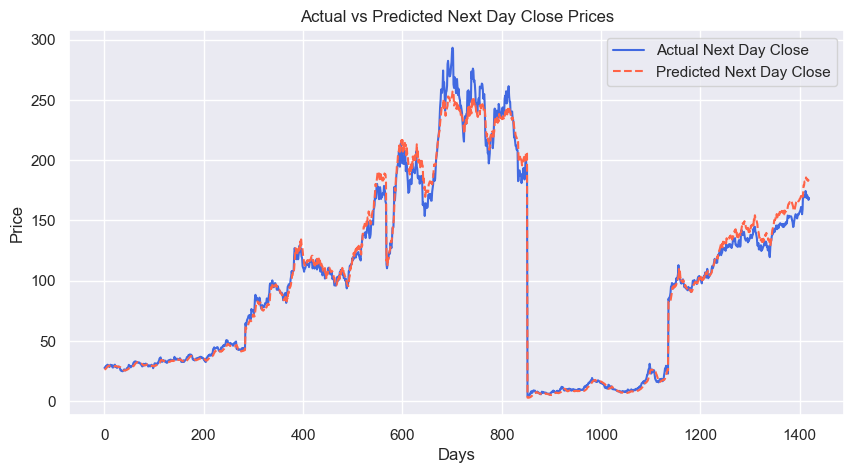

In [97]:
# Plot
sns.set(style="darkgrid")
plt.figure(figsize=(10, 5))  # Set the figure size

plt.plot(flattened_act, label='Actual Next Day Close', color='royalblue', linestyle='-')  # Actual values line
plt.plot(flattened_rnn_pred, label='Predicted Next Day Close', color='tomato', linestyle='--')  # Predicted values line

plt.title('Actual vs Predicted Next Day Close Prices')  # Title of the plot
plt.xlabel('Days')  # X-axis label
plt.ylabel('Price')  # Y-axis label
plt.legend()  # Show legend to differentiate between actual and predicted values

plt.show()

---
## LSTM

In [88]:
# device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the LSTM architecture
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers, output_size=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        # The LSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers, 
                            batch_first=True)
        
        # Fully connected layer that maps the output of the LSTM layer to the desired
        # output size. In this case, it maps to a single value (output size = 1)
        self.fc = nn.Linear(hidden_size, output_size)

    #forward pass
    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

    
# Instantiate the LSTM model 
lstm_model = LSTM(input_size=1, hidden_size=4, num_stacked_layers=2).to(device)

# Instantiate a Loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(lstm_model.parameters(), lr=0.001)


In [89]:
# training loop for LSTM model

num_epochs = 20

for epoch in range(num_epochs):
    # call the helper functions
    train_one_epoch(lstm_model, train_loader, criterion, optimizer)
    validate_one_epoch(lstm_model, test_loader, criterion)

Epoch: 1
Epoch: 001/020 | Batch: 001/706  | Loss: 12.51
Epoch: 001/020 | Batch: 002/706  | Loss: 14.73
Epoch: 001/020 | Batch: 003/706  | Loss: 15.04
Epoch: 001/020 | Batch: 004/706  | Loss: 12.27
Epoch: 001/020 | Batch: 005/706  | Loss: 9.99
Epoch: 001/020 | Batch: 006/706  | Loss: 14.19
Epoch: 001/020 | Batch: 007/706  | Loss: 13.19
Epoch: 001/020 | Batch: 008/706  | Loss: 16.25
Epoch: 001/020 | Batch: 009/706  | Loss: 13.81
Epoch: 001/020 | Batch: 010/706  | Loss: 16.20
Epoch: 001/020 | Batch: 011/706  | Loss: 12.97
Epoch: 001/020 | Batch: 012/706  | Loss: 14.22
Epoch: 001/020 | Batch: 013/706  | Loss: 15.72
Epoch: 001/020 | Batch: 014/706  | Loss: 12.42
Epoch: 001/020 | Batch: 015/706  | Loss: 14.80
Epoch: 001/020 | Batch: 016/706  | Loss: 14.37
Epoch: 001/020 | Batch: 017/706  | Loss: 16.66
Epoch: 001/020 | Batch: 018/706  | Loss: 17.11
Epoch: 001/020 | Batch: 019/706  | Loss: 14.69
Epoch: 001/020 | Batch: 020/706  | Loss: 11.98
Epoch: 001/020 | Batch: 021/706  | Loss: 17.03
Epoch

Epoch: 001/020 | Batch: 195/706  | Loss: 4.71
Epoch: 001/020 | Batch: 196/706  | Loss: 5.76
Epoch: 001/020 | Batch: 197/706  | Loss: 4.08
Epoch: 001/020 | Batch: 198/706  | Loss: 5.72
Epoch: 001/020 | Batch: 199/706  | Loss: 6.38
Epoch: 001/020 | Batch: 200/706  | Loss: 4.64
Epoch: 001/020 | Batch: 201/706  | Loss: 6.40
Epoch: 001/020 | Batch: 202/706  | Loss: 5.54
Epoch: 001/020 | Batch: 203/706  | Loss: 5.19
Epoch: 001/020 | Batch: 204/706  | Loss: 6.04
Epoch: 001/020 | Batch: 205/706  | Loss: 6.51
Epoch: 001/020 | Batch: 206/706  | Loss: 6.41
Epoch: 001/020 | Batch: 207/706  | Loss: 5.70
Epoch: 001/020 | Batch: 208/706  | Loss: 6.56
Epoch: 001/020 | Batch: 209/706  | Loss: 5.64
Epoch: 001/020 | Batch: 210/706  | Loss: 4.71
Epoch: 001/020 | Batch: 211/706  | Loss: 4.30
Epoch: 001/020 | Batch: 212/706  | Loss: 5.45
Epoch: 001/020 | Batch: 213/706  | Loss: 6.03
Epoch: 001/020 | Batch: 214/706  | Loss: 4.92
Epoch: 001/020 | Batch: 215/706  | Loss: 5.03
Epoch: 001/020 | Batch: 216/706  |

Epoch: 001/020 | Batch: 395/706  | Loss: 1.82
Epoch: 001/020 | Batch: 396/706  | Loss: 2.62
Epoch: 001/020 | Batch: 397/706  | Loss: 1.51
Epoch: 001/020 | Batch: 398/706  | Loss: 2.01
Epoch: 001/020 | Batch: 399/706  | Loss: 2.18
Epoch: 001/020 | Batch: 400/706  | Loss: 3.05
Epoch: 001/020 | Batch: 401/706  | Loss: 2.64
Epoch: 001/020 | Batch: 402/706  | Loss: 2.28
Epoch: 001/020 | Batch: 403/706  | Loss: 2.61
Epoch: 001/020 | Batch: 404/706  | Loss: 2.12
Epoch: 001/020 | Batch: 405/706  | Loss: 1.73
Epoch: 001/020 | Batch: 406/706  | Loss: 1.69
Epoch: 001/020 | Batch: 407/706  | Loss: 1.47
Epoch: 001/020 | Batch: 408/706  | Loss: 3.38
Epoch: 001/020 | Batch: 409/706  | Loss: 2.99
Epoch: 001/020 | Batch: 410/706  | Loss: 1.83
Epoch: 001/020 | Batch: 411/706  | Loss: 2.74
Epoch: 001/020 | Batch: 412/706  | Loss: 2.69
Epoch: 001/020 | Batch: 413/706  | Loss: 2.60
Epoch: 001/020 | Batch: 414/706  | Loss: 2.25
Epoch: 001/020 | Batch: 415/706  | Loss: 2.26
Epoch: 001/020 | Batch: 416/706  |

Epoch: 001/020 | Batch: 576/706  | Loss: 2.18
Epoch: 001/020 | Batch: 577/706  | Loss: 2.68
Epoch: 001/020 | Batch: 578/706  | Loss: 1.80
Epoch: 001/020 | Batch: 579/706  | Loss: 1.43
Epoch: 001/020 | Batch: 580/706  | Loss: 1.84
Epoch: 001/020 | Batch: 581/706  | Loss: 1.67
Epoch: 001/020 | Batch: 582/706  | Loss: 1.72
Epoch: 001/020 | Batch: 583/706  | Loss: 2.42
Epoch: 001/020 | Batch: 584/706  | Loss: 1.78
Epoch: 001/020 | Batch: 585/706  | Loss: 0.78
Epoch: 001/020 | Batch: 586/706  | Loss: 1.55
Epoch: 001/020 | Batch: 587/706  | Loss: 1.19
Epoch: 001/020 | Batch: 588/706  | Loss: 1.52
Epoch: 001/020 | Batch: 589/706  | Loss: 1.91
Epoch: 001/020 | Batch: 590/706  | Loss: 1.30
Epoch: 001/020 | Batch: 591/706  | Loss: 1.09
Epoch: 001/020 | Batch: 592/706  | Loss: 1.90
Epoch: 001/020 | Batch: 593/706  | Loss: 1.32
Epoch: 001/020 | Batch: 594/706  | Loss: 1.46
Epoch: 001/020 | Batch: 595/706  | Loss: 1.26
Epoch: 001/020 | Batch: 596/706  | Loss: 1.92
Epoch: 001/020 | Batch: 597/706  |

Epoch: 002/020 | Batch: 068/706  | Loss: 0.97
Epoch: 002/020 | Batch: 069/706  | Loss: 1.14
Epoch: 002/020 | Batch: 070/706  | Loss: 1.81
Epoch: 002/020 | Batch: 071/706  | Loss: 2.01
Epoch: 002/020 | Batch: 072/706  | Loss: 1.75
Epoch: 002/020 | Batch: 073/706  | Loss: 1.09
Epoch: 002/020 | Batch: 074/706  | Loss: 0.80
Epoch: 002/020 | Batch: 075/706  | Loss: 0.62
Epoch: 002/020 | Batch: 076/706  | Loss: 0.59
Epoch: 002/020 | Batch: 077/706  | Loss: 1.82
Epoch: 002/020 | Batch: 078/706  | Loss: 1.35
Epoch: 002/020 | Batch: 079/706  | Loss: 1.38
Epoch: 002/020 | Batch: 080/706  | Loss: 1.78
Epoch: 002/020 | Batch: 081/706  | Loss: 0.96
Epoch: 002/020 | Batch: 082/706  | Loss: 0.93
Epoch: 002/020 | Batch: 083/706  | Loss: 1.09
Epoch: 002/020 | Batch: 084/706  | Loss: 1.19
Epoch: 002/020 | Batch: 085/706  | Loss: 2.04
Epoch: 002/020 | Batch: 086/706  | Loss: 1.39
Epoch: 002/020 | Batch: 087/706  | Loss: 1.58
Epoch: 002/020 | Batch: 088/706  | Loss: 1.61
Epoch: 002/020 | Batch: 089/706  |

Epoch: 002/020 | Batch: 251/706  | Loss: 1.54
Epoch: 002/020 | Batch: 252/706  | Loss: 1.63
Epoch: 002/020 | Batch: 253/706  | Loss: 1.30
Epoch: 002/020 | Batch: 254/706  | Loss: 1.53
Epoch: 002/020 | Batch: 255/706  | Loss: 1.96
Epoch: 002/020 | Batch: 256/706  | Loss: 1.81
Epoch: 002/020 | Batch: 257/706  | Loss: 1.06
Epoch: 002/020 | Batch: 258/706  | Loss: 1.43
Epoch: 002/020 | Batch: 259/706  | Loss: 2.50
Epoch: 002/020 | Batch: 260/706  | Loss: 1.58
Epoch: 002/020 | Batch: 261/706  | Loss: 1.42
Epoch: 002/020 | Batch: 262/706  | Loss: 0.61
Epoch: 002/020 | Batch: 263/706  | Loss: 1.29
Epoch: 002/020 | Batch: 264/706  | Loss: 1.31
Epoch: 002/020 | Batch: 265/706  | Loss: 1.59
Epoch: 002/020 | Batch: 266/706  | Loss: 2.13
Epoch: 002/020 | Batch: 267/706  | Loss: 1.11
Epoch: 002/020 | Batch: 268/706  | Loss: 0.95
Epoch: 002/020 | Batch: 269/706  | Loss: 1.35
Epoch: 002/020 | Batch: 270/706  | Loss: 1.13
Epoch: 002/020 | Batch: 271/706  | Loss: 1.77
Epoch: 002/020 | Batch: 272/706  |

Epoch: 002/020 | Batch: 450/706  | Loss: 1.68
Epoch: 002/020 | Batch: 451/706  | Loss: 0.85
Epoch: 002/020 | Batch: 452/706  | Loss: 1.34
Epoch: 002/020 | Batch: 453/706  | Loss: 1.14
Epoch: 002/020 | Batch: 454/706  | Loss: 0.53
Epoch: 002/020 | Batch: 455/706  | Loss: 1.72
Epoch: 002/020 | Batch: 456/706  | Loss: 1.37
Epoch: 002/020 | Batch: 457/706  | Loss: 1.14
Epoch: 002/020 | Batch: 458/706  | Loss: 2.05
Epoch: 002/020 | Batch: 459/706  | Loss: 1.09
Epoch: 002/020 | Batch: 460/706  | Loss: 1.58
Epoch: 002/020 | Batch: 461/706  | Loss: 1.05
Epoch: 002/020 | Batch: 462/706  | Loss: 2.24
Epoch: 002/020 | Batch: 463/706  | Loss: 1.58
Epoch: 002/020 | Batch: 464/706  | Loss: 2.10
Epoch: 002/020 | Batch: 465/706  | Loss: 1.40
Epoch: 002/020 | Batch: 466/706  | Loss: 1.07
Epoch: 002/020 | Batch: 467/706  | Loss: 0.52
Epoch: 002/020 | Batch: 468/706  | Loss: 1.19
Epoch: 002/020 | Batch: 469/706  | Loss: 1.57
Epoch: 002/020 | Batch: 470/706  | Loss: 0.39
Epoch: 002/020 | Batch: 471/706  |

Epoch: 002/020 | Batch: 643/706  | Loss: 2.19
Epoch: 002/020 | Batch: 644/706  | Loss: 0.86
Epoch: 002/020 | Batch: 645/706  | Loss: 1.16
Epoch: 002/020 | Batch: 646/706  | Loss: 1.05
Epoch: 002/020 | Batch: 647/706  | Loss: 1.43
Epoch: 002/020 | Batch: 648/706  | Loss: 1.22
Epoch: 002/020 | Batch: 649/706  | Loss: 1.25
Epoch: 002/020 | Batch: 650/706  | Loss: 1.61
Epoch: 002/020 | Batch: 651/706  | Loss: 1.45
Epoch: 002/020 | Batch: 652/706  | Loss: 0.99
Epoch: 002/020 | Batch: 653/706  | Loss: 0.30
Epoch: 002/020 | Batch: 654/706  | Loss: 0.43
Epoch: 002/020 | Batch: 655/706  | Loss: 1.91
Epoch: 002/020 | Batch: 656/706  | Loss: 1.46
Epoch: 002/020 | Batch: 657/706  | Loss: 1.02
Epoch: 002/020 | Batch: 658/706  | Loss: 1.23
Epoch: 002/020 | Batch: 659/706  | Loss: 1.67
Epoch: 002/020 | Batch: 660/706  | Loss: 0.77
Epoch: 002/020 | Batch: 661/706  | Loss: 1.68
Epoch: 002/020 | Batch: 662/706  | Loss: 1.68
Epoch: 002/020 | Batch: 663/706  | Loss: 2.25
Epoch: 002/020 | Batch: 664/706  |

Epoch: 003/020 | Batch: 122/706  | Loss: 1.29
Epoch: 003/020 | Batch: 123/706  | Loss: 1.06
Epoch: 003/020 | Batch: 124/706  | Loss: 0.98
Epoch: 003/020 | Batch: 125/706  | Loss: 1.13
Epoch: 003/020 | Batch: 126/706  | Loss: 1.37
Epoch: 003/020 | Batch: 127/706  | Loss: 1.09
Epoch: 003/020 | Batch: 128/706  | Loss: 0.90
Epoch: 003/020 | Batch: 129/706  | Loss: 1.32
Epoch: 003/020 | Batch: 130/706  | Loss: 0.68
Epoch: 003/020 | Batch: 131/706  | Loss: 1.11
Epoch: 003/020 | Batch: 132/706  | Loss: 1.87
Epoch: 003/020 | Batch: 133/706  | Loss: 1.95
Epoch: 003/020 | Batch: 134/706  | Loss: 1.21
Epoch: 003/020 | Batch: 135/706  | Loss: 0.99
Epoch: 003/020 | Batch: 136/706  | Loss: 1.39
Epoch: 003/020 | Batch: 137/706  | Loss: 1.79
Epoch: 003/020 | Batch: 138/706  | Loss: 1.47
Epoch: 003/020 | Batch: 139/706  | Loss: 0.99
Epoch: 003/020 | Batch: 140/706  | Loss: 2.13
Epoch: 003/020 | Batch: 141/706  | Loss: 1.16
Epoch: 003/020 | Batch: 142/706  | Loss: 1.51
Epoch: 003/020 | Batch: 143/706  |

Epoch: 003/020 | Batch: 315/706  | Loss: 1.81
Epoch: 003/020 | Batch: 316/706  | Loss: 1.85
Epoch: 003/020 | Batch: 317/706  | Loss: 1.81
Epoch: 003/020 | Batch: 318/706  | Loss: 1.59
Epoch: 003/020 | Batch: 319/706  | Loss: 2.29
Epoch: 003/020 | Batch: 320/706  | Loss: 0.38
Epoch: 003/020 | Batch: 321/706  | Loss: 1.62
Epoch: 003/020 | Batch: 322/706  | Loss: 1.41
Epoch: 003/020 | Batch: 323/706  | Loss: 0.78
Epoch: 003/020 | Batch: 324/706  | Loss: 1.96
Epoch: 003/020 | Batch: 325/706  | Loss: 1.88
Epoch: 003/020 | Batch: 326/706  | Loss: 0.53
Epoch: 003/020 | Batch: 327/706  | Loss: 0.79
Epoch: 003/020 | Batch: 328/706  | Loss: 1.85
Epoch: 003/020 | Batch: 329/706  | Loss: 1.22
Epoch: 003/020 | Batch: 330/706  | Loss: 1.32
Epoch: 003/020 | Batch: 331/706  | Loss: 1.25
Epoch: 003/020 | Batch: 332/706  | Loss: 2.28
Epoch: 003/020 | Batch: 333/706  | Loss: 1.76
Epoch: 003/020 | Batch: 334/706  | Loss: 1.63
Epoch: 003/020 | Batch: 335/706  | Loss: 1.57
Epoch: 003/020 | Batch: 336/706  |

Epoch: 003/020 | Batch: 512/706  | Loss: 1.32
Epoch: 003/020 | Batch: 513/706  | Loss: 1.24
Epoch: 003/020 | Batch: 514/706  | Loss: 1.65
Epoch: 003/020 | Batch: 515/706  | Loss: 2.00
Epoch: 003/020 | Batch: 516/706  | Loss: 1.69
Epoch: 003/020 | Batch: 517/706  | Loss: 1.27
Epoch: 003/020 | Batch: 518/706  | Loss: 1.39
Epoch: 003/020 | Batch: 519/706  | Loss: 0.93
Epoch: 003/020 | Batch: 520/706  | Loss: 0.91
Epoch: 003/020 | Batch: 521/706  | Loss: 1.99
Epoch: 003/020 | Batch: 522/706  | Loss: 1.67
Epoch: 003/020 | Batch: 523/706  | Loss: 1.13
Epoch: 003/020 | Batch: 524/706  | Loss: 1.48
Epoch: 003/020 | Batch: 525/706  | Loss: 1.02
Epoch: 003/020 | Batch: 526/706  | Loss: 1.92
Epoch: 003/020 | Batch: 527/706  | Loss: 1.37
Epoch: 003/020 | Batch: 528/706  | Loss: 1.44
Epoch: 003/020 | Batch: 529/706  | Loss: 0.72
Epoch: 003/020 | Batch: 530/706  | Loss: 1.37
Epoch: 003/020 | Batch: 531/706  | Loss: 1.17
Epoch: 003/020 | Batch: 532/706  | Loss: 2.16
Epoch: 003/020 | Batch: 533/706  |

Epoch: 003/020 | Batch: 698/706  | Loss: 2.11
Epoch: 003/020 | Batch: 699/706  | Loss: 0.83
Epoch: 003/020 | Batch: 700/706  | Loss: 0.59
Epoch: 003/020 | Batch: 701/706  | Loss: 1.04
Epoch: 003/020 | Batch: 702/706  | Loss: 0.99
Epoch: 003/020 | Batch: 703/706  | Loss: 0.82
Epoch: 003/020 | Batch: 704/706  | Loss: 1.61
Epoch: 003/020 | Batch: 705/706  | Loss: 1.07
Epoch: 003/020 | Batch: 706/706  | Loss: 0.67

Val Loss: 1.654
***************************************************

Epoch: 4
Epoch: 004/020 | Batch: 001/706  | Loss: 1.31
Epoch: 004/020 | Batch: 002/706  | Loss: 1.52
Epoch: 004/020 | Batch: 003/706  | Loss: 1.30
Epoch: 004/020 | Batch: 004/706  | Loss: 1.49
Epoch: 004/020 | Batch: 005/706  | Loss: 0.74
Epoch: 004/020 | Batch: 006/706  | Loss: 1.24
Epoch: 004/020 | Batch: 007/706  | Loss: 1.16
Epoch: 004/020 | Batch: 008/706  | Loss: 1.68
Epoch: 004/020 | Batch: 009/706  | Loss: 1.88
Epoch: 004/020 | Batch: 010/706  | Loss: 0.93
Epoch: 004/020 | Batch: 011/706  | Loss: 0.94
E

Epoch: 004/020 | Batch: 184/706  | Loss: 0.95
Epoch: 004/020 | Batch: 185/706  | Loss: 0.79
Epoch: 004/020 | Batch: 186/706  | Loss: 1.16
Epoch: 004/020 | Batch: 187/706  | Loss: 1.23
Epoch: 004/020 | Batch: 188/706  | Loss: 1.08
Epoch: 004/020 | Batch: 189/706  | Loss: 0.84
Epoch: 004/020 | Batch: 190/706  | Loss: 1.77
Epoch: 004/020 | Batch: 191/706  | Loss: 1.69
Epoch: 004/020 | Batch: 192/706  | Loss: 1.36
Epoch: 004/020 | Batch: 193/706  | Loss: 1.58
Epoch: 004/020 | Batch: 194/706  | Loss: 1.67
Epoch: 004/020 | Batch: 195/706  | Loss: 1.15
Epoch: 004/020 | Batch: 196/706  | Loss: 1.61
Epoch: 004/020 | Batch: 197/706  | Loss: 1.63
Epoch: 004/020 | Batch: 198/706  | Loss: 1.09
Epoch: 004/020 | Batch: 199/706  | Loss: 1.49
Epoch: 004/020 | Batch: 200/706  | Loss: 0.73
Epoch: 004/020 | Batch: 201/706  | Loss: 1.63
Epoch: 004/020 | Batch: 202/706  | Loss: 1.58
Epoch: 004/020 | Batch: 203/706  | Loss: 1.07
Epoch: 004/020 | Batch: 204/706  | Loss: 1.10
Epoch: 004/020 | Batch: 205/706  |

Epoch: 004/020 | Batch: 370/706  | Loss: 1.09
Epoch: 004/020 | Batch: 371/706  | Loss: 0.77
Epoch: 004/020 | Batch: 372/706  | Loss: 1.08
Epoch: 004/020 | Batch: 373/706  | Loss: 0.92
Epoch: 004/020 | Batch: 374/706  | Loss: 1.17
Epoch: 004/020 | Batch: 375/706  | Loss: 0.74
Epoch: 004/020 | Batch: 376/706  | Loss: 0.45
Epoch: 004/020 | Batch: 377/706  | Loss: 0.88
Epoch: 004/020 | Batch: 378/706  | Loss: 1.07
Epoch: 004/020 | Batch: 379/706  | Loss: 1.20
Epoch: 004/020 | Batch: 380/706  | Loss: 1.03
Epoch: 004/020 | Batch: 381/706  | Loss: 1.10
Epoch: 004/020 | Batch: 382/706  | Loss: 1.26
Epoch: 004/020 | Batch: 383/706  | Loss: 0.89
Epoch: 004/020 | Batch: 384/706  | Loss: 1.52
Epoch: 004/020 | Batch: 385/706  | Loss: 1.32
Epoch: 004/020 | Batch: 386/706  | Loss: 1.36
Epoch: 004/020 | Batch: 387/706  | Loss: 1.65
Epoch: 004/020 | Batch: 388/706  | Loss: 0.67
Epoch: 004/020 | Batch: 389/706  | Loss: 2.16
Epoch: 004/020 | Batch: 390/706  | Loss: 1.21
Epoch: 004/020 | Batch: 391/706  |

Epoch: 004/020 | Batch: 562/706  | Loss: 1.30
Epoch: 004/020 | Batch: 563/706  | Loss: 1.54
Epoch: 004/020 | Batch: 564/706  | Loss: 1.99
Epoch: 004/020 | Batch: 565/706  | Loss: 1.33
Epoch: 004/020 | Batch: 566/706  | Loss: 0.42
Epoch: 004/020 | Batch: 567/706  | Loss: 1.29
Epoch: 004/020 | Batch: 568/706  | Loss: 1.50
Epoch: 004/020 | Batch: 569/706  | Loss: 1.43
Epoch: 004/020 | Batch: 570/706  | Loss: 1.42
Epoch: 004/020 | Batch: 571/706  | Loss: 1.46
Epoch: 004/020 | Batch: 572/706  | Loss: 1.54
Epoch: 004/020 | Batch: 573/706  | Loss: 0.78
Epoch: 004/020 | Batch: 574/706  | Loss: 1.06
Epoch: 004/020 | Batch: 575/706  | Loss: 1.83
Epoch: 004/020 | Batch: 576/706  | Loss: 1.56
Epoch: 004/020 | Batch: 577/706  | Loss: 1.34
Epoch: 004/020 | Batch: 578/706  | Loss: 0.96
Epoch: 004/020 | Batch: 579/706  | Loss: 0.61
Epoch: 004/020 | Batch: 580/706  | Loss: 1.68
Epoch: 004/020 | Batch: 581/706  | Loss: 1.24
Epoch: 004/020 | Batch: 582/706  | Loss: 1.25
Epoch: 004/020 | Batch: 583/706  |

Epoch: 005/020 | Batch: 054/706  | Loss: 1.11
Epoch: 005/020 | Batch: 055/706  | Loss: 0.85
Epoch: 005/020 | Batch: 056/706  | Loss: 1.80
Epoch: 005/020 | Batch: 057/706  | Loss: 1.86
Epoch: 005/020 | Batch: 058/706  | Loss: 1.26
Epoch: 005/020 | Batch: 059/706  | Loss: 1.82
Epoch: 005/020 | Batch: 060/706  | Loss: 1.41
Epoch: 005/020 | Batch: 061/706  | Loss: 1.26
Epoch: 005/020 | Batch: 062/706  | Loss: 2.41
Epoch: 005/020 | Batch: 063/706  | Loss: 1.58
Epoch: 005/020 | Batch: 064/706  | Loss: 1.43
Epoch: 005/020 | Batch: 065/706  | Loss: 0.91
Epoch: 005/020 | Batch: 066/706  | Loss: 1.21
Epoch: 005/020 | Batch: 067/706  | Loss: 1.47
Epoch: 005/020 | Batch: 068/706  | Loss: 1.21
Epoch: 005/020 | Batch: 069/706  | Loss: 1.57
Epoch: 005/020 | Batch: 070/706  | Loss: 0.41
Epoch: 005/020 | Batch: 071/706  | Loss: 1.49
Epoch: 005/020 | Batch: 072/706  | Loss: 1.17
Epoch: 005/020 | Batch: 073/706  | Loss: 0.82
Epoch: 005/020 | Batch: 074/706  | Loss: 2.12
Epoch: 005/020 | Batch: 075/706  |

Epoch: 005/020 | Batch: 233/706  | Loss: 0.89
Epoch: 005/020 | Batch: 234/706  | Loss: 1.72
Epoch: 005/020 | Batch: 235/706  | Loss: 1.31
Epoch: 005/020 | Batch: 236/706  | Loss: 1.23
Epoch: 005/020 | Batch: 237/706  | Loss: 1.46
Epoch: 005/020 | Batch: 238/706  | Loss: 1.11
Epoch: 005/020 | Batch: 239/706  | Loss: 1.45
Epoch: 005/020 | Batch: 240/706  | Loss: 1.94
Epoch: 005/020 | Batch: 241/706  | Loss: 1.53
Epoch: 005/020 | Batch: 242/706  | Loss: 1.02
Epoch: 005/020 | Batch: 243/706  | Loss: 1.91
Epoch: 005/020 | Batch: 244/706  | Loss: 1.80
Epoch: 005/020 | Batch: 245/706  | Loss: 1.76
Epoch: 005/020 | Batch: 246/706  | Loss: 0.68
Epoch: 005/020 | Batch: 247/706  | Loss: 1.73
Epoch: 005/020 | Batch: 248/706  | Loss: 0.74
Epoch: 005/020 | Batch: 249/706  | Loss: 1.34
Epoch: 005/020 | Batch: 250/706  | Loss: 1.58
Epoch: 005/020 | Batch: 251/706  | Loss: 1.51
Epoch: 005/020 | Batch: 252/706  | Loss: 1.53
Epoch: 005/020 | Batch: 253/706  | Loss: 1.50
Epoch: 005/020 | Batch: 254/706  |

Epoch: 005/020 | Batch: 443/706  | Loss: 1.85
Epoch: 005/020 | Batch: 444/706  | Loss: 1.73
Epoch: 005/020 | Batch: 445/706  | Loss: 1.64
Epoch: 005/020 | Batch: 446/706  | Loss: 1.47
Epoch: 005/020 | Batch: 447/706  | Loss: 1.22
Epoch: 005/020 | Batch: 448/706  | Loss: 1.82
Epoch: 005/020 | Batch: 449/706  | Loss: 1.11
Epoch: 005/020 | Batch: 450/706  | Loss: 1.60
Epoch: 005/020 | Batch: 451/706  | Loss: 1.46
Epoch: 005/020 | Batch: 452/706  | Loss: 1.46
Epoch: 005/020 | Batch: 453/706  | Loss: 1.77
Epoch: 005/020 | Batch: 454/706  | Loss: 0.66
Epoch: 005/020 | Batch: 455/706  | Loss: 2.12
Epoch: 005/020 | Batch: 456/706  | Loss: 0.80
Epoch: 005/020 | Batch: 457/706  | Loss: 0.93
Epoch: 005/020 | Batch: 458/706  | Loss: 0.72
Epoch: 005/020 | Batch: 459/706  | Loss: 1.33
Epoch: 005/020 | Batch: 460/706  | Loss: 1.34
Epoch: 005/020 | Batch: 461/706  | Loss: 1.69
Epoch: 005/020 | Batch: 462/706  | Loss: 1.01
Epoch: 005/020 | Batch: 463/706  | Loss: 1.42
Epoch: 005/020 | Batch: 464/706  |

Epoch: 005/020 | Batch: 625/706  | Loss: 0.58
Epoch: 005/020 | Batch: 626/706  | Loss: 0.37
Epoch: 005/020 | Batch: 627/706  | Loss: 0.53
Epoch: 005/020 | Batch: 628/706  | Loss: 0.84
Epoch: 005/020 | Batch: 629/706  | Loss: 0.40
Epoch: 005/020 | Batch: 630/706  | Loss: 0.57
Epoch: 005/020 | Batch: 631/706  | Loss: 0.46
Epoch: 005/020 | Batch: 632/706  | Loss: 0.67
Epoch: 005/020 | Batch: 633/706  | Loss: 0.56
Epoch: 005/020 | Batch: 634/706  | Loss: 0.39
Epoch: 005/020 | Batch: 635/706  | Loss: 0.47
Epoch: 005/020 | Batch: 636/706  | Loss: 0.23
Epoch: 005/020 | Batch: 637/706  | Loss: 0.38
Epoch: 005/020 | Batch: 638/706  | Loss: 0.30
Epoch: 005/020 | Batch: 639/706  | Loss: 0.51
Epoch: 005/020 | Batch: 640/706  | Loss: 0.13
Epoch: 005/020 | Batch: 641/706  | Loss: 0.09
Epoch: 005/020 | Batch: 642/706  | Loss: 0.27
Epoch: 005/020 | Batch: 643/706  | Loss: 0.24
Epoch: 005/020 | Batch: 644/706  | Loss: 0.48
Epoch: 005/020 | Batch: 645/706  | Loss: 0.62
Epoch: 005/020 | Batch: 646/706  |

Epoch: 006/020 | Batch: 116/706  | Loss: 0.12
Epoch: 006/020 | Batch: 117/706  | Loss: 0.08
Epoch: 006/020 | Batch: 118/706  | Loss: 0.29
Epoch: 006/020 | Batch: 119/706  | Loss: 0.25
Epoch: 006/020 | Batch: 120/706  | Loss: 0.07
Epoch: 006/020 | Batch: 121/706  | Loss: 0.20
Epoch: 006/020 | Batch: 122/706  | Loss: 0.28
Epoch: 006/020 | Batch: 123/706  | Loss: 0.15
Epoch: 006/020 | Batch: 124/706  | Loss: 0.08
Epoch: 006/020 | Batch: 125/706  | Loss: 0.20
Epoch: 006/020 | Batch: 126/706  | Loss: 0.15
Epoch: 006/020 | Batch: 127/706  | Loss: 0.16
Epoch: 006/020 | Batch: 128/706  | Loss: 0.32
Epoch: 006/020 | Batch: 129/706  | Loss: 0.07
Epoch: 006/020 | Batch: 130/706  | Loss: 0.18
Epoch: 006/020 | Batch: 131/706  | Loss: 0.23
Epoch: 006/020 | Batch: 132/706  | Loss: 0.16
Epoch: 006/020 | Batch: 133/706  | Loss: 0.07
Epoch: 006/020 | Batch: 134/706  | Loss: 0.09
Epoch: 006/020 | Batch: 135/706  | Loss: 0.23
Epoch: 006/020 | Batch: 136/706  | Loss: 0.16
Epoch: 006/020 | Batch: 137/706  |

Epoch: 006/020 | Batch: 301/706  | Loss: 0.05
Epoch: 006/020 | Batch: 302/706  | Loss: 0.24
Epoch: 006/020 | Batch: 303/706  | Loss: 0.09
Epoch: 006/020 | Batch: 304/706  | Loss: 0.03
Epoch: 006/020 | Batch: 305/706  | Loss: 0.04
Epoch: 006/020 | Batch: 306/706  | Loss: 0.04
Epoch: 006/020 | Batch: 307/706  | Loss: 0.19
Epoch: 006/020 | Batch: 308/706  | Loss: 0.11
Epoch: 006/020 | Batch: 309/706  | Loss: 0.04
Epoch: 006/020 | Batch: 310/706  | Loss: 0.02
Epoch: 006/020 | Batch: 311/706  | Loss: 0.06
Epoch: 006/020 | Batch: 312/706  | Loss: 0.05
Epoch: 006/020 | Batch: 313/706  | Loss: 0.09
Epoch: 006/020 | Batch: 314/706  | Loss: 0.07
Epoch: 006/020 | Batch: 315/706  | Loss: 0.03
Epoch: 006/020 | Batch: 316/706  | Loss: 0.17
Epoch: 006/020 | Batch: 317/706  | Loss: 0.26
Epoch: 006/020 | Batch: 318/706  | Loss: 0.06
Epoch: 006/020 | Batch: 319/706  | Loss: 0.08
Epoch: 006/020 | Batch: 320/706  | Loss: 0.09
Epoch: 006/020 | Batch: 321/706  | Loss: 0.13
Epoch: 006/020 | Batch: 322/706  |

Epoch: 006/020 | Batch: 500/706  | Loss: 0.04
Epoch: 006/020 | Batch: 501/706  | Loss: 0.03
Epoch: 006/020 | Batch: 502/706  | Loss: 0.11
Epoch: 006/020 | Batch: 503/706  | Loss: 0.01
Epoch: 006/020 | Batch: 504/706  | Loss: 0.11
Epoch: 006/020 | Batch: 505/706  | Loss: 0.04
Epoch: 006/020 | Batch: 506/706  | Loss: 0.02
Epoch: 006/020 | Batch: 507/706  | Loss: 0.09
Epoch: 006/020 | Batch: 508/706  | Loss: 0.02
Epoch: 006/020 | Batch: 509/706  | Loss: 0.07
Epoch: 006/020 | Batch: 510/706  | Loss: 0.05
Epoch: 006/020 | Batch: 511/706  | Loss: 0.03
Epoch: 006/020 | Batch: 512/706  | Loss: 0.02
Epoch: 006/020 | Batch: 513/706  | Loss: 0.08
Epoch: 006/020 | Batch: 514/706  | Loss: 0.18
Epoch: 006/020 | Batch: 515/706  | Loss: 0.03
Epoch: 006/020 | Batch: 516/706  | Loss: 0.01
Epoch: 006/020 | Batch: 517/706  | Loss: 0.02
Epoch: 006/020 | Batch: 518/706  | Loss: 0.07
Epoch: 006/020 | Batch: 519/706  | Loss: 0.09
Epoch: 006/020 | Batch: 520/706  | Loss: 0.02
Epoch: 006/020 | Batch: 521/706  |

Val Loss: 0.066
***************************************************

Epoch: 7
Epoch: 007/020 | Batch: 001/706  | Loss: 0.06
Epoch: 007/020 | Batch: 002/706  | Loss: 0.01
Epoch: 007/020 | Batch: 003/706  | Loss: 0.05
Epoch: 007/020 | Batch: 004/706  | Loss: 0.01
Epoch: 007/020 | Batch: 005/706  | Loss: 0.02
Epoch: 007/020 | Batch: 006/706  | Loss: 0.02
Epoch: 007/020 | Batch: 007/706  | Loss: 0.03
Epoch: 007/020 | Batch: 008/706  | Loss: 0.01
Epoch: 007/020 | Batch: 009/706  | Loss: 0.07
Epoch: 007/020 | Batch: 010/706  | Loss: 0.06
Epoch: 007/020 | Batch: 011/706  | Loss: 0.02
Epoch: 007/020 | Batch: 012/706  | Loss: 0.01
Epoch: 007/020 | Batch: 013/706  | Loss: 0.02
Epoch: 007/020 | Batch: 014/706  | Loss: 0.11
Epoch: 007/020 | Batch: 015/706  | Loss: 0.09
Epoch: 007/020 | Batch: 016/706  | Loss: 0.02
Epoch: 007/020 | Batch: 017/706  | Loss: 0.10
Epoch: 007/020 | Batch: 018/706  | Loss: 0.01
Epoch: 007/020 | Batch: 019/706  | Loss: 0.06
Epoch: 007/020 | Batch: 020/706  | Loss: 0.01
Ep

Epoch: 007/020 | Batch: 211/706  | Loss: 0.05
Epoch: 007/020 | Batch: 212/706  | Loss: 0.03
Epoch: 007/020 | Batch: 213/706  | Loss: 0.03
Epoch: 007/020 | Batch: 214/706  | Loss: 0.00
Epoch: 007/020 | Batch: 215/706  | Loss: 0.01
Epoch: 007/020 | Batch: 216/706  | Loss: 0.03
Epoch: 007/020 | Batch: 217/706  | Loss: 0.02
Epoch: 007/020 | Batch: 218/706  | Loss: 0.01
Epoch: 007/020 | Batch: 219/706  | Loss: 0.02
Epoch: 007/020 | Batch: 220/706  | Loss: 0.02
Epoch: 007/020 | Batch: 221/706  | Loss: 0.02
Epoch: 007/020 | Batch: 222/706  | Loss: 0.09
Epoch: 007/020 | Batch: 223/706  | Loss: 0.02
Epoch: 007/020 | Batch: 224/706  | Loss: 0.01
Epoch: 007/020 | Batch: 225/706  | Loss: 0.06
Epoch: 007/020 | Batch: 226/706  | Loss: 0.01
Epoch: 007/020 | Batch: 227/706  | Loss: 0.02
Epoch: 007/020 | Batch: 228/706  | Loss: 0.02
Epoch: 007/020 | Batch: 229/706  | Loss: 0.07
Epoch: 007/020 | Batch: 230/706  | Loss: 0.03
Epoch: 007/020 | Batch: 231/706  | Loss: 0.05
Epoch: 007/020 | Batch: 232/706  |

Epoch: 007/020 | Batch: 393/706  | Loss: 0.03
Epoch: 007/020 | Batch: 394/706  | Loss: 0.05
Epoch: 007/020 | Batch: 395/706  | Loss: 0.05
Epoch: 007/020 | Batch: 396/706  | Loss: 0.02
Epoch: 007/020 | Batch: 397/706  | Loss: 0.00
Epoch: 007/020 | Batch: 398/706  | Loss: 0.03
Epoch: 007/020 | Batch: 399/706  | Loss: 0.02
Epoch: 007/020 | Batch: 400/706  | Loss: 0.07
Epoch: 007/020 | Batch: 401/706  | Loss: 0.11
Epoch: 007/020 | Batch: 402/706  | Loss: 0.04
Epoch: 007/020 | Batch: 403/706  | Loss: 0.12
Epoch: 007/020 | Batch: 404/706  | Loss: 0.06
Epoch: 007/020 | Batch: 405/706  | Loss: 0.12
Epoch: 007/020 | Batch: 406/706  | Loss: 0.01
Epoch: 007/020 | Batch: 407/706  | Loss: 0.03
Epoch: 007/020 | Batch: 408/706  | Loss: 0.06
Epoch: 007/020 | Batch: 409/706  | Loss: 0.02
Epoch: 007/020 | Batch: 410/706  | Loss: 0.04
Epoch: 007/020 | Batch: 411/706  | Loss: 0.05
Epoch: 007/020 | Batch: 412/706  | Loss: 0.07
Epoch: 007/020 | Batch: 413/706  | Loss: 0.04
Epoch: 007/020 | Batch: 414/706  |

Epoch: 007/020 | Batch: 607/706  | Loss: 0.00
Epoch: 007/020 | Batch: 608/706  | Loss: 0.01
Epoch: 007/020 | Batch: 609/706  | Loss: 0.01
Epoch: 007/020 | Batch: 610/706  | Loss: 0.00
Epoch: 007/020 | Batch: 611/706  | Loss: 0.00
Epoch: 007/020 | Batch: 612/706  | Loss: 0.01
Epoch: 007/020 | Batch: 613/706  | Loss: 0.01
Epoch: 007/020 | Batch: 614/706  | Loss: 0.18
Epoch: 007/020 | Batch: 615/706  | Loss: 0.02
Epoch: 007/020 | Batch: 616/706  | Loss: 0.01
Epoch: 007/020 | Batch: 617/706  | Loss: 0.03
Epoch: 007/020 | Batch: 618/706  | Loss: 0.07
Epoch: 007/020 | Batch: 619/706  | Loss: 0.02
Epoch: 007/020 | Batch: 620/706  | Loss: 0.06
Epoch: 007/020 | Batch: 621/706  | Loss: 0.01
Epoch: 007/020 | Batch: 622/706  | Loss: 0.02
Epoch: 007/020 | Batch: 623/706  | Loss: 0.02
Epoch: 007/020 | Batch: 624/706  | Loss: 0.02
Epoch: 007/020 | Batch: 625/706  | Loss: 0.02
Epoch: 007/020 | Batch: 626/706  | Loss: 0.05
Epoch: 007/020 | Batch: 627/706  | Loss: 0.29
Epoch: 007/020 | Batch: 628/706  |

Epoch: 008/020 | Batch: 083/706  | Loss: 0.02
Epoch: 008/020 | Batch: 084/706  | Loss: 0.01
Epoch: 008/020 | Batch: 085/706  | Loss: 0.02
Epoch: 008/020 | Batch: 086/706  | Loss: 0.04
Epoch: 008/020 | Batch: 087/706  | Loss: 0.00
Epoch: 008/020 | Batch: 088/706  | Loss: 0.01
Epoch: 008/020 | Batch: 089/706  | Loss: 0.01
Epoch: 008/020 | Batch: 090/706  | Loss: 0.01
Epoch: 008/020 | Batch: 091/706  | Loss: 0.00
Epoch: 008/020 | Batch: 092/706  | Loss: 0.03
Epoch: 008/020 | Batch: 093/706  | Loss: 0.05
Epoch: 008/020 | Batch: 094/706  | Loss: 0.02
Epoch: 008/020 | Batch: 095/706  | Loss: 0.01
Epoch: 008/020 | Batch: 096/706  | Loss: 0.01
Epoch: 008/020 | Batch: 097/706  | Loss: 0.06
Epoch: 008/020 | Batch: 098/706  | Loss: 0.02
Epoch: 008/020 | Batch: 099/706  | Loss: 0.02
Epoch: 008/020 | Batch: 100/706  | Loss: 0.01
Epoch: 008/020 | Batch: 101/706  | Loss: 0.02
Epoch: 008/020 | Batch: 102/706  | Loss: 0.02
Epoch: 008/020 | Batch: 103/706  | Loss: 0.01
Epoch: 008/020 | Batch: 104/706  |

Epoch: 008/020 | Batch: 300/706  | Loss: 0.03
Epoch: 008/020 | Batch: 301/706  | Loss: 0.01
Epoch: 008/020 | Batch: 302/706  | Loss: 0.01
Epoch: 008/020 | Batch: 303/706  | Loss: 0.01
Epoch: 008/020 | Batch: 304/706  | Loss: 0.03
Epoch: 008/020 | Batch: 305/706  | Loss: 0.01
Epoch: 008/020 | Batch: 306/706  | Loss: 0.01
Epoch: 008/020 | Batch: 307/706  | Loss: 0.01
Epoch: 008/020 | Batch: 308/706  | Loss: 0.02
Epoch: 008/020 | Batch: 309/706  | Loss: 0.01
Epoch: 008/020 | Batch: 310/706  | Loss: 0.01
Epoch: 008/020 | Batch: 311/706  | Loss: 0.01
Epoch: 008/020 | Batch: 312/706  | Loss: 0.02
Epoch: 008/020 | Batch: 313/706  | Loss: 0.04
Epoch: 008/020 | Batch: 314/706  | Loss: 0.01
Epoch: 008/020 | Batch: 315/706  | Loss: 0.04
Epoch: 008/020 | Batch: 316/706  | Loss: 0.01
Epoch: 008/020 | Batch: 317/706  | Loss: 0.03
Epoch: 008/020 | Batch: 318/706  | Loss: 0.02
Epoch: 008/020 | Batch: 319/706  | Loss: 0.05
Epoch: 008/020 | Batch: 320/706  | Loss: 0.01
Epoch: 008/020 | Batch: 321/706  |

Epoch: 008/020 | Batch: 516/706  | Loss: 0.02
Epoch: 008/020 | Batch: 517/706  | Loss: 0.03
Epoch: 008/020 | Batch: 518/706  | Loss: 0.01
Epoch: 008/020 | Batch: 519/706  | Loss: 0.00
Epoch: 008/020 | Batch: 520/706  | Loss: 0.00
Epoch: 008/020 | Batch: 521/706  | Loss: 0.03
Epoch: 008/020 | Batch: 522/706  | Loss: 0.02
Epoch: 008/020 | Batch: 523/706  | Loss: 0.14
Epoch: 008/020 | Batch: 524/706  | Loss: 0.03
Epoch: 008/020 | Batch: 525/706  | Loss: 0.03
Epoch: 008/020 | Batch: 526/706  | Loss: 0.01
Epoch: 008/020 | Batch: 527/706  | Loss: 0.01
Epoch: 008/020 | Batch: 528/706  | Loss: 0.01
Epoch: 008/020 | Batch: 529/706  | Loss: 0.01
Epoch: 008/020 | Batch: 530/706  | Loss: 0.00
Epoch: 008/020 | Batch: 531/706  | Loss: 0.09
Epoch: 008/020 | Batch: 532/706  | Loss: 0.01
Epoch: 008/020 | Batch: 533/706  | Loss: 0.01
Epoch: 008/020 | Batch: 534/706  | Loss: 0.04
Epoch: 008/020 | Batch: 535/706  | Loss: 0.01
Epoch: 008/020 | Batch: 536/706  | Loss: 0.00
Epoch: 008/020 | Batch: 537/706  |

Epoch: 008/020 | Batch: 700/706  | Loss: 0.04
Epoch: 008/020 | Batch: 701/706  | Loss: 0.00
Epoch: 008/020 | Batch: 702/706  | Loss: 0.01
Epoch: 008/020 | Batch: 703/706  | Loss: 0.01
Epoch: 008/020 | Batch: 704/706  | Loss: 0.02
Epoch: 008/020 | Batch: 705/706  | Loss: 0.00
Epoch: 008/020 | Batch: 706/706  | Loss: 0.04

Val Loss: 0.012
***************************************************

Epoch: 9
Epoch: 009/020 | Batch: 001/706  | Loss: 0.00
Epoch: 009/020 | Batch: 002/706  | Loss: 0.00
Epoch: 009/020 | Batch: 003/706  | Loss: 0.00
Epoch: 009/020 | Batch: 004/706  | Loss: 0.27
Epoch: 009/020 | Batch: 005/706  | Loss: 0.01
Epoch: 009/020 | Batch: 006/706  | Loss: 0.00
Epoch: 009/020 | Batch: 007/706  | Loss: 0.01
Epoch: 009/020 | Batch: 008/706  | Loss: 0.02
Epoch: 009/020 | Batch: 009/706  | Loss: 0.00
Epoch: 009/020 | Batch: 010/706  | Loss: 0.00
Epoch: 009/020 | Batch: 011/706  | Loss: 0.01
Epoch: 009/020 | Batch: 012/706  | Loss: 0.02
Epoch: 009/020 | Batch: 013/706  | Loss: 0.02
E

Epoch: 009/020 | Batch: 182/706  | Loss: 0.02
Epoch: 009/020 | Batch: 183/706  | Loss: 0.02
Epoch: 009/020 | Batch: 184/706  | Loss: 0.01
Epoch: 009/020 | Batch: 185/706  | Loss: 0.02
Epoch: 009/020 | Batch: 186/706  | Loss: 0.01
Epoch: 009/020 | Batch: 187/706  | Loss: 0.02
Epoch: 009/020 | Batch: 188/706  | Loss: 0.01
Epoch: 009/020 | Batch: 189/706  | Loss: 0.00
Epoch: 009/020 | Batch: 190/706  | Loss: 0.01
Epoch: 009/020 | Batch: 191/706  | Loss: 0.01
Epoch: 009/020 | Batch: 192/706  | Loss: 0.00
Epoch: 009/020 | Batch: 193/706  | Loss: 0.00
Epoch: 009/020 | Batch: 194/706  | Loss: 0.02
Epoch: 009/020 | Batch: 195/706  | Loss: 0.01
Epoch: 009/020 | Batch: 196/706  | Loss: 0.01
Epoch: 009/020 | Batch: 197/706  | Loss: 0.00
Epoch: 009/020 | Batch: 198/706  | Loss: 0.00
Epoch: 009/020 | Batch: 199/706  | Loss: 0.45
Epoch: 009/020 | Batch: 200/706  | Loss: 0.00
Epoch: 009/020 | Batch: 201/706  | Loss: 0.01
Epoch: 009/020 | Batch: 202/706  | Loss: 0.01
Epoch: 009/020 | Batch: 203/706  |

Epoch: 009/020 | Batch: 373/706  | Loss: 0.03
Epoch: 009/020 | Batch: 374/706  | Loss: 0.01
Epoch: 009/020 | Batch: 375/706  | Loss: 0.00
Epoch: 009/020 | Batch: 376/706  | Loss: 0.00
Epoch: 009/020 | Batch: 377/706  | Loss: 0.01
Epoch: 009/020 | Batch: 378/706  | Loss: 0.04
Epoch: 009/020 | Batch: 379/706  | Loss: 0.00
Epoch: 009/020 | Batch: 380/706  | Loss: 0.00
Epoch: 009/020 | Batch: 381/706  | Loss: 0.01
Epoch: 009/020 | Batch: 382/706  | Loss: 0.02
Epoch: 009/020 | Batch: 383/706  | Loss: 0.01
Epoch: 009/020 | Batch: 384/706  | Loss: 0.00
Epoch: 009/020 | Batch: 385/706  | Loss: 0.02
Epoch: 009/020 | Batch: 386/706  | Loss: 0.02
Epoch: 009/020 | Batch: 387/706  | Loss: 0.01
Epoch: 009/020 | Batch: 388/706  | Loss: 0.00
Epoch: 009/020 | Batch: 389/706  | Loss: 0.01
Epoch: 009/020 | Batch: 390/706  | Loss: 0.00
Epoch: 009/020 | Batch: 391/706  | Loss: 0.01
Epoch: 009/020 | Batch: 392/706  | Loss: 0.01
Epoch: 009/020 | Batch: 393/706  | Loss: 0.01
Epoch: 009/020 | Batch: 394/706  |

Epoch: 009/020 | Batch: 571/706  | Loss: 0.01
Epoch: 009/020 | Batch: 572/706  | Loss: 0.00
Epoch: 009/020 | Batch: 573/706  | Loss: 0.02
Epoch: 009/020 | Batch: 574/706  | Loss: 0.01
Epoch: 009/020 | Batch: 575/706  | Loss: 0.01
Epoch: 009/020 | Batch: 576/706  | Loss: 0.01
Epoch: 009/020 | Batch: 577/706  | Loss: 0.01
Epoch: 009/020 | Batch: 578/706  | Loss: 0.00
Epoch: 009/020 | Batch: 579/706  | Loss: 0.00
Epoch: 009/020 | Batch: 580/706  | Loss: 0.01
Epoch: 009/020 | Batch: 581/706  | Loss: 0.01
Epoch: 009/020 | Batch: 582/706  | Loss: 0.02
Epoch: 009/020 | Batch: 583/706  | Loss: 0.00
Epoch: 009/020 | Batch: 584/706  | Loss: 0.00
Epoch: 009/020 | Batch: 585/706  | Loss: 0.02
Epoch: 009/020 | Batch: 586/706  | Loss: 0.01
Epoch: 009/020 | Batch: 587/706  | Loss: 0.02
Epoch: 009/020 | Batch: 588/706  | Loss: 0.01
Epoch: 009/020 | Batch: 589/706  | Loss: 0.01
Epoch: 009/020 | Batch: 590/706  | Loss: 0.40
Epoch: 009/020 | Batch: 591/706  | Loss: 0.01
Epoch: 009/020 | Batch: 592/706  |

Epoch: 010/020 | Batch: 074/706  | Loss: 0.01
Epoch: 010/020 | Batch: 075/706  | Loss: 0.02
Epoch: 010/020 | Batch: 076/706  | Loss: 0.02
Epoch: 010/020 | Batch: 077/706  | Loss: 0.00
Epoch: 010/020 | Batch: 078/706  | Loss: 0.01
Epoch: 010/020 | Batch: 079/706  | Loss: 0.01
Epoch: 010/020 | Batch: 080/706  | Loss: 0.00
Epoch: 010/020 | Batch: 081/706  | Loss: 0.01
Epoch: 010/020 | Batch: 082/706  | Loss: 0.01
Epoch: 010/020 | Batch: 083/706  | Loss: 0.00
Epoch: 010/020 | Batch: 084/706  | Loss: 0.01
Epoch: 010/020 | Batch: 085/706  | Loss: 0.01
Epoch: 010/020 | Batch: 086/706  | Loss: 0.00
Epoch: 010/020 | Batch: 087/706  | Loss: 0.00
Epoch: 010/020 | Batch: 088/706  | Loss: 0.01
Epoch: 010/020 | Batch: 089/706  | Loss: 0.00
Epoch: 010/020 | Batch: 090/706  | Loss: 0.01
Epoch: 010/020 | Batch: 091/706  | Loss: 0.01
Epoch: 010/020 | Batch: 092/706  | Loss: 0.00
Epoch: 010/020 | Batch: 093/706  | Loss: 0.02
Epoch: 010/020 | Batch: 094/706  | Loss: 0.00
Epoch: 010/020 | Batch: 095/706  |

Epoch: 010/020 | Batch: 291/706  | Loss: 0.01
Epoch: 010/020 | Batch: 292/706  | Loss: 0.00
Epoch: 010/020 | Batch: 293/706  | Loss: 0.01
Epoch: 010/020 | Batch: 294/706  | Loss: 0.01
Epoch: 010/020 | Batch: 295/706  | Loss: 0.00
Epoch: 010/020 | Batch: 296/706  | Loss: 0.01
Epoch: 010/020 | Batch: 297/706  | Loss: 0.00
Epoch: 010/020 | Batch: 298/706  | Loss: 0.01
Epoch: 010/020 | Batch: 299/706  | Loss: 0.00
Epoch: 010/020 | Batch: 300/706  | Loss: 0.01
Epoch: 010/020 | Batch: 301/706  | Loss: 0.01
Epoch: 010/020 | Batch: 302/706  | Loss: 0.01
Epoch: 010/020 | Batch: 303/706  | Loss: 0.01
Epoch: 010/020 | Batch: 304/706  | Loss: 0.01
Epoch: 010/020 | Batch: 305/706  | Loss: 0.01
Epoch: 010/020 | Batch: 306/706  | Loss: 0.00
Epoch: 010/020 | Batch: 307/706  | Loss: 0.00
Epoch: 010/020 | Batch: 308/706  | Loss: 0.02
Epoch: 010/020 | Batch: 309/706  | Loss: 0.02
Epoch: 010/020 | Batch: 310/706  | Loss: 0.01
Epoch: 010/020 | Batch: 311/706  | Loss: 0.01
Epoch: 010/020 | Batch: 312/706  |

Epoch: 010/020 | Batch: 491/706  | Loss: 0.02
Epoch: 010/020 | Batch: 492/706  | Loss: 0.01
Epoch: 010/020 | Batch: 493/706  | Loss: 0.01
Epoch: 010/020 | Batch: 494/706  | Loss: 0.02
Epoch: 010/020 | Batch: 495/706  | Loss: 0.01
Epoch: 010/020 | Batch: 496/706  | Loss: 0.02
Epoch: 010/020 | Batch: 497/706  | Loss: 0.00
Epoch: 010/020 | Batch: 498/706  | Loss: 0.01
Epoch: 010/020 | Batch: 499/706  | Loss: 0.01
Epoch: 010/020 | Batch: 500/706  | Loss: 0.01
Epoch: 010/020 | Batch: 501/706  | Loss: 0.00
Epoch: 010/020 | Batch: 502/706  | Loss: 0.01
Epoch: 010/020 | Batch: 503/706  | Loss: 0.05
Epoch: 010/020 | Batch: 504/706  | Loss: 0.02
Epoch: 010/020 | Batch: 505/706  | Loss: 0.02
Epoch: 010/020 | Batch: 506/706  | Loss: 0.03
Epoch: 010/020 | Batch: 507/706  | Loss: 0.05
Epoch: 010/020 | Batch: 508/706  | Loss: 0.04
Epoch: 010/020 | Batch: 509/706  | Loss: 0.07
Epoch: 010/020 | Batch: 510/706  | Loss: 0.01
Epoch: 010/020 | Batch: 511/706  | Loss: 0.01
Epoch: 010/020 | Batch: 512/706  |

Epoch: 010/020 | Batch: 706/706  | Loss: 0.00

Val Loss: 0.007
***************************************************

Epoch: 11
Epoch: 011/020 | Batch: 001/706  | Loss: 0.01
Epoch: 011/020 | Batch: 002/706  | Loss: 0.00
Epoch: 011/020 | Batch: 003/706  | Loss: 0.00
Epoch: 011/020 | Batch: 004/706  | Loss: 0.01
Epoch: 011/020 | Batch: 005/706  | Loss: 0.02
Epoch: 011/020 | Batch: 006/706  | Loss: 0.00
Epoch: 011/020 | Batch: 007/706  | Loss: 0.03
Epoch: 011/020 | Batch: 008/706  | Loss: 0.00
Epoch: 011/020 | Batch: 009/706  | Loss: 0.01
Epoch: 011/020 | Batch: 010/706  | Loss: 0.01
Epoch: 011/020 | Batch: 011/706  | Loss: 0.14
Epoch: 011/020 | Batch: 012/706  | Loss: 0.01
Epoch: 011/020 | Batch: 013/706  | Loss: 0.02
Epoch: 011/020 | Batch: 014/706  | Loss: 0.05
Epoch: 011/020 | Batch: 015/706  | Loss: 0.05
Epoch: 011/020 | Batch: 016/706  | Loss: 0.03
Epoch: 011/020 | Batch: 017/706  | Loss: 0.00
Epoch: 011/020 | Batch: 018/706  | Loss: 0.00
Epoch: 011/020 | Batch: 019/706  | Loss: 0.00


Epoch: 011/020 | Batch: 207/706  | Loss: 0.03
Epoch: 011/020 | Batch: 208/706  | Loss: 0.02
Epoch: 011/020 | Batch: 209/706  | Loss: 0.00
Epoch: 011/020 | Batch: 210/706  | Loss: 0.01
Epoch: 011/020 | Batch: 211/706  | Loss: 0.01
Epoch: 011/020 | Batch: 212/706  | Loss: 0.02
Epoch: 011/020 | Batch: 213/706  | Loss: 0.02
Epoch: 011/020 | Batch: 214/706  | Loss: 0.01
Epoch: 011/020 | Batch: 215/706  | Loss: 0.01
Epoch: 011/020 | Batch: 216/706  | Loss: 0.01
Epoch: 011/020 | Batch: 217/706  | Loss: 0.01
Epoch: 011/020 | Batch: 218/706  | Loss: 0.01
Epoch: 011/020 | Batch: 219/706  | Loss: 0.01
Epoch: 011/020 | Batch: 220/706  | Loss: 0.01
Epoch: 011/020 | Batch: 221/706  | Loss: 0.01
Epoch: 011/020 | Batch: 222/706  | Loss: 0.00
Epoch: 011/020 | Batch: 223/706  | Loss: 0.00
Epoch: 011/020 | Batch: 224/706  | Loss: 0.01
Epoch: 011/020 | Batch: 225/706  | Loss: 0.01
Epoch: 011/020 | Batch: 226/706  | Loss: 0.02
Epoch: 011/020 | Batch: 227/706  | Loss: 0.00
Epoch: 011/020 | Batch: 228/706  |

Epoch: 011/020 | Batch: 388/706  | Loss: 0.01
Epoch: 011/020 | Batch: 389/706  | Loss: 0.00
Epoch: 011/020 | Batch: 390/706  | Loss: 0.00
Epoch: 011/020 | Batch: 391/706  | Loss: 0.03
Epoch: 011/020 | Batch: 392/706  | Loss: 0.00
Epoch: 011/020 | Batch: 393/706  | Loss: 0.01
Epoch: 011/020 | Batch: 394/706  | Loss: 0.01
Epoch: 011/020 | Batch: 395/706  | Loss: 0.01
Epoch: 011/020 | Batch: 396/706  | Loss: 0.00
Epoch: 011/020 | Batch: 397/706  | Loss: 0.01
Epoch: 011/020 | Batch: 398/706  | Loss: 0.01
Epoch: 011/020 | Batch: 399/706  | Loss: 0.02
Epoch: 011/020 | Batch: 400/706  | Loss: 0.02
Epoch: 011/020 | Batch: 401/706  | Loss: 0.01
Epoch: 011/020 | Batch: 402/706  | Loss: 0.00
Epoch: 011/020 | Batch: 403/706  | Loss: 0.00
Epoch: 011/020 | Batch: 404/706  | Loss: 0.01
Epoch: 011/020 | Batch: 405/706  | Loss: 0.02
Epoch: 011/020 | Batch: 406/706  | Loss: 0.01
Epoch: 011/020 | Batch: 407/706  | Loss: 0.53
Epoch: 011/020 | Batch: 408/706  | Loss: 0.02
Epoch: 011/020 | Batch: 409/706  |

Epoch: 011/020 | Batch: 603/706  | Loss: 0.00
Epoch: 011/020 | Batch: 604/706  | Loss: 0.00
Epoch: 011/020 | Batch: 605/706  | Loss: 0.01
Epoch: 011/020 | Batch: 606/706  | Loss: 0.00
Epoch: 011/020 | Batch: 607/706  | Loss: 0.02
Epoch: 011/020 | Batch: 608/706  | Loss: 0.02
Epoch: 011/020 | Batch: 609/706  | Loss: 0.00
Epoch: 011/020 | Batch: 610/706  | Loss: 0.01
Epoch: 011/020 | Batch: 611/706  | Loss: 0.00
Epoch: 011/020 | Batch: 612/706  | Loss: 0.01
Epoch: 011/020 | Batch: 613/706  | Loss: 0.01
Epoch: 011/020 | Batch: 614/706  | Loss: 0.01
Epoch: 011/020 | Batch: 615/706  | Loss: 0.01
Epoch: 011/020 | Batch: 616/706  | Loss: 0.00
Epoch: 011/020 | Batch: 617/706  | Loss: 0.01
Epoch: 011/020 | Batch: 618/706  | Loss: 0.02
Epoch: 011/020 | Batch: 619/706  | Loss: 0.03
Epoch: 011/020 | Batch: 620/706  | Loss: 0.01
Epoch: 011/020 | Batch: 621/706  | Loss: 0.01
Epoch: 011/020 | Batch: 622/706  | Loss: 0.03
Epoch: 011/020 | Batch: 623/706  | Loss: 0.01
Epoch: 011/020 | Batch: 624/706  |

Epoch: 012/020 | Batch: 118/706  | Loss: 0.01
Epoch: 012/020 | Batch: 119/706  | Loss: 0.02
Epoch: 012/020 | Batch: 120/706  | Loss: 0.01
Epoch: 012/020 | Batch: 121/706  | Loss: 0.00
Epoch: 012/020 | Batch: 122/706  | Loss: 0.01
Epoch: 012/020 | Batch: 123/706  | Loss: 0.02
Epoch: 012/020 | Batch: 124/706  | Loss: 0.00
Epoch: 012/020 | Batch: 125/706  | Loss: 0.00
Epoch: 012/020 | Batch: 126/706  | Loss: 0.09
Epoch: 012/020 | Batch: 127/706  | Loss: 0.02
Epoch: 012/020 | Batch: 128/706  | Loss: 0.00
Epoch: 012/020 | Batch: 129/706  | Loss: 0.01
Epoch: 012/020 | Batch: 130/706  | Loss: 0.01
Epoch: 012/020 | Batch: 131/706  | Loss: 0.01
Epoch: 012/020 | Batch: 132/706  | Loss: 0.02
Epoch: 012/020 | Batch: 133/706  | Loss: 0.01
Epoch: 012/020 | Batch: 134/706  | Loss: 0.01
Epoch: 012/020 | Batch: 135/706  | Loss: 0.01
Epoch: 012/020 | Batch: 136/706  | Loss: 0.01
Epoch: 012/020 | Batch: 137/706  | Loss: 0.01
Epoch: 012/020 | Batch: 138/706  | Loss: 0.01
Epoch: 012/020 | Batch: 139/706  |

Epoch: 012/020 | Batch: 303/706  | Loss: 0.00
Epoch: 012/020 | Batch: 304/706  | Loss: 0.01
Epoch: 012/020 | Batch: 305/706  | Loss: 0.01
Epoch: 012/020 | Batch: 306/706  | Loss: 0.00
Epoch: 012/020 | Batch: 307/706  | Loss: 0.01
Epoch: 012/020 | Batch: 308/706  | Loss: 0.02
Epoch: 012/020 | Batch: 309/706  | Loss: 0.00
Epoch: 012/020 | Batch: 310/706  | Loss: 0.00
Epoch: 012/020 | Batch: 311/706  | Loss: 0.01
Epoch: 012/020 | Batch: 312/706  | Loss: 0.01
Epoch: 012/020 | Batch: 313/706  | Loss: 0.01
Epoch: 012/020 | Batch: 314/706  | Loss: 0.01
Epoch: 012/020 | Batch: 315/706  | Loss: 0.00
Epoch: 012/020 | Batch: 316/706  | Loss: 0.01
Epoch: 012/020 | Batch: 317/706  | Loss: 0.00
Epoch: 012/020 | Batch: 318/706  | Loss: 0.01
Epoch: 012/020 | Batch: 319/706  | Loss: 0.00
Epoch: 012/020 | Batch: 320/706  | Loss: 0.01
Epoch: 012/020 | Batch: 321/706  | Loss: 0.00
Epoch: 012/020 | Batch: 322/706  | Loss: 0.00
Epoch: 012/020 | Batch: 323/706  | Loss: 0.02
Epoch: 012/020 | Batch: 324/706  |

Epoch: 012/020 | Batch: 513/706  | Loss: 0.01
Epoch: 012/020 | Batch: 514/706  | Loss: 0.01
Epoch: 012/020 | Batch: 515/706  | Loss: 0.00
Epoch: 012/020 | Batch: 516/706  | Loss: 0.00
Epoch: 012/020 | Batch: 517/706  | Loss: 0.04
Epoch: 012/020 | Batch: 518/706  | Loss: 0.00
Epoch: 012/020 | Batch: 519/706  | Loss: 0.00
Epoch: 012/020 | Batch: 520/706  | Loss: 0.02
Epoch: 012/020 | Batch: 521/706  | Loss: 0.05
Epoch: 012/020 | Batch: 522/706  | Loss: 0.01
Epoch: 012/020 | Batch: 523/706  | Loss: 0.02
Epoch: 012/020 | Batch: 524/706  | Loss: 0.00
Epoch: 012/020 | Batch: 525/706  | Loss: 0.01
Epoch: 012/020 | Batch: 526/706  | Loss: 0.01
Epoch: 012/020 | Batch: 527/706  | Loss: 0.01
Epoch: 012/020 | Batch: 528/706  | Loss: 0.01
Epoch: 012/020 | Batch: 529/706  | Loss: 0.00
Epoch: 012/020 | Batch: 530/706  | Loss: 0.02
Epoch: 012/020 | Batch: 531/706  | Loss: 0.00
Epoch: 012/020 | Batch: 532/706  | Loss: 0.01
Epoch: 012/020 | Batch: 533/706  | Loss: 0.03
Epoch: 012/020 | Batch: 534/706  |

Epoch: 012/020 | Batch: 697/706  | Loss: 0.01
Epoch: 012/020 | Batch: 698/706  | Loss: 0.04
Epoch: 012/020 | Batch: 699/706  | Loss: 0.05
Epoch: 012/020 | Batch: 700/706  | Loss: 0.00
Epoch: 012/020 | Batch: 701/706  | Loss: 0.01
Epoch: 012/020 | Batch: 702/706  | Loss: 0.06
Epoch: 012/020 | Batch: 703/706  | Loss: 0.01
Epoch: 012/020 | Batch: 704/706  | Loss: 0.02
Epoch: 012/020 | Batch: 705/706  | Loss: 0.01
Epoch: 012/020 | Batch: 706/706  | Loss: 0.00

Val Loss: 0.009
***************************************************

Epoch: 13
Epoch: 013/020 | Batch: 001/706  | Loss: 0.01
Epoch: 013/020 | Batch: 002/706  | Loss: 0.02
Epoch: 013/020 | Batch: 003/706  | Loss: 0.01
Epoch: 013/020 | Batch: 004/706  | Loss: 0.00
Epoch: 013/020 | Batch: 005/706  | Loss: 0.01
Epoch: 013/020 | Batch: 006/706  | Loss: 0.00
Epoch: 013/020 | Batch: 007/706  | Loss: 0.00
Epoch: 013/020 | Batch: 008/706  | Loss: 0.00
Epoch: 013/020 | Batch: 009/706  | Loss: 0.01
Epoch: 013/020 | Batch: 010/706  | Loss: 0.00


Epoch: 013/020 | Batch: 177/706  | Loss: 0.00
Epoch: 013/020 | Batch: 178/706  | Loss: 0.00
Epoch: 013/020 | Batch: 179/706  | Loss: 0.09
Epoch: 013/020 | Batch: 180/706  | Loss: 0.01
Epoch: 013/020 | Batch: 181/706  | Loss: 0.01
Epoch: 013/020 | Batch: 182/706  | Loss: 0.01
Epoch: 013/020 | Batch: 183/706  | Loss: 0.00
Epoch: 013/020 | Batch: 184/706  | Loss: 0.01
Epoch: 013/020 | Batch: 185/706  | Loss: 0.01
Epoch: 013/020 | Batch: 186/706  | Loss: 0.00
Epoch: 013/020 | Batch: 187/706  | Loss: 0.02
Epoch: 013/020 | Batch: 188/706  | Loss: 0.01
Epoch: 013/020 | Batch: 189/706  | Loss: 0.01
Epoch: 013/020 | Batch: 190/706  | Loss: 0.00
Epoch: 013/020 | Batch: 191/706  | Loss: 0.00
Epoch: 013/020 | Batch: 192/706  | Loss: 0.02
Epoch: 013/020 | Batch: 193/706  | Loss: 0.00
Epoch: 013/020 | Batch: 194/706  | Loss: 0.02
Epoch: 013/020 | Batch: 195/706  | Loss: 0.01
Epoch: 013/020 | Batch: 196/706  | Loss: 0.01
Epoch: 013/020 | Batch: 197/706  | Loss: 0.01
Epoch: 013/020 | Batch: 198/706  |

Epoch: 013/020 | Batch: 376/706  | Loss: 0.03
Epoch: 013/020 | Batch: 377/706  | Loss: 0.00
Epoch: 013/020 | Batch: 378/706  | Loss: 0.02
Epoch: 013/020 | Batch: 379/706  | Loss: 0.03
Epoch: 013/020 | Batch: 380/706  | Loss: 0.01
Epoch: 013/020 | Batch: 381/706  | Loss: 0.03
Epoch: 013/020 | Batch: 382/706  | Loss: 0.01
Epoch: 013/020 | Batch: 383/706  | Loss: 0.01
Epoch: 013/020 | Batch: 384/706  | Loss: 0.00
Epoch: 013/020 | Batch: 385/706  | Loss: 0.01
Epoch: 013/020 | Batch: 386/706  | Loss: 0.01
Epoch: 013/020 | Batch: 387/706  | Loss: 0.01
Epoch: 013/020 | Batch: 388/706  | Loss: 0.02
Epoch: 013/020 | Batch: 389/706  | Loss: 0.00
Epoch: 013/020 | Batch: 390/706  | Loss: 0.01
Epoch: 013/020 | Batch: 391/706  | Loss: 0.01
Epoch: 013/020 | Batch: 392/706  | Loss: 0.02
Epoch: 013/020 | Batch: 393/706  | Loss: 0.02
Epoch: 013/020 | Batch: 394/706  | Loss: 0.01
Epoch: 013/020 | Batch: 395/706  | Loss: 0.01
Epoch: 013/020 | Batch: 396/706  | Loss: 0.02
Epoch: 013/020 | Batch: 397/706  |

Epoch: 013/020 | Batch: 565/706  | Loss: 0.01
Epoch: 013/020 | Batch: 566/706  | Loss: 0.03
Epoch: 013/020 | Batch: 567/706  | Loss: 0.01
Epoch: 013/020 | Batch: 568/706  | Loss: 0.00
Epoch: 013/020 | Batch: 569/706  | Loss: 0.01
Epoch: 013/020 | Batch: 570/706  | Loss: 0.00
Epoch: 013/020 | Batch: 571/706  | Loss: 0.01
Epoch: 013/020 | Batch: 572/706  | Loss: 0.03
Epoch: 013/020 | Batch: 573/706  | Loss: 0.01
Epoch: 013/020 | Batch: 574/706  | Loss: 0.42
Epoch: 013/020 | Batch: 575/706  | Loss: 0.00
Epoch: 013/020 | Batch: 576/706  | Loss: 0.00
Epoch: 013/020 | Batch: 577/706  | Loss: 0.02
Epoch: 013/020 | Batch: 578/706  | Loss: 0.01
Epoch: 013/020 | Batch: 579/706  | Loss: 0.01
Epoch: 013/020 | Batch: 580/706  | Loss: 0.00
Epoch: 013/020 | Batch: 581/706  | Loss: 0.00
Epoch: 013/020 | Batch: 582/706  | Loss: 0.02
Epoch: 013/020 | Batch: 583/706  | Loss: 0.02
Epoch: 013/020 | Batch: 584/706  | Loss: 0.02
Epoch: 013/020 | Batch: 585/706  | Loss: 0.00
Epoch: 013/020 | Batch: 586/706  |

Epoch: 014/020 | Batch: 061/706  | Loss: 0.01
Epoch: 014/020 | Batch: 062/706  | Loss: 0.01
Epoch: 014/020 | Batch: 063/706  | Loss: 0.02
Epoch: 014/020 | Batch: 064/706  | Loss: 0.03
Epoch: 014/020 | Batch: 065/706  | Loss: 0.01
Epoch: 014/020 | Batch: 066/706  | Loss: 0.01
Epoch: 014/020 | Batch: 067/706  | Loss: 0.01
Epoch: 014/020 | Batch: 068/706  | Loss: 0.00
Epoch: 014/020 | Batch: 069/706  | Loss: 0.00
Epoch: 014/020 | Batch: 070/706  | Loss: 0.00
Epoch: 014/020 | Batch: 071/706  | Loss: 0.02
Epoch: 014/020 | Batch: 072/706  | Loss: 0.01
Epoch: 014/020 | Batch: 073/706  | Loss: 0.01
Epoch: 014/020 | Batch: 074/706  | Loss: 0.03
Epoch: 014/020 | Batch: 075/706  | Loss: 0.01
Epoch: 014/020 | Batch: 076/706  | Loss: 0.00
Epoch: 014/020 | Batch: 077/706  | Loss: 0.01
Epoch: 014/020 | Batch: 078/706  | Loss: 0.01
Epoch: 014/020 | Batch: 079/706  | Loss: 0.01
Epoch: 014/020 | Batch: 080/706  | Loss: 0.01
Epoch: 014/020 | Batch: 081/706  | Loss: 0.00
Epoch: 014/020 | Batch: 082/706  |

Epoch: 014/020 | Batch: 274/706  | Loss: 0.00
Epoch: 014/020 | Batch: 275/706  | Loss: 0.00
Epoch: 014/020 | Batch: 276/706  | Loss: 0.01
Epoch: 014/020 | Batch: 277/706  | Loss: 0.01
Epoch: 014/020 | Batch: 278/706  | Loss: 0.00
Epoch: 014/020 | Batch: 279/706  | Loss: 0.10
Epoch: 014/020 | Batch: 280/706  | Loss: 0.00
Epoch: 014/020 | Batch: 281/706  | Loss: 0.00
Epoch: 014/020 | Batch: 282/706  | Loss: 0.01
Epoch: 014/020 | Batch: 283/706  | Loss: 0.00
Epoch: 014/020 | Batch: 284/706  | Loss: 0.01
Epoch: 014/020 | Batch: 285/706  | Loss: 0.00
Epoch: 014/020 | Batch: 286/706  | Loss: 0.00
Epoch: 014/020 | Batch: 287/706  | Loss: 0.02
Epoch: 014/020 | Batch: 288/706  | Loss: 0.01
Epoch: 014/020 | Batch: 289/706  | Loss: 0.00
Epoch: 014/020 | Batch: 290/706  | Loss: 0.00
Epoch: 014/020 | Batch: 291/706  | Loss: 0.00
Epoch: 014/020 | Batch: 292/706  | Loss: 0.00
Epoch: 014/020 | Batch: 293/706  | Loss: 0.01
Epoch: 014/020 | Batch: 294/706  | Loss: 0.00
Epoch: 014/020 | Batch: 295/706  |

Epoch: 014/020 | Batch: 496/706  | Loss: 0.01
Epoch: 014/020 | Batch: 497/706  | Loss: 0.02
Epoch: 014/020 | Batch: 498/706  | Loss: 0.01
Epoch: 014/020 | Batch: 499/706  | Loss: 0.00
Epoch: 014/020 | Batch: 500/706  | Loss: 0.00
Epoch: 014/020 | Batch: 501/706  | Loss: 0.01
Epoch: 014/020 | Batch: 502/706  | Loss: 0.00
Epoch: 014/020 | Batch: 503/706  | Loss: 0.01
Epoch: 014/020 | Batch: 504/706  | Loss: 0.00
Epoch: 014/020 | Batch: 505/706  | Loss: 0.00
Epoch: 014/020 | Batch: 506/706  | Loss: 0.01
Epoch: 014/020 | Batch: 507/706  | Loss: 0.00
Epoch: 014/020 | Batch: 508/706  | Loss: 0.01
Epoch: 014/020 | Batch: 509/706  | Loss: 0.01
Epoch: 014/020 | Batch: 510/706  | Loss: 0.01
Epoch: 014/020 | Batch: 511/706  | Loss: 0.00
Epoch: 014/020 | Batch: 512/706  | Loss: 0.01
Epoch: 014/020 | Batch: 513/706  | Loss: 0.18
Epoch: 014/020 | Batch: 514/706  | Loss: 0.01
Epoch: 014/020 | Batch: 515/706  | Loss: 0.00
Epoch: 014/020 | Batch: 516/706  | Loss: 0.00
Epoch: 014/020 | Batch: 517/706  |

Epoch: 014/020 | Batch: 700/706  | Loss: 0.01
Epoch: 014/020 | Batch: 701/706  | Loss: 0.01
Epoch: 014/020 | Batch: 702/706  | Loss: 0.01
Epoch: 014/020 | Batch: 703/706  | Loss: 0.01
Epoch: 014/020 | Batch: 704/706  | Loss: 0.00
Epoch: 014/020 | Batch: 705/706  | Loss: 0.00
Epoch: 014/020 | Batch: 706/706  | Loss: 0.02

Val Loss: 0.006
***************************************************

Epoch: 15
Epoch: 015/020 | Batch: 001/706  | Loss: 0.01
Epoch: 015/020 | Batch: 002/706  | Loss: 0.00
Epoch: 015/020 | Batch: 003/706  | Loss: 0.00
Epoch: 015/020 | Batch: 004/706  | Loss: 0.00
Epoch: 015/020 | Batch: 005/706  | Loss: 0.01
Epoch: 015/020 | Batch: 006/706  | Loss: 0.02
Epoch: 015/020 | Batch: 007/706  | Loss: 0.01
Epoch: 015/020 | Batch: 008/706  | Loss: 0.00
Epoch: 015/020 | Batch: 009/706  | Loss: 0.01
Epoch: 015/020 | Batch: 010/706  | Loss: 0.00
Epoch: 015/020 | Batch: 011/706  | Loss: 0.00
Epoch: 015/020 | Batch: 012/706  | Loss: 0.00
Epoch: 015/020 | Batch: 013/706  | Loss: 0.00


Epoch: 015/020 | Batch: 196/706  | Loss: 0.01
Epoch: 015/020 | Batch: 197/706  | Loss: 0.01
Epoch: 015/020 | Batch: 198/706  | Loss: 0.01
Epoch: 015/020 | Batch: 199/706  | Loss: 0.00
Epoch: 015/020 | Batch: 200/706  | Loss: 0.02
Epoch: 015/020 | Batch: 201/706  | Loss: 0.00
Epoch: 015/020 | Batch: 202/706  | Loss: 0.00
Epoch: 015/020 | Batch: 203/706  | Loss: 0.00
Epoch: 015/020 | Batch: 204/706  | Loss: 0.01
Epoch: 015/020 | Batch: 205/706  | Loss: 0.01
Epoch: 015/020 | Batch: 206/706  | Loss: 0.00
Epoch: 015/020 | Batch: 207/706  | Loss: 0.01
Epoch: 015/020 | Batch: 208/706  | Loss: 0.01
Epoch: 015/020 | Batch: 209/706  | Loss: 0.27
Epoch: 015/020 | Batch: 210/706  | Loss: 0.01
Epoch: 015/020 | Batch: 211/706  | Loss: 0.02
Epoch: 015/020 | Batch: 212/706  | Loss: 0.02
Epoch: 015/020 | Batch: 213/706  | Loss: 0.00
Epoch: 015/020 | Batch: 214/706  | Loss: 0.01
Epoch: 015/020 | Batch: 215/706  | Loss: 0.01
Epoch: 015/020 | Batch: 216/706  | Loss: 0.13
Epoch: 015/020 | Batch: 217/706  |

Epoch: 015/020 | Batch: 384/706  | Loss: 0.00
Epoch: 015/020 | Batch: 385/706  | Loss: 0.00
Epoch: 015/020 | Batch: 386/706  | Loss: 0.04
Epoch: 015/020 | Batch: 387/706  | Loss: 0.00
Epoch: 015/020 | Batch: 388/706  | Loss: 0.01
Epoch: 015/020 | Batch: 389/706  | Loss: 0.01
Epoch: 015/020 | Batch: 390/706  | Loss: 0.00
Epoch: 015/020 | Batch: 391/706  | Loss: 0.00
Epoch: 015/020 | Batch: 392/706  | Loss: 0.00
Epoch: 015/020 | Batch: 393/706  | Loss: 0.00
Epoch: 015/020 | Batch: 394/706  | Loss: 0.01
Epoch: 015/020 | Batch: 395/706  | Loss: 0.00
Epoch: 015/020 | Batch: 396/706  | Loss: 0.00
Epoch: 015/020 | Batch: 397/706  | Loss: 0.00
Epoch: 015/020 | Batch: 398/706  | Loss: 0.02
Epoch: 015/020 | Batch: 399/706  | Loss: 0.00
Epoch: 015/020 | Batch: 400/706  | Loss: 0.03
Epoch: 015/020 | Batch: 401/706  | Loss: 0.00
Epoch: 015/020 | Batch: 402/706  | Loss: 0.01
Epoch: 015/020 | Batch: 403/706  | Loss: 0.04
Epoch: 015/020 | Batch: 404/706  | Loss: 0.02
Epoch: 015/020 | Batch: 405/706  |

Epoch: 015/020 | Batch: 601/706  | Loss: 0.00
Epoch: 015/020 | Batch: 602/706  | Loss: 0.00
Epoch: 015/020 | Batch: 603/706  | Loss: 0.01
Epoch: 015/020 | Batch: 604/706  | Loss: 0.01
Epoch: 015/020 | Batch: 605/706  | Loss: 0.01
Epoch: 015/020 | Batch: 606/706  | Loss: 0.00
Epoch: 015/020 | Batch: 607/706  | Loss: 0.00
Epoch: 015/020 | Batch: 608/706  | Loss: 0.01
Epoch: 015/020 | Batch: 609/706  | Loss: 0.01
Epoch: 015/020 | Batch: 610/706  | Loss: 0.01
Epoch: 015/020 | Batch: 611/706  | Loss: 0.01
Epoch: 015/020 | Batch: 612/706  | Loss: 0.01
Epoch: 015/020 | Batch: 613/706  | Loss: 0.01
Epoch: 015/020 | Batch: 614/706  | Loss: 0.02
Epoch: 015/020 | Batch: 615/706  | Loss: 0.01
Epoch: 015/020 | Batch: 616/706  | Loss: 0.00
Epoch: 015/020 | Batch: 617/706  | Loss: 0.00
Epoch: 015/020 | Batch: 618/706  | Loss: 0.00
Epoch: 015/020 | Batch: 619/706  | Loss: 0.01
Epoch: 015/020 | Batch: 620/706  | Loss: 0.01
Epoch: 015/020 | Batch: 621/706  | Loss: 0.00
Epoch: 015/020 | Batch: 622/706  |

Epoch: 016/020 | Batch: 077/706  | Loss: 0.01
Epoch: 016/020 | Batch: 078/706  | Loss: 0.00
Epoch: 016/020 | Batch: 079/706  | Loss: 0.00
Epoch: 016/020 | Batch: 080/706  | Loss: 0.04
Epoch: 016/020 | Batch: 081/706  | Loss: 0.00
Epoch: 016/020 | Batch: 082/706  | Loss: 0.00
Epoch: 016/020 | Batch: 083/706  | Loss: 0.01
Epoch: 016/020 | Batch: 084/706  | Loss: 0.02
Epoch: 016/020 | Batch: 085/706  | Loss: 0.01
Epoch: 016/020 | Batch: 086/706  | Loss: 0.01
Epoch: 016/020 | Batch: 087/706  | Loss: 0.01
Epoch: 016/020 | Batch: 088/706  | Loss: 0.01
Epoch: 016/020 | Batch: 089/706  | Loss: 0.02
Epoch: 016/020 | Batch: 090/706  | Loss: 0.00
Epoch: 016/020 | Batch: 091/706  | Loss: 0.01
Epoch: 016/020 | Batch: 092/706  | Loss: 0.01
Epoch: 016/020 | Batch: 093/706  | Loss: 0.00
Epoch: 016/020 | Batch: 094/706  | Loss: 0.00
Epoch: 016/020 | Batch: 095/706  | Loss: 0.00
Epoch: 016/020 | Batch: 096/706  | Loss: 0.00
Epoch: 016/020 | Batch: 097/706  | Loss: 0.32
Epoch: 016/020 | Batch: 098/706  |

Epoch: 016/020 | Batch: 301/706  | Loss: 0.00
Epoch: 016/020 | Batch: 302/706  | Loss: 0.01
Epoch: 016/020 | Batch: 303/706  | Loss: 0.00
Epoch: 016/020 | Batch: 304/706  | Loss: 0.01
Epoch: 016/020 | Batch: 305/706  | Loss: 0.00
Epoch: 016/020 | Batch: 306/706  | Loss: 0.01
Epoch: 016/020 | Batch: 307/706  | Loss: 0.19
Epoch: 016/020 | Batch: 308/706  | Loss: 0.00
Epoch: 016/020 | Batch: 309/706  | Loss: 0.01
Epoch: 016/020 | Batch: 310/706  | Loss: 0.01
Epoch: 016/020 | Batch: 311/706  | Loss: 0.01
Epoch: 016/020 | Batch: 312/706  | Loss: 0.01
Epoch: 016/020 | Batch: 313/706  | Loss: 0.01
Epoch: 016/020 | Batch: 314/706  | Loss: 0.01
Epoch: 016/020 | Batch: 315/706  | Loss: 0.03
Epoch: 016/020 | Batch: 316/706  | Loss: 0.00
Epoch: 016/020 | Batch: 317/706  | Loss: 0.01
Epoch: 016/020 | Batch: 318/706  | Loss: 0.00
Epoch: 016/020 | Batch: 319/706  | Loss: 0.00
Epoch: 016/020 | Batch: 320/706  | Loss: 0.01
Epoch: 016/020 | Batch: 321/706  | Loss: 0.01
Epoch: 016/020 | Batch: 322/706  |

Epoch: 016/020 | Batch: 488/706  | Loss: 0.01
Epoch: 016/020 | Batch: 489/706  | Loss: 0.01
Epoch: 016/020 | Batch: 490/706  | Loss: 0.01
Epoch: 016/020 | Batch: 491/706  | Loss: 0.00
Epoch: 016/020 | Batch: 492/706  | Loss: 0.01
Epoch: 016/020 | Batch: 493/706  | Loss: 0.01
Epoch: 016/020 | Batch: 494/706  | Loss: 0.01
Epoch: 016/020 | Batch: 495/706  | Loss: 0.01
Epoch: 016/020 | Batch: 496/706  | Loss: 0.01
Epoch: 016/020 | Batch: 497/706  | Loss: 0.00
Epoch: 016/020 | Batch: 498/706  | Loss: 0.00
Epoch: 016/020 | Batch: 499/706  | Loss: 0.00
Epoch: 016/020 | Batch: 500/706  | Loss: 0.00
Epoch: 016/020 | Batch: 501/706  | Loss: 0.01
Epoch: 016/020 | Batch: 502/706  | Loss: 0.01
Epoch: 016/020 | Batch: 503/706  | Loss: 0.01
Epoch: 016/020 | Batch: 504/706  | Loss: 0.00
Epoch: 016/020 | Batch: 505/706  | Loss: 0.01
Epoch: 016/020 | Batch: 506/706  | Loss: 0.01
Epoch: 016/020 | Batch: 507/706  | Loss: 0.00
Epoch: 016/020 | Batch: 508/706  | Loss: 0.00
Epoch: 016/020 | Batch: 509/706  |

Epoch: 016/020 | Batch: 679/706  | Loss: 0.01
Epoch: 016/020 | Batch: 680/706  | Loss: 0.00
Epoch: 016/020 | Batch: 681/706  | Loss: 0.00
Epoch: 016/020 | Batch: 682/706  | Loss: 0.00
Epoch: 016/020 | Batch: 683/706  | Loss: 0.10
Epoch: 016/020 | Batch: 684/706  | Loss: 0.01
Epoch: 016/020 | Batch: 685/706  | Loss: 0.05
Epoch: 016/020 | Batch: 686/706  | Loss: 0.01
Epoch: 016/020 | Batch: 687/706  | Loss: 0.00
Epoch: 016/020 | Batch: 688/706  | Loss: 0.01
Epoch: 016/020 | Batch: 689/706  | Loss: 0.00
Epoch: 016/020 | Batch: 690/706  | Loss: 0.01
Epoch: 016/020 | Batch: 691/706  | Loss: 0.01
Epoch: 016/020 | Batch: 692/706  | Loss: 0.01
Epoch: 016/020 | Batch: 693/706  | Loss: 0.00
Epoch: 016/020 | Batch: 694/706  | Loss: 0.01
Epoch: 016/020 | Batch: 695/706  | Loss: 0.00
Epoch: 016/020 | Batch: 696/706  | Loss: 0.00
Epoch: 016/020 | Batch: 697/706  | Loss: 0.11
Epoch: 016/020 | Batch: 698/706  | Loss: 0.00
Epoch: 016/020 | Batch: 699/706  | Loss: 0.20
Epoch: 016/020 | Batch: 700/706  |

Epoch: 017/020 | Batch: 198/706  | Loss: 0.12
Epoch: 017/020 | Batch: 199/706  | Loss: 0.00
Epoch: 017/020 | Batch: 200/706  | Loss: 0.01
Epoch: 017/020 | Batch: 201/706  | Loss: 0.13
Epoch: 017/020 | Batch: 202/706  | Loss: 0.02
Epoch: 017/020 | Batch: 203/706  | Loss: 0.00
Epoch: 017/020 | Batch: 204/706  | Loss: 0.01
Epoch: 017/020 | Batch: 205/706  | Loss: 0.01
Epoch: 017/020 | Batch: 206/706  | Loss: 0.00
Epoch: 017/020 | Batch: 207/706  | Loss: 0.01
Epoch: 017/020 | Batch: 208/706  | Loss: 0.01
Epoch: 017/020 | Batch: 209/706  | Loss: 0.00
Epoch: 017/020 | Batch: 210/706  | Loss: 0.01
Epoch: 017/020 | Batch: 211/706  | Loss: 0.05
Epoch: 017/020 | Batch: 212/706  | Loss: 0.01
Epoch: 017/020 | Batch: 213/706  | Loss: 0.01
Epoch: 017/020 | Batch: 214/706  | Loss: 0.01
Epoch: 017/020 | Batch: 215/706  | Loss: 0.00
Epoch: 017/020 | Batch: 216/706  | Loss: 0.00
Epoch: 017/020 | Batch: 217/706  | Loss: 0.07
Epoch: 017/020 | Batch: 218/706  | Loss: 0.06
Epoch: 017/020 | Batch: 219/706  |

Epoch: 017/020 | Batch: 387/706  | Loss: 0.01
Epoch: 017/020 | Batch: 388/706  | Loss: 0.01
Epoch: 017/020 | Batch: 389/706  | Loss: 0.29
Epoch: 017/020 | Batch: 390/706  | Loss: 0.00
Epoch: 017/020 | Batch: 391/706  | Loss: 0.00
Epoch: 017/020 | Batch: 392/706  | Loss: 0.00
Epoch: 017/020 | Batch: 393/706  | Loss: 0.00
Epoch: 017/020 | Batch: 394/706  | Loss: 0.01
Epoch: 017/020 | Batch: 395/706  | Loss: 0.01
Epoch: 017/020 | Batch: 396/706  | Loss: 0.01
Epoch: 017/020 | Batch: 397/706  | Loss: 0.02
Epoch: 017/020 | Batch: 398/706  | Loss: 0.00
Epoch: 017/020 | Batch: 399/706  | Loss: 0.01
Epoch: 017/020 | Batch: 400/706  | Loss: 0.00
Epoch: 017/020 | Batch: 401/706  | Loss: 0.01
Epoch: 017/020 | Batch: 402/706  | Loss: 0.00
Epoch: 017/020 | Batch: 403/706  | Loss: 0.02
Epoch: 017/020 | Batch: 404/706  | Loss: 0.01
Epoch: 017/020 | Batch: 405/706  | Loss: 0.00
Epoch: 017/020 | Batch: 406/706  | Loss: 0.01
Epoch: 017/020 | Batch: 407/706  | Loss: 0.01
Epoch: 017/020 | Batch: 408/706  |

Epoch: 017/020 | Batch: 568/706  | Loss: 0.01
Epoch: 017/020 | Batch: 569/706  | Loss: 0.03
Epoch: 017/020 | Batch: 570/706  | Loss: 0.01
Epoch: 017/020 | Batch: 571/706  | Loss: 0.01
Epoch: 017/020 | Batch: 572/706  | Loss: 0.02
Epoch: 017/020 | Batch: 573/706  | Loss: 0.01
Epoch: 017/020 | Batch: 574/706  | Loss: 0.00
Epoch: 017/020 | Batch: 575/706  | Loss: 0.01
Epoch: 017/020 | Batch: 576/706  | Loss: 0.01
Epoch: 017/020 | Batch: 577/706  | Loss: 0.01
Epoch: 017/020 | Batch: 578/706  | Loss: 0.00
Epoch: 017/020 | Batch: 579/706  | Loss: 0.01
Epoch: 017/020 | Batch: 580/706  | Loss: 0.03
Epoch: 017/020 | Batch: 581/706  | Loss: 0.01
Epoch: 017/020 | Batch: 582/706  | Loss: 0.01
Epoch: 017/020 | Batch: 583/706  | Loss: 0.01
Epoch: 017/020 | Batch: 584/706  | Loss: 0.02
Epoch: 017/020 | Batch: 585/706  | Loss: 0.00
Epoch: 017/020 | Batch: 586/706  | Loss: 0.00
Epoch: 017/020 | Batch: 587/706  | Loss: 0.03
Epoch: 017/020 | Batch: 588/706  | Loss: 0.00
Epoch: 017/020 | Batch: 589/706  |

Epoch: 018/020 | Batch: 049/706  | Loss: 0.00
Epoch: 018/020 | Batch: 050/706  | Loss: 0.01
Epoch: 018/020 | Batch: 051/706  | Loss: 0.03
Epoch: 018/020 | Batch: 052/706  | Loss: 0.02
Epoch: 018/020 | Batch: 053/706  | Loss: 0.00
Epoch: 018/020 | Batch: 054/706  | Loss: 0.00
Epoch: 018/020 | Batch: 055/706  | Loss: 0.10
Epoch: 018/020 | Batch: 056/706  | Loss: 0.01
Epoch: 018/020 | Batch: 057/706  | Loss: 0.00
Epoch: 018/020 | Batch: 058/706  | Loss: 0.00
Epoch: 018/020 | Batch: 059/706  | Loss: 0.00
Epoch: 018/020 | Batch: 060/706  | Loss: 0.00
Epoch: 018/020 | Batch: 061/706  | Loss: 0.06
Epoch: 018/020 | Batch: 062/706  | Loss: 0.01
Epoch: 018/020 | Batch: 063/706  | Loss: 0.00
Epoch: 018/020 | Batch: 064/706  | Loss: 0.00
Epoch: 018/020 | Batch: 065/706  | Loss: 0.01
Epoch: 018/020 | Batch: 066/706  | Loss: 0.00
Epoch: 018/020 | Batch: 067/706  | Loss: 0.02
Epoch: 018/020 | Batch: 068/706  | Loss: 0.02
Epoch: 018/020 | Batch: 069/706  | Loss: 0.01
Epoch: 018/020 | Batch: 070/706  |

Epoch: 018/020 | Batch: 242/706  | Loss: 0.00
Epoch: 018/020 | Batch: 243/706  | Loss: 0.00
Epoch: 018/020 | Batch: 244/706  | Loss: 0.19
Epoch: 018/020 | Batch: 245/706  | Loss: 0.00
Epoch: 018/020 | Batch: 246/706  | Loss: 0.00
Epoch: 018/020 | Batch: 247/706  | Loss: 0.01
Epoch: 018/020 | Batch: 248/706  | Loss: 0.01
Epoch: 018/020 | Batch: 249/706  | Loss: 0.02
Epoch: 018/020 | Batch: 250/706  | Loss: 0.01
Epoch: 018/020 | Batch: 251/706  | Loss: 0.01
Epoch: 018/020 | Batch: 252/706  | Loss: 0.01
Epoch: 018/020 | Batch: 253/706  | Loss: 0.00
Epoch: 018/020 | Batch: 254/706  | Loss: 0.25
Epoch: 018/020 | Batch: 255/706  | Loss: 0.01
Epoch: 018/020 | Batch: 256/706  | Loss: 0.03
Epoch: 018/020 | Batch: 257/706  | Loss: 0.01
Epoch: 018/020 | Batch: 258/706  | Loss: 0.01
Epoch: 018/020 | Batch: 259/706  | Loss: 0.01
Epoch: 018/020 | Batch: 260/706  | Loss: 0.01
Epoch: 018/020 | Batch: 261/706  | Loss: 0.01
Epoch: 018/020 | Batch: 262/706  | Loss: 0.02
Epoch: 018/020 | Batch: 263/706  |

Epoch: 018/020 | Batch: 442/706  | Loss: 0.00
Epoch: 018/020 | Batch: 443/706  | Loss: 0.01
Epoch: 018/020 | Batch: 444/706  | Loss: 0.01
Epoch: 018/020 | Batch: 445/706  | Loss: 0.00
Epoch: 018/020 | Batch: 446/706  | Loss: 0.01
Epoch: 018/020 | Batch: 447/706  | Loss: 0.00
Epoch: 018/020 | Batch: 448/706  | Loss: 0.15
Epoch: 018/020 | Batch: 449/706  | Loss: 0.00
Epoch: 018/020 | Batch: 450/706  | Loss: 0.30
Epoch: 018/020 | Batch: 451/706  | Loss: 0.01
Epoch: 018/020 | Batch: 452/706  | Loss: 0.01
Epoch: 018/020 | Batch: 453/706  | Loss: 0.17
Epoch: 018/020 | Batch: 454/706  | Loss: 0.01
Epoch: 018/020 | Batch: 455/706  | Loss: 0.01
Epoch: 018/020 | Batch: 456/706  | Loss: 0.00
Epoch: 018/020 | Batch: 457/706  | Loss: 0.02
Epoch: 018/020 | Batch: 458/706  | Loss: 0.01
Epoch: 018/020 | Batch: 459/706  | Loss: 0.02
Epoch: 018/020 | Batch: 460/706  | Loss: 0.00
Epoch: 018/020 | Batch: 461/706  | Loss: 0.01
Epoch: 018/020 | Batch: 462/706  | Loss: 0.01
Epoch: 018/020 | Batch: 463/706  |

Epoch: 018/020 | Batch: 643/706  | Loss: 0.01
Epoch: 018/020 | Batch: 644/706  | Loss: 0.01
Epoch: 018/020 | Batch: 645/706  | Loss: 0.00
Epoch: 018/020 | Batch: 646/706  | Loss: 0.00
Epoch: 018/020 | Batch: 647/706  | Loss: 0.01
Epoch: 018/020 | Batch: 648/706  | Loss: 0.01
Epoch: 018/020 | Batch: 649/706  | Loss: 0.01
Epoch: 018/020 | Batch: 650/706  | Loss: 0.00
Epoch: 018/020 | Batch: 651/706  | Loss: 0.00
Epoch: 018/020 | Batch: 652/706  | Loss: 0.01
Epoch: 018/020 | Batch: 653/706  | Loss: 0.01
Epoch: 018/020 | Batch: 654/706  | Loss: 0.01
Epoch: 018/020 | Batch: 655/706  | Loss: 0.01
Epoch: 018/020 | Batch: 656/706  | Loss: 0.01
Epoch: 018/020 | Batch: 657/706  | Loss: 0.01
Epoch: 018/020 | Batch: 658/706  | Loss: 0.02
Epoch: 018/020 | Batch: 659/706  | Loss: 0.00
Epoch: 018/020 | Batch: 660/706  | Loss: 0.00
Epoch: 018/020 | Batch: 661/706  | Loss: 0.00
Epoch: 018/020 | Batch: 662/706  | Loss: 0.00
Epoch: 018/020 | Batch: 663/706  | Loss: 0.01
Epoch: 018/020 | Batch: 664/706  |

Epoch: 019/020 | Batch: 115/706  | Loss: 0.00
Epoch: 019/020 | Batch: 116/706  | Loss: 0.00
Epoch: 019/020 | Batch: 117/706  | Loss: 0.02
Epoch: 019/020 | Batch: 118/706  | Loss: 0.01
Epoch: 019/020 | Batch: 119/706  | Loss: 0.01
Epoch: 019/020 | Batch: 120/706  | Loss: 0.01
Epoch: 019/020 | Batch: 121/706  | Loss: 0.01
Epoch: 019/020 | Batch: 122/706  | Loss: 0.01
Epoch: 019/020 | Batch: 123/706  | Loss: 0.01
Epoch: 019/020 | Batch: 124/706  | Loss: 0.00
Epoch: 019/020 | Batch: 125/706  | Loss: 0.00
Epoch: 019/020 | Batch: 126/706  | Loss: 0.02
Epoch: 019/020 | Batch: 127/706  | Loss: 0.00
Epoch: 019/020 | Batch: 128/706  | Loss: 0.26
Epoch: 019/020 | Batch: 129/706  | Loss: 0.00
Epoch: 019/020 | Batch: 130/706  | Loss: 0.00
Epoch: 019/020 | Batch: 131/706  | Loss: 0.06
Epoch: 019/020 | Batch: 132/706  | Loss: 0.00
Epoch: 019/020 | Batch: 133/706  | Loss: 0.00
Epoch: 019/020 | Batch: 134/706  | Loss: 0.00
Epoch: 019/020 | Batch: 135/706  | Loss: 0.01
Epoch: 019/020 | Batch: 136/706  |

Epoch: 019/020 | Batch: 311/706  | Loss: 0.01
Epoch: 019/020 | Batch: 312/706  | Loss: 0.01
Epoch: 019/020 | Batch: 313/706  | Loss: 0.00
Epoch: 019/020 | Batch: 314/706  | Loss: 0.00
Epoch: 019/020 | Batch: 315/706  | Loss: 0.13
Epoch: 019/020 | Batch: 316/706  | Loss: 0.02
Epoch: 019/020 | Batch: 317/706  | Loss: 0.01
Epoch: 019/020 | Batch: 318/706  | Loss: 0.01
Epoch: 019/020 | Batch: 319/706  | Loss: 0.00
Epoch: 019/020 | Batch: 320/706  | Loss: 0.01
Epoch: 019/020 | Batch: 321/706  | Loss: 0.01
Epoch: 019/020 | Batch: 322/706  | Loss: 0.00
Epoch: 019/020 | Batch: 323/706  | Loss: 0.00
Epoch: 019/020 | Batch: 324/706  | Loss: 0.00
Epoch: 019/020 | Batch: 325/706  | Loss: 0.00
Epoch: 019/020 | Batch: 326/706  | Loss: 0.00
Epoch: 019/020 | Batch: 327/706  | Loss: 0.15
Epoch: 019/020 | Batch: 328/706  | Loss: 0.01
Epoch: 019/020 | Batch: 329/706  | Loss: 0.00
Epoch: 019/020 | Batch: 330/706  | Loss: 0.00
Epoch: 019/020 | Batch: 331/706  | Loss: 0.02
Epoch: 019/020 | Batch: 332/706  |

Epoch: 019/020 | Batch: 502/706  | Loss: 0.00
Epoch: 019/020 | Batch: 503/706  | Loss: 0.01
Epoch: 019/020 | Batch: 504/706  | Loss: 0.04
Epoch: 019/020 | Batch: 505/706  | Loss: 0.00
Epoch: 019/020 | Batch: 506/706  | Loss: 0.02
Epoch: 019/020 | Batch: 507/706  | Loss: 0.00
Epoch: 019/020 | Batch: 508/706  | Loss: 0.00
Epoch: 019/020 | Batch: 509/706  | Loss: 0.00
Epoch: 019/020 | Batch: 510/706  | Loss: 0.01
Epoch: 019/020 | Batch: 511/706  | Loss: 0.01
Epoch: 019/020 | Batch: 512/706  | Loss: 0.00
Epoch: 019/020 | Batch: 513/706  | Loss: 0.01
Epoch: 019/020 | Batch: 514/706  | Loss: 0.01
Epoch: 019/020 | Batch: 515/706  | Loss: 0.00
Epoch: 019/020 | Batch: 516/706  | Loss: 0.09
Epoch: 019/020 | Batch: 517/706  | Loss: 0.00
Epoch: 019/020 | Batch: 518/706  | Loss: 0.01
Epoch: 019/020 | Batch: 519/706  | Loss: 0.01
Epoch: 019/020 | Batch: 520/706  | Loss: 0.01
Epoch: 019/020 | Batch: 521/706  | Loss: 0.01
Epoch: 019/020 | Batch: 522/706  | Loss: 0.00
Epoch: 019/020 | Batch: 523/706  |

Val Loss: 0.007
***************************************************

Epoch: 20
Epoch: 020/020 | Batch: 001/706  | Loss: 0.00
Epoch: 020/020 | Batch: 002/706  | Loss: 0.00
Epoch: 020/020 | Batch: 003/706  | Loss: 0.00
Epoch: 020/020 | Batch: 004/706  | Loss: 0.00
Epoch: 020/020 | Batch: 005/706  | Loss: 0.00
Epoch: 020/020 | Batch: 006/706  | Loss: 0.00
Epoch: 020/020 | Batch: 007/706  | Loss: 0.00
Epoch: 020/020 | Batch: 008/706  | Loss: 0.01
Epoch: 020/020 | Batch: 009/706  | Loss: 0.01
Epoch: 020/020 | Batch: 010/706  | Loss: 0.00
Epoch: 020/020 | Batch: 011/706  | Loss: 0.00
Epoch: 020/020 | Batch: 012/706  | Loss: 0.01
Epoch: 020/020 | Batch: 013/706  | Loss: 0.01
Epoch: 020/020 | Batch: 014/706  | Loss: 0.00
Epoch: 020/020 | Batch: 015/706  | Loss: 0.00
Epoch: 020/020 | Batch: 016/706  | Loss: 0.01
Epoch: 020/020 | Batch: 017/706  | Loss: 0.01
Epoch: 020/020 | Batch: 018/706  | Loss: 0.01
Epoch: 020/020 | Batch: 019/706  | Loss: 0.01
Epoch: 020/020 | Batch: 020/706  | Loss: 0.15
E

Epoch: 020/020 | Batch: 185/706  | Loss: 0.00
Epoch: 020/020 | Batch: 186/706  | Loss: 0.00
Epoch: 020/020 | Batch: 187/706  | Loss: 0.00
Epoch: 020/020 | Batch: 188/706  | Loss: 0.00
Epoch: 020/020 | Batch: 189/706  | Loss: 0.02
Epoch: 020/020 | Batch: 190/706  | Loss: 0.01
Epoch: 020/020 | Batch: 191/706  | Loss: 0.00
Epoch: 020/020 | Batch: 192/706  | Loss: 0.01
Epoch: 020/020 | Batch: 193/706  | Loss: 0.02
Epoch: 020/020 | Batch: 194/706  | Loss: 0.01
Epoch: 020/020 | Batch: 195/706  | Loss: 0.01
Epoch: 020/020 | Batch: 196/706  | Loss: 0.00
Epoch: 020/020 | Batch: 197/706  | Loss: 0.00
Epoch: 020/020 | Batch: 198/706  | Loss: 0.02
Epoch: 020/020 | Batch: 199/706  | Loss: 0.00
Epoch: 020/020 | Batch: 200/706  | Loss: 0.00
Epoch: 020/020 | Batch: 201/706  | Loss: 0.03
Epoch: 020/020 | Batch: 202/706  | Loss: 0.00
Epoch: 020/020 | Batch: 203/706  | Loss: 0.00
Epoch: 020/020 | Batch: 204/706  | Loss: 0.01
Epoch: 020/020 | Batch: 205/706  | Loss: 0.02
Epoch: 020/020 | Batch: 206/706  |

Epoch: 020/020 | Batch: 381/706  | Loss: 0.01
Epoch: 020/020 | Batch: 382/706  | Loss: 0.00
Epoch: 020/020 | Batch: 383/706  | Loss: 0.01
Epoch: 020/020 | Batch: 384/706  | Loss: 0.00
Epoch: 020/020 | Batch: 385/706  | Loss: 0.01
Epoch: 020/020 | Batch: 386/706  | Loss: 0.01
Epoch: 020/020 | Batch: 387/706  | Loss: 0.01
Epoch: 020/020 | Batch: 388/706  | Loss: 0.01
Epoch: 020/020 | Batch: 389/706  | Loss: 0.01
Epoch: 020/020 | Batch: 390/706  | Loss: 0.01
Epoch: 020/020 | Batch: 391/706  | Loss: 0.01
Epoch: 020/020 | Batch: 392/706  | Loss: 0.01
Epoch: 020/020 | Batch: 393/706  | Loss: 0.03
Epoch: 020/020 | Batch: 394/706  | Loss: 0.01
Epoch: 020/020 | Batch: 395/706  | Loss: 0.01
Epoch: 020/020 | Batch: 396/706  | Loss: 0.00
Epoch: 020/020 | Batch: 397/706  | Loss: 0.00
Epoch: 020/020 | Batch: 398/706  | Loss: 0.02
Epoch: 020/020 | Batch: 399/706  | Loss: 0.00
Epoch: 020/020 | Batch: 400/706  | Loss: 0.01
Epoch: 020/020 | Batch: 401/706  | Loss: 0.00
Epoch: 020/020 | Batch: 402/706  |

Epoch: 020/020 | Batch: 582/706  | Loss: 0.00
Epoch: 020/020 | Batch: 583/706  | Loss: 0.00
Epoch: 020/020 | Batch: 584/706  | Loss: 0.00
Epoch: 020/020 | Batch: 585/706  | Loss: 0.01
Epoch: 020/020 | Batch: 586/706  | Loss: 0.00
Epoch: 020/020 | Batch: 587/706  | Loss: 0.17
Epoch: 020/020 | Batch: 588/706  | Loss: 0.03
Epoch: 020/020 | Batch: 589/706  | Loss: 0.00
Epoch: 020/020 | Batch: 590/706  | Loss: 0.00
Epoch: 020/020 | Batch: 591/706  | Loss: 0.02
Epoch: 020/020 | Batch: 592/706  | Loss: 0.01
Epoch: 020/020 | Batch: 593/706  | Loss: 0.01
Epoch: 020/020 | Batch: 594/706  | Loss: 0.00
Epoch: 020/020 | Batch: 595/706  | Loss: 0.00
Epoch: 020/020 | Batch: 596/706  | Loss: 0.01
Epoch: 020/020 | Batch: 597/706  | Loss: 0.01
Epoch: 020/020 | Batch: 598/706  | Loss: 0.00
Epoch: 020/020 | Batch: 599/706  | Loss: 0.01
Epoch: 020/020 | Batch: 600/706  | Loss: 0.01
Epoch: 020/020 | Batch: 601/706  | Loss: 0.01
Epoch: 020/020 | Batch: 602/706  | Loss: 0.01
Epoch: 020/020 | Batch: 603/706  |

In [90]:
# Making predictions on the test data with the trained lstm model

lstm_predictions = []
actual_labels = []

lstm_model.eval()

with torch.no_grad():
    for features, labels in test_loader:
        
        outputs = lstm_model(features)
    
        
        lstm_predictions.append(outputs.view(-1).tolist())
        actual_labels.append(labels.view(-1).tolist())
        
        
#flatten the nested lists
flattened_lstm_pred = [item for sublist in lstm_predictions for item in sublist]
flattened_act = [item for sublist in actual_labels for item in sublist]

In [91]:
# Model evaluation

# Convert lists to NumPy arrays and apply inverse of log
flattened_act = np.expm1(np.array(flattened_act))
flattened_lstm_pred = np.expm1(np.array(flattened_lstm_pred))

mae = mean_absolute_error(flattened_act, flattened_lstm_pred)
mse = mean_squared_error(flattened_act, flattened_lstm_pred)
rmse = sqrt(mse)

print(f'Mean absolute error: {mae}')
print(f'Mean squared error: {mse}')
print(f'Root mean squared error: {rmse}')

Mean absolute error: 3.8251129073659094
Mean squared error: 33.23109739373953
Root mean squared error: 5.764642000483597


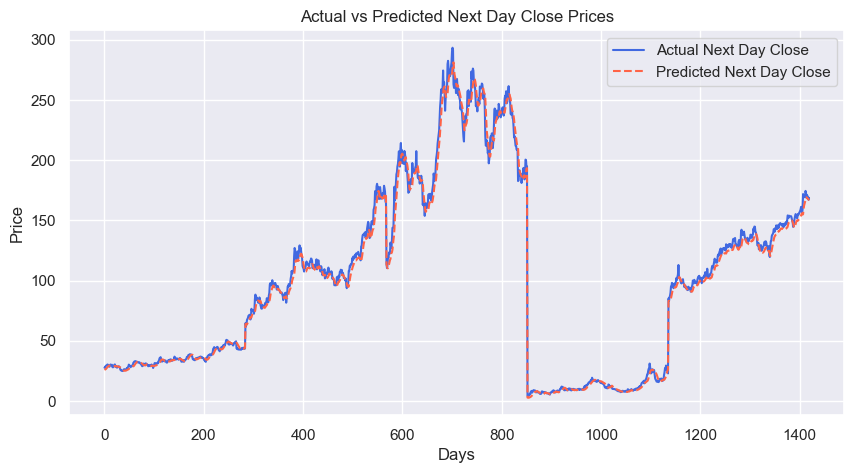

In [92]:
# Plot
sns.set(style="darkgrid")
plt.figure(figsize=(10, 5))  # Set the figure size

plt.plot(flattened_act, label='Actual Next Day Close', color='royalblue', linestyle='-')  # Actual values line
plt.plot(flattened_lstm_pred, label='Predicted Next Day Close', color='tomato', linestyle='--')  # Predicted values line

plt.title('Actual vs Predicted Next Day Close Prices')  # Title of the plot
plt.xlabel('Days')  # X-axis label
plt.ylabel('Price')  # Y-axis label
plt.legend()  # Show legend to differentiate between actual and predicted values

plt.show()

 ---
 ## Model Selection

Now that we've modelled the data with different models and tested the models on an unseen dataset and evaluated each of the models.
Using Mean Absolute Error(MAE) of the models, we will select the best performing model for deployment, so the model with the lowest error will be deployed into a web application for users/investors to make accurate predictions.

In [98]:
# Create a dataframe to compare the MAE of the models
data = {
    'Model': ['LinearReg', 'ANN', 'RNN', 'LSTM'],
    'MAE': [2.65, 5.79, 4.99, 3.83]
}

df = pd.DataFrame(data)
df.set_index('Model', inplace=True)
df



,MAE
Model,
LinearReg,2.65
ANN,5.79
RNN,4.99
LSTM,3.83


Judging from the dataframe above, Linear Regression is the best performing model. So, we will be deploying our Linear Regression model.

---

In [87]:
# Serialize and save the model

import joblib

stock_pred = {
    'model': lr_model,
    'preprocessing': preprocessor,
    'numeric_cols': num_cols,
    'categorical_cols': cat_cols,
}

#save this to a file using joblib.dump
joblib.dump(stock_pred, 'stock_price_prediction.joblib')

['stock_price_prediction.joblib']

---
## Application Development and Interface Design

We will be using VSCODE for this !!!